In [397]:
import numpy as np
import pandas as pd
#from fractions import Fraction
from scipy.stats import entropy
#from typing import List, Dict, Optional
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

## 1. Importation of Symbolic Musical Features

In [398]:
df = pd.read_parquet("datasets/midi_features.parquet")

In [399]:
df.head()

,onset,duration,polyphony_notes,polyphony_voices,key,local_key,time_signature,other_time_signatures,tempo,other_tempi,measure,beat_position,beat_fraction,metric_weight,articulation_ratio,instrument,instrument_family,track,pitch,pitch_class,pitch_octave,interval_to_prev,is_chord_tone,velocity,is_rest,genre,filename
0,0.0,4.0,0,0,3,3,4/4,"[{'bar_duration': 4.0, 'numerator': 4.0, 'offs...",120.0,"[[0.0, 120.0], [0.0, 120.0], [0.0, 120.0], [0....",1,1.0,0.25,1.0,1.0,Sampler,Electronic,I AM CANADIAN!,-1,-1,-1,0,0,-1,1,pop,Come On Over (All I Want Is You).mid
1,0.0,4.0,0,0,3,3,4/4,"[{'bar_duration': 4.0, 'numerator': 4.0, 'offs...",120.0,"[[0.0, 120.0], [0.0, 120.0], [0.0, 120.0], [0....",1,1.0,0.25,1.0,1.0,Sampler,Electronic,I AM CANADIAN!,-1,-1,-1,0,0,-1,1,pop,Come On Over (All I Want Is You).mid
2,0.0,4.0,0,0,3,3,4/4,"[{'bar_duration': 4.0, 'numerator': 4.0, 'offs...",120.0,"[[0.0, 120.0], [0.0, 120.0], [0.0, 120.0], [0....",1,1.0,0.25,1.0,1.0,Sampler,Electronic,I AM CANADIAN!,-1,-1,-1,0,0,-1,1,pop,Come On Over (All I Want Is You).mid
3,0.0,4.0,0,0,3,3,4/4,"[{'bar_duration': 4.0, 'numerator': 4.0, 'offs...",120.0,"[[0.0, 120.0], [0.0, 120.0], [0.0, 120.0], [0....",1,1.0,0.25,1.0,1.0,Sampler,Electronic,I AM CANADIAN!,-1,-1,-1,0,0,-1,1,pop,Come On Over (All I Want Is You).mid
4,0.0,4.0,0,0,3,3,4/4,"[{'bar_duration': 4.0, 'numerator': 4.0, 'offs...",120.0,"[[0.0, 120.0], [0.0, 120.0], [0.0, 120.0], [0....",1,1.0,0.25,1.0,1.0,Sampler,Electronic,I AM CANADIAN!,-1,-1,-1,0,0,-1,1,pop,Come On Over (All I Want Is You).mid


## 2. Exploratory Analysis of Symbolic Musical Features

Here a preliminary audit of the extracted MIDI features is performed to ensure structural integrity, identify potential anomalies, and confirm the plausibility of musical attributes such as pitch, duration, key, and instrumentation.

### 2.1 Global Characterization of the Symbolic Dataset

In [400]:
# Check for missing values
df.isnull().sum()

onset                    0
duration                 0
polyphony_notes          0
polyphony_voices         0
key                      0
local_key                0
time_signature           0
other_time_signatures    0
tempo                    0
other_tempi              0
measure                  0
beat_position            0
beat_fraction            0
metric_weight            0
articulation_ratio       0
instrument               0
instrument_family        0
track                    0
pitch                    0
pitch_class              0
pitch_octave             0
interval_to_prev         0
is_chord_tone            0
velocity                 0
is_rest                  0
genre                    0
filename                 0
dtype: int64

In [401]:
# Summary statistics for numerical columns
df.describe()

,onset,duration,polyphony_notes,polyphony_voices,key,local_key,tempo,measure,beat_position,beat_fraction,metric_weight,articulation_ratio,pitch,pitch_class,pitch_octave,interval_to_prev,is_chord_tone,velocity,is_rest
count,638779.000000,638779.000000,638779.000000,638779.000000,638779.000000,638779.000000,638779.000000,638779.000000,638779.000000,638779.000000,638779.000000,638779.000000,638779.000000,638779.000000,638779.000000,638779.000000,638779.000000,638779.000000,638779.000000
mean,267.892058,0.823764,4.852448,2.331260,10.839801,9.655823,115.721148,66.220006,2.600293,0.670487,0.609829,1.008396,39.148573,3.356644,2.403960,9.928548,0.374814,61.268022,0.327000
std,192.286239,1.044919,4.344254,1.638925,7.456399,6.971896,23.444394,45.762462,1.240996,0.316891,0.313863,0.154900,30.085538,4.137733,2.621926,12.356673,0.484075,47.032506,0.469118
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,1.000000,1.000000,0.166667,0.200000,0.100000,-1.000000,-1.000000,-1.000000,0.000000,0.000000,-1.000000,0.000000
25%,122.500000,0.250000,1.000000,1.000000,5.000000,4.000000,98.000000,31.000000,1.500000,0.375000,0.400000,1.000000,-1.000000,-1.000000,-1.000000,0.000000,0.000000,-1.000000,0.000000
50%,234.000000,0.500000,4.000000,2.000000,9.000000,8.000000,120.000000,59.000000,2.500000,0.666667,0.600000,1.000000,51.000000,2.000000,3.000000,5.000000,0.000000,79.000000,0.000000
75%,364.750000,0.750000,7.000000,3.000000,18.000000,16.000000,126.000000,91.000000,3.750000,0.937500,1.000000,1.000000,64.000000,7.000000,5.000000,17.000000,1.000000,100.000000,1.000000
max,1330.583333,55.000000,43.000000,12.000000,23.000000,23.000000,194.000000,274.000000,4.944444,1.750000,1.000000,2.000000,108.000000,11.000000,9.000000,72.000000,1.000000,127.000000,1.000000


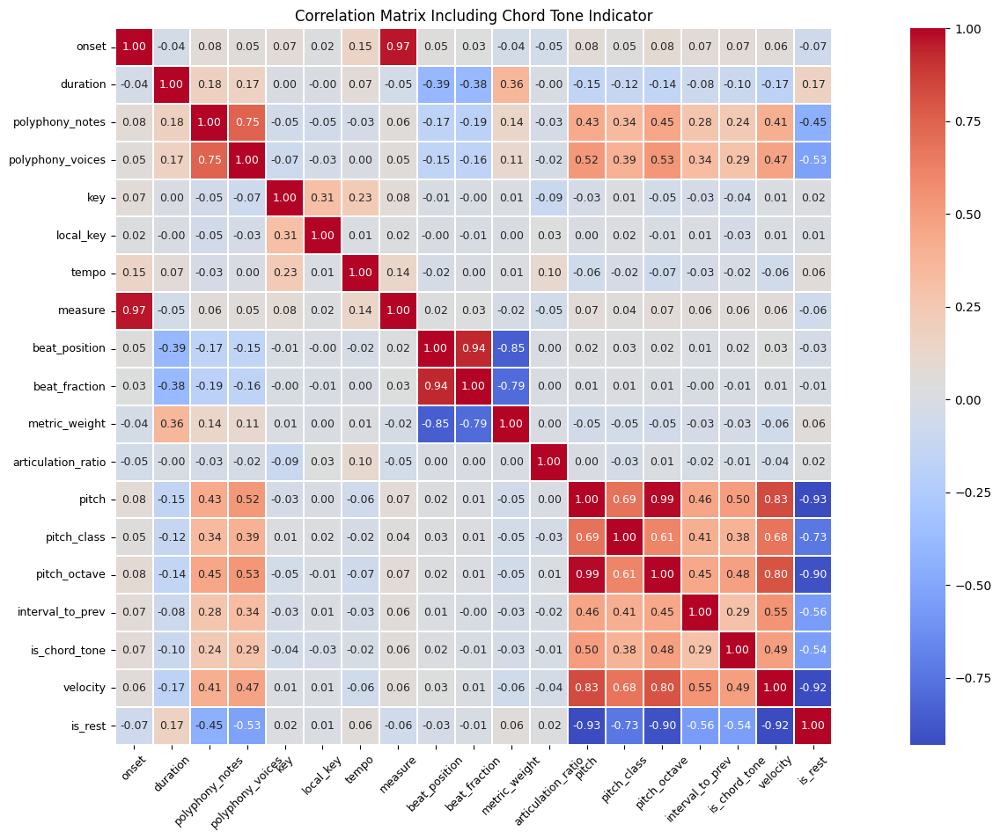

In [402]:
# Compute correlation with other numeric features
numerical_cols = df.select_dtypes(include='number').columns
correlation_matrix = df[numerical_cols].corr()

# Plot
plt.figure(figsize=(18, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.2, square=True, annot_kws={"size": 9})
plt.title("Correlation Matrix Including Chord Tone Indicator")
plt.tight_layout()
plt.xticks(rotation=45, fontsize=9)
plt.yticks(fontsize=9)
plt.show()

### 2.2 Feature-wise Distributional Analysis and Outlier Detection

#### 2.2.1 Pitch

##### 2.2.1.1 Central Tendency and Spread of Pitch Values

In [403]:
# Descriptive stats: proportion and spread of pitch values
df['pitch'].describe()

count    638779.000000
mean         39.148573
std          30.085538
min          -1.000000
25%          -1.000000
50%          51.000000
75%          64.000000
max         108.000000
Name: pitch, dtype: float64

In [404]:
# Exclude rests from analysis
df_notes_only = df[(df['is_rest'] == 0) & (df['pitch'] >= 0)].copy()

In [405]:
df_notes_only['pitch'].describe()

count    429898.000000
mean         58.656163
std          13.460451
min           0.000000
25%          50.000000
50%          60.000000
75%          67.000000
max         108.000000
Name: pitch, dtype: float64

In [406]:
# Central tendency
mean_pitch = df_notes_only['pitch'].mean()
median_pitch = df_notes_only['pitch'].median()
mode_pitch = df_notes_only['pitch'].mode()[0]

# Spread
std_pitch = df_notes_only['pitch'].std()

# Display results
print(f"Mean pitch: {mean_pitch:.1f}")
print(f"Median pitch: {median_pitch:.1f}")
print(f"Mode pitch: {mode_pitch:.1f}")
print(f"Standard deviation: {std_pitch:.1f}")

Mean pitch: 58.7
Median pitch: 60.0
Mode pitch: 62.0
Standard deviation: 13.5


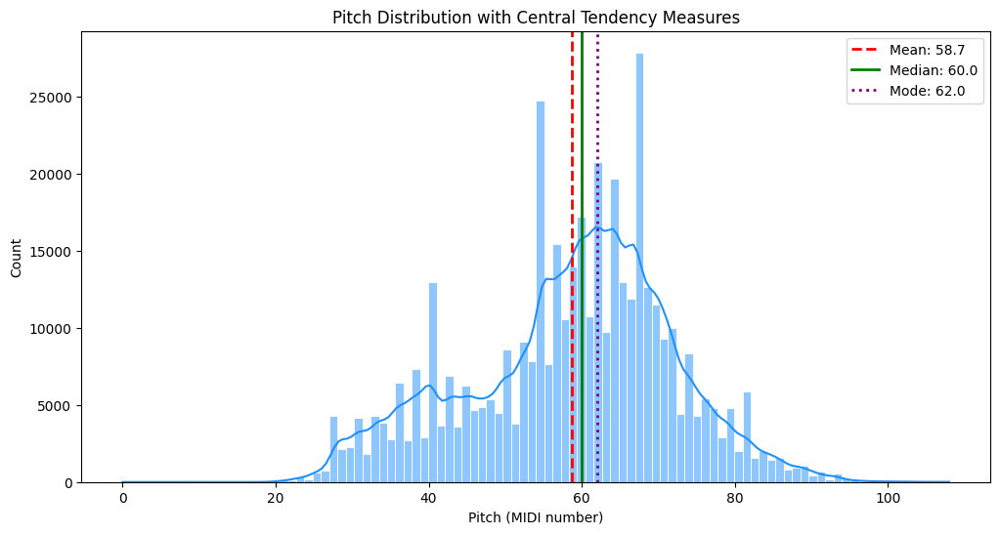

In [407]:
plt.figure(figsize=(12, 6))
sns.histplot(df_notes_only['pitch'], bins=100, kde=True, color='dodgerblue', edgecolor='white')

# Add lines for mean, median, and mode
plt.axvline(mean_pitch, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_pitch:.1f}')
plt.axvline(median_pitch, color='green', linestyle='-', linewidth=2, label=f'Median: {median_pitch:.1f}')
plt.axvline(mode_pitch, color='purple', linestyle=':', linewidth=2, label=f'Mode: {mode_pitch:.1f}')

plt.title('Pitch Distribution with Central Tendency Measures')
plt.xlabel('Pitch (MIDI number)')
plt.ylabel('Count')
plt.legend()
plt.show()

##### 2.2.1.2 Outlier Detection in Pitch Values

In [408]:
# Confirm all values are within the valid MIDI range
valid_range = df_notes_only['pitch'].between(0, 127)
invalid_pitches = df_notes_only[~valid_range]

print(f"Number of invalid pitch values: {len(invalid_pitches)}")

# Count how many values are at the extreme edges
low_extremes = df_notes_only[df_notes_only['pitch'] <= 20]
high_extremes = df_notes_only[df_notes_only['pitch'] >= 110]

print(f"Pitches ≤ 20: {len(low_extremes)}")
print(f"Pitches ≥ 110: {len(high_extremes)}")

Number of invalid pitch values: 0
Pitches ≤ 20: 22
Pitches ≥ 110: 0


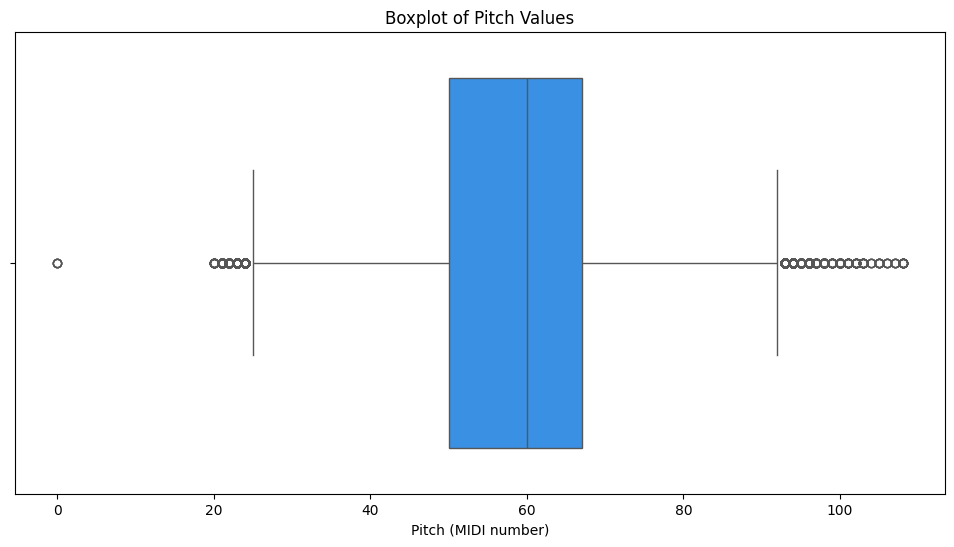

In [409]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_notes_only, x='pitch', color='dodgerblue')
plt.title('Boxplot of Pitch Values')
plt.xlabel('Pitch (MIDI number)')
plt.show()

##### 2.2.1.3 Distribution of Pitch Values over Time

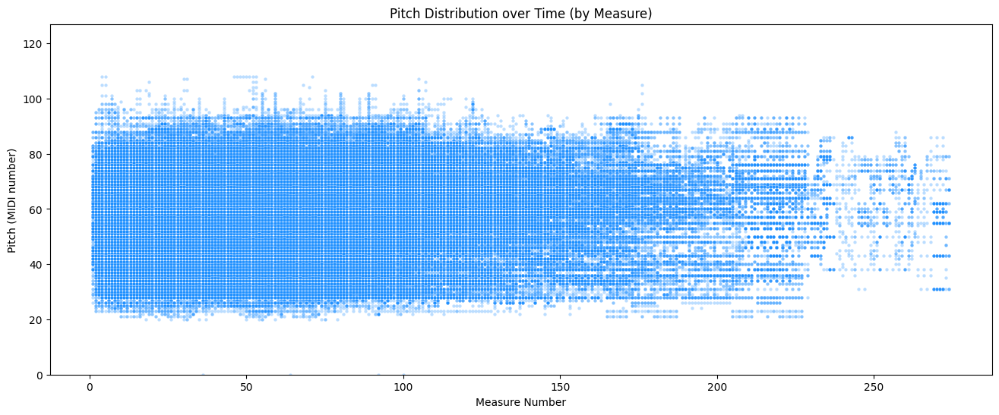

In [410]:
# Confirm global temporal coherence and get visual summary of pitch activity density across the piece's duration

plt.figure(figsize=(16, 6))
sns.scatterplot(data=df_notes_only, x='measure', y='pitch',alpha=0.3, s=10, color='dodgerblue')
plt.title('Pitch Distribution over Time (by Measure)')
plt.xlabel('Measure Number')
plt.ylabel('Pitch (MIDI number)')
plt.ylim(0, 127)
plt.show()

##### 2.2.1.4 Pitch Values in Context: Key, Instrument, and Genre

In [411]:
# Descriptive statistics of pitch values by key
print("Pitch statistics by Key:")
df_notes_only.groupby('key')['pitch'].describe().sort_index()

Pitch statistics by Key:


,count,mean,std,min,25%,50%,75%,max
key,,,,,,,,
0,37542.0,59.368414,13.120191,24.0,53.00,62.0,67.0,108.0
1,11542.0,61.135332,12.069071,25.0,56.00,61.0,68.0,100.0
2,28424.0,57.407930,13.832375,26.0,48.00,61.0,66.0,98.0
3,19869.0,58.618250,13.145749,22.0,46.00,62.0,70.0,94.0
4,8342.0,58.351834,12.740690,23.0,52.00,61.0,68.0,103.0
5,43881.0,61.490827,13.459361,24.0,55.00,63.0,71.0,100.0
6,7158.0,59.972059,14.531856,20.0,55.00,61.0,68.0,94.0
7,38145.0,59.707327,12.038329,26.0,54.00,62.0,67.0,98.0
8,2710.0,60.544280,11.050042,27.0,56.00,61.0,68.0,87.0


In [412]:
# Display pitch distribution across keys, sorted alphabetically by musical key name

# Define mapping from numeric key to musical key name
key_mapping = {
    0: "C", 1: "C#/Db", 2: "D", 3: "D#/Eb", 4: "E", 5: "F", 6: "F#/Gb",
    7: "G", 8: "G#/Ab", 9: "A", 10: "A#/Bb", 11: "B",
    12: "Cm", 13: "C#m/Dbm", 14: "Dm", 15: "D#m/Ebm", 16: "Em", 17: "Fm", 18: "F#m/Gbm",
    19: "Gm", 20: "G#m/Abm", 21: "Am", 22: "A#m/Bbm", 23: "Bm"
}

# Add key names
df['key_name'] = df['key'].map(key_mapping)
df_notes_only['key_name'] = df_notes_only['key'].map(key_mapping)

# Sort keys alphabetically by their musical name
ordered_key_names = sorted(df_notes_only['key_name'].unique())

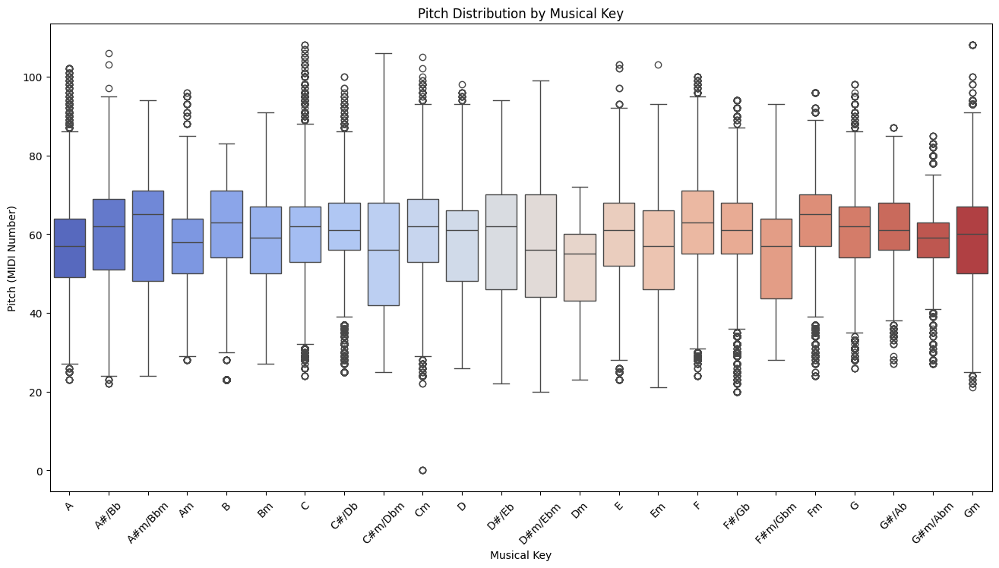

In [413]:
# Plot
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='key_name', y='pitch', order=ordered_key_names, palette='coolwarm')
plt.title('Pitch Distribution by Musical Key')
plt.xticks(rotation=45)
plt.xlabel('Musical Key')
plt.ylabel('Pitch (MIDI Number)')
plt.show()

In [414]:
# Descriptive statistics of pitch values by instrument
print("Pitch statistics by Instrument:")
df_notes_only.groupby('instrument')['pitch'].describe()

Pitch statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Acoustic Guitar,31060.0,58.762170,15.163369,21.0,48.00,63.0,70.0,100.0
Alto Saxophone,505.0,52.643564,17.578500,28.0,33.00,63.0,67.0,81.0
Bagpipes,4865.0,61.319219,13.356028,25.0,56.00,65.0,70.0,85.0
Banjo,872.0,61.495413,11.835845,37.0,61.00,67.0,71.0,71.0
Baritone Saxophone,1618.0,56.799135,11.051622,33.0,48.00,59.0,64.0,85.0
Bassoon,1729.0,62.702718,12.618631,31.0,50.00,67.0,72.0,83.0
Brass,2936.0,63.085150,15.068664,24.0,50.00,66.0,73.0,96.0
Choir,3971.0,64.112314,11.039840,26.0,61.00,66.0,69.0,93.0
Clarinet,998.0,59.876754,15.863189,25.0,49.00,68.0,68.0,103.0


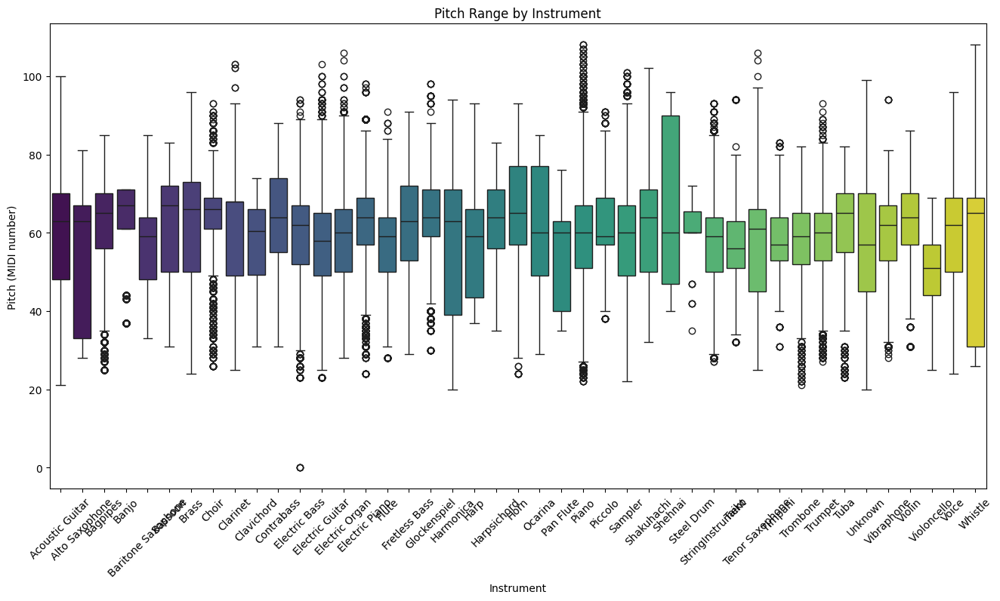

In [415]:
alphabetic_order = sorted(df_notes_only['instrument'].unique())

plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='instrument', y='pitch', palette='viridis', order=alphabetic_order)
plt.xticks(rotation=45)
plt.title('Pitch Range by Instrument')
plt.xlabel('Instrument')
plt.ylabel('Pitch (MIDI number)')
plt.show()

In [416]:
# Descriptive statistics of pitch values by instrument family
print("Pitch statistics by Instrument Family:")
df_notes_only.groupby('instrument_family')['pitch'].describe()

Pitch statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument_family,,,,,,,,
Bass,21992.0,61.152055,13.057025,0.0,55.0,62.0,70.0,94.0
Brass,28615.0,62.553870,12.842640,21.0,55.0,62.0,71.0,93.0
Electronic,44647.0,58.231639,13.615068,22.0,50.0,61.0,67.0,101.0
Guitar,123066.0,57.091317,13.125764,21.0,48.0,59.0,67.0,103.0
Keyboard,115183.0,58.825825,13.230215,20.0,52.0,60.0,67.0,108.0
Other,26495.0,58.041970,15.508898,20.0,46.0,60.0,70.0,106.0
Percussion,12714.0,60.534608,11.628790,28.0,55.0,62.0,68.0,98.0
Strings,20311.0,58.290483,13.139347,25.0,50.0,59.0,66.0,93.0
Voice,18044.0,59.236145,13.418801,24.0,50.0,62.0,69.0,96.0


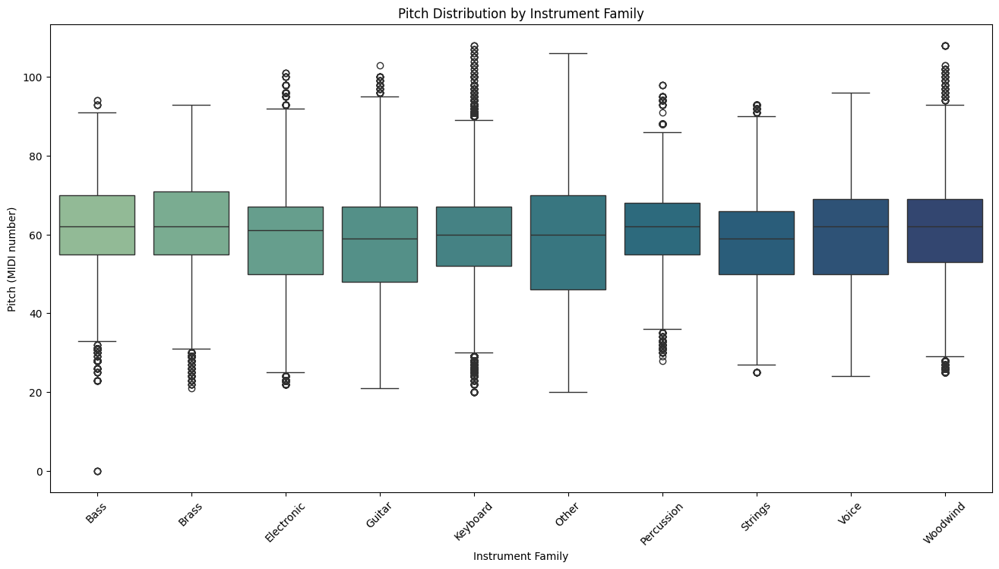

In [417]:
families = sorted(df_notes_only['instrument_family'].unique())

# Filter and plot pitch distribution by instrument family
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='instrument_family', y='pitch', palette='crest', order=families)
plt.title('Pitch Distribution by Instrument Family')
plt.xlabel('Instrument Family')
plt.ylabel('Pitch (MIDI number)')
plt.xticks(rotation=45)
plt.show()

In [418]:
# Descriptive statistics of pitch values by genre
print("Pitch statistics by Genre:")
df_notes_only.groupby('genre')['pitch'].describe()

Pitch statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,21201.0,54.890760,14.298299,25.0,44.0,57.0,66.0,103.0
blues,35519.0,59.814803,12.537029,22.0,54.0,62.0,69.0,106.0
classical,31269.0,64.418114,12.876346,24.0,55.0,65.0,74.0,100.0
country,34558.0,56.238527,12.146096,23.0,48.0,57.0,64.0,94.0
dance,34253.0,60.239191,15.372269,21.0,48.0,64.0,70.0,94.0
disco,34776.0,58.443294,13.240873,20.0,53.0,61.0,67.0,100.0
heavy_metal,32227.0,52.298632,13.525519,24.0,41.0,52.0,61.0,101.0
jazz,21851.0,59.332433,12.460760,21.0,53.0,61.0,67.0,108.0
new_age,29586.0,59.648753,12.316929,26.0,53.0,60.0,68.0,102.0


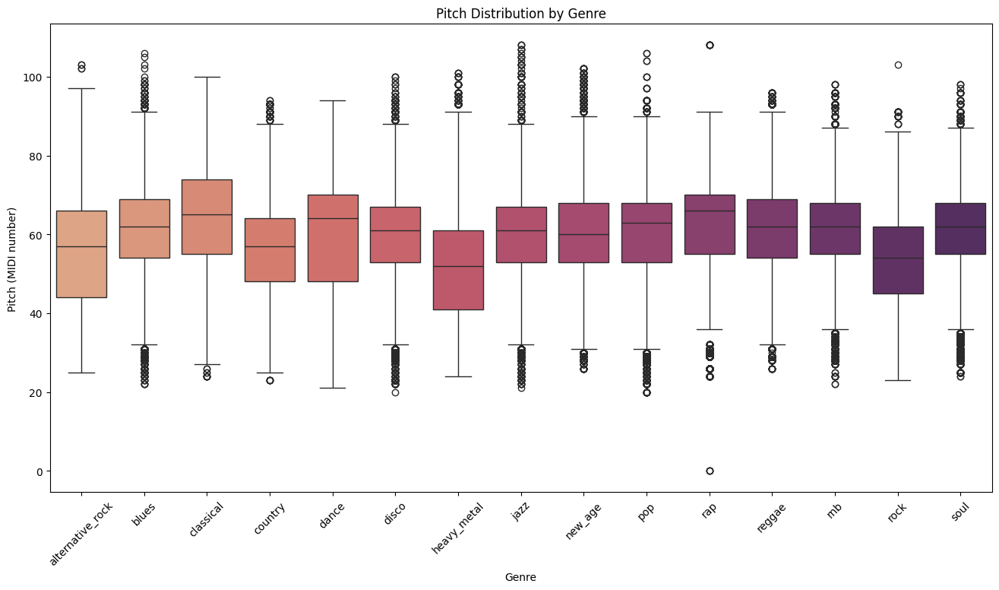

In [419]:
genres_sorted = sorted(df_notes_only['genre'].unique())

plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='genre', y='pitch', palette='flare', order=genres_sorted)
plt.title('Pitch Distribution by Genre')
plt.xlabel('Genre')
plt.ylabel('Pitch (MIDI number)')
plt.xticks(rotation=45)
plt.show()

##### Key Findings For The Pitch Feature
The analysis of the pitch feature shows mostly healthy data with a few minor anomalies worth noting. Silences were encoded as -1, which explains the negative minimum values, while the rare occurrences of pitch 0 (0.0006% of the dataset) are legitimate, coming from an electric bass piece and therefore musically valid. Overall, the pitch range (0–108) is coherent with MIDI standards, and central tendency measures (mean ≈ 58.7, median = 60, mode = 62) align well with typical Western music, centered around middle C. The distribution is musically realistic: a strong peak around 60–65, a subtle secondary peak in the 40–45 bass range, and balanced tails toward both low and high registers. The histogram also reveals a slight positive skew and a small dip around 75–80, reflecting less-used registers for many instruments. Importantly, no true anomalies were detected, and the dataset preserves authentic compositional patterns by keeping extreme but valid values. Overall, the pitch variable is highly reliable and well-suited for TDA analysis.

---

#### 2.2.2 Pitch Class

##### 2.2.2.1 Central Tendency and Spread of Pitch Classes


In [420]:
# Descriptive stats: proportion and spread of pitch classes
df['pitch_class'].describe()

count    638779.000000
mean          3.356644
std           4.137733
min          -1.000000
25%          -1.000000
50%           2.000000
75%           7.000000
max          11.000000
Name: pitch_class, dtype: float64

In [421]:
df_notes_only['pitch_class'].describe()

count    429898.000000
mean          5.473473
std           3.425836
min           0.000000
25%           2.000000
50%           5.000000
75%           9.000000
max          11.000000
Name: pitch_class, dtype: float64

In [422]:
# Central tendency
mean_pitch_class = df_notes_only['pitch_class'].mean()
median_pitch_class = df_notes_only['pitch_class'].median()
mode_pitch_class = df_notes_only['pitch_class'].mode()[0]  

# Spread
std_pitch_class = df_notes_only['pitch_class'].std()

# Display results
print(f"Mean pitch class: {mean_pitch_class:.2f}")
print(f"Median pitch class: {median_pitch_class:.2f}")
print(f"Mode pitch class: {mode_pitch_class:.2f}")
print(f"Standard deviation: {std_pitch_class:.2f}")

Mean pitch class: 5.47
Median pitch class: 5.00
Mode pitch class: 7.00
Standard deviation: 3.43


In [423]:
# Map pitch class numbers to names (0=C, 1=C#, ..., 11=B)
pitch_class_names = {
    0: 'C',
    1: 'C♯/D♭',
    2: 'D',
    3: 'D♯/E♭',
    4: 'E',
    5: 'F',
    6: 'F♯/G♭',
    7: 'G',
    8: 'G♯/A♭',
    9: 'A',
    10: 'A♯/B♭',
    11: 'B'
}

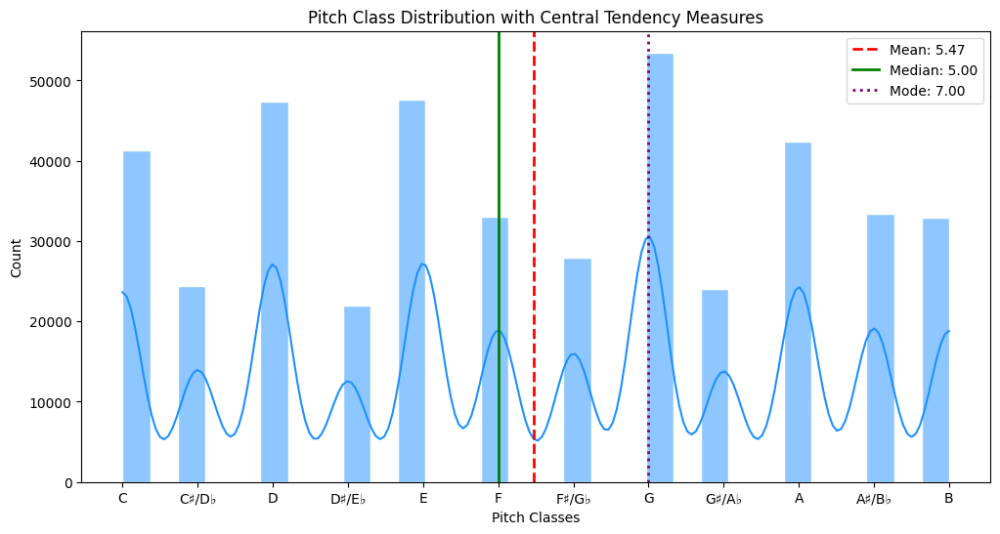

In [424]:
plt.figure(figsize=(12, 6))
sns.histplot(df_notes_only['pitch_class'], bins=30, kde=True, color='dodgerblue', edgecolor='white')

# Add lines for mean, median, and mode
plt.axvline(mean_pitch_class, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_pitch_class:.2f}')
plt.axvline(median_pitch_class, color='green', linestyle='-', linewidth=2, label=f'Median: {median_pitch_class:.2f}')
plt.axvline(mode_pitch_class, color='purple', linestyle=':', linewidth=2, label=f'Mode: {mode_pitch_class:.2f}')

plt.title('Pitch Class Distribution with Central Tendency Measures')
plt.xlabel('Pitch Classes')
plt.ylabel('Count')
plt.xticks(ticks=np.arange(0, 12), labels=[pitch_class_names[i] for i in range(12)])
plt.legend()
plt.show()

##### 2.2.2.2 Outlier Detection in Pitch Class Values

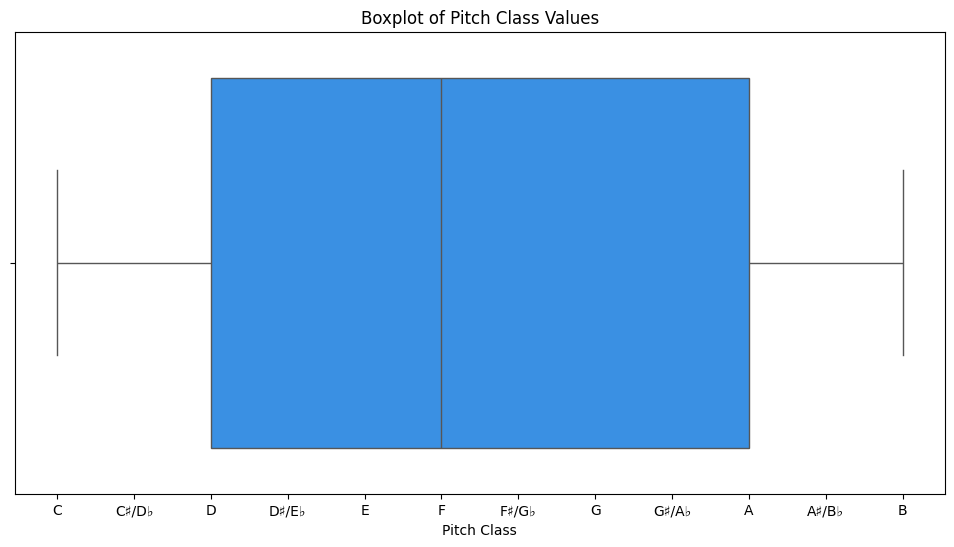

In [425]:
plt.figure(figsize=(12, 6))
sns.boxplot(x=df_notes_only['pitch_class'], color='dodgerblue')
plt.title('Boxplot of Pitch Class Values')
plt.xlabel('Pitch Class')
plt.xticks(ticks=np.arange(0, 12), labels=[pitch_class_names[i] for i in range(12)])
plt.show()

##### 2.2.2.3 Pitch Classes in Context: Key, Instrument, and Genre

In [426]:
# Descriptive statistics of pitch classes by key
print("Pitch Class statistics by Key:")
df_notes_only.groupby('key')['pitch_class'].describe().sort_index()

Pitch Class statistics by Key:


,count,mean,std,min,25%,50%,75%,max
key,,,,,,,,
0,37542.0,5.001465,3.458764,0.0,2.0,5.0,7.0,11.0
1,11542.0,5.145382,3.328973,0.0,1.0,5.0,8.0,11.0
2,28424.0,5.825324,3.192670,0.0,2.0,6.0,9.0,11.0
3,19869.0,5.778147,3.306168,0.0,3.0,7.0,9.0,11.0
4,8342.0,6.508152,3.203541,0.0,4.0,7.0,9.0,11.0
5,43881.0,4.801964,3.589794,0.0,2.0,5.0,7.0,11.0
6,7158.0,5.170718,3.524429,0.0,1.0,5.0,8.0,11.0
7,38145.0,5.347280,3.418379,0.0,2.0,6.0,9.0,11.0
8,2710.0,4.990037,3.459876,0.0,2.0,5.0,8.0,11.0


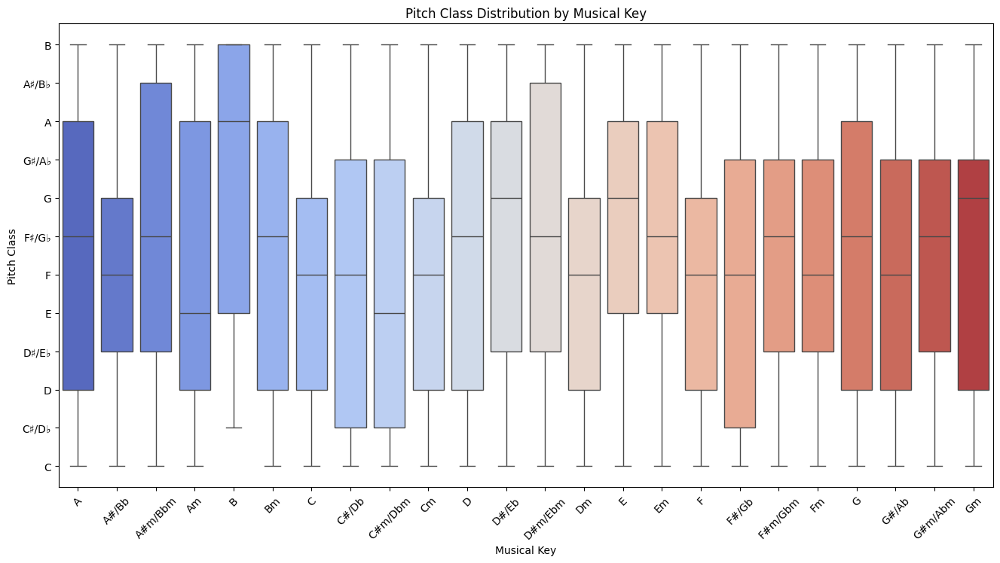

In [427]:
# Pitch Class distribution keys to show tonal variation
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='key_name', y='pitch_class', order=ordered_key_names, palette='coolwarm')
plt.title('Pitch Class Distribution by Musical Key')
plt.xlabel('Musical Key')
plt.xticks(rotation=45)
plt.yticks(ticks=np.arange(0, 12), labels=[pitch_class_names[i] for i in range(12)])
plt.ylabel('Pitch Class')
plt.show()

In [428]:
# Descriptive statistics of pitch classes by instrument
print("Pitch Class statistics by Instrument:")
df_notes_only.groupby('instrument')['pitch_class'].describe()

Pitch Class statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Acoustic Guitar,31060.0,5.568480,3.490127,0.0,3.0,5.0,9.0,11.0
Alto Saxophone,505.0,5.689109,3.182975,0.0,3.0,6.0,8.0,11.0
Bagpipes,4865.0,5.100514,3.278715,0.0,1.0,5.0,8.0,11.0
Banjo,872.0,6.834862,3.559922,1.0,6.0,7.0,11.0,11.0
Baritone Saxophone,1618.0,4.868356,3.358497,0.0,2.0,5.0,7.0,11.0
Bassoon,1729.0,5.839792,3.439845,0.0,2.0,7.0,7.0,11.0
Brass,2936.0,5.006131,3.459569,0.0,2.0,5.0,8.0,11.0
Choir,3971.0,6.149081,3.262401,0.0,4.0,6.0,9.0,11.0
Clarinet,998.0,7.067134,2.666427,1.0,6.0,8.0,8.0,11.0


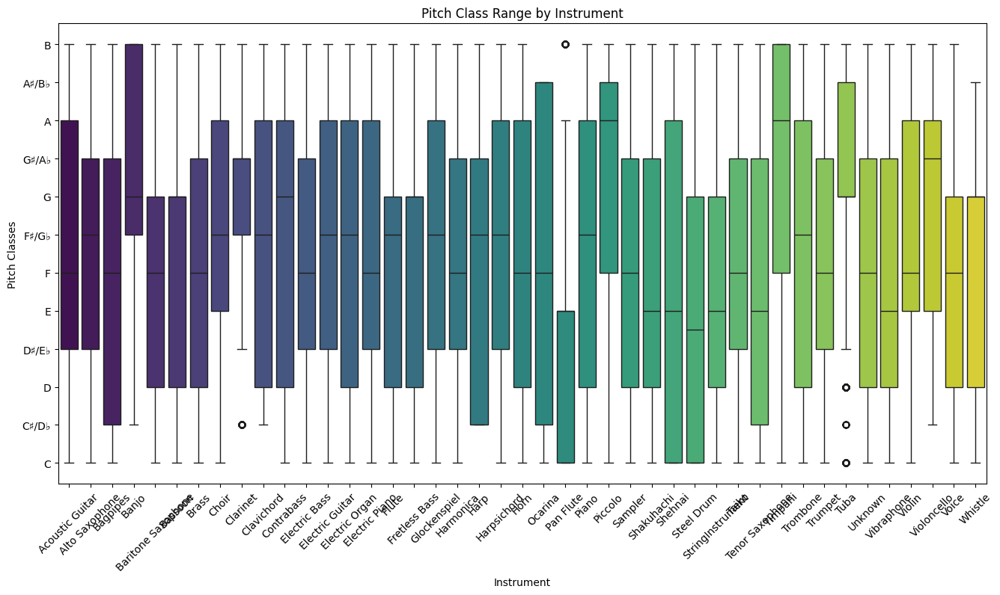

In [429]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='instrument', y='pitch_class', palette='viridis', order=alphabetic_order)
plt.xticks(rotation=45)
plt.title('Pitch Class Range by Instrument')
plt.xlabel('Instrument')
plt.ylabel('Pitch Classes')
plt.yticks(ticks=np.arange(0, 12), labels=[pitch_class_names[i] for i in range(12)])
plt.show()

In [430]:
# Descriptive statistics of pitch classes by instrument family
print("Pitch Class statistics by Instrument Family:")
df_notes_only.groupby('instrument_family')['pitch_class'].describe()

Pitch Class statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument_family,,,,,,,,
Bass,21992.0,5.553292,3.373223,0.0,2.0,6.0,8.0,11.0
Brass,28615.0,5.530910,3.398584,0.0,3.0,5.0,9.0,11.0
Electronic,44647.0,5.370036,3.310499,0.0,3.0,5.0,8.0,11.0
Guitar,123066.0,5.639803,3.487272,0.0,3.0,6.0,9.0,11.0
Keyboard,115183.0,5.530148,3.373356,0.0,2.0,6.0,9.0,11.0
Other,26495.0,5.150934,3.367119,0.0,2.0,5.0,8.0,11.0
Percussion,12714.0,5.821063,3.550292,0.0,3.0,6.0,9.0,11.0
Strings,20311.0,4.977894,3.399591,0.0,2.0,4.0,8.0,11.0
Voice,18044.0,4.758646,3.633686,0.0,2.0,5.0,7.0,11.0


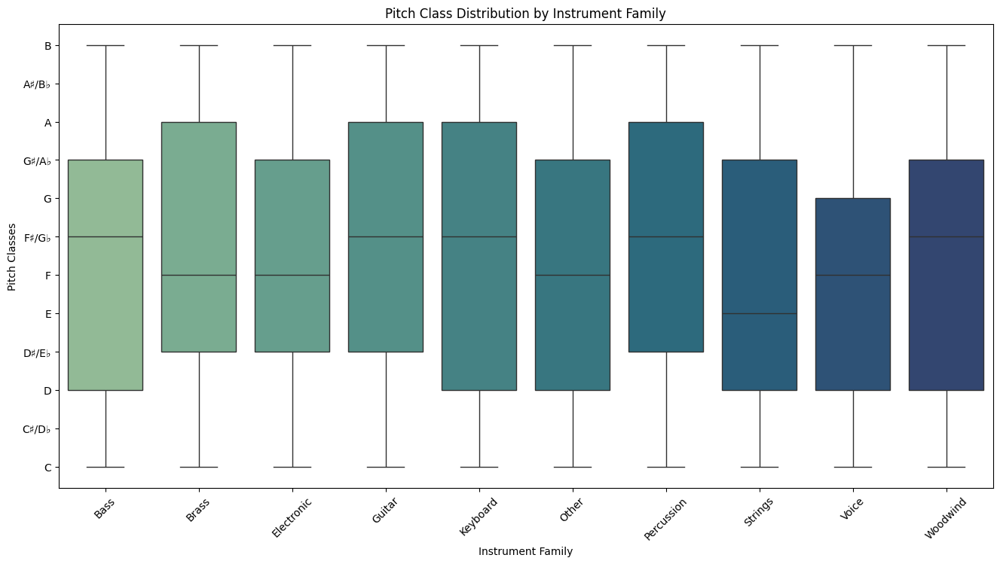

In [431]:
# Filter and plot pitch classes distribution by instrument family
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='instrument_family', y='pitch_class', palette='crest', order=families)
plt.title('Pitch Class Distribution by Instrument Family')
plt.xlabel('Instrument Family')
plt.ylabel('Pitch Classes')
plt.xticks(rotation=45)
plt.yticks(ticks=np.arange(0, 12), labels=[pitch_class_names[i] for i in range(12)])
plt.show()

In [432]:
# Descriptive statistics of pitch classes by genre
print("Pitch Class statistics by Genre:")
df_notes_only.groupby('genre')['pitch_class'].describe()

Pitch Class statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,21201.0,5.880430,3.469027,0.0,3.0,6.0,9.0,11.0
blues,35519.0,5.015288,3.569698,0.0,2.0,5.0,8.0,11.0
classical,31269.0,5.387508,3.397052,0.0,2.0,5.0,8.0,11.0
country,34558.0,5.619625,3.384081,0.0,3.0,6.0,9.0,11.0
dance,34253.0,5.657461,3.528152,0.0,3.0,5.0,9.0,11.0
disco,34776.0,5.427766,3.461496,0.0,2.0,6.0,9.0,11.0
heavy_metal,32227.0,5.320011,3.290025,0.0,2.0,5.0,8.0,11.0
jazz,21851.0,5.348634,3.417870,0.0,2.0,5.0,8.0,11.0
new_age,29586.0,5.727033,3.489987,0.0,2.0,6.0,9.0,11.0


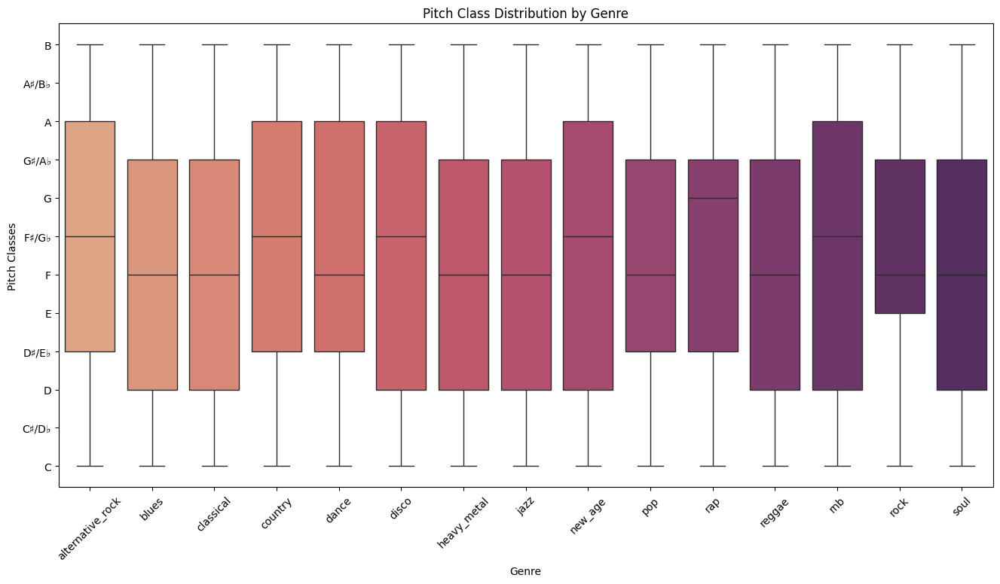

In [433]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='genre', y='pitch_class', palette='flare', order=genres_sorted)
plt.title('Pitch Class Distribution by Genre')
plt.xlabel('Genre')
plt.ylabel('Pitch Classes')
plt.xticks(rotation=45)
plt.yticks(ticks=np.arange(0, 12), labels=[pitch_class_names[i] for i in range(12)])
plt.show()

##### 2.2.2.4 Circular Visualization of Pitch Class Usage Aligned with Tonal Hierarchy

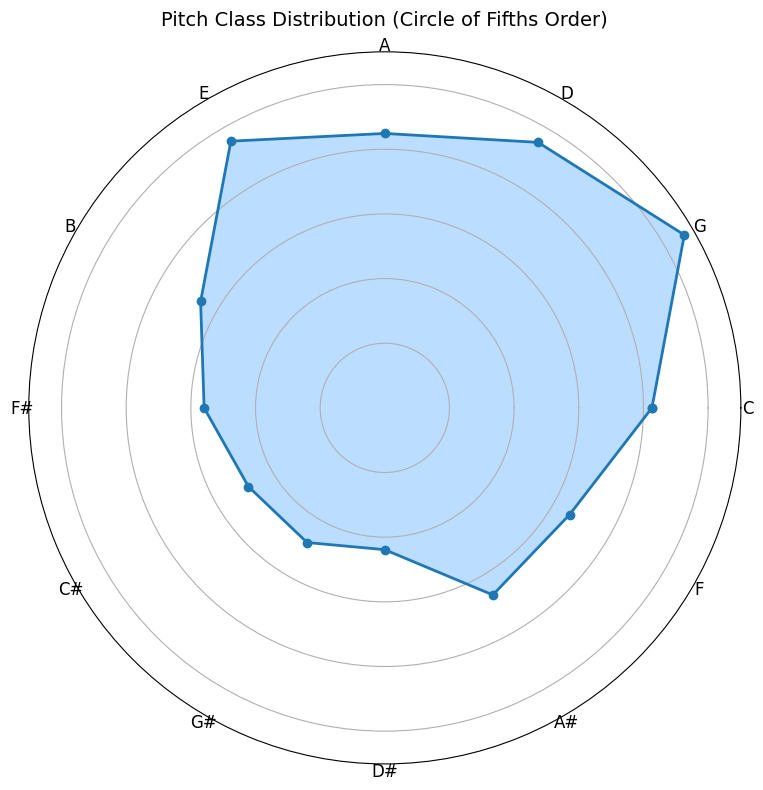

In [434]:
# Map pitch class numbers to names (0=C, 1=C#, ..., 11=B)
pitch_class_names_circle = {
    0: 'C', 1: 'C#', 2: 'D', 3: 'D#', 4: 'E', 5: 'F',
    6: 'F#', 7: 'G', 8: 'G#', 9: 'A', 10: 'A#', 11: 'B'
}

# Reorder pitch classes by Circle of Fifths
fifths_order = ['C', 'G', 'D', 'A', 'E', 'B', 'F#', 'C#', 'G#', 'D#', 'A#', 'F']

# Count occurrences for each pitch class
pitch_counts = df['pitch_class'].map(pitch_class_names_circle).value_counts().reindex(fifths_order, fill_value=0)

# Set up circular plot
angles = np.linspace(0, 2 * np.pi, 12, endpoint=False)
values = pitch_counts.values
labels = pitch_counts.index

# Repeat the first value to close the circle
angles = np.concatenate([angles, [angles[0]]])
values = np.concatenate([values, [values[0]]])

# Plot
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
ax.plot(angles, values, 'o-', linewidth=2)
ax.fill(angles, values, alpha=0.3, color='dodgerblue')

# Add pitch class labels
for angle, label in zip(angles[:-1], labels):
    ax.text(angle, max(values)*1.05, label, ha='center', va='center', fontsize=12)

# Remove radial labels for clarity
ax.set_yticklabels([])
ax.set_xticks([])

ax.set_title('Pitch Class Distribution (Circle of Fifths Order)', fontsize=14, pad=20)
plt.tight_layout()
plt.show()

##### Key Findings For The Pitch Class Feature
The analysis of the pitch class feature confirms that the data is musically coherent and technically reliable. Values fall perfectly within the expected range (0–11), with silences encoded consistently (~32%). The distribution is clearly multimodal, showing a strong preference for natural notes (C, D, E, G, A) over accidentals, which is entirely normal in tonal Western music. Central tendency measures (mean = 5.46, median = 5, mode = 7) align with musical logic: the mean reflects the concentration around D–E–F–G, the median points to F, and the mode being G highlights its role as the dominant. The histogram confirms tonal hierarchy: diatonic notes are heavily favored, while accidentals are systematically underrepresented, producing the expected tonal “valleys.” Variability (std = 3.41) simply reflects this contrast and is not anomalous. Distribution by key, instrument, and genre further validates the data, with each tonal and instrumental profile matching musical expectations. Overall, no anomalies are detected, and the pitch class feature strongly reflects authentic tonal organization in the corpus, making it highly reliable for TDA.

---

#### 2.2.3 Pitch Octave

##### 2.2.3.1 Distribution of Pitch Octaves and Measures of Central Tendency

In [435]:
# Descriptive stats: proportion and spread of pitch octaves
df['pitch_octave'].describe()

count    638779.000000
mean          2.403960
std           2.621926
min          -1.000000
25%          -1.000000
50%           3.000000
75%           5.000000
max           9.000000
Name: pitch_octave, dtype: float64

In [436]:
df_notes_only['pitch_octave'].describe()

count    429898.000000
mean          4.057893
std           1.359883
min          -1.000000
25%           3.000000
50%           4.000000
75%           5.000000
max           9.000000
Name: pitch_octave, dtype: float64

In [437]:
# Central tendency
mean_pitch_octave = df_notes_only['pitch_octave'].mean()
median_pitch_octave = df_notes_only['pitch_octave'].median()
mode_pitch_octave = df_notes_only['pitch_octave'].mode()[0]  

# Spread
std_pitch_octave = df_notes_only['pitch_octave'].std()

# Display results
print(f"Mean pitch octave: {mean_pitch_octave:.2f}")
print(f"Median pitch octave: {median_pitch_octave:.2f}")
print(f"Mode pitch octave: {mode_pitch_octave:.2f}")
print(f"Standard deviation: {std_pitch_octave:.2f}")

Mean pitch octave: 4.06
Median pitch octave: 4.00
Mode pitch octave: 5.00
Standard deviation: 1.36


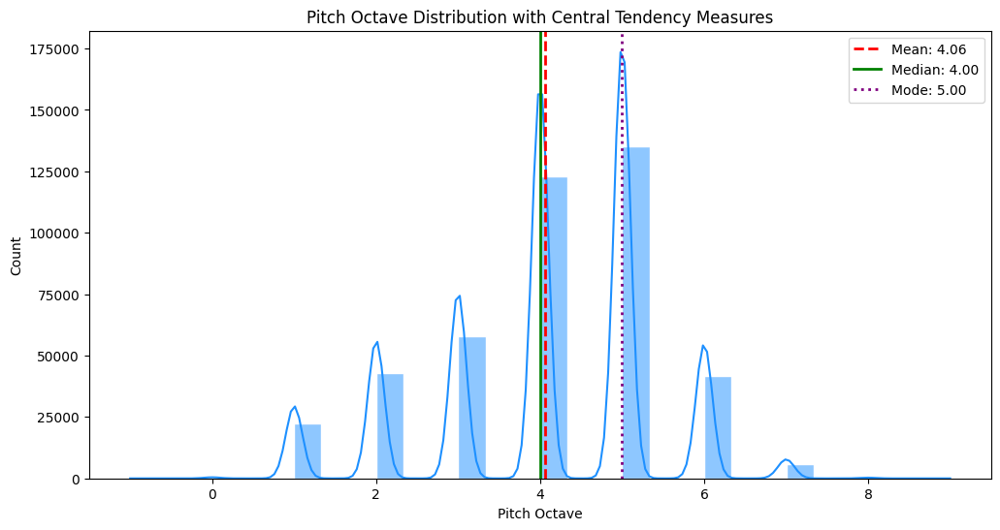

In [438]:
plt.figure(figsize=(12, 6))
sns.histplot(df_notes_only['pitch_octave'], bins=30, kde=True, color='dodgerblue', edgecolor='white')

# Add lines for mean, median, and mode
plt.axvline(mean_pitch_octave, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_pitch_octave:.2f}')
plt.axvline(median_pitch_octave, color='green', linestyle='-', linewidth=2, label=f'Median: {median_pitch_octave:.2f}')
plt.axvline(mode_pitch_octave, color='purple', linestyle=':', linewidth=2, label=f'Mode: {mode_pitch_octave:.2f}')

plt.title('Pitch Octave Distribution with Central Tendency Measures')
plt.xlabel('Pitch Octave')
plt.ylabel('Count') 
plt.legend()
plt.show()

##### 2.3.3.2 Detection of Anomalous Octave Assignments via Boxplot Inspection

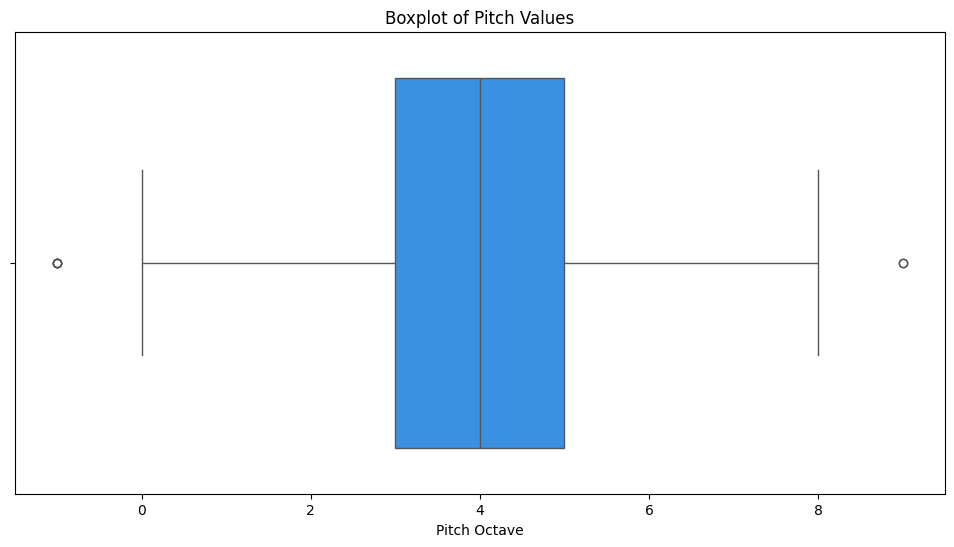

In [439]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_notes_only, x='pitch_octave', color='dodgerblue')
plt.title('Boxplot of Pitch Values')
plt.xlabel('Pitch Octave')
plt.show()

In [440]:
df_notes_only[df_notes_only['pitch_octave'] < 0][['filename', 'pitch_octave', 'instrument']]

,filename,pitch_octave,instrument
599902,The Real Slim Shady.mid,-1,Electric Bass
600908,The Real Slim Shady.mid,-1,Electric Bass
601912,The Real Slim Shady.mid,-1,Electric Bass
602263,The Real Slim Shady.mid,-1,Electric Bass


##### 2.3.3.3 Pitch Octave Values in Context: Key, Instrument, and Genre

In [441]:
# Descriptive statistics pitch by key
print("Pitch Octave statistics by Key:")
df_notes_only.groupby('key')['pitch_octave'].describe().sort_index()

Pitch Octave statistics by Key:


,count,mean,std,min,25%,50%,75%,max
key,,,,,,,,
0,37542.0,4.151457,1.340837,1.0,4.0,4.0,5.0,9.0
1,11542.0,4.356784,1.299149,1.0,4.0,5.0,5.0,8.0
2,28424.0,3.990184,1.387697,1.0,3.0,4.0,5.0,8.0
3,19869.0,3.954603,1.421934,0.0,3.0,4.0,5.0,7.0
4,8342.0,3.948693,1.212869,0.0,3.0,4.0,5.0,7.0
5,43881.0,4.448736,1.344669,1.0,4.0,5.0,5.0,8.0
6,7158.0,4.435317,1.276148,1.0,4.0,5.0,5.0,7.0
7,38145.0,4.179316,1.187086,1.0,4.0,4.0,5.0,8.0
8,2710.0,4.026199,1.095839,1.0,4.0,4.0,5.0,7.0


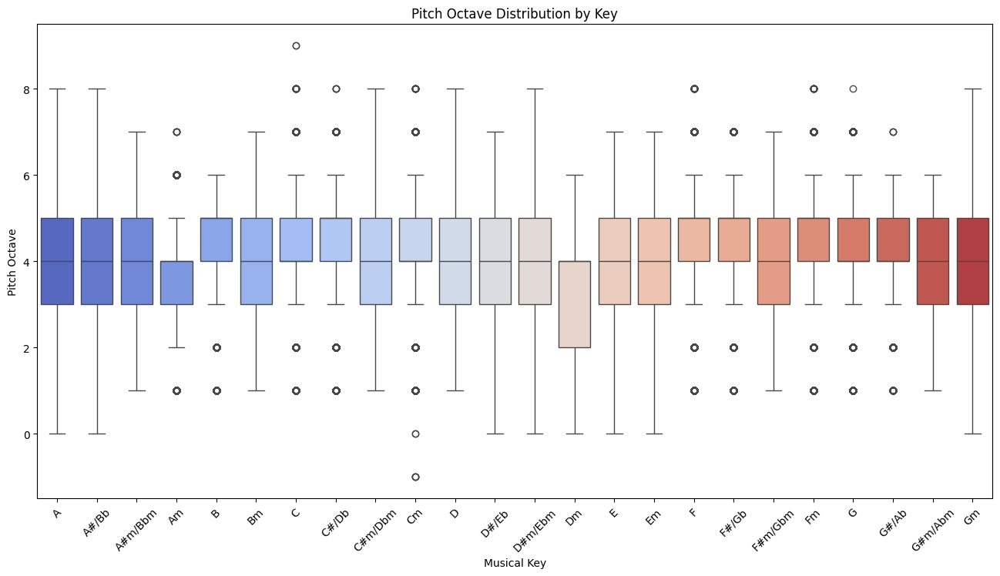

In [442]:
# Pitch Octave distribution across keys to show tonal variation
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='key_name', y='pitch_octave', order=ordered_key_names, palette='coolwarm')
plt.title('Pitch Octave Distribution by Key')
plt.xlabel('Musical Key')
plt.xticks(rotation = 45)
plt.ylabel('Pitch Octave')
plt.show()

In [443]:
# Descriptive statistics of pitch octave values by instrument
print("Pitch Octave statistics by Instrument:")
df_notes_only.groupby('instrument')['pitch_octave'].describe()

Pitch Octave statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Acoustic Guitar,31060.0,4.024179,1.584976,0.0,3.00,5.0,5.0,8.0
Alto Saxophone,505.0,3.085149,1.684040,1.0,1.00,4.0,4.0,6.0
Bagpipes,4865.0,4.437821,1.387758,1.0,4.00,5.0,5.0,6.0
Banjo,872.0,4.443807,1.066797,2.0,5.00,5.0,5.0,5.0
Baritone Saxophone,1618.0,3.660692,1.179793,1.0,3.00,4.0,5.0,7.0
Bassoon,1729.0,3.825333,1.018137,1.0,3.00,4.0,5.0,5.0
Brass,2936.0,4.660082,1.393678,1.0,4.00,5.0,6.0,8.0
Choir,3971.0,4.436918,1.173913,1.0,4.00,5.0,5.0,7.0
Clarinet,998.0,3.649299,1.238489,1.0,3.00,4.0,4.0,7.0


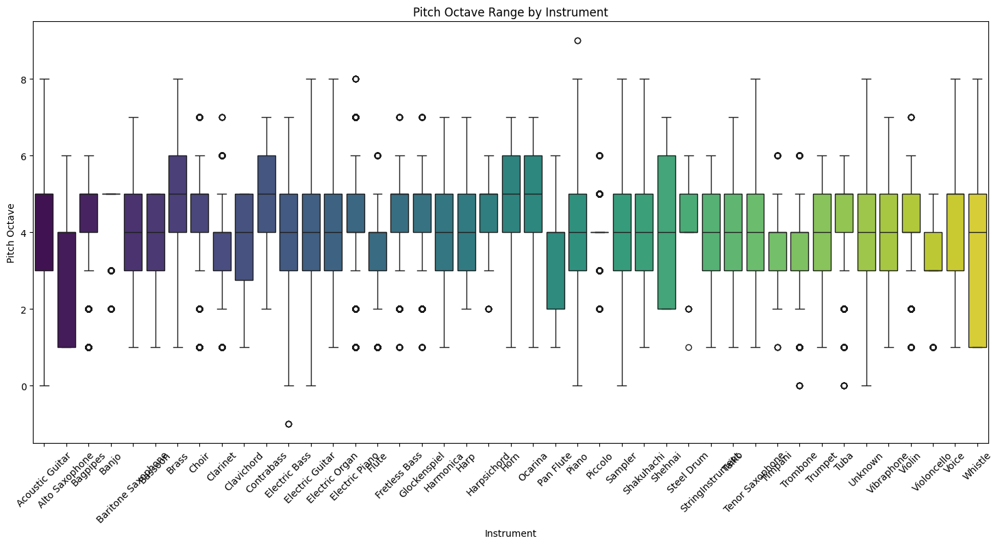

In [444]:
plt.figure(figsize=(18, 8))
sns.boxplot(data=df_notes_only, x='instrument', y='pitch_octave', palette='viridis', order=alphabetic_order)
plt.xticks(rotation=45)
plt.title('Pitch Octave Range by Instrument')
plt.xlabel('Instrument')
plt.ylabel('Pitch Octave')
plt.show()

In [445]:
# Descriptive statistics of pitch octave values by instrument family
print("Pitch Octave statistics by Instrument Family:")
df_notes_only.groupby('instrument_family')['pitch_octave'].describe()

Pitch Octave statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument_family,,,,,,,,
Bass,21992.0,4.417743,1.237133,-1.0,4.0,5.0,5.0,7.0
Brass,28615.0,4.466049,1.253565,0.0,4.0,4.0,5.0,7.0
Electronic,44647.0,4.069232,1.352749,0.0,3.0,4.0,5.0,8.0
Guitar,123066.0,3.904247,1.339818,0.0,3.0,4.0,5.0,8.0
Keyboard,115183.0,4.104034,1.362620,0.0,3.0,4.0,5.0,9.0
Other,26495.0,3.873561,1.557053,0.0,3.0,4.0,5.0,8.0
Percussion,12714.0,4.104688,1.184859,1.0,4.0,4.0,5.0,7.0
Strings,20311.0,3.970509,1.242909,1.0,3.0,4.0,5.0,7.0
Voice,18044.0,4.120816,1.417709,1.0,3.0,5.0,5.0,8.0


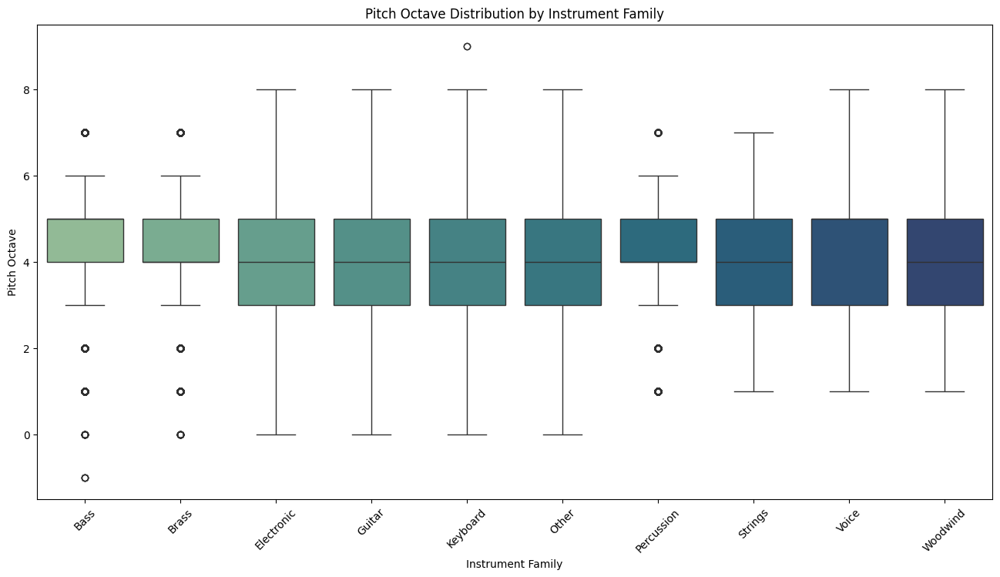

In [446]:
# Filter and plot pitch octave distribution by instrument family
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='instrument_family', y='pitch_octave', palette='crest', order=families)
plt.title('Pitch Octave Distribution by Instrument Family')
plt.xlabel('Instrument Family')
plt.ylabel('Pitch Octave')
plt.xticks(rotation=45)
plt.show()

In [447]:
# Descriptive statistics of pitch octave values by genre
print("Pitch Octave statistics by Genre:")
df_notes_only.groupby('genre')['pitch_octave'].describe()

Pitch Octave statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,21201.0,3.644875,1.380034,1.0,3.0,4.0,5.0,7.0
blues,35519.0,4.191250,1.287294,0.0,4.0,4.0,5.0,8.0
classical,31269.0,4.760626,1.151186,1.0,4.0,5.0,6.0,8.0
country,34558.0,3.864923,1.269504,0.0,3.0,4.0,5.0,7.0
dance,34253.0,4.051236,1.541507,0.0,3.0,4.0,5.0,7.0
disco,34776.0,4.045462,1.439078,0.0,3.0,4.0,5.0,8.0
heavy_metal,32227.0,3.413287,1.319481,1.0,3.0,3.0,4.0,8.0
jazz,21851.0,4.027779,1.289424,0.0,3.0,4.0,5.0,9.0
new_age,29586.0,4.061752,1.265288,1.0,3.0,4.0,5.0,8.0


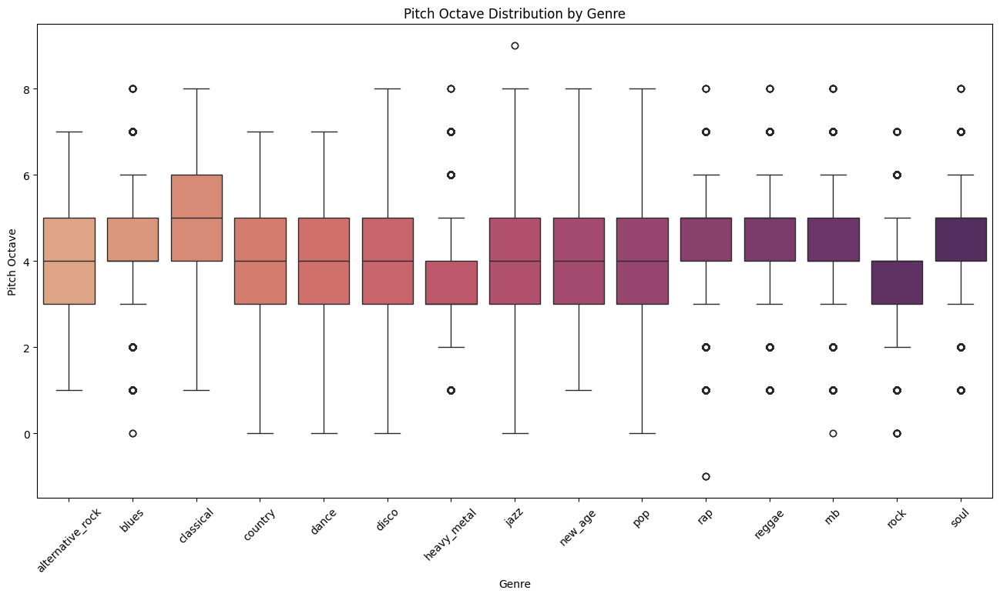

In [448]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='genre', y='pitch_octave', palette='flare', order=genres_sorted)
plt.title('Pitch Octave Distribution by Genre')
plt.xlabel('Genre')
plt.ylabel('Pitch Octave')
plt.xticks(rotation=45)
plt.show()

##### Key Findings For The Pitch Octave Feature
The analysis of the pitch octave feature shows an overall coherent and musically consistent distribution with only minor anomalies. A small number of values at –1 persist even after silences were removed, suggesting a preprocessing inconsistency, though these are negligible in volume. The range spans from octave –1 to 9, which includes extreme lows (C–1 ≈ 8 Hz) and highs (C9 ≈ 8.3 kHz); while unusual, these extremes can be legitimate for certain instruments or genres and do not dominate the data. The central distribution is very stable, with a median of 4 (middle C octave), a mean of 4.07, and a reasonable standard deviation of 1.36, reflecting typical instrumental ranges. Histograms confirm clear multimodal peaks across octaves 1–6, centered on 4–5, which aligns with the most common registers in Western music. Instrument- and genre-level analyses validate this further: bass instruments cluster in low octaves, strings and winds extend upwards, and stylistic differences are subtle but logical. Overall, except for the negligible –1 outliers, the data appears musically valid and well-suited for TDA.

---

#### 2.3.4 Onset

##### 2.3.4.1 Temporal Distribution of Note Onsets and Measures of Central Tendency


In [449]:
# Descriptive stats: proportion and spread of onset values
df['onset'].describe()

count    638779.000000
mean        267.892058
std         192.286239
min           0.000000
25%         122.500000
50%         234.000000
75%         364.750000
max        1330.583333
Name: onset, dtype: float64

In [450]:
# Central tendency
mean_onset = df['onset'].mean()
median_onset = df['onset'].median()
mode_onset = df['onset'].mode()[0]  

# Spread
std_onset = df['onset'].std()

# Display results
print(f"Mean onset: {mean_onset:.1f}")
print(f"Median onset: {median_onset:.1f}")
print(f"Mode onset: {mode_onset:.1f}")
print(f"Standard deviation: {std_onset:.1f}")
print(f"Average number of events per piece: {len(df) / df['filename'].nunique():.1f}")

Mean onset: 267.9
Median onset: 234.0
Mode onset: 24.0
Standard deviation: 192.3
Average number of events per piece: 5323.2


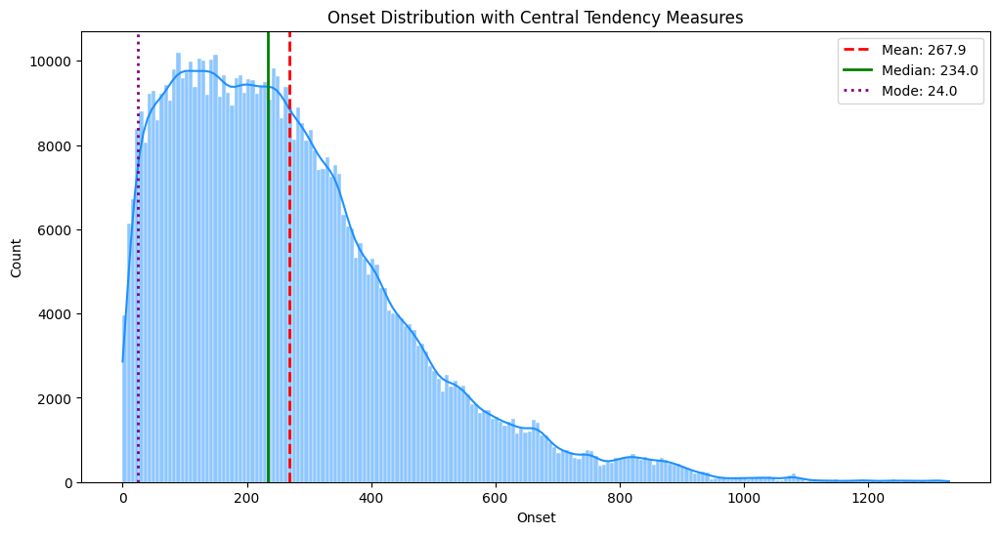

In [451]:
plt.figure(figsize=(12, 6))
sns.histplot(df['onset'], bins=200, kde=True, color='dodgerblue', edgecolor='white')

# Add lines for mean, median, and mode
plt.axvline(mean_onset, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_onset:.1f}')
plt.axvline(median_onset, color='green', linestyle='-', linewidth=2, label=f'Median: {median_onset:.1f}')
plt.axvline(mode_onset, color='purple', linestyle=':', linewidth=2, label=f'Mode: {mode_onset:.1f}')

plt.title('Onset Distribution with Central Tendency Measures')
plt.xlabel('Onset')
plt.ylabel('Count')
plt.legend()
plt.show()

In [452]:
# Descriptive statistics per piece
piece_stats = df.groupby('filename')['onset'].agg([
    'count', 'min', 'max', 'mean', 'std'
]).round(2)

print("Statistics per piece:")
print(piece_stats.describe())

# Check pieces starting at onset=0
starts_at_zero = df.groupby('filename')['onset'].min() == 0
print(f"Pieces starting at onset=0: {starts_at_zero.sum()}/{len(starts_at_zero)} ({starts_at_zero.mean()*100:.1f}%)")

# Identify potentially problematic pieces
problematic_pieces = piece_stats[
    (piece_stats['min'] != 0) |  
    (piece_stats['count'] < 10) | 
    (piece_stats['max'] > 2000)  
]
print(f"\nPotentially problematic pieces: {len(problematic_pieces)}")
if len(problematic_pieces) > 0:
    print(problematic_pieces.head())

Statistics per piece:
              count         min          max        mean         std
count    120.000000  120.000000   120.000000  120.000000  120.000000
mean    5323.158333    0.006250   471.713750  237.986667  130.074500
std     3084.710708    0.039195   190.778014   94.157726   54.602165
min      708.000000    0.000000   149.750000   84.910000   39.360000
25%     3375.750000    0.000000   351.480000  174.202500   95.755000
50%     4897.500000    0.000000   435.085000  222.610000  120.980000
75%     6651.250000    0.000000   566.835000  269.030000  147.545000
max    20049.000000    0.250000  1330.580000  639.740000  390.260000
Pieces starting at onset=0: 117/120 (97.5%)

Potentially problematic pieces: 3
                       count   min     max    mean     std
filename                                                  
Hey Lover.mid           2600  0.25  419.83  202.78  120.94
No Scrubs.mid           1582  0.25  291.00  148.68   86.47
Rivers Of Babylon.mid   3601  0.25  566.08

In [453]:
# Check their exact pattern
problematic_pieces = ['Hey Lover.mid', 'No Scrubs.mid', 'Rivers Of Babylon.mid']

for piece in problematic_pieces:
    piece_data = df[df['filename'] == piece]['onset'].sort_values()
    print(f"\n{piece}:")
    print(f"  First onsets: {piece_data.head(10).values}")
    print(f"  Pattern of differences: {np.diff(piece_data.head(10).values)}")


Hey Lover.mid:
  First onsets: [0.25 1.25 1.5  2.25 3.25 4.   4.   4.   4.   4.  ]
  Pattern of differences: [1.   0.25 0.75 1.   0.75 0.   0.   0.   0.  ]

No Scrubs.mid:
  First onsets: [0.25 1.25 1.75 2.25 3.25 4.   4.   4.   4.25 4.5 ]
  Pattern of differences: [1.   0.5  0.5  1.   0.75 0.   0.   0.25 0.25]

Rivers Of Babylon.mid:
  First onsets: [0.25 1.25 2.25 4.   4.   4.25 4.5  4.75 5.   5.25]
  Pattern of differences: [1.   1.   1.75 0.   0.25 0.25 0.25 0.25 0.25]


##### 2.3.4.2 Temporal Resolution Analysis and Rhythmic Quantization Validation

In [454]:
# Verify MIDI quantization consistency
all_onsets = df['onset'].values
decimal_parts = all_onsets % 1
unique_subdivisions = np.unique(decimal_parts)

print("Temporal subdivisions used:")
print(f"Unique decimal parts: \n {unique_subdivisions}")
print(f"\n Probable resolution: {1/np.gcd.reduce((unique_subdivisions[unique_subdivisions > 0] * 100).astype(int))} quarter note")

Temporal subdivisions used:
Unique decimal parts: 
 [0.         0.08333333 0.08333333 0.08333333 0.08333333 0.08333333
 0.08333333 0.08333333 0.08333333 0.08333333 0.16666667 0.16666667
 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667
 0.16666667 0.25       0.33333333 0.33333333 0.33333333 0.33333333
 0.33333333 0.33333333 0.33333333 0.33333333 0.33333333 0.33333333
 0.33333333 0.33333333 0.41666667 0.41666667 0.41666667 0.41666667
 0.41666667 0.41666667 0.41666667 0.41666667 0.41666667 0.41666667
 0.5        0.58333333 0.58333333 0.58333333 0.58333333 0.58333333
 0.58333333 0.58333333 0.58333333 0.58333333 0.58333333 0.58333333
 0.66666667 0.66666667 0.66666667 0.66666667 0.66666667 0.66666667
 0.66666667 0.66666667 0.66666667 0.66666667 0.66666667 0.66666667
 0.75       0.83333333 0.83333333 0.83333333 0.83333333 0.83333333
 0.83333333 0.83333333 0.83333333 0.83333333 0.83333333 0.83333333
 0.91666667 0.91666667 0.91666667 0.91666667 0.91666667 0.91666667
 0.9166666

In [455]:
subdivisions_clean = np.unique(np.round(decimal_parts, 8))
print("Main subdivisions:")
for sub in subdivisions_clean:
    fraction = f"{int(sub*12)}/12" if sub > 0 else "0"
    print(f"{sub:.8f} = {fraction}")

Main subdivisions:
0.00000000 = 0
0.08333333 = 0/12
0.16666667 = 2/12
0.25000000 = 3/12
0.33333333 = 3/12
0.41666667 = 5/12
0.50000000 = 6/12
0.58333333 = 6/12
0.66666667 = 8/12
0.75000000 = 9/12
0.83333333 = 9/12
0.91666667 = 11/12


In [456]:
# Data Engineering
df['subdivision_12'] = (df['onset'] * 12) % 12  
df_notes_only['subdivision_12'] = (df_notes_only['onset'] * 12) % 12  

df['beat_type_detailed'] = df['subdivision_12'].map({
    0: 'beat',           
    1: 'triplet_1',      
    2: 'eighth_ternary',   
    3: 'quarter',        
    4: 'triplet_2',      
    6: 'half',           
    8: 'triplet_3',      
    9: 'dotted',         
}).fillna('other')

df_notes_only['beat_type_detailed'] = df_notes_only['subdivision_12'].map({
    0: 'beat',           
    1: 'triplet_1',      
    2: 'eighth_ternary',   
    3: 'quarter',        
    4: 'triplet_2',      
    6: 'half',           
    8: 'triplet_3',      
    9: 'dotted',         
}).fillna('other')

print("Distribution of rhythmic positions:")
print(df['beat_type_detailed'].value_counts().head(10))

Distribution of rhythmic positions:
beat_type_detailed
beat              247409
half              135615
dotted             94898
quarter            88130
other              24250
triplet_3          21746
triplet_2          16324
triplet_1           5311
eighth_ternary      5096
Name: count, dtype: int64


Maximum quantization error: 0.00
The data are well quantized.


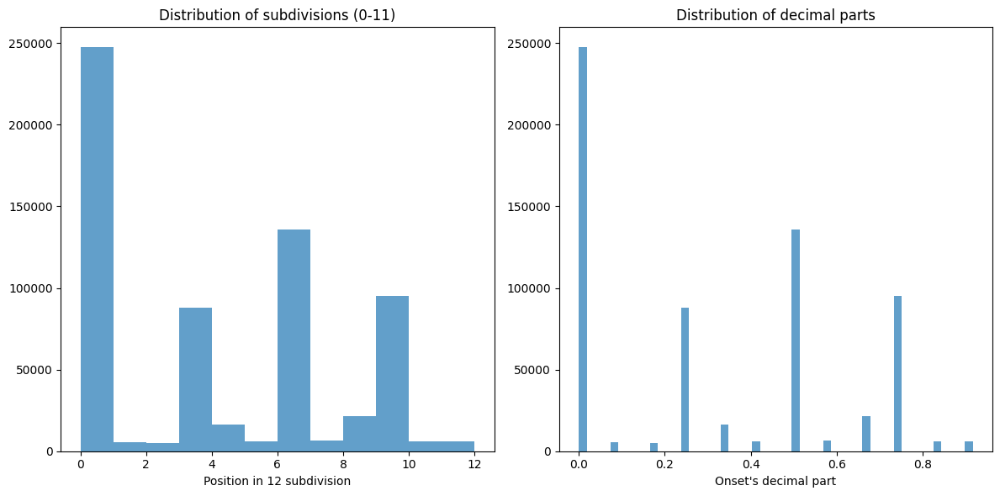

In [457]:
# Verify quantization consistency
onset_12ths = df['onset'] * 12
quantization_errors = onset_12ths - np.round(onset_12ths)
max_error = np.abs(quantization_errors).max()

print(f"Maximum quantization error: {max_error:.2f}")
print(f"The data {'are' if max_error < 1e-10 else 'are not'} well quantized.")

# Distribution of rhythmic positions
plt.figure(figsize=(12, 6))
plt.subplot(1,2,1)
plt.hist(df['subdivision_12'], bins=12, range=(0,12), alpha=0.7)
plt.title('Distribution of subdivisions (0-11)')
plt.xlabel('Position in 12 subdivision')

plt.subplot(1,2,2)
plt.hist(decimal_parts, bins=50, alpha=0.7)
plt.title('Distribution of decimal parts')
plt.xlabel("Onset's decimal part")
plt.tight_layout()

In [458]:
# Analyze rhythmic complexity by piece
rhythmic_complexity = df.groupby('filename')['subdivision_12'].nunique()
print("Rhythmic complexity (number of different subdivisions per piece):")
print(rhythmic_complexity.describe())

# Most rhythmically complex pieces
complex_pieces = rhythmic_complexity.nlargest(5)
print(f"\nMost rhythmically rich pieces:")
print(complex_pieces)

Rhythmic complexity (number of different subdivisions per piece):
count    120.000000
mean       9.483333
std        2.599235
min        4.000000
25%        7.750000
50%       10.000000
75%       12.000000
max       12.000000
Name: subdivision_12, dtype: float64

Most rhythmically rich pieces:
filename
A Shot of Rhythm and Blues.mid    12
All Blues.mid                     12
All I Wanna Do.mid                12
Amarok.mid                        12
Basin Street Blues.mid            12
Name: subdivision_12, dtype: int64


##### 2.3.4.3 Cumulative Density of Note Onsets

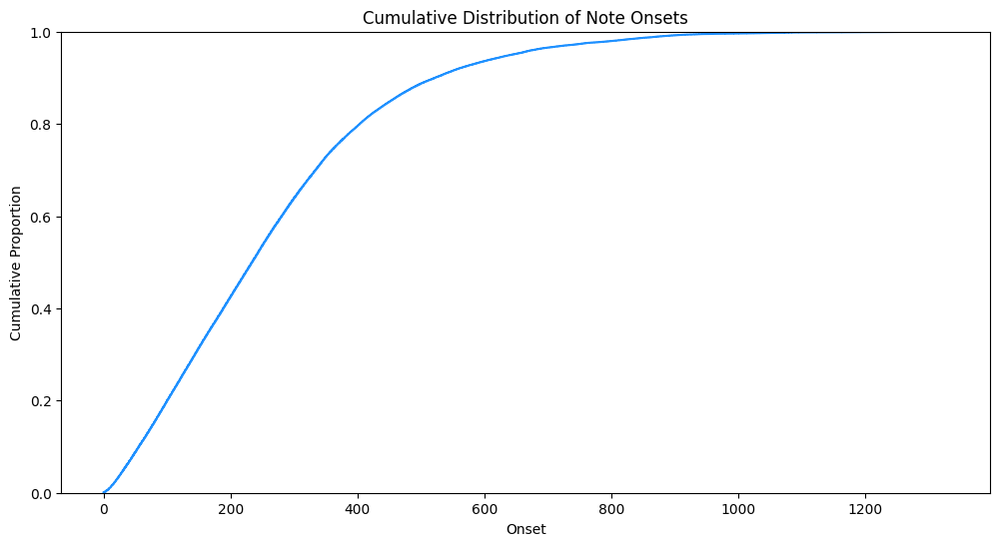

In [459]:
plt.figure(figsize=(12, 6))
sns.ecdfplot(df['onset'], color='dodgerblue')  
plt.title("Cumulative Distribution of Note Onsets")
plt.xlabel("Onset")
plt.ylabel("Cumulative Proportion")
plt.show()

##### 2.3.4.4 Outlier Detection in Onset Values

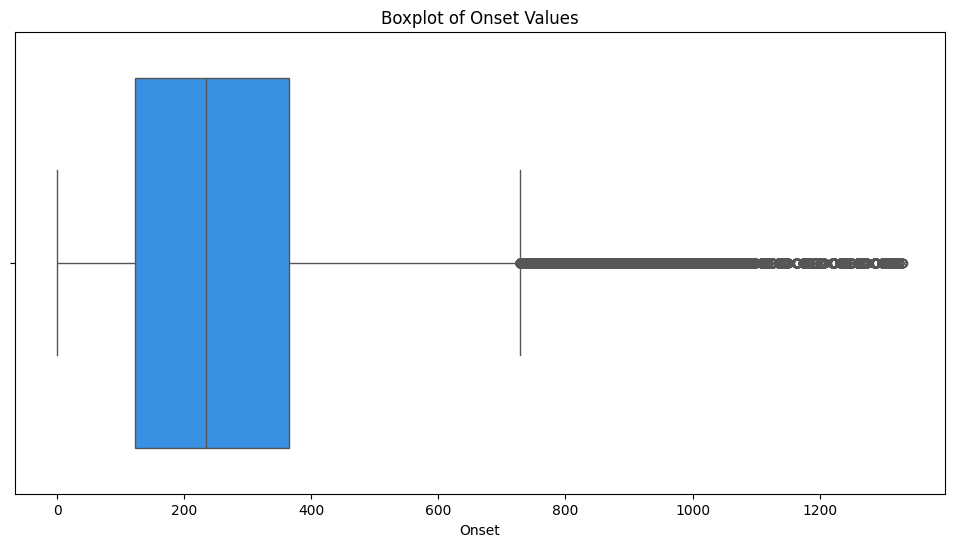

In [460]:
plt.figure(figsize=(12, 6))
sns.boxplot(x=df['onset'], color='dodgerblue')
plt.title('Boxplot of Onset Values')
plt.xlabel('Onset')
plt.show()

##### 2.3.4.5 Onset in Context: Key, Instrument, and Genre

In [461]:
# Descriptive statistics of onset values by key
print("Onset statistics by Key:")
df.groupby('key')['onset'].describe().sort_index()

Onset statistics by Key:


,count,mean,std,min,25%,50%,75%,max
key,,,,,,,,
0,57405.0,238.747486,141.225505,0.0,121.000000,228.000000,351.500000,615.416667
1,16127.0,207.486245,133.455108,0.0,97.250000,192.333333,290.000000,697.416667
2,41409.0,257.556455,166.727717,0.0,124.000000,231.333333,356.000000,688.250000
3,30638.0,210.096378,121.116831,0.0,108.750000,204.500000,299.000000,496.000000
4,12523.0,182.862367,96.777143,0.0,106.875000,183.250000,259.500000,590.500000
5,61610.0,335.332653,235.201710,0.0,145.250000,275.750000,508.250000,962.250000
6,9799.0,295.043729,164.491767,0.0,164.000000,282.666667,408.000000,619.000000
7,53848.0,287.967224,227.524017,0.0,123.000000,236.500000,392.875000,1094.750000
8,4606.0,171.070633,94.904330,0.0,92.000000,171.000000,244.000000,355.166667


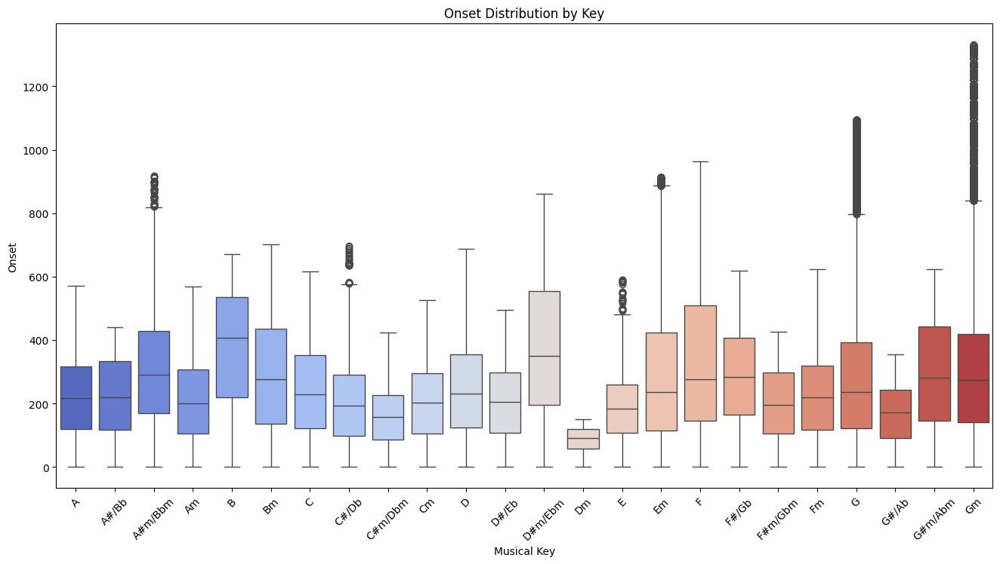

In [462]:
# Onset distribution across keys to show tonal variation
plt.figure(figsize=(16, 8))
sns.boxplot(data=df, x='key_name', y='onset', order=ordered_key_names, palette='coolwarm')
plt.title('Onset Distribution by Key')
plt.xlabel('Musical Key')
plt.xticks(rotation=45)
plt.ylabel('Onset')
plt.show()



In [463]:
# Descriptive statistics of onset values by instrument
print("Onset statistics by Instrument:")
df.groupby('instrument')['onset'].describe()

Onset statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Accordion,1.0,1.000000,NaN,1.000000,1.000000,1.000000,1.000000,1.000000
Acoustic Guitar,46426.0,319.332303,237.919683,0.000000,132.500000,264.750000,440.000000,912.333333
Alto Saxophone,1028.0,212.051313,39.742708,1.000000,181.125000,212.000000,245.750000,276.250000
Bagpipes,6887.0,198.344369,105.620290,1.000000,108.000000,198.500000,290.500000,387.750000
Banjo,1849.0,193.562556,111.914940,0.000000,96.833333,193.500000,290.750000,387.333333
Baritone Saxophone,3007.0,132.344502,71.142100,1.000000,72.500000,131.500000,195.375000,255.500000
Bassoon,2606.0,129.148024,69.358737,2.500000,69.000000,129.000000,188.000000,248.750000
Brass,4105.0,163.340844,101.712612,1.000000,77.666667,138.583333,251.000000,367.500000
Choir,6964.0,303.046166,157.765849,0.000000,156.000000,325.250000,431.000000,574.833333


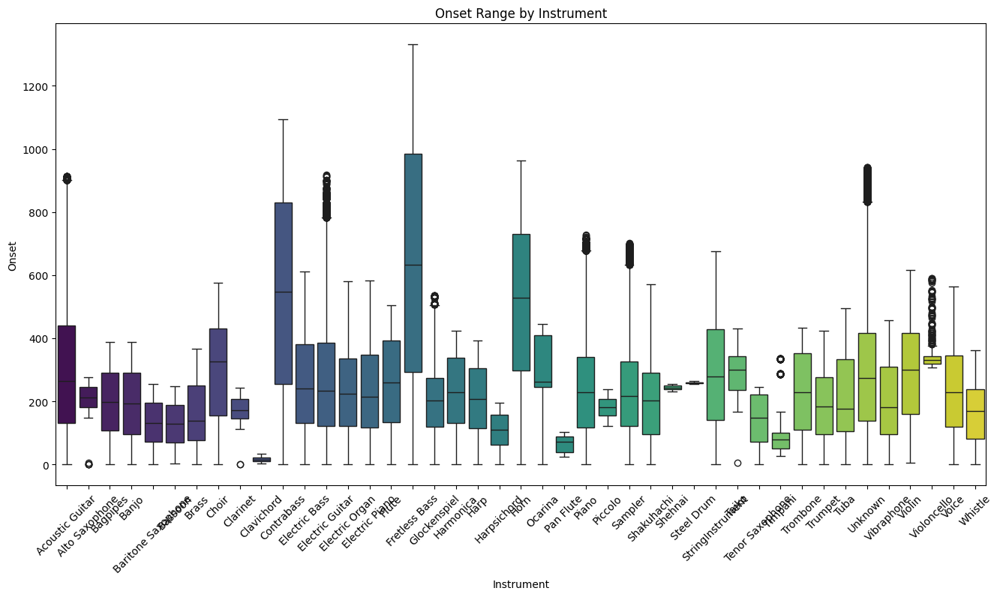

In [464]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df, x='instrument', y='onset', palette='viridis', order=alphabetic_order)
plt.xticks(rotation=45)
plt.title('Onset Range by Instrument')
plt.xlabel('Instrument')
plt.ylabel('Onset')
plt.show()

In [465]:
# Descriptive statistics of onset by instrument family
print("Onset statistics by Instrument Family:")
df.groupby('instrument_family')['onset'].describe()

Onset statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument_family,,,,,,,,
Bass,31939.0,430.096374,321.716241,0.0,172.750000,348.000,608.875000,1330.583333
Brass,37900.0,319.398342,234.288014,0.0,128.000000,274.000,427.250000,962.250000
Electronic,65980.0,243.717243,150.643712,0.0,126.000000,223.125,340.000000,701.000000
Guitar,186869.0,281.186996,201.159984,0.0,124.000000,241.500,392.000000,918.000000
Keyboard,168338.0,240.118055,149.208418,0.0,117.666667,224.000,340.000000,728.250000
Other,41407.0,274.921096,211.823584,0.0,115.041667,231.500,376.583333,941.750000
Percussion,20276.0,203.638090,114.518548,0.0,103.729167,202.000,290.562500,536.000000
Strings,28659.0,286.513518,177.946873,0.0,140.000000,273.500,407.000000,675.666667
Voice,28384.0,241.019838,143.962954,0.0,120.000000,229.250,345.250000,564.500000


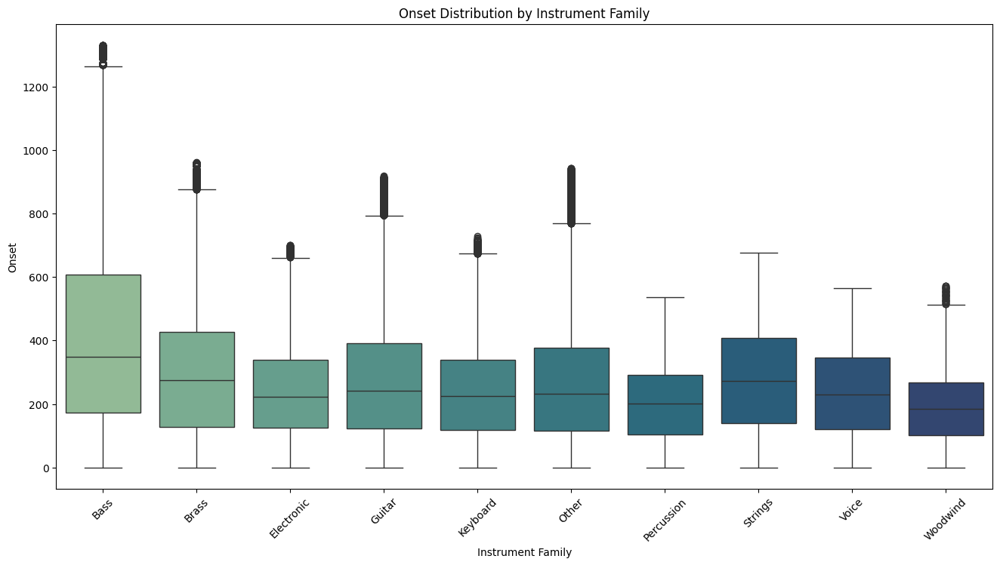

In [466]:
# Filter and plot onset distribution by instrument family
plt.figure(figsize=(16, 8))
sns.boxplot(data=df, x='instrument_family', y='onset', palette='crest', order=families)
plt.title('Onset Distribution by Instrument Family')
plt.xlabel('Instrument Family')
plt.ylabel('Onset')
plt.xticks(rotation=45)
plt.show()

In [467]:
# Descriptive statistics of onset by genre
print("Onset statistics by Genre:")
df.groupby('genre')['onset'].describe()

Onset statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,28830.0,204.768545,138.637662,0.0,98.000000,184.000000,278.000000,644.833333
blues,54451.0,292.686154,199.251052,0.0,136.000000,252.250000,418.500000,830.000000
classical,36582.0,410.340985,293.374440,0.0,147.416667,352.125000,645.250000,1094.750000
country,54072.0,231.945807,141.072839,0.0,117.250000,215.000000,329.250000,619.000000
dance,54471.0,346.734753,230.497518,0.0,162.500000,304.000000,484.625000,918.000000
disco,51138.0,291.849616,178.306690,0.0,143.416667,272.500000,434.000000,693.083333
heavy_metal,41747.0,319.724192,213.920985,0.0,152.916667,285.000000,440.500000,941.750000
jazz,33181.0,226.660235,151.712335,0.0,100.000000,202.333333,336.000000,728.250000
new_age,41925.0,279.651348,174.794333,0.0,140.000000,264.000000,372.750000,701.000000


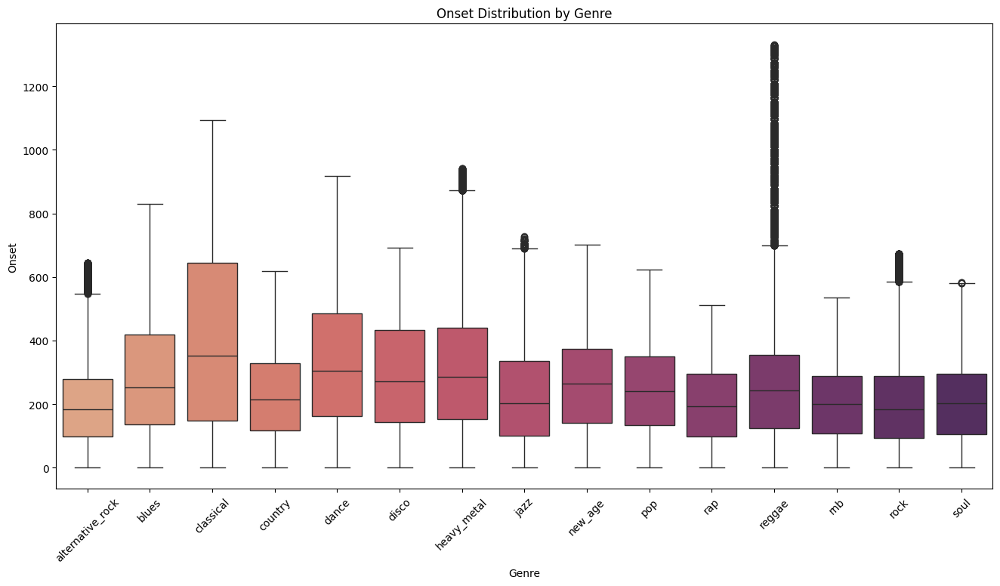

In [468]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df, x='genre', y='onset', palette='flare', order=genres_sorted)
plt.title('Onset Distribution by Genre')
plt.xlabel('Genre')
plt.ylabel('Onset')
plt.xticks(rotation=45)
plt.show()

##### 2.3.4.6. Temporal Segmentation of Musical Events by Genre, Instrument, and Instrument Family

In [469]:
# Function to assign section based on onset quantiles
def add_temporal_sections(dataframe, notes_only=False):
    """Add temporal_section based on onset quartiles"""
    valid_data = dataframe.dropna(subset=['onset'])
    if not notes_only:
        valid_data = valid_data[valid_data['is_rest'] == 0]
    
    # Compute quartiles on all events
    q1, q3 = valid_data["onset"].quantile([0.25, 0.75])
    
    def classify(onset):
        if pd.isna(onset):
            return np.nan
        elif onset <= q1:
            return "intro"
        elif onset <= q3:
            return "middle"
        else:
            return "late"
    
    if notes_only:
        dataframe["temporal_section"] = dataframe["onset"].apply(classify)
    else:
        dataframe["temporal_section"] = np.where(
            dataframe["is_rest"] == 0,
            dataframe["onset"].apply(classify),
            np.nan
        )

add_temporal_sections(df)
add_temporal_sections(df_notes_only, notes_only=True)

# Count and normalize per genre
genre_section_counts = df_notes_only.groupby(["genre", "temporal_section"]).size().unstack(fill_value=0)

# Reorder the columns explicitly
ordered_columns = ["intro", "middle", "late"]
genre_section_counts = genre_section_counts[ordered_columns]

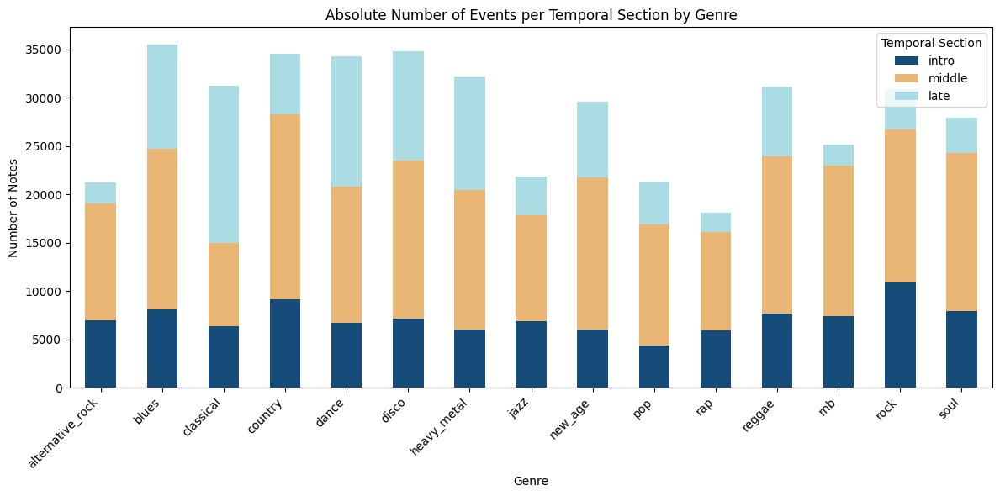

In [470]:
# Define color palette in the same order
colors = ["#154c79", "#eab676", "#abdbe3"]

# Plot stacked bar chart using absolute counts
genre_section_counts.plot(kind="bar", stacked=True, figsize=(12, 6), color=colors)

plt.title("Absolute Number of Events per Temporal Section by Genre")
plt.xlabel("Genre")
plt.ylabel("Number of Notes")
plt.legend(title="Temporal Section", loc="upper right")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

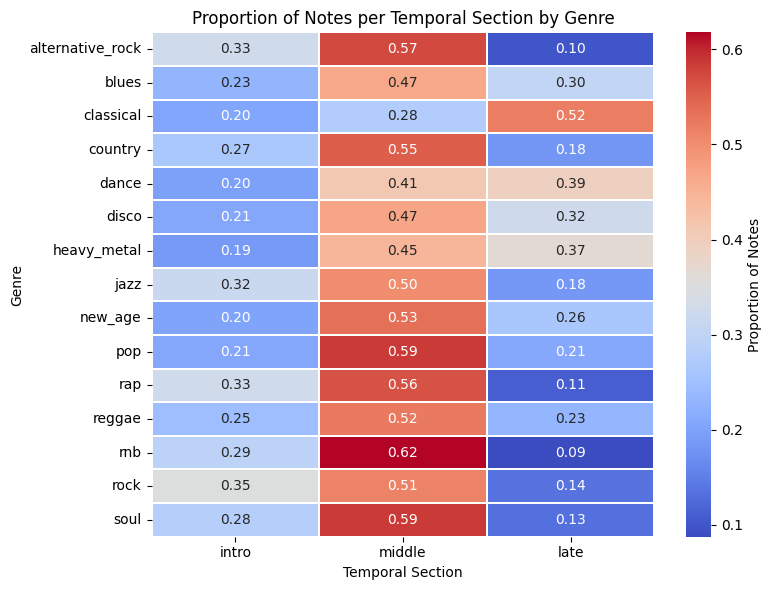

In [471]:
# Normalize to get proportions within each genre
genre_section_props = genre_section_counts.div(genre_section_counts.sum(axis=1), axis=0)

# Plot heatmap of proportions
plt.figure(figsize=(8, 6))
sns.heatmap(genre_section_props, annot=True, fmt=".2f", cmap="coolwarm", cbar_kws={'label': 'Proportion of Notes'}, linecolor='white', linewidths=0.2)
plt.title("Proportion of Notes per Temporal Section by Genre")
plt.xlabel("Temporal Section")
plt.ylabel("Genre")
plt.tight_layout()
plt.show()

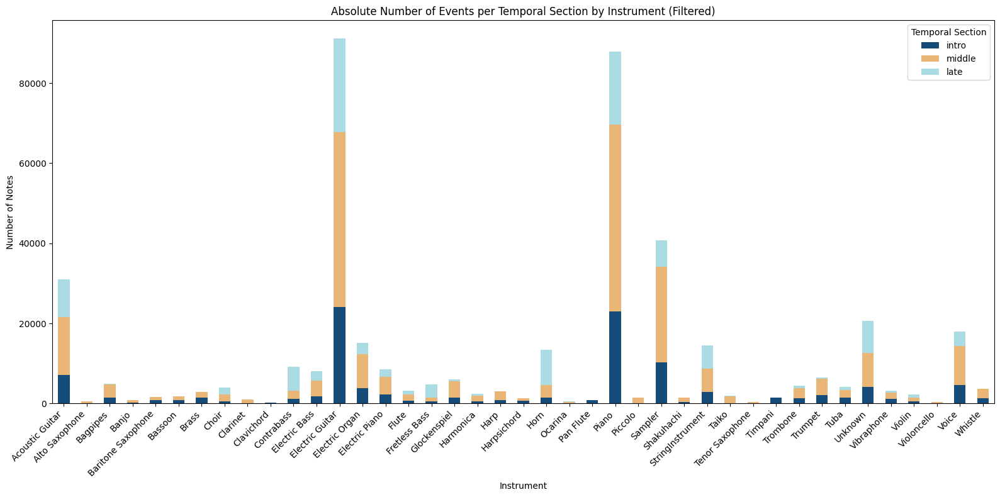

In [472]:
# Count raw number of note events per instrument and temporal section
instrument_section_counts = df_notes_only.groupby(['instrument', 'temporal_section']).size().unstack(fill_value=0)

# Filter instruments with a minimum number of total events to avoid clutter
min_total_events = 100
instrument_section_counts = instrument_section_counts[instrument_section_counts.sum(axis=1) >= min_total_events]

# Ensure consistent column order
instrument_section_counts = instrument_section_counts[ordered_columns].sort_index()

# Plot stacked bar chart using absolute counts
instrument_section_counts.plot(kind="bar", stacked=True, figsize=(16, 8), color=colors)

plt.title("Absolute Number of Events per Temporal Section by Instrument (Filtered)")
plt.xlabel("Instrument")
plt.ylabel("Number of Notes")
plt.xticks(rotation=45, ha="right")
plt.legend(title="Temporal Section", loc="upper right")
plt.tight_layout()
plt.show()

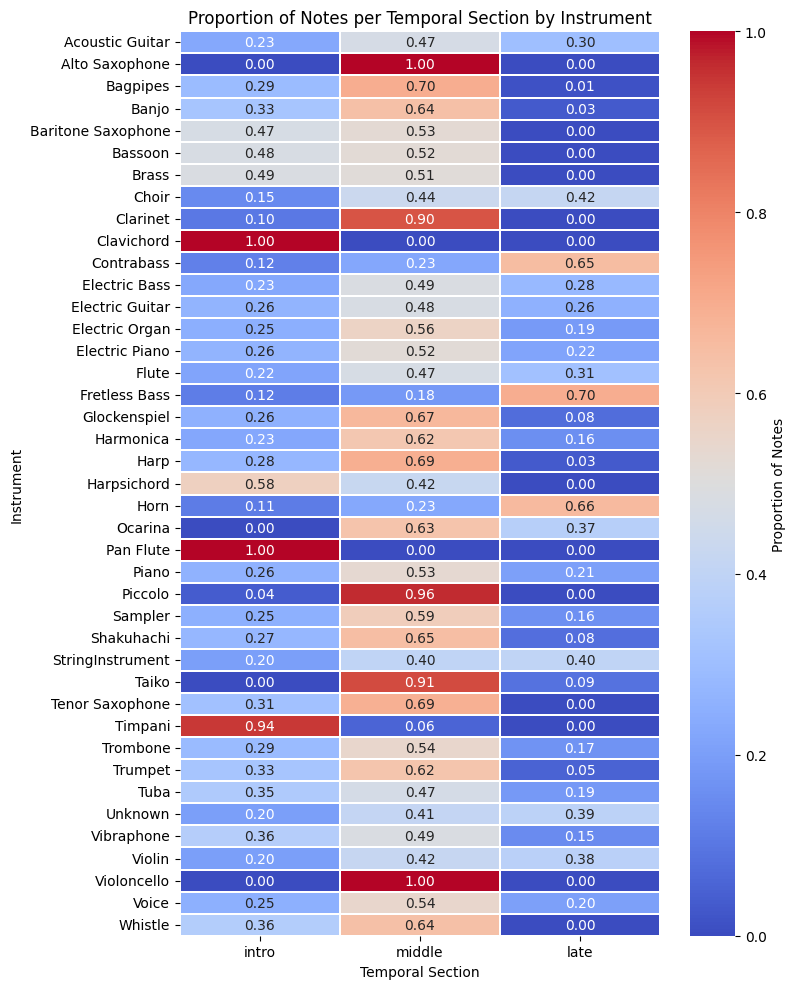

In [473]:
# Normalize to proportions
instrument_section_props = instrument_section_counts.div(instrument_section_counts.sum(axis=1), axis=0)

# Plot heatmap
plt.figure(figsize=(8, 10))
sns.heatmap(instrument_section_props, annot=True, fmt=".2f", cmap="coolwarm", cbar_kws={'label': 'Proportion of Notes'}, linecolor='white', linewidths=0.2)

plt.title("Proportion of Notes per Temporal Section by Instrument")
plt.xlabel("Temporal Section")
plt.ylabel("Instrument")
plt.tight_layout()
plt.show()

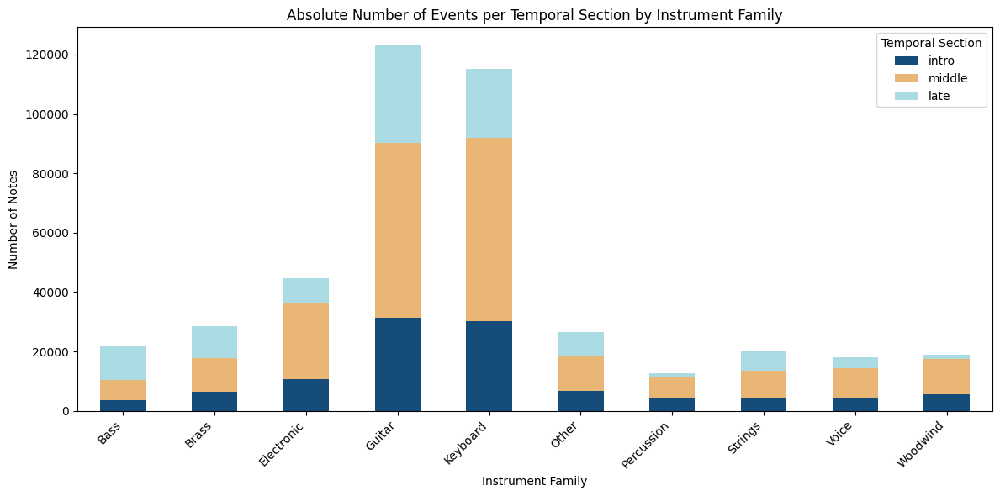

In [474]:
# Count raw number of note events per instrument family and temporal section (exclude rests)
family_section_counts = df_notes_only.groupby(['instrument_family', 'temporal_section']).size().unstack(fill_value=0)

# Ensure consistent column order
family_section_counts = family_section_counts[ordered_columns]

# Plot stacked bar chart using absolute counts
family_section_counts.plot(kind="bar", stacked=True, figsize=(12, 6), color=colors)

plt.title("Absolute Number of Events per Temporal Section by Instrument Family")
plt.xlabel("Instrument Family")
plt.ylabel("Number of Notes")
plt.legend(title="Temporal Section", loc="upper right")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

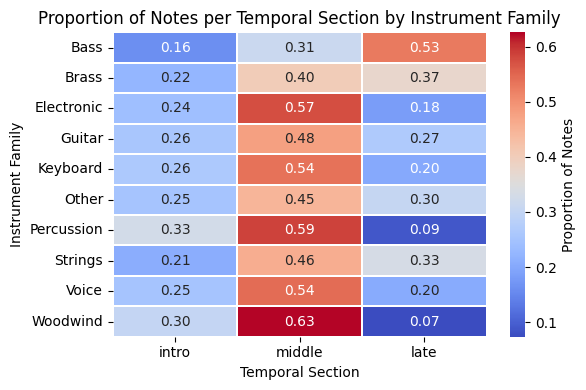

In [475]:
# Normalize to proportions
family_section_props = family_section_counts.div(family_section_counts.sum(axis=1), axis=0)

# Plot heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(family_section_props, annot=True, fmt=".2f", cmap="coolwarm", cbar_kws={'label': 'Proportion of Notes'}, linecolor='white', linewidths=0.2)

plt.title("Proportion of Notes per Temporal Section by Instrument Family")
plt.xlabel("Temporal Section")
plt.ylabel("Instrument Family")
plt.tight_layout()
plt.show()

##### Key Findings For The Onset Feature 
The onset feature shows a strongly right-skewed distribution, with dense clustering of early events (mode at 24) and a long tail of later onsets, reflecting typical musical structures. Nearly all pieces (97.5%) begin at onset = 0, while three pieces start at 0.25, which were confirmed as genuine anacruses rather than extraction errors. This high coherence ensures consistent rhythmic anchoring across the dataset, with only minimal but musically meaningful variation. Rhythmic quantization is perfect, with events aligning exactly to a 1/12 grid, and the distribution of subdivisions is both realistic and stylistically rich: beats dominate (38.5%), followed by halves (21.4%) and dotted rhythms (14.9%), with triplets well represented but less frequent. Most pieces employ a wide range of rhythmic values (≥ 8 subdivisions in 75% of cases), and a quarter of them use all 12, indicating high rhythmic complexity. These properties make onset a robust and musically informative feature for TDA, where both early-event clustering and rhythmic diversity are expected to yield distinctive topological patterns.

---

#### 2.3.5 Duration

##### 2.3.5.1 Central Tendency and Spread of Duration


In [476]:
df['duration'].describe()

count    638779.000000
mean          0.823764
std           1.044919
min           0.000000
25%           0.250000
50%           0.500000
75%           0.750000
max          55.000000
Name: duration, dtype: float64

In [477]:
# Descriptive stats: proportion and spread of duration values for actual notes only
df_notes_only['duration'].describe()

count    429898.000000
mean          0.701894
std           0.863409
min           0.000000
25%           0.250000
50%           0.500000
75%           0.666667
max          55.000000
Name: duration, dtype: float64

In [478]:
# Verify extreme values
print(df_notes_only[df_notes_only['duration'] > 50][['filename', 'instrument']])

                       filename instrument
333375  Fantaisie impromptu.mid      Piano


In [479]:
# Check for non-positive durations
null_duration = df_notes_only[df_notes_only['duration'] <= 0]

print(f"Non-positive durations found: {len(null_duration)}")
print(f"Unique values: {null_duration['duration'].unique()}")

if len(null_duration) > 0:
    print(f"\nDetails:")
    print(null_duration[['filename', 'genre', 'duration', 'pitch', 'onset']])
    print(f"\nBy genre: {null_duration['genre'].value_counts().to_dict()}")
    print(f"By file: {null_duration['filename'].value_counts().to_dict()}")

Non-positive durations found: 10
Unique values: [0.]

Details:
                     filename  genre  duration  pitch       onset
98557   Rivers Of Babylon.mid  disco       0.0     40  192.666667
474172  Can't Help Myself.mid   soul       0.0     64   68.500000
474324  Can't Help Myself.mid   soul       0.0     55   81.500000
474557  Can't Help Myself.mid   soul       0.0     64  100.750000
475036  Can't Help Myself.mid   soul       0.0     52  137.250000
475091  Can't Help Myself.mid   soul       0.0     52  141.500000
475128  Can't Help Myself.mid   soul       0.0     52  144.500000
475387  Can't Help Myself.mid   soul       0.0     67  168.500000
475807  Can't Help Myself.mid   soul       0.0     69  203.000000
475993  Can't Help Myself.mid   soul       0.0     67  219.500000

By genre: {'soul': 9, 'disco': 1}
By file: {"Can't Help Myself.mid": 9, 'Rivers Of Babylon.mid': 1}


In [480]:
# Check whether these zeros are MIDI artifacts or real music
print(f"\n1. Same instrument pattern:")
print(null_duration['instrument'].value_counts())

print(f"\n2. Abnormally high velocity (artifacts):")
print(f"Ghost notes velocity: {null_duration['velocity'].mean():.1f}")
print(f"Normal notes velocity: {df_notes_only[df_notes_only['duration'] > 0]['velocity'].mean():.1f}")

print(f"\n3. Proof of duplicates - Same pitch/time patterns:")
for _, row in null_duration.head(3).iterrows():
    # Find nearby notes with same pitch in same file
    same_file = df_notes_only[df_notes_only['filename'] == row['filename']]
    same_pitch_nearby = same_file[
        (same_file['pitch'] == row['pitch']) & 
        (abs(same_file['onset'] - row['onset']) < 0.5) &
        (same_file['duration'] > 0)
    ]
    print(f"Ghost: pitch {row['pitch']} at {row['onset']:.2f} -> Normal duplicates: {len(same_pitch_nearby)}")

print(f"\nThese are MIDI artifacts (duplicates/triggers), not real musical notes")
print(f"Safe to filter: Only {len(null_duration)}/{len(df_notes_only)} ({100*len(null_duration)/len(df_notes_only):.3f}%)")


1. Same instrument pattern:
instrument
Baritone Saxophone    9
Sampler               1
Name: count, dtype: int64

2. Abnormally high velocity (artifacts):
Ghost notes velocity: 108.4
Normal notes velocity: 91.5

3. Proof of duplicates - Same pitch/time patterns:
Ghost: pitch 40 at 192.67 -> Normal duplicates: 2
Ghost: pitch 64 at 68.50 -> Normal duplicates: 0
Ghost: pitch 55 at 81.50 -> Normal duplicates: 0

These are MIDI artifacts (duplicates/triggers), not real musical notes
Safe to filter: Only 10/429898 (0.002%)


In [481]:
# Data Engineering
df = df[df['duration'] > 0]
df_notes_only = df_notes_only[df_notes_only['duration'] > 0 ]

In [482]:
# Central tendency
mean_duration = df_notes_only['duration'].mean()
median_duration = df_notes_only['duration'].median()
mode_duration = df_notes_only['duration'].mode()[0]  

# Spread
std_duration = df_notes_only['duration'].std()

# Display results
print(f"Mean duration: {mean_duration:.2f}")
print(f"Median duration: {median_duration:.2f}")
print(f"Mode duration: {mode_duration:.2f}")
print(f"Standard deviation: {std_duration:.2f}")

Mean duration: 0.70
Median duration: 0.50
Mode duration: 0.25
Standard deviation: 0.86


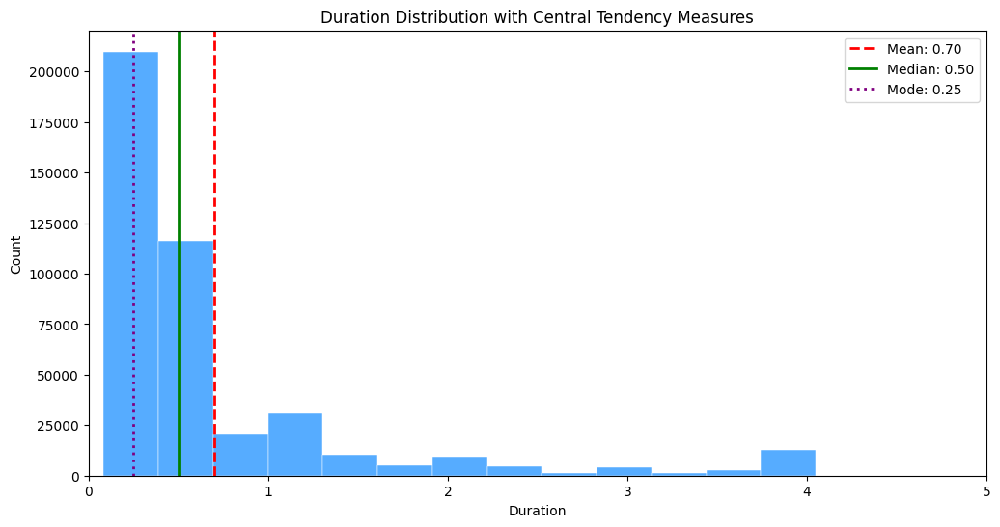

In [483]:
plt.figure(figsize=(12, 6))
sns.histplot(df_notes_only['duration'], bins=180, color='dodgerblue', edgecolor='white')

# Add lines for mean, median, and mode
plt.axvline(mean_duration, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_duration:.2f}')
plt.axvline(median_duration, color='green', linestyle='-', linewidth=2, label=f'Median: {median_duration:.2f}')
plt.axvline(mode_duration, color='purple', linestyle=':', linewidth=2, label=f'Mode: {mode_duration:.2f}')

plt.title('Duration Distribution with Central Tendency Measures')
plt.xlabel('Duration')
plt.ylabel('Count')
plt.xlim(0, 5)  
plt.legend()
plt.show()

##### 2.3.5.2 Outlier Detection in Duration Values

In [484]:
# Determine thresholds for outliers
df_notes_only['duration'].quantile([0.95, 0.99])

0.95    3.0
0.99    4.0
Name: duration, dtype: float64

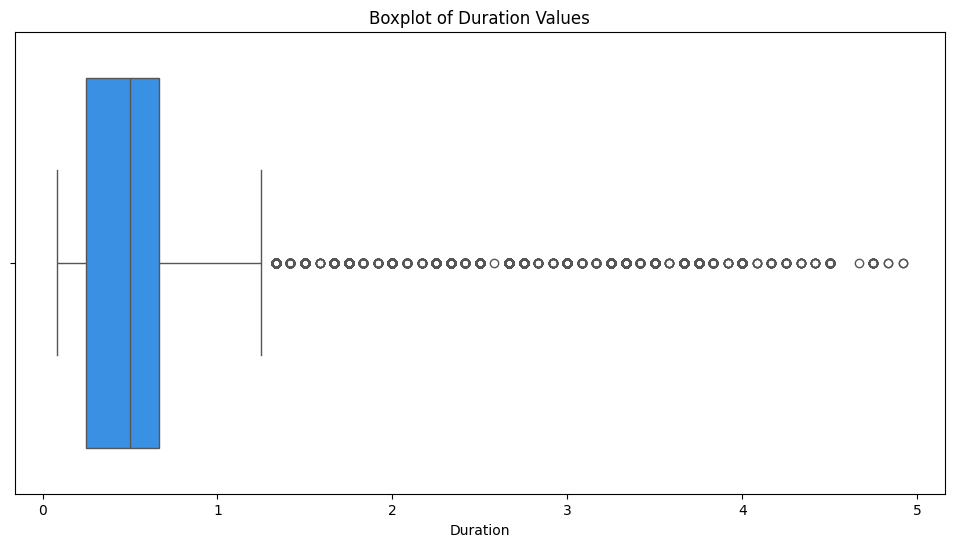

In [485]:
# Filter outlier for better visualization
df_filtered = df_notes_only[df_notes_only['duration'] < 5]

plt.figure(figsize=(12, 6))
sns.boxplot(x=df_filtered['duration'], color='dodgerblue')
plt.title('Boxplot of Duration Values')
plt.xlabel('Duration')
plt.show()

##### 2.3.5.3 Duration in Context: Key, Instrument, and Genre

In [486]:
# Descriptive statistics of duration values by key
print("Duration statistics by Key:")
df_filtered.groupby('key')['duration'].describe().sort_index()

Duration statistics by Key:


,count,mean,std,min,25%,50%,75%,max
key,,,,,,,,
0,37489.0,0.802804,0.808038,0.083333,0.250000,0.500000,1.000000,4.916667
1,11535.0,0.529403,0.491219,0.083333,0.250000,0.500000,0.500000,4.000000
2,28421.0,0.732205,1.017416,0.083333,0.250000,0.250000,0.500000,4.000000
3,19692.0,0.694478,0.737954,0.083333,0.250000,0.500000,0.750000,4.750000
4,8342.0,0.624131,0.634311,0.166667,0.250000,0.500000,0.500000,4.000000
5,43794.0,0.599664,0.706875,0.083333,0.250000,0.333333,0.500000,4.500000
6,7151.0,1.081376,1.123983,0.166667,0.500000,0.500000,1.000000,4.500000
7,38130.0,0.721774,0.818683,0.083333,0.250000,0.500000,0.666667,4.166667
8,2709.0,0.651901,0.721434,0.083333,0.250000,0.333333,0.666667,4.250000


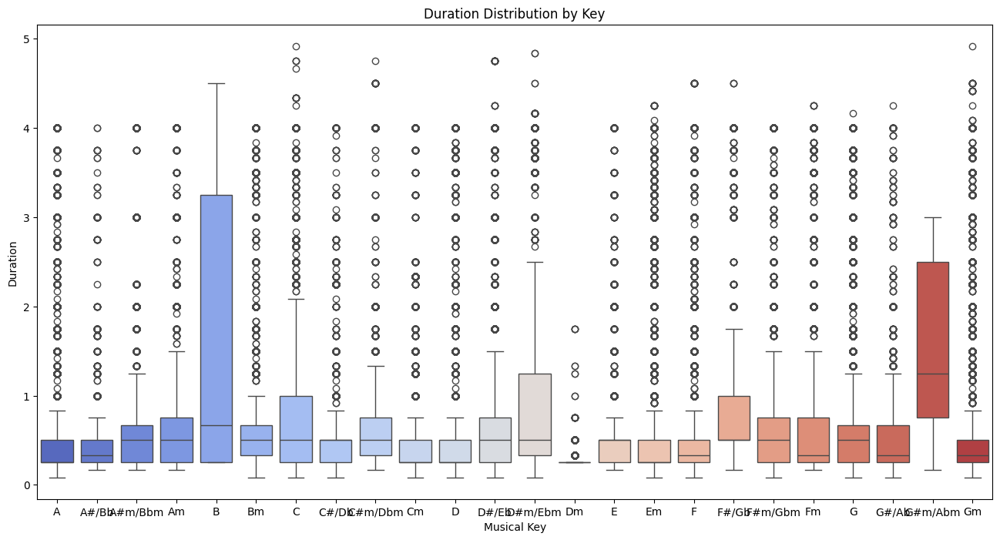

In [487]:
# Duration distribution across keys to show tonal variation
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_filtered, x='key_name', y='duration', order=ordered_key_names, palette='coolwarm')
plt.title('Duration Distribution by Key')
plt.xlabel('Musical Key')
plt.ylabel('Duration')
plt.show()


In [488]:
# Descriptive statistics of duration values by instrument
print("Duration statistics by Instrument:")
df_filtered.groupby('instrument')['duration'].describe()

Duration statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Acoustic Guitar,31059.0,0.621012,0.792277,0.083333,0.250000,0.333333,0.500000,4.000000
Alto Saxophone,505.0,1.254455,1.352569,0.166667,0.416667,0.500000,2.000000,4.000000
Bagpipes,4865.0,0.659010,0.579692,0.166667,0.500000,0.500000,0.500000,4.000000
Banjo,872.0,0.486334,0.174462,0.250000,0.333333,0.500000,0.666667,0.750000
Baritone Saxophone,1609.0,0.763311,0.690888,0.166667,0.250000,0.500000,1.000000,4.000000
Bassoon,1729.0,0.726190,0.588337,0.250000,0.500000,0.500000,0.750000,3.000000
Brass,2925.0,0.765014,0.692706,0.250000,0.333333,0.500000,0.750000,4.916667
Choir,3969.0,1.664945,1.530744,0.166667,0.250000,1.000000,3.500000,4.000000
Clarinet,998.0,0.583667,0.585592,0.250000,0.250000,0.500000,0.500000,4.000000


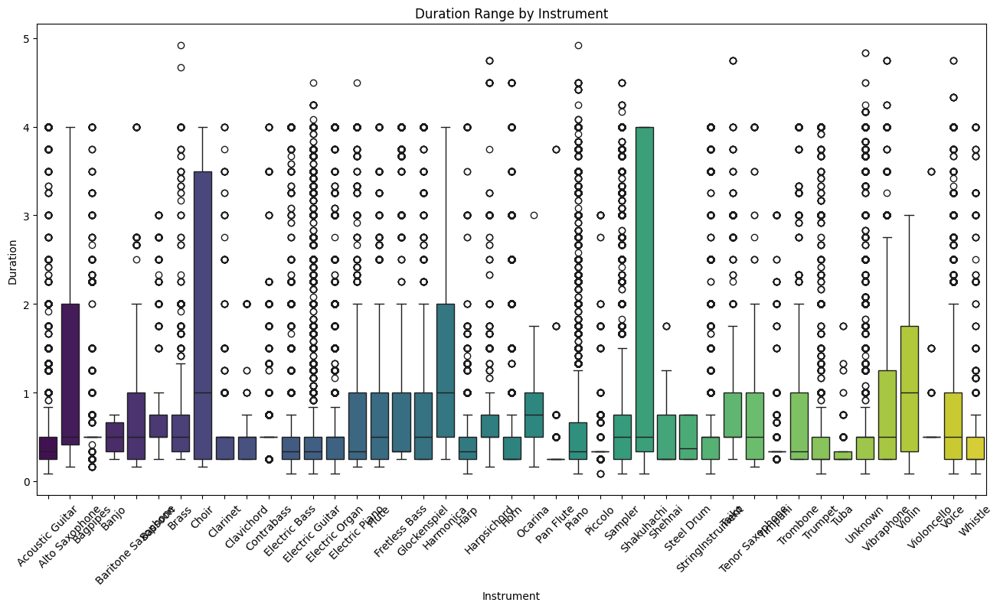

In [489]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_filtered, x='instrument', y='duration', palette='viridis', order=alphabetic_order)
plt.xticks(rotation=45)
plt.title('Duration Range by Instrument')
plt.xlabel('Instrument')
plt.ylabel('Duration')
plt.show()

In [490]:
# Descriptive statistics of duration by instrument family
print("Duration statistics by Instrument Family:")
df_filtered.groupby('instrument_family')['duration'].describe()

Duration statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument_family,,,,,,,,
Bass,21916.0,0.667735,0.743891,0.083333,0.25,0.500000,0.500000,4.000000
Brass,28558.0,0.580526,0.683950,0.083333,0.25,0.250000,0.500000,4.500000
Electronic,44619.0,0.899975,1.039511,0.083333,0.25,0.500000,1.000000,4.500000
Guitar,122947.0,0.632624,0.773358,0.083333,0.25,0.333333,0.500000,4.500000
Keyboard,115083.0,0.675328,0.776459,0.083333,0.25,0.333333,0.666667,4.916667
Other,26417.0,0.692124,0.794976,0.083333,0.25,0.500000,0.666667,4.916667
Percussion,12547.0,0.834310,0.937471,0.250000,0.25,0.500000,1.000000,4.750000
Strings,20310.0,0.665173,0.736544,0.083333,0.25,0.500000,0.500000,4.000000
Voice,18007.0,0.788485,0.784271,0.083333,0.25,0.500000,1.000000,4.750000


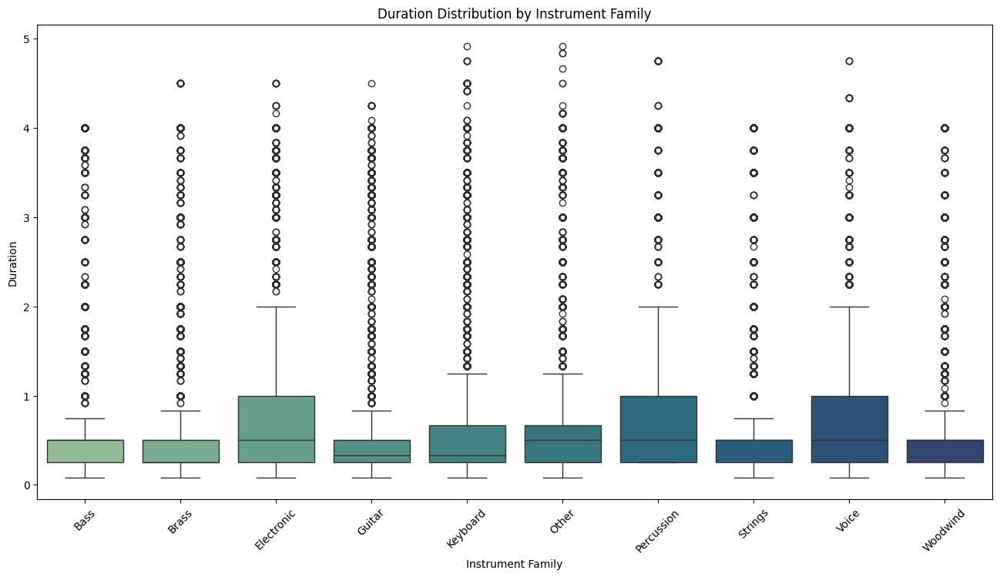

In [491]:
# Filter and plot duration distribution by instrument family
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_filtered, x='instrument_family', y='duration', palette='crest', order=families)
plt.title('Duration Distribution by Instrument Family')
plt.xlabel('Instrument Family')
plt.ylabel('Duration')
plt.xticks(rotation=45)
plt.show()

In [492]:
# Descriptive statistics of duration by genre
print("Duration statistics by Genre:")
df_filtered.groupby('genre')['duration'].describe()

Duration statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,21153.0,0.823520,0.933594,0.083333,0.250000,0.500000,0.750000,4.250000
blues,35480.0,0.570317,0.570576,0.083333,0.250000,0.333333,0.666667,4.750000
classical,31205.0,0.554609,0.548844,0.083333,0.250000,0.500000,0.500000,4.750000
country,34549.0,0.727788,0.772060,0.083333,0.250000,0.500000,0.750000,4.500000
dance,34212.0,0.598048,0.750815,0.166667,0.250000,0.500000,0.500000,4.000000
disco,34711.0,0.728876,1.009202,0.083333,0.250000,0.250000,0.500000,4.833333
heavy_metal,32222.0,0.757929,0.772895,0.083333,0.250000,0.500000,1.000000,4.250000
jazz,21803.0,0.761726,0.765622,0.083333,0.250000,0.500000,1.000000,4.916667
new_age,29406.0,0.945635,1.133460,0.083333,0.333333,0.500000,1.000000,4.750000


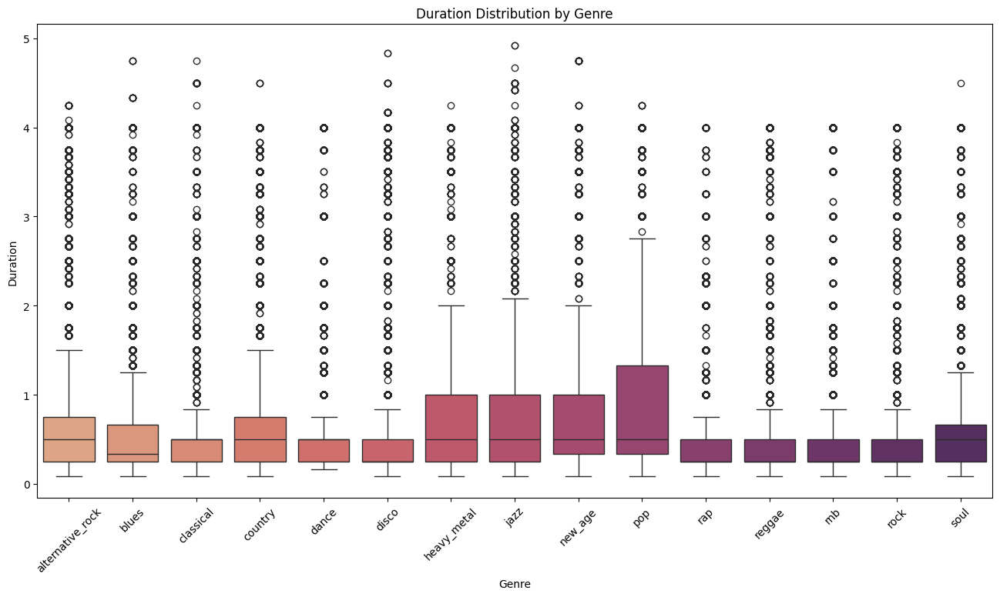

In [493]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_filtered, x='genre', y='duration', palette='flare', order=genres_sorted)
plt.title('Duration Distribution by Genre')
plt.xlabel('Genre')
plt.ylabel('Duration')
plt.xticks(rotation=45)
plt.show()

##### 2.3.5.4 Metric Weight vs Note Duration

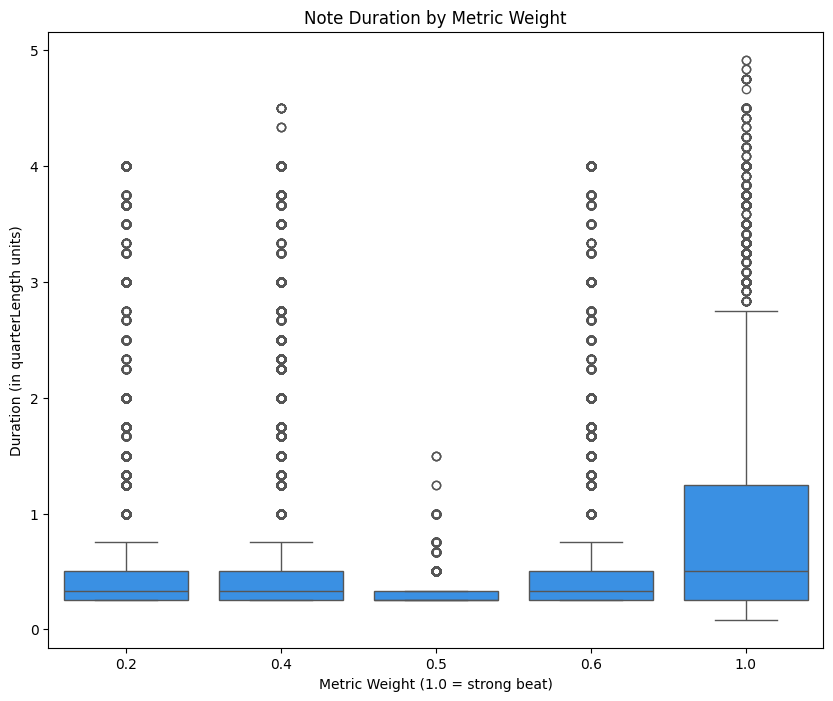

In [494]:
# Set the figure size
plt.figure(figsize=(10, 8))

# Create a boxplot showing how note duration varies with metric weight
sns.boxplot(data=df_filtered, x="metric_weight", y="duration", color='dodgerblue')

# Add a descriptive title and axis labels
plt.title("Note Duration by Metric Weight")
plt.xlabel("Metric Weight (1.0 = strong beat)")
plt.ylabel("Duration (in quarterLength units)")
plt.show()

##### 2.3.5.5 Average Note Duration by Polyphony and Metric Weight

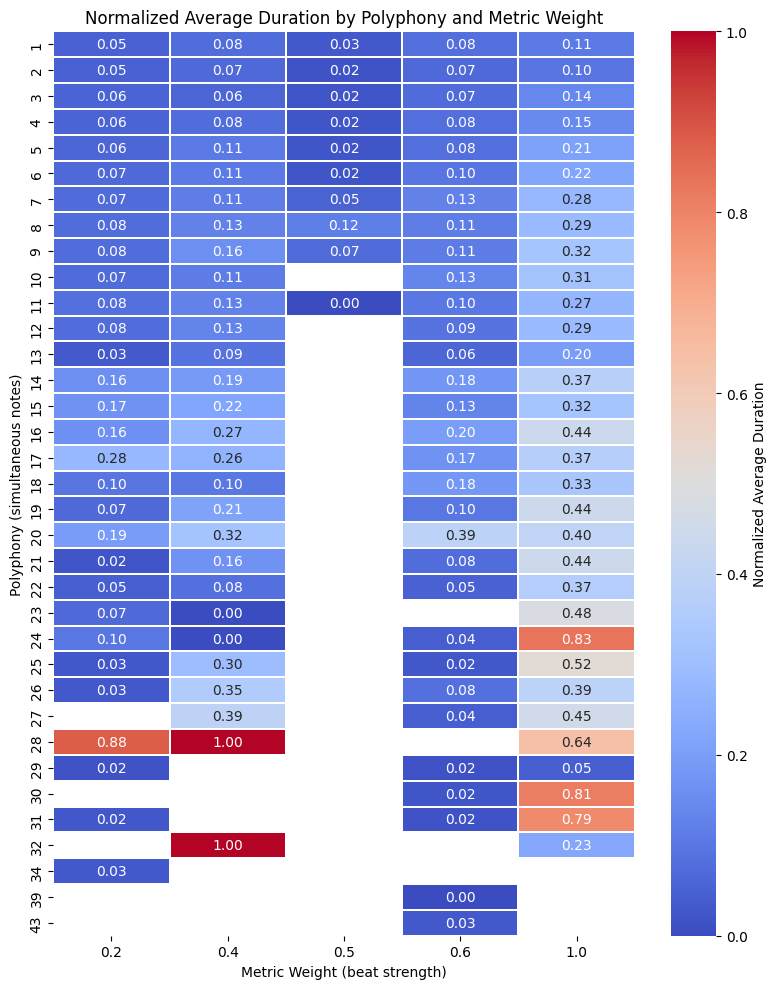

In [495]:
# Create the pivot table
pivot = df_filtered.pivot_table(
    values="duration",
    index="polyphony_notes",
    columns="metric_weight",
    aggfunc="mean"
)

# Apply global min-max normalization
normalized_pivot = (pivot - pivot.min().min()) / (pivot.max().max() - pivot.min().min())

# Plot the heatmap
fig, ax = plt.subplots(figsize=(8, 10))
sns.heatmap(normalized_pivot, cmap='coolwarm', annot=True, fmt=".2f", ax=ax, linewidths=0.2, cbar_kws={"label": "Normalized Average Duration"})

# Add title and labels
plt.title("Normalized Average Duration by Polyphony and Metric Weight")
plt.xlabel("Metric Weight (beat strength)")
plt.ylabel("Polyphony (simultaneous notes)")
plt.tight_layout()
plt.show()

##### Key Findings For The Duration Feature
The duration feature shows meaningful rhythmic variation across the corpus, with clear genre-specific patterns and a few important edge cases. Removing silences (32% of events) reduced the average duration (0.82 → 0.70) and variance, while preserving the overall rhythmic structure. An extreme maximum value of 55 units, found in Chopin’s Fantaisie-Impromptu, was validated as musically authentic and retained, as such long sustained notes are characteristic of his style and enrich the feature space. Genres with short median durations (dance, rap, reggae, blues) contrast sharply with those with longer ones (classical, jazz, pop), suggesting strong topological separability in TDA. Jazz and classical display high variability, reflecting improvisation and ornamentation, while dance/rap are rhythmically uniform, consistent with their repetitive structures. A small set of zero-duration “ghost notes” was identified as MIDI artifacts and filtered out to prevent bias. Overall, duration provides both robust clustering potential and stylistic insights that are highly valuable for topological analysis.

---

#### 2.3.6 Melodic Motion: Interval Between Consecutive Notes (in Semitones)

##### 2.3.6.1 Central Tendency and Spread of Interval Between Consecutive Notes (in Semitones)

In [496]:
# Descriptive stats: proportion and spread of intervals between consecutive notes
df['interval_to_prev'].describe()

count    638769.000000
mean          9.928492
std          12.356700
min           0.000000
25%           0.000000
50%           5.000000
75%          17.000000
max          72.000000
Name: interval_to_prev, dtype: float64

In [497]:
# Descriptive stats: proportion and spread of intervals between actual notes only
df_notes_only['interval_to_prev'].describe()

count    429888.000000
mean         14.752710
std          12.478314
min           0.000000
25%           4.000000
50%          12.000000
75%          24.000000
max          72.000000
Name: interval_to_prev, dtype: float64

In [498]:
# Central tendency
mean_interval_to_prev = df_notes_only['interval_to_prev'].mean()
median_interval_to_prev = df_notes_only['interval_to_prev'].median()
mode_interval_to_prev = df_notes_only['interval_to_prev'].mode()[0]  

# Spread
std_interval_to_prev = df_notes_only['interval_to_prev'].std()

# Display results
print(f"Mean interval between consecutive notes: {mean_interval_to_prev:.2f}")
print(f"Median interval between consecutive notes: {median_interval_to_prev:.2f}")
print(f"Mode interval between consecutive notes: {mode_interval_to_prev:.2f}")
print(f"Standard deviation of intervals between consecutive notes: {std_interval_to_prev:.2f}")

Mean interval between consecutive notes: 14.75
Median interval between consecutive notes: 12.00
Mode interval between consecutive notes: 0.00
Standard deviation of intervals between consecutive notes: 12.48


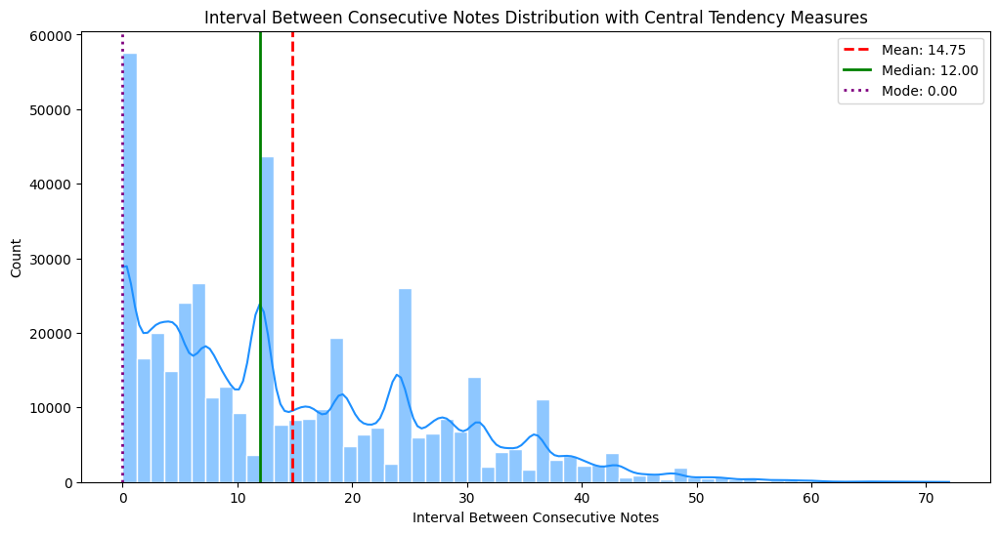

In [499]:
plt.figure(figsize=(12, 6))
sns.histplot(df_notes_only['interval_to_prev'], bins=60, kde=True, color='dodgerblue', edgecolor='white')

# Add lines for mean, median, and mode
plt.axvline(mean_interval_to_prev, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_interval_to_prev:.2f}')
plt.axvline(median_interval_to_prev, color='green', linestyle='-', linewidth=2, label=f'Median: {median_interval_to_prev:.2f}')
plt.axvline(mode_interval_to_prev, color='purple', linestyle=':', linewidth=2, label=f'Mode: {mode_interval_to_prev:.2f}')

plt.title('Interval Between Consecutive Notes Distribution with Central Tendency Measures')
plt.xlabel('Interval Between Consecutive Notes')
plt.ylabel('Count')
plt.legend()
plt.show()

In [500]:
# Identifying Extreme Melodic Leaps

# Count the number of intervals greater than 2 octaves (i.e., > 24 semitones), which may indicate abrupt jumps or anomalies
extreme_intervals = df_notes_only[df_notes_only['interval_to_prev'] > 24].copy()

print(f"Number of intervals > 24 semitones: {len(extreme_intervals)}")
print("\n Top 20 Most Extreme Intervals")
top_extreme = extreme_intervals.nlargest(20, 'interval_to_prev')[
    ['filename', 'genre', 'interval_to_prev', 'pitch']
]
print(top_extreme)

print("\n Distribution By Genre")
genre_counts = extreme_intervals['genre'].value_counts()
print(genre_counts)

print("\n Distribution By Piece")
piece_counts = extreme_intervals['filename'].value_counts().head(10)
print(piece_counts)

print("\n Extreme Intervals Statistics")
print(extreme_intervals['interval_to_prev'].describe())

# Context verification: examine consecutive notes for a few cases
print("\n Context Examples (first 5 cases)")
for idx in extreme_intervals.index[:5]:
    # Get a few notes before and after
    context = df_notes_only.loc[max(0, idx-2):idx+2, ['pitch', 'interval_to_prev', 'filename']]
    print(f"\nPiece: {df_notes_only.loc[idx, 'filename']}")
    print(f"Extreme interval: {df_notes_only.loc[idx, 'interval_to_prev']} semitones")
    print("Context:")
    print(context)
    print("-" * 50)

Number of intervals > 24 semitones: 90288

 Top 20 Most Extreme Intervals
                            filename    genre  interval_to_prev  pitch
357757                      Down.mid     rock                72    103
402826       Return to Innocence.mid  new_age                72    100
402825       Return to Innocence.mid  new_age                71     99
637746  I Only Have Eyes For You.mid     jazz                71     36
402824       Return to Innocence.mid  new_age                70     98
26976        Say You'll Be There.mid      pop                69     20
27825        Say You'll Be There.mid      pop                69     20
108302                  Le Freak.mid    disco                69     31
162255        Basin Street Blues.mid    blues                69     22
86660           Magnolia forever.mid    disco                68     26
162263        Basin Street Blues.mid    blues                68     23
449078        Get Ready for This.mid    dance                68     23
449

In [501]:
# Comparison of intervals by genre to validate if dance/disco are really different

# Percentage of intervals >24 by genre
print("Percentage of Intervals >24 By Genre")
genre_stats = []
for genre in df['genre'].unique():
    genre_data = df[df['genre'] == genre]
    total_intervals = len(genre_data)
    extreme_intervals = len(genre_data[genre_data['interval_to_prev'] > 24])
    percentage = (extreme_intervals / total_intervals) * 100
    genre_stats.append({
        'genre': genre,
        'total': total_intervals,
        'extreme': extreme_intervals,
        'percentage': percentage
    })

genre_df = pd.DataFrame(genre_stats).sort_values('percentage', ascending=False)
print(genre_df)

# Detailed statistics by genre
print("\n Median and Mean of Intervals By Genre")
interval_by_genre = df.groupby('genre')['interval_to_prev'].agg(['mean', 'median', 'std', 'max']).round(2)
interval_by_genre = interval_by_genre.sort_values('median', ascending=False)
print(interval_by_genre)

# Focus on electronic vs acoustic genres
print("\n Comparison Electronic vs. Acoustic Genres")
electronic_genres = ['dance', 'disco', 'new_age', 'rnb', 'rap']
acoustic_genres = ['classical', 'blues', 'country', 'jazz']

for category, genres in [('Electronic', electronic_genres), ('Acoustic', acoustic_genres)]:
    data = df[df['genre'].isin(genres)]
    total = len(data)
    extreme = len(data[data['interval_to_prev'] > 24])
    pct = (extreme / total) * 100
    median = data['interval_to_prev'].median()
    print(f"{category}: {extreme}/{total} ({pct:.1f}%) - median: {median}")

# Specific test: genres with the most intervals >36 and >48
print("\n Genres With More Large Jumps")
for threshold in [36, 48]:
    print(f"\nIntervals >{threshold} semitones:")
    extreme_by_genre = df[df['interval_to_prev'] > threshold].groupby('genre').size().sort_values(ascending=False)
    print(extreme_by_genre.head(8))

Percentage of Intervals >24 By Genre
               genre  total  extreme  percentage
5                rnb  37920     6712   17.700422
6             reggae  46331     8109   17.502320
2              disco  51137     8482   16.586816
11              soul  45599     7526   16.504748
10             dance  54471     8767   16.094803
0                pop  37118     5595   15.073549
1        heavy_metal  41747     6221   14.901670
4   alternative_rock  28830     4155   14.412071
7          classical  36582     5152   14.083429
3              blues  54451     7262   13.336761
13               rap  32462     4071   12.540817
12           country  54072     6417   11.867510
14              jazz  33181     3908   11.777825
9            new_age  41925     4533   10.812165
8               rock  42943     3378    7.866241

 Median and Mean of Intervals By Genre
                   mean  median    std  max
genre                                      
classical         11.39     8.0  11.86   65
heavy_m

##### 2.3.6.2 Outlier Detection in Intervals Between Consecutive Notes (in Semitones)


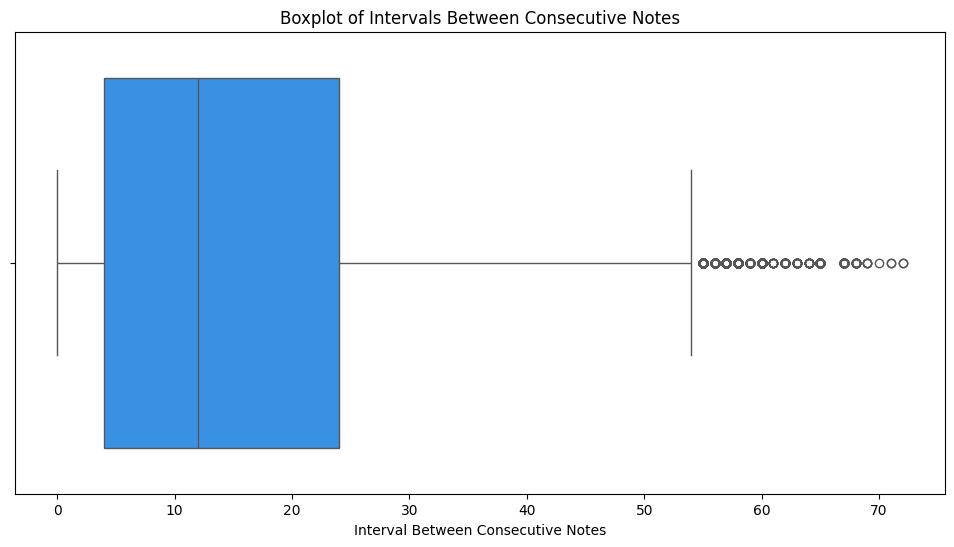

In [502]:
plt.figure(figsize=(12, 6))
sns.boxplot(x=df_notes_only['interval_to_prev'], color='dodgerblue')
plt.title('Boxplot of Intervals Between Consecutive Notes')
plt.xlabel('Interval Between Consecutive Notes')
plt.show()

##### 2.3.6.3 Interval Between Consecutive Notes in Context: Key, Instrument, and Genre

In [503]:
# Descriptive statistics of intervals between consecutive notes by key
print("Interval Between Consecutive Notes statistics by Key:")
df_notes_only.groupby('key')['interval_to_prev'].describe().sort_index()

Interval Between Consecutive Notes statistics by Key:


,count,mean,std,min,25%,50%,75%,max
key,,,,,,,,
0,37533.0,15.774998,12.962368,0.0,5.0,12.0,25.0,71.0
1,11542.0,15.826980,12.656142,0.0,5.0,12.0,25.0,60.0
2,28424.0,15.960491,12.735354,0.0,5.0,12.0,25.0,60.0
3,19869.0,14.954854,12.153539,0.0,4.0,12.0,24.0,62.0
4,8342.0,13.465955,12.800583,0.0,3.0,9.0,24.0,56.0
5,43881.0,15.083407,12.563716,0.0,4.0,12.0,24.0,72.0
6,7158.0,16.614138,13.718523,0.0,5.0,13.0,24.0,69.0
7,38144.0,12.848128,10.838037,0.0,4.0,12.0,20.0,55.0
8,2710.0,13.829151,10.882063,0.0,5.0,12.0,21.0,51.0


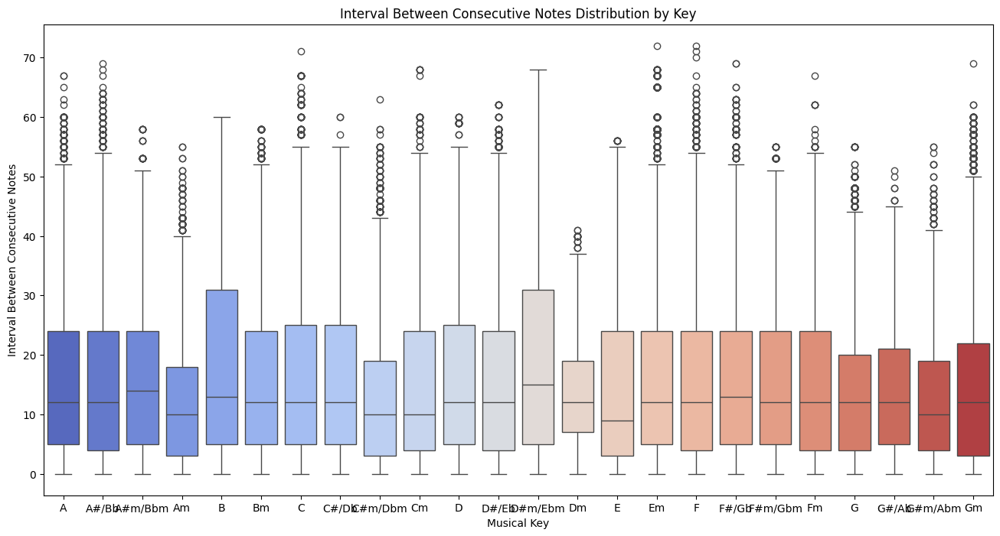

In [504]:
# Interval between consecutive notes distribution across keys to show tonal variation
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='key_name', y='interval_to_prev', order=ordered_key_names, palette='coolwarm')
plt.title('Interval Between Consecutive Notes Distribution by Key')
plt.xlabel('Musical Key')
plt.ylabel('Interval Between Consecutive Notes')
plt.show()

In [505]:
# Descriptive statistics of interval between consecutive notes values by instrument
print("Interval Between Consecutive Notes statistics by Instrument:")
df_notes_only.groupby('instrument')['interval_to_prev'].describe()

Interval Between Consecutive Notes statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Acoustic Guitar,31060.0,15.664263,13.571180,0.0,5.0,12.0,26.0,72.0
Alto Saxophone,505.0,23.312871,15.661636,0.0,4.0,30.0,36.0,45.0
Bagpipes,4865.0,22.095786,13.726395,0.0,9.0,22.0,34.0,60.0
Banjo,872.0,14.793578,12.272118,0.0,4.0,10.0,27.0,34.0
Baritone Saxophone,1609.0,15.808577,9.703472,0.0,9.0,14.0,24.0,48.0
Bassoon,1729.0,9.181029,10.809438,0.0,0.0,4.0,16.0,46.0
Brass,2936.0,17.316417,14.415034,0.0,5.0,12.0,28.0,63.0
Choir,3971.0,10.245782,11.150495,0.0,2.0,7.0,14.0,60.0
Clarinet,998.0,17.357715,12.758512,0.0,9.0,17.0,24.0,53.0


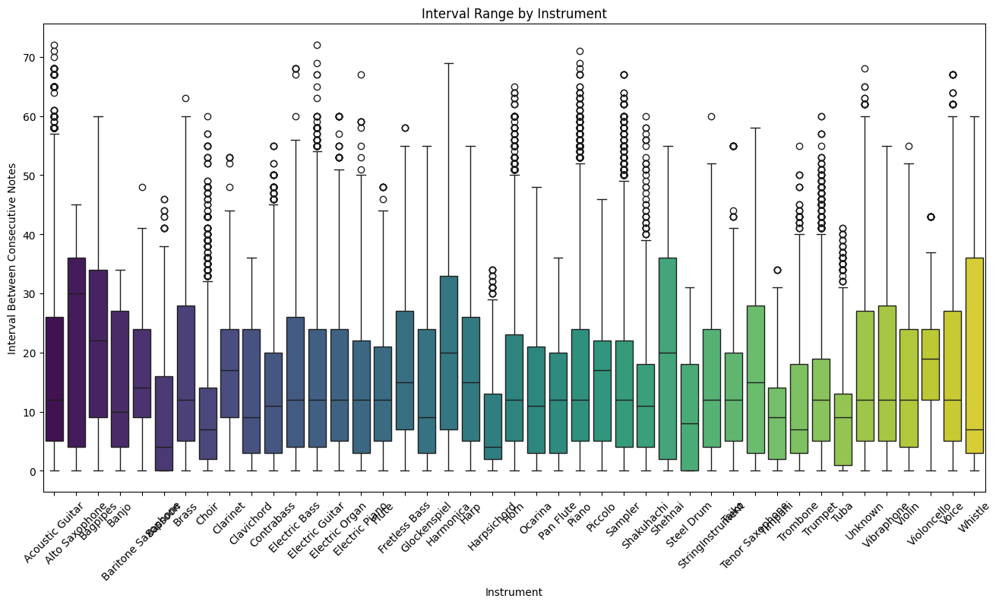

In [506]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='instrument', y='interval_to_prev', palette='viridis', order=alphabetic_order)
plt.xticks(rotation=45)
plt.title('Interval Range by Instrument')
plt.xlabel('Instrument')
plt.ylabel('Interval Between Consecutive Notes')
plt.show()

In [507]:
# Descriptive statistics of intervals between consecutive notes by instrument family
print("Interval Between Consecutive Notes statistics by Instrument Family:")
df_notes_only.groupby('instrument_family')['interval_to_prev'].describe()

Interval Between Consecutive Notes statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument_family,,,,,,,,
Bass,21992.0,14.732812,12.383622,0.0,4.0,12.0,24.0,68.0
Brass,28615.0,13.182282,11.517943,0.0,4.0,12.0,21.0,65.0
Electronic,44646.0,13.514537,11.998708,0.0,4.0,12.0,21.0,67.0
Guitar,123066.0,14.595217,12.426576,0.0,4.0,12.0,24.0,72.0
Keyboard,115183.0,14.886164,12.105233,0.0,5.0,12.0,24.0,71.0
Other,26486.0,17.277920,14.772244,0.0,5.0,12.0,27.0,68.0
Percussion,12714.0,13.471999,11.452097,0.0,4.0,10.0,22.0,55.0
Strings,20311.0,14.588745,11.804396,0.0,4.0,12.0,24.0,60.0
Voice,18044.0,16.535912,13.539557,0.0,5.0,12.0,27.0,67.0


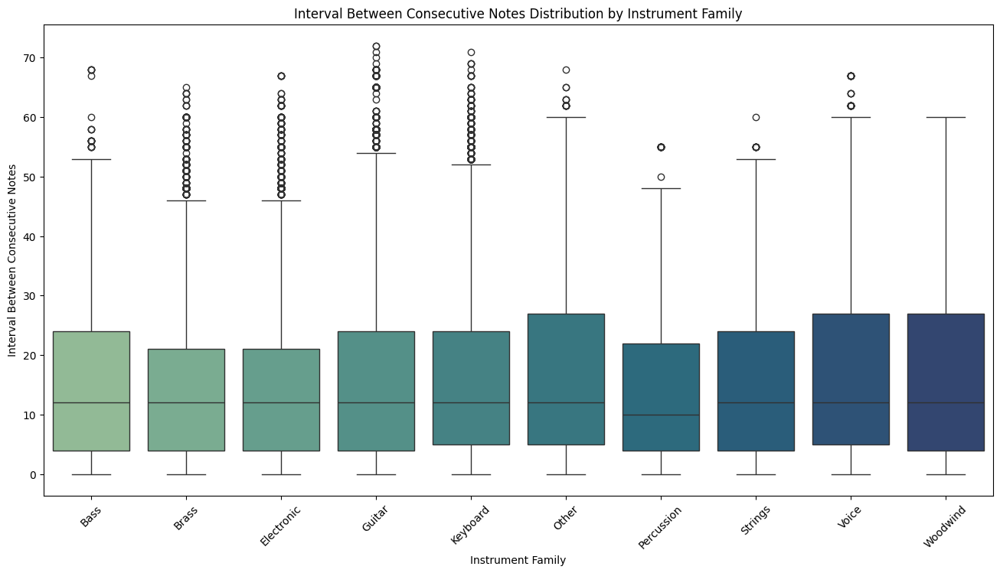

In [508]:
# Filter and plot interval between consecutive notes distribution by instrument family
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='instrument_family', y='interval_to_prev', palette='crest', order=families)
plt.title('Interval Between Consecutive Notes Distribution by Instrument Family')
plt.xlabel('Instrument Family')
plt.ylabel('Interval Between Consecutive Notes')
plt.xticks(rotation=45)
plt.show()

In [509]:
# Descriptive statistics of intervals between consecutive notes by genre
print("Interval Between Consecutive Notes statistics by Genre:")
df_notes_only.groupby('genre')['interval_to_prev'].describe()

Interval Between Consecutive Notes statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,21201.0,14.465120,12.358609,0.0,4.0,12.0,24.0,58.0
blues,35519.0,14.008756,12.134544,0.0,4.0,12.0,23.0,69.0
classical,31269.0,13.329815,11.776882,0.0,3.0,10.0,20.0,65.0
country,34558.0,14.708548,11.431257,0.0,5.0,12.0,22.0,67.0
dance,34253.0,16.677196,13.515872,0.0,5.0,12.0,26.0,68.0
disco,34775.0,15.381797,13.059244,0.0,4.0,12.0,24.0,69.0
heavy_metal,32227.0,15.194650,12.737132,0.0,5.0,12.0,24.0,67.0
jazz,21851.0,13.863942,11.256133,0.0,5.0,12.0,21.0,71.0
new_age,29586.0,12.349997,11.735201,0.0,2.0,9.0,19.0,72.0


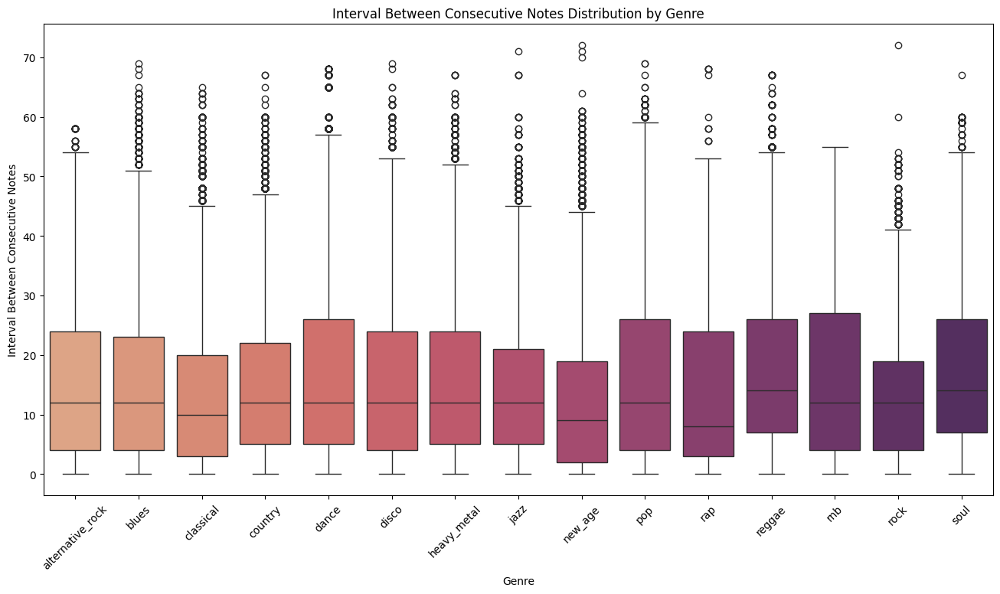

In [510]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='genre', y='interval_to_prev', palette='flare', order=genres_sorted)
plt.title('Interval Between Consecutive Notes Distribution by Genre')
plt.xlabel('Genre')
plt.ylabel('Interval Between Consecutive Notes')
plt.xticks(rotation=45)
plt.show()

##### 2.3.6.4 Metric Weight vs Interval Between Consecutive Notes (in Semitones)

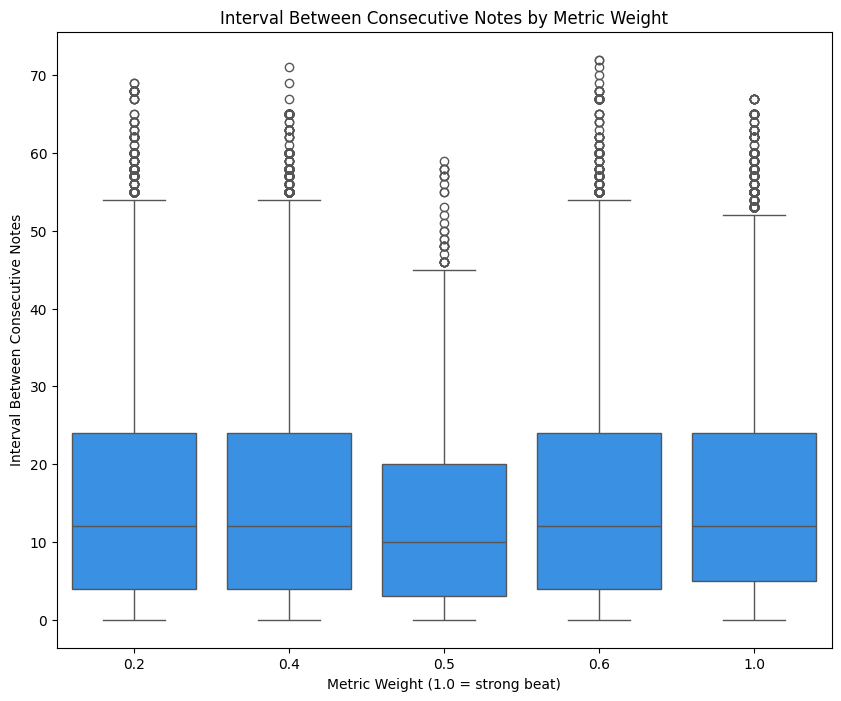

In [511]:
# Set the figure size
plt.figure(figsize=(10, 8))

# Create a boxplot showing how note duration varies with metric weight
sns.boxplot(data=df_notes_only, x="metric_weight", y="interval_to_prev", color='dodgerblue')

# Add a descriptive title and axis labels
plt.title("Interval Between Consecutive Notes by Metric Weight")
plt.xlabel("Metric Weight (1.0 = strong beat)")
plt.ylabel("Interval Between Consecutive Notes")
plt.show()

##### 2.3.6.5 Average Interval Between Consecutive Notes by Polyphony and Metric Weight

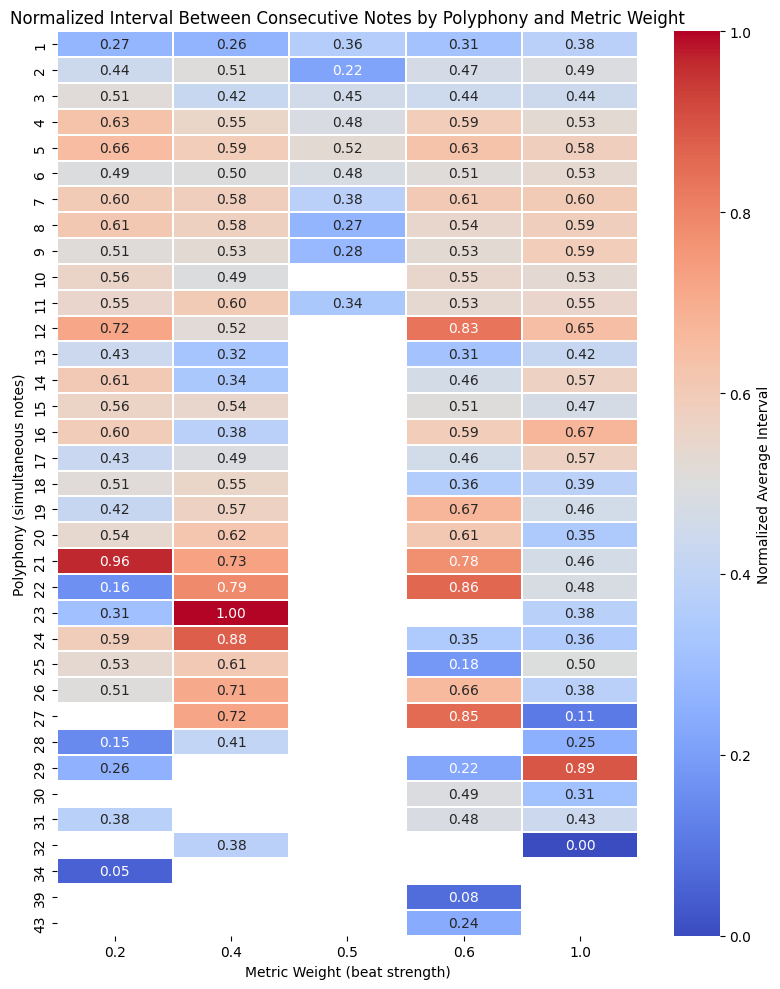

In [512]:
# Create a pivot table: rows = polyphony, columns = metric weight
pivot = df_notes_only.pivot_table(
    values="interval_to_prev",
    index="polyphony_notes",
    columns="metric_weight",
    aggfunc="mean"
)

# Normalize globally using min-max scaling
normalized_pivot = (pivot - pivot.min().min()) / (pivot.max().max() - pivot.min().min())

# Plot the normalized heatmap
fig, ax = plt.subplots(figsize=(8, 10))
sns.heatmap(normalized_pivot, cmap="coolwarm", annot=True, fmt=".2f", linewidths=0.2, ax=ax, cbar_kws={"label": "Normalized Average Interval"})

plt.title("Normalized Interval Between Consecutive Notes by Polyphony and Metric Weight")
plt.xlabel("Metric Weight (beat strength)")
plt.ylabel("Polyphony (simultaneous notes)")
plt.tight_layout()
plt.show()

##### Key Findings For The Interval To Previous Feature
The interval-to-previous feature captures melodic movement between consecutive notes and proves highly discriminative across genres. After excluding silences, the dataset shrinks by one-third, leaving only true note-to-note transitions. The distribution is strongly multimodal, with peaks at consonant intervals (unison, minor third, fourth, fifth, octave), matching music theory expectations, and a clear decay for larger leaps. While most intervals fall within an octave, large jumps above two octaves remain surprisingly common (21% of cases), especially in R&B, reggae, disco, and dance, reflecting modern arrangements with bass–melody contrasts and electronic layering. By contrast, rock, jazz, and country show more linear progressions, and classical, somewhat unexpectedly, is relatively conservative. This sharp stylistic divide makes the feature particularly powerful for TDA, as it combines strong theoretical grounding, clear multimodality, and pronounced genre signatures. Overall, interval-to-previous is likely one of the most topologically discriminative features in the dataset.

---

#### 2.3.7 Polyphony

##### 2.3.7.1 Central Tendency and Spread of Polyphony


In [513]:
# Descriptive stats: proportion and spread of polyphony
print(df['polyphony_voices'].describe())
print("\n", df['polyphony_notes'].describe())

count    638769.000000
mean          2.331273
std           1.638932
min           0.000000
25%           1.000000
50%           2.000000
75%           3.000000
max          12.000000
Name: polyphony_voices, dtype: float64

 count    638769.000000
mean          4.852493
std           4.344271
min           0.000000
25%           1.000000
50%           4.000000
75%           7.000000
max          43.000000
Name: polyphony_notes, dtype: float64


In [514]:
# Descriptive stats: proportion and spread of polyphony for actual notes only
print(df_notes_only['polyphony_voices'].describe())
print("\n", df_notes_only['polyphony_notes'].describe())

count    429888.000000
mean          2.936839
std           1.305056
min           1.000000
25%           2.000000
50%           3.000000
75%           4.000000
max          12.000000
Name: polyphony_voices, dtype: float64

 count    429888.000000
mean          6.228683
std           4.094773
min           1.000000
25%           3.000000
50%           5.000000
75%           8.000000
max          43.000000
Name: polyphony_notes, dtype: float64


In [515]:
# Central tendency
mean_polyphony_voices = df_notes_only['polyphony_voices'].mean()
median_polyphony_voices = df_notes_only['polyphony_voices'].median()
mode_polyphony_voices = df_notes_only['polyphony_voices'].mode()[0]  

mean_polyphony_notes = df_notes_only['polyphony_notes'].mean()
median_polyphony_notes = df_notes_only['polyphony_notes'].median()
mode_polyphony_notes = df_notes_only['polyphony_notes'].mode()[0] 

# Spread
std_polyphony_voices = df_notes_only['polyphony_voices'].std()
std_polyphony_notes = df_notes_only['polyphony_notes'].std()

# Display results
print(f"Mean polyphony (voices): {mean_polyphony_voices:.2f}")
print(f"Median polyphony (voices): {median_polyphony_voices:.2f}")
print(f"Mode polyphony (voices): {mode_polyphony_voices:.2f}")
print(f"Standard polyphony (voices): {std_polyphony_voices:.2f}")
print(f"Mean polyphony (notes): {mean_polyphony_notes:.2f}")
print(f"Median polyphony (notes): {median_polyphony_notes:.2f}")
print(f"Mode polyphony (notes): {mode_polyphony_notes:.2f}")
print(f"Standard polyphony (notes): {std_polyphony_notes:.2f}")

Mean polyphony (voices): 2.94
Median polyphony (voices): 3.00
Mode polyphony (voices): 3.00
Standard polyphony (voices): 1.31
Mean polyphony (notes): 6.23
Median polyphony (notes): 5.00
Mode polyphony (notes): 3.00
Standard polyphony (notes): 4.09


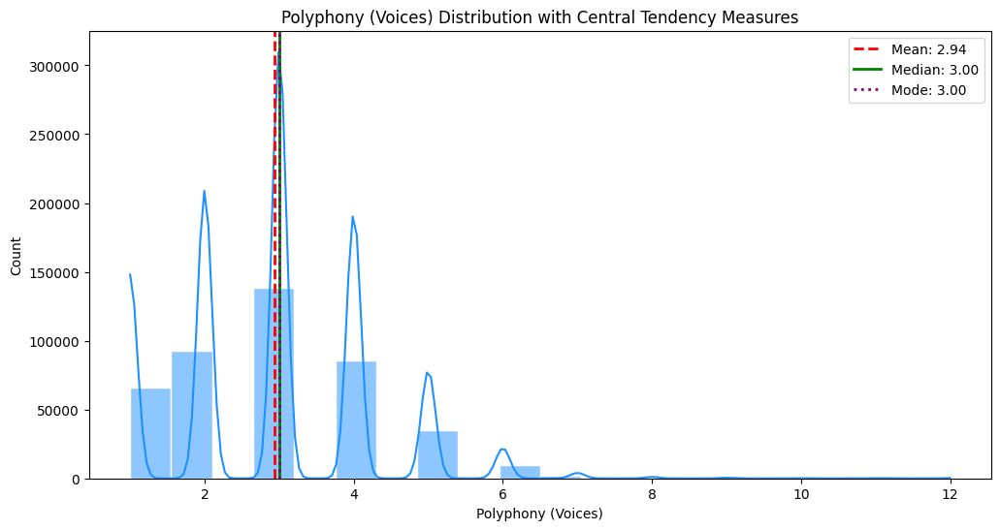

In [516]:
plt.figure(figsize=(12, 6))
sns.histplot(df_notes_only['polyphony_voices'], bins=20, kde=True, color='dodgerblue', edgecolor='white')

# Add lines for mean, median, and mode
plt.axvline(mean_polyphony_voices, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_polyphony_voices:.2f}')
plt.axvline(median_polyphony_voices, color='green', linestyle='-', linewidth=2, label=f'Median: {median_polyphony_voices:.2f}')
plt.axvline(mode_polyphony_voices, color='purple', linestyle=':', linewidth=2, label=f'Mode: {mode_polyphony_voices:.2f}')

plt.title('Polyphony (Voices) Distribution with Central Tendency Measures')
plt.xlabel('Polyphony (Voices)')
plt.ylabel('Count')
plt.legend()
plt.show()

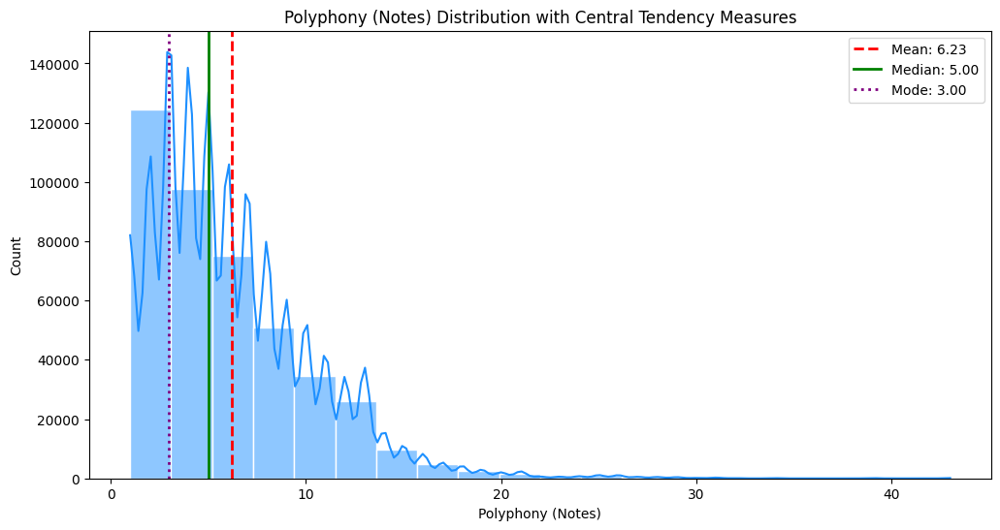

In [517]:
plt.figure(figsize=(12, 6))
sns.histplot(df_notes_only['polyphony_notes'], bins=20, kde=True, color='dodgerblue', edgecolor='white')

# Add lines for mean, median, and mode
plt.axvline(mean_polyphony_notes, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_polyphony_notes:.2f}')
plt.axvline(median_polyphony_notes, color='green', linestyle='-', linewidth=2, label=f'Median: {median_polyphony_notes:.2f}')
plt.axvline(mode_polyphony_notes, color='purple', linestyle=':', linewidth=2, label=f'Mode: {mode_polyphony_notes:.2f}')

plt.title('Polyphony (Notes) Distribution with Central Tendency Measures')
plt.xlabel('Polyphony (Notes)')
plt.ylabel('Count')
plt.legend()
plt.show()

##### 2.3.7.2 Outlier Detection in Polyphony Values

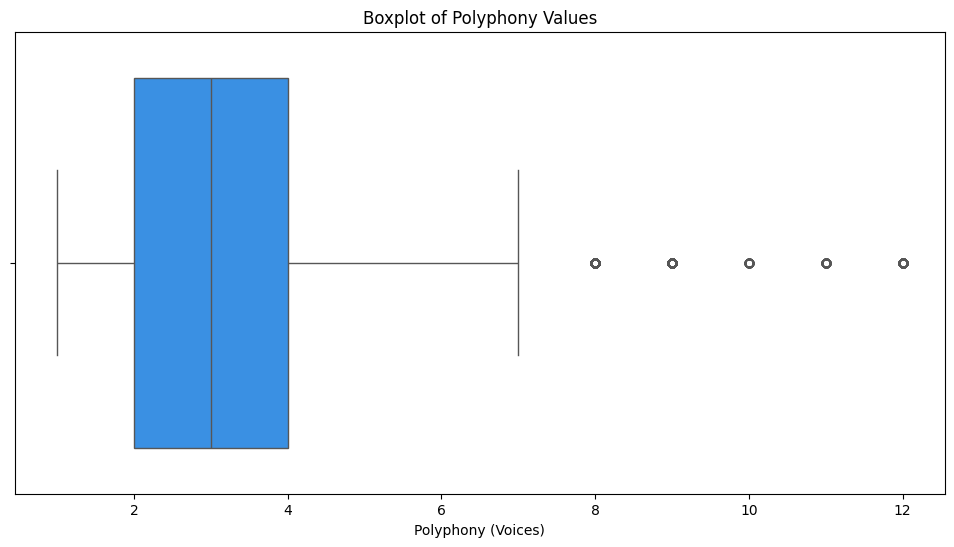

In [518]:
plt.figure(figsize=(12, 6))
sns.boxplot(x=df_notes_only['polyphony_voices'], color='dodgerblue')
plt.title('Boxplot of Polyphony Values')
plt.xlabel('Polyphony (Voices)')
plt.show()

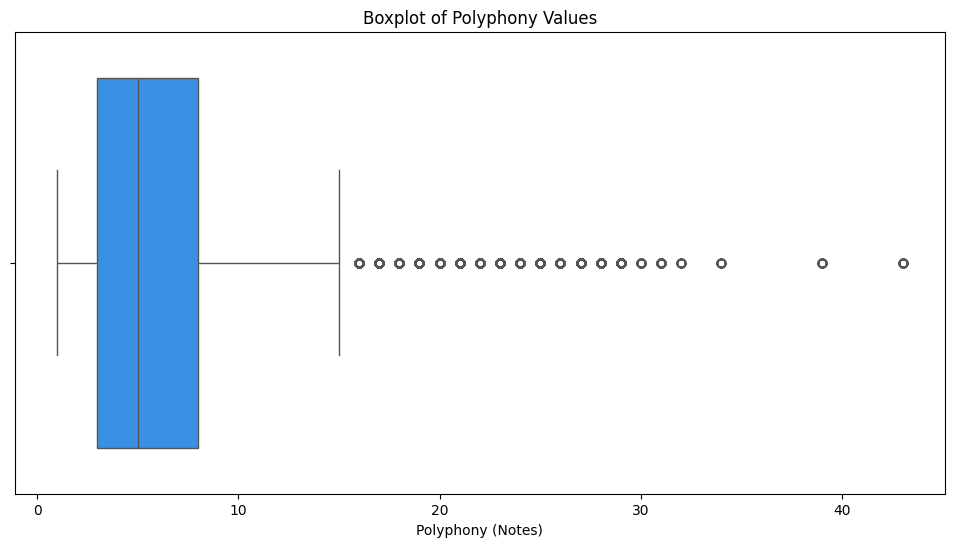

In [519]:
plt.figure(figsize=(12, 6))
sns.boxplot(x=df_notes_only['polyphony_notes'], color='dodgerblue')
plt.title('Boxplot of Polyphony Values')
plt.xlabel('Polyphony (Notes)')
plt.show()

##### 2.3.7.3 Polyphony in Context: Key, Instrument, and Genre

In [520]:
# Descriptive statistics of polyphony (voices) values by key
print("Polyphony (voices) statistics by Key:")
df_notes_only.groupby('key')['polyphony_voices'].describe().sort_index()

Polyphony (voices) statistics by Key:


,count,mean,std,min,25%,50%,75%,max
key,,,,,,,,
0,37533.0,2.976048,1.130552,1.0,2.0,3.0,4.0,8.0
1,11542.0,3.380523,1.269395,1.0,3.0,3.0,4.0,7.0
2,28424.0,3.137841,1.337919,1.0,2.0,3.0,4.0,9.0
3,19869.0,3.032664,1.322282,1.0,2.0,3.0,4.0,9.0
4,8342.0,2.608607,0.903781,1.0,2.0,3.0,3.0,6.0
5,43881.0,3.209476,1.285769,1.0,2.0,3.0,4.0,8.0
6,7158.0,3.194607,1.405786,1.0,2.0,3.0,4.0,7.0
7,38144.0,2.802380,1.108846,1.0,2.0,3.0,4.0,6.0
8,2710.0,2.430996,1.216443,1.0,1.0,2.0,3.0,5.0


In [521]:
# Descriptive statistics of polyphony (notes) values by key
print("Polyphony (notes) statistics by Key:")
df_notes_only.groupby('key')['polyphony_notes'].describe().sort_index()

Polyphony (notes) statistics by Key:


,count,mean,std,min,25%,50%,75%,max
key,,,,,,,,
0,37533.0,6.440546,4.100571,1.0,3.0,6.0,9.0,20.0
1,11542.0,5.659504,2.869635,1.0,3.0,5.0,7.0,14.0
2,28424.0,5.984802,3.892169,1.0,3.0,5.0,8.0,18.0
3,19869.0,6.288037,3.836741,1.0,3.0,6.0,8.0,21.0
4,8342.0,5.597459,3.133643,1.0,3.0,5.0,8.0,13.0
5,43881.0,7.398259,4.817239,1.0,4.0,6.0,9.0,29.0
6,7158.0,8.497904,5.374730,1.0,4.0,8.0,12.0,26.0
7,38144.0,5.233117,2.897497,1.0,3.0,5.0,7.0,16.0
8,2710.0,3.563838,2.449072,1.0,2.0,3.0,6.0,11.0


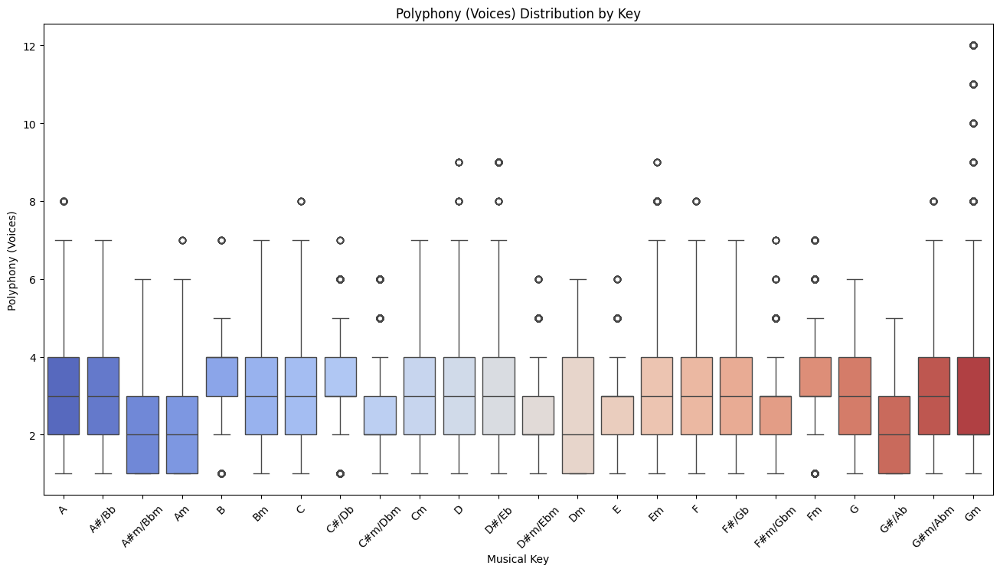

In [522]:
# Polyphony (voices) distribution across keys to show tonal variation
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='key_name', y='polyphony_voices', order=ordered_key_names, palette='coolwarm')
plt.title('Polyphony (Voices) Distribution by Key')
plt.xlabel('Musical Key')
plt.xticks(rotation=45)
plt.ylabel('Polyphony (Voices)')
plt.show()

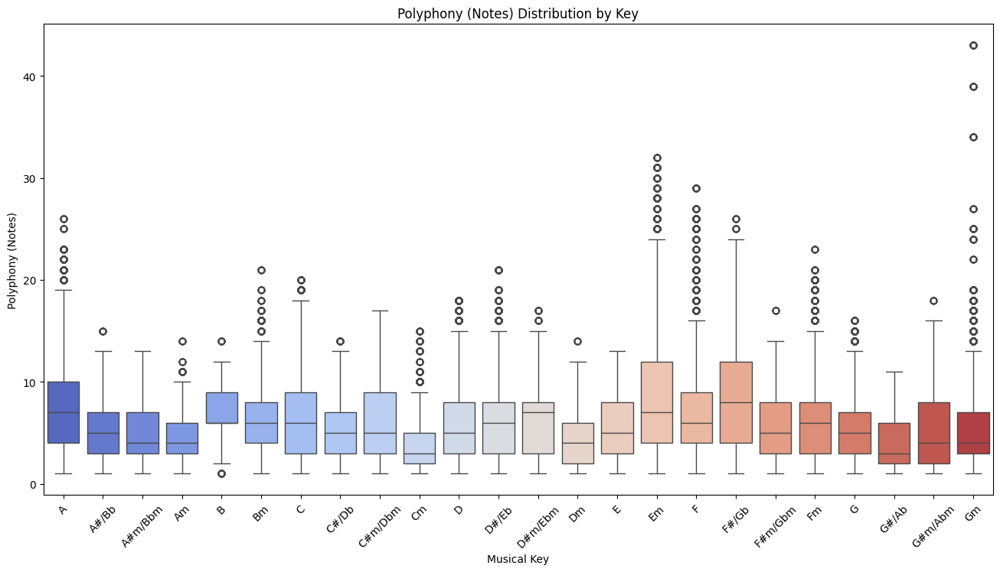

In [523]:
# Polyphony (notes) distribution across keys to show tonal variation
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='key_name', y='polyphony_notes', order=ordered_key_names, palette='coolwarm')
plt.title('Polyphony (Notes) Distribution by Key')
plt.xlabel('Musical Key')
plt.xticks(rotation=45)
plt.ylabel('Polyphony (Notes)')
plt.show()

In [524]:
# Descriptive statistics of polyphony (voices) values by instrument
print("Polyphony (voices) statistics by Instrument:")
df_notes_only.groupby('instrument')['polyphony_voices'].describe()

Polyphony (voices) statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Acoustic Guitar,31060.0,3.029137,1.206284,1.0,2.0,3.0,4.00,7.0
Alto Saxophone,505.0,2.627723,1.457065,1.0,1.0,2.0,4.00,6.0
Bagpipes,4865.0,4.015005,1.079099,1.0,3.0,4.0,5.00,7.0
Banjo,872.0,1.278670,0.448602,1.0,1.0,1.0,2.00,2.0
Baritone Saxophone,1609.0,2.425730,0.975883,1.0,2.0,3.0,3.00,5.0
Bassoon,1729.0,1.832851,0.644014,1.0,1.0,2.0,2.00,4.0
Brass,2936.0,3.111376,1.043285,1.0,3.0,3.0,4.00,6.0
Choir,3971.0,3.324603,1.788755,1.0,2.0,3.0,4.00,9.0
Clarinet,998.0,2.039078,0.810832,1.0,1.0,2.0,3.00,4.0


In [525]:
# Descriptive statistics of polyphony (notes) values by instrument
print("Polyphony (notes) statistics by Instrument:")
df_notes_only.groupby('instrument')['polyphony_notes'].describe()

Polyphony (notes) statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Acoustic Guitar,31060.0,7.180747,4.358922,1.0,4.0,7.0,11.0,31.0
Alto Saxophone,505.0,3.130693,1.890544,1.0,2.0,2.0,5.0,7.0
Bagpipes,4865.0,7.334224,2.566170,1.0,5.0,7.0,9.0,14.0
Banjo,872.0,2.222477,0.629215,1.0,2.0,2.0,3.0,3.0
Baritone Saxophone,1609.0,4.891858,2.688327,1.0,3.0,5.0,7.0,11.0
Bassoon,1729.0,4.888953,2.187755,1.0,3.0,5.0,7.0,10.0
Brass,2936.0,6.572888,3.328592,1.0,4.0,6.0,9.0,17.0
Choir,3971.0,5.726769,3.741272,1.0,3.0,5.0,8.0,17.0
Clarinet,998.0,3.194389,1.757143,1.0,2.0,3.0,4.0,9.0


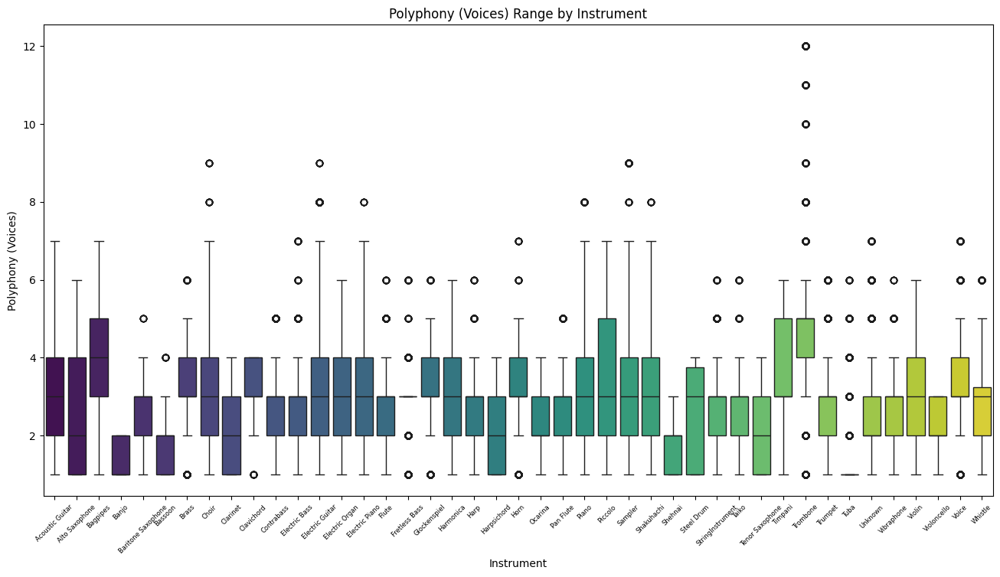

In [526]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='instrument', y='polyphony_voices', palette='viridis', order=alphabetic_order)
plt.xticks(rotation=45)
plt.title('Polyphony (Voices) Range by Instrument')
plt.xlabel('Instrument')
plt.xticks(fontsize=6)
plt.ylabel('Polyphony (Voices)')
plt.show()

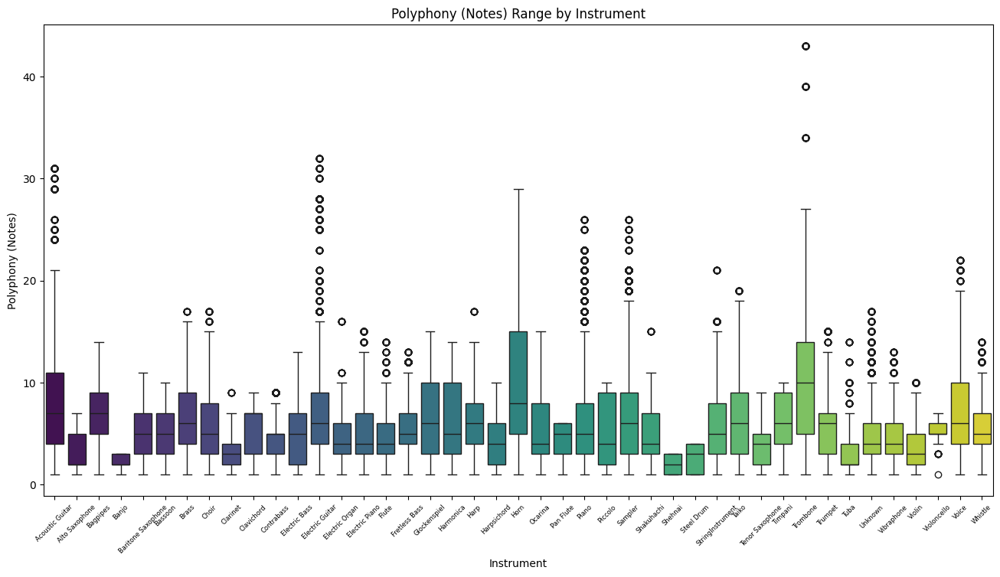

In [527]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='instrument', y='polyphony_notes', palette='viridis', order=alphabetic_order)
plt.xticks(rotation=45)
plt.title('Polyphony (Notes) Range by Instrument')
plt.xlabel('Instrument')
plt.xticks(fontsize=6)
plt.ylabel('Polyphony (Notes)')
plt.show()

In [528]:
# Descriptive statistics of polyphony (voices) by instrument family
print("Polyphony (voices) statistics by Instrument Family:")
df_notes_only.groupby('instrument_family')['polyphony_voices'].describe()

Polyphony (voices) statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument_family,,,,,,,,
Bass,21992.0,2.731493,1.056743,1.0,2.0,3.0,3.0,7.0
Brass,28615.0,3.022471,1.628821,1.0,2.0,3.0,4.0,12.0
Electronic,44646.0,3.082717,1.404164,1.0,2.0,3.0,4.0,9.0
Guitar,123066.0,2.920969,1.288490,1.0,2.0,3.0,4.0,9.0
Keyboard,115183.0,2.967999,1.274201,1.0,2.0,3.0,4.0,8.0
Other,26486.0,2.567583,1.241266,1.0,2.0,2.0,3.0,7.0
Percussion,12714.0,2.964134,1.192996,1.0,2.0,3.0,4.0,6.0
Strings,20311.0,2.646842,1.054679,1.0,2.0,3.0,3.0,6.0
Voice,18044.0,3.307083,1.239520,1.0,3.0,3.0,4.0,7.0


In [529]:
# Descriptive statistics of polyphony (notes) by instrument family
print("Polyphony (notes) statistics by Instrument Family:")
df_notes_only.groupby('instrument_family')['polyphony_notes'].describe()

Polyphony (notes) statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument_family,,,,,,,,
Bass,21992.0,4.988632,2.571970,1.0,3.0,5.0,6.0,13.0
Brass,28615.0,8.204543,6.176341,1.0,4.0,6.0,12.0,43.0
Electronic,44646.0,6.654930,4.488119,1.0,3.0,6.0,9.0,26.0
Guitar,123066.0,6.761055,4.115974,1.0,4.0,6.0,9.0,32.0
Keyboard,115183.0,5.687410,3.643646,1.0,3.0,5.0,8.0,26.0
Other,26486.0,4.737597,2.958401,1.0,3.0,4.0,6.0,17.0
Percussion,12714.0,5.950920,3.576906,1.0,3.0,5.0,8.0,19.0
Strings,20311.0,5.591404,3.519769,1.0,3.0,5.0,8.0,21.0
Voice,18044.0,7.224230,4.322469,1.0,4.0,6.0,10.0,22.0


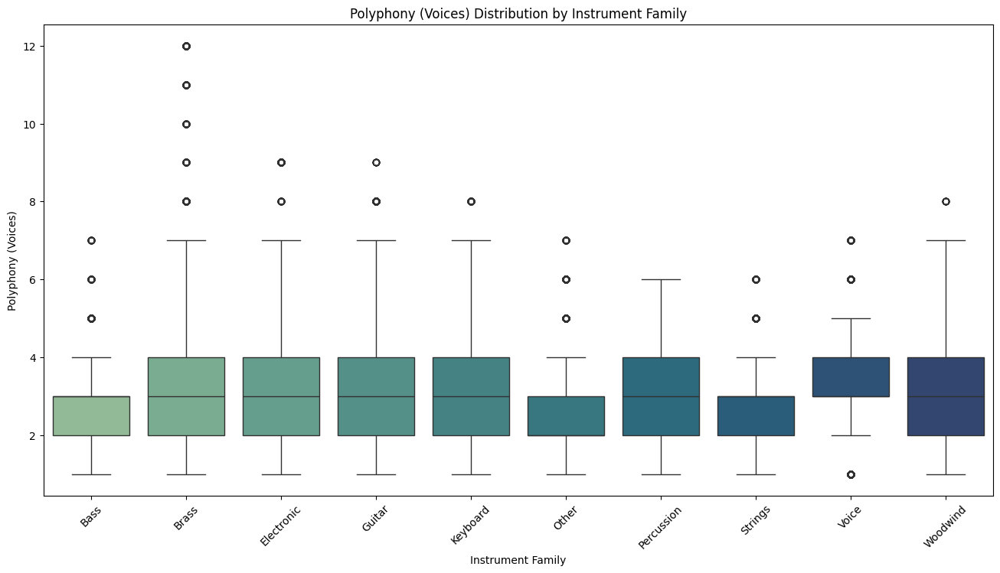

In [530]:
# Filter and plot polyphony (voices) distribution by instrument family
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='instrument_family', y='polyphony_voices', palette='crest', order=families)
plt.title('Polyphony (Voices) Distribution by Instrument Family')
plt.xlabel('Instrument Family')
plt.ylabel('Polyphony (Voices)')
plt.xticks(rotation=45)
plt.show()

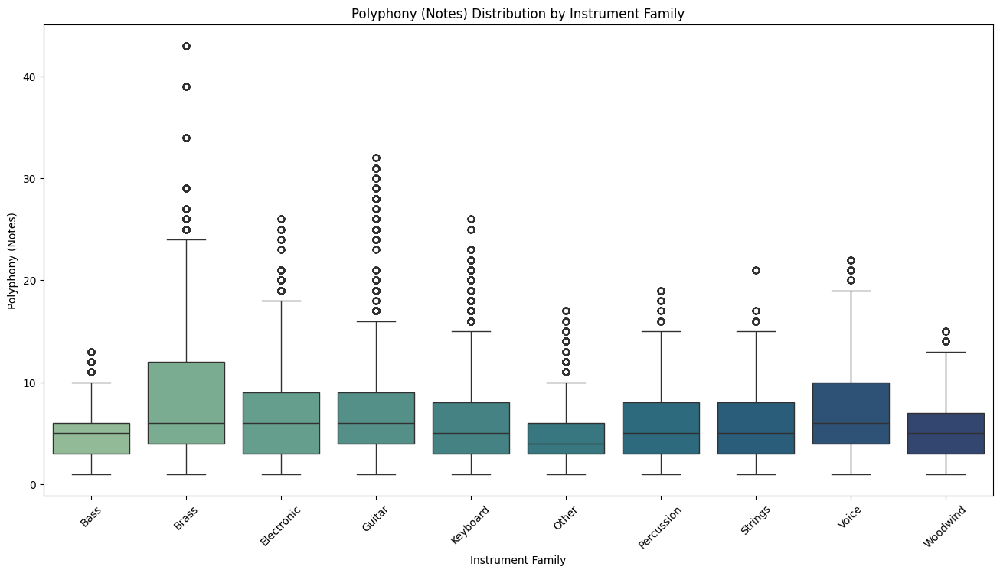

In [531]:
# Filter and plot polyphony (notes) distribution by instrument family
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='instrument_family', y='polyphony_notes', palette='crest', order=families)
plt.title('Polyphony (Notes) Distribution by Instrument Family')
plt.xlabel('Instrument Family')
plt.ylabel('Polyphony (Notes)')
plt.xticks(rotation=45)
plt.show()

In [532]:
# Descriptive statistics of polyphony (voices) by genre
print("Polyphony (Voices) statistics by Genre:")
df_notes_only.groupby('genre')['polyphony_voices'].describe()

Polyphony (Voices) statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,21201.0,2.589359,1.126921,1.0,2.0,2.0,3.0,6.0
blues,35519.0,3.358174,1.330397,1.0,3.0,3.0,4.0,8.0
classical,31269.0,2.638588,1.062169,1.0,2.0,3.0,3.0,7.0
country,34558.0,3.216129,1.225799,1.0,2.0,3.0,4.0,8.0
dance,34253.0,2.798120,1.203427,1.0,2.0,3.0,4.0,7.0
disco,34775.0,3.035917,1.351368,1.0,2.0,3.0,4.0,7.0
heavy_metal,32227.0,2.262978,0.949319,1.0,2.0,2.0,3.0,8.0
jazz,21851.0,3.560935,1.723304,1.0,2.0,4.0,5.0,12.0
new_age,29586.0,2.891908,1.434696,1.0,2.0,3.0,4.0,9.0


In [533]:
# Descriptive statistics of polyphony (notes) by genre
print("Polyphony (notes) statistics by Genre:")
df_notes_only.groupby('genre')['polyphony_notes'].describe()

Polyphony (notes) statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,21201.0,6.274940,4.978588,1.0,3.0,5.0,8.0,32.0
blues,35519.0,6.026662,3.578202,1.0,3.0,5.0,8.0,19.0
classical,31269.0,6.617257,5.373754,1.0,3.0,5.0,8.0,29.0
country,34558.0,7.600266,4.645989,1.0,4.0,7.0,10.0,26.0
dance,34253.0,6.205909,3.691282,1.0,3.0,5.0,9.0,17.0
disco,34775.0,5.997383,3.702077,1.0,3.0,5.0,8.0,18.0
heavy_metal,32227.0,5.254073,3.311530,1.0,3.0,5.0,7.0,20.0
jazz,21851.0,6.501808,4.907850,1.0,3.0,6.0,9.0,43.0
new_age,29586.0,6.445278,4.435724,1.0,3.0,6.0,8.0,31.0


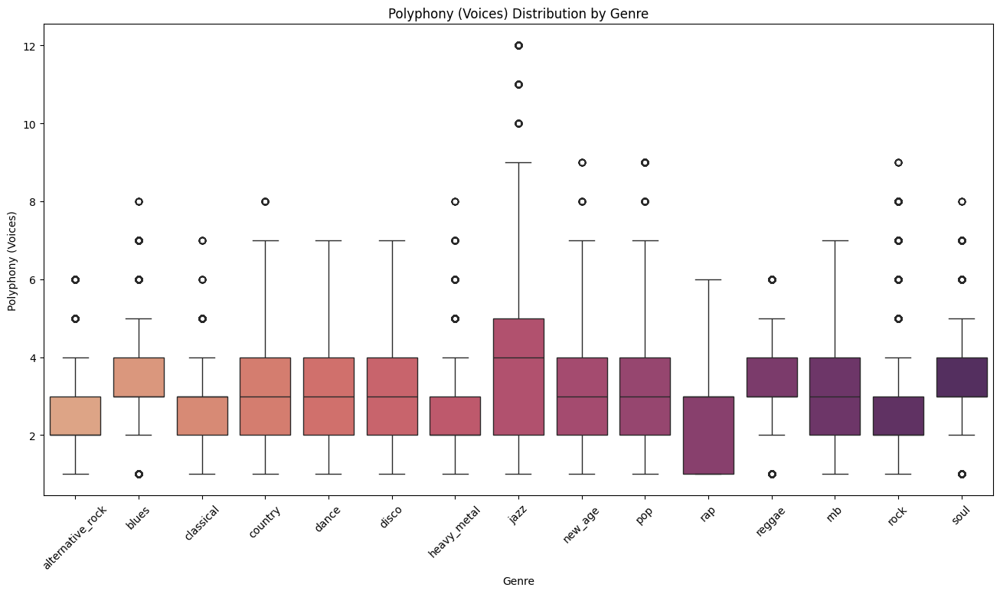

In [534]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='genre', y='polyphony_voices', palette='flare', order=genres_sorted)
plt.title('Polyphony (Voices) Distribution by Genre')
plt.xlabel('Genre')
plt.ylabel('Polyphony (Voices)')
plt.xticks(rotation=45)
plt.show()

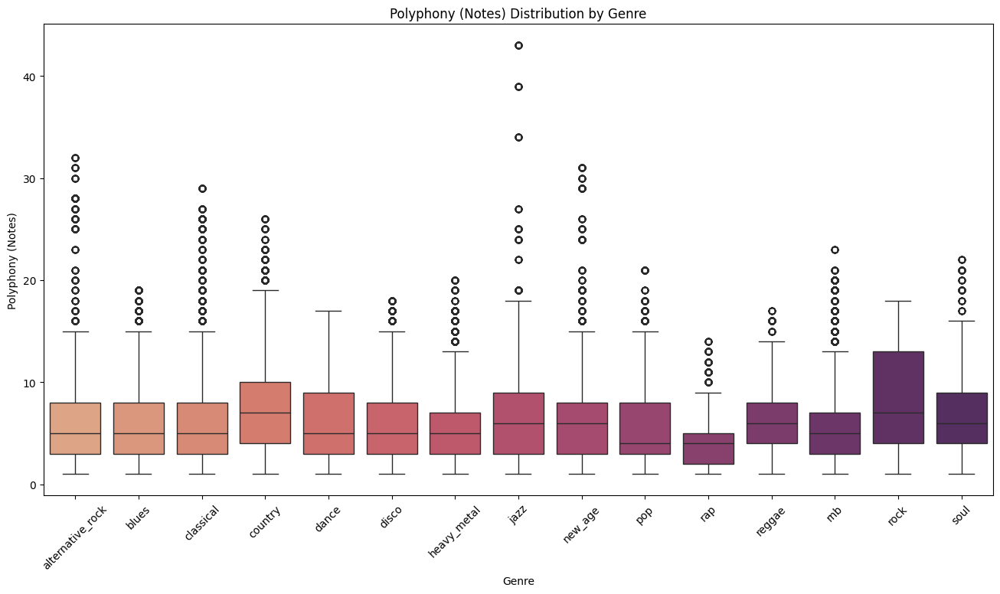

In [535]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='genre', y='polyphony_notes', palette='flare', order=genres_sorted)
plt.title('Polyphony (Notes) Distribution by Genre')
plt.xlabel('Genre')
plt.ylabel('Polyphony (Notes)')
plt.xticks(rotation=45)
plt.show()

##### 2.3.7.4 Polyphony Anomaly Verification

In [536]:
# Wind instruments with high polyphony
print("Wind instruments - high polyphony analysis")
wind_instruments = ['Tenor Saxophone', 'Trombone', 'Trumpet', 'Flute', 'Clarinet']
for instrument in wind_instruments:
    if instrument in df['instrument'].values:
        data = df[df['instrument'] == instrument]['polyphony_notes']
        high_poly = data[data > 8]  # Polyphony > 8 for wind instrument
        print(f"{instrument}:")
        print(f"  Total notes: {len(data)}")
        print(f"  Polyphony > 8: {len(high_poly)} ({len(high_poly)/len(data)*100:.1f}%)")
        print(f"  Max polyphony: {data.max()}")
        print(f"  Median: {data.median()}")
        print()

Wind instruments - high polyphony analysis
Tenor Saxophone:
  Total notes: 752
  Polyphony > 8: 9 (1.2%)
  Max polyphony: 9
  Median: 2.0

Trombone:
  Total notes: 7353
  Polyphony > 8: 2994 (40.7%)
  Max polyphony: 43
  Median: 6.0

Trumpet:
  Total notes: 9855
  Polyphony > 8: 1030 (10.5%)
  Max polyphony: 15
  Median: 4.0

Flute:
  Total notes: 6266
  Polyphony > 8: 331 (5.3%)
  Max polyphony: 14
  Median: 2.0

Clarinet:
  Total notes: 1136
  Polyphony > 8: 11 (1.0%)
  Max polyphony: 9
  Median: 3.0



In [537]:
# Classical genre - low polyphony analysis
print("Classical genre - detailed analysis")
classical = df[df['genre'] == 'classical']
print(f"Total classical notes: {len(classical)}")
print(f"Median polyphony: {classical['polyphony_notes'].median()}")
print(f"Mean polyphony: {classical['polyphony_notes'].mean():.2f}")

Classical genre - detailed analysis
Total classical notes: 36582
Median polyphony: 5.0
Mean polyphony: 5.97


In [538]:
# Instrument distribution in classical
print("\nInstruments in classical (top 10):")
classical_instruments = classical['instrument'].value_counts().head(10)
print(classical_instruments)


Instruments in classical (top 10):
instrument
Horn                14336
Contrabass          10126
Piano                6957
Bassoon              2605
Unknown              1269
Harpsichord          1264
Flute                  18
StringInstrument        5
Oboe                    1
Clarinet                1
Name: count, dtype: int64


In [539]:
# Comparison with Jazz (high polyphony reference)
print("\nClassical vs Jazz comparison")
jazz = df[df['genre'] == 'jazz']
print(f"Classical - Median: {classical['polyphony_notes'].median()}")
print(f"Jazz - Median: {jazz['polyphony_notes'].median()}")



Classical vs Jazz comparison
Classical - Median: 5.0
Jazz - Median: 4.0


In [540]:
# Cross-verification: wind instruments in classical
print("\nWind instruments in classical genre")
classical_wind = classical[classical['instrument'].isin(wind_instruments)]
if len(classical_wind) > 0:
    print(f"Wind instrument notes in classical: {len(classical_wind)}")
    print("Distribution by instrument:")
    print(classical_wind['instrument'].value_counts())
else:
    print("No wind instruments found in classical from this list")


Wind instruments in classical genre
Wind instrument notes in classical: 19
Distribution by instrument:
instrument
Flute       18
Clarinet     1
Name: count, dtype: int64


##### 2.3.7.5 Polyphonic Density Across Metric Accents

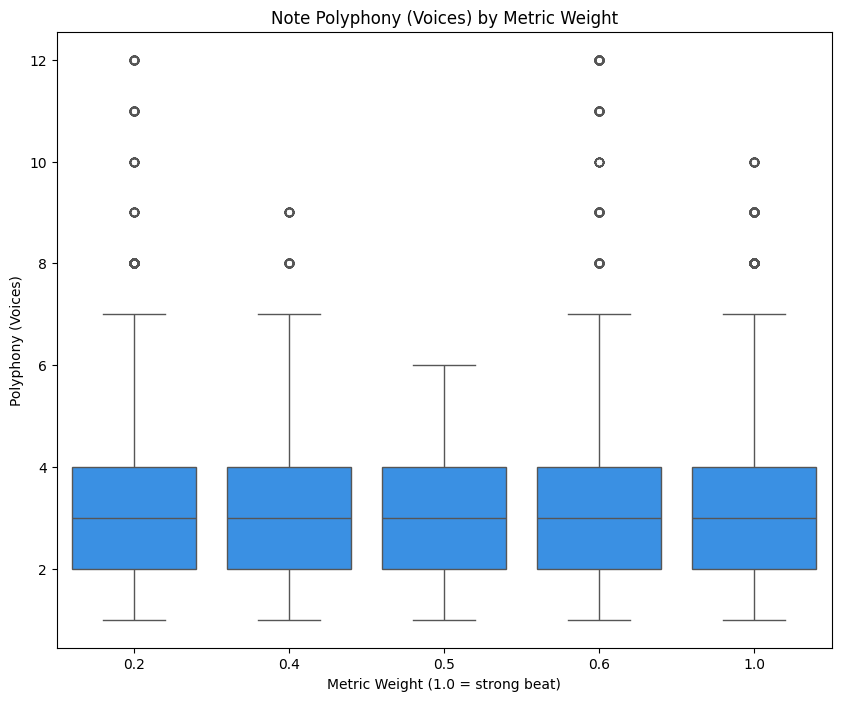

In [541]:
# Set the figure size
plt.figure(figsize=(10, 8))

# Create a boxplot showing how note duration varies with metric weight
sns.boxplot(data=df_notes_only, x="metric_weight", y="polyphony_voices", color='dodgerblue')

# Add a descriptive title and axis labels
plt.title("Note Polyphony (Voices) by Metric Weight")
plt.xlabel("Metric Weight (1.0 = strong beat)")
plt.ylabel("Polyphony (Voices)")
plt.show()

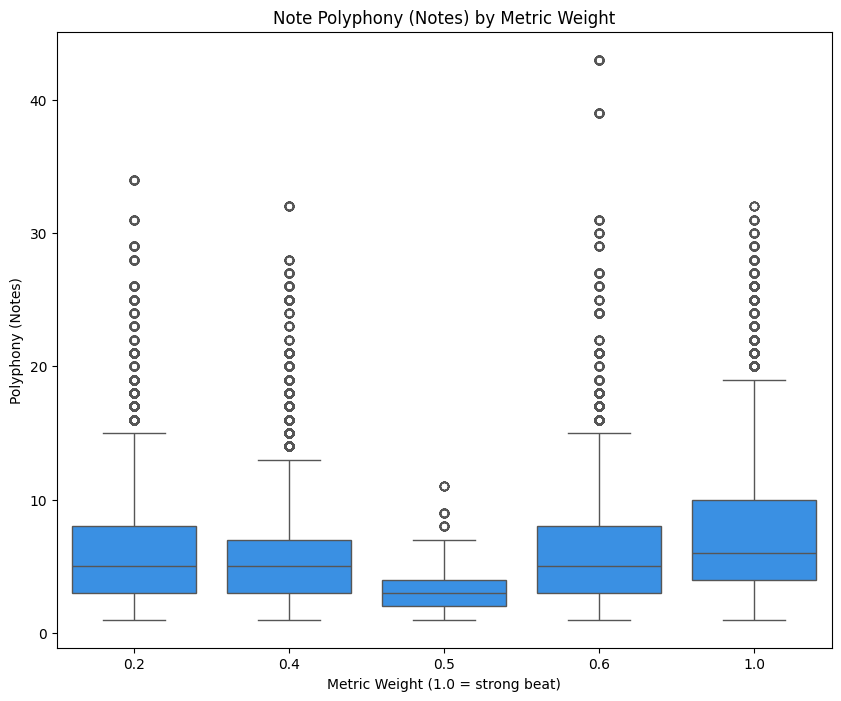

In [542]:
# Set the figure size
plt.figure(figsize=(10, 8))

# Create a boxplot showing how note duration varies with metric weight
sns.boxplot(data=df_notes_only, x="metric_weight", y="polyphony_notes", color='dodgerblue')

# Add a descriptive title and axis labels
plt.title("Note Polyphony (Notes) by Metric Weight")
plt.xlabel("Metric Weight (1.0 = strong beat)")
plt.ylabel("Polyphony (Notes)")
plt.show()

##### 2.3.7.6 Polyphonic Density Across Musical Sections

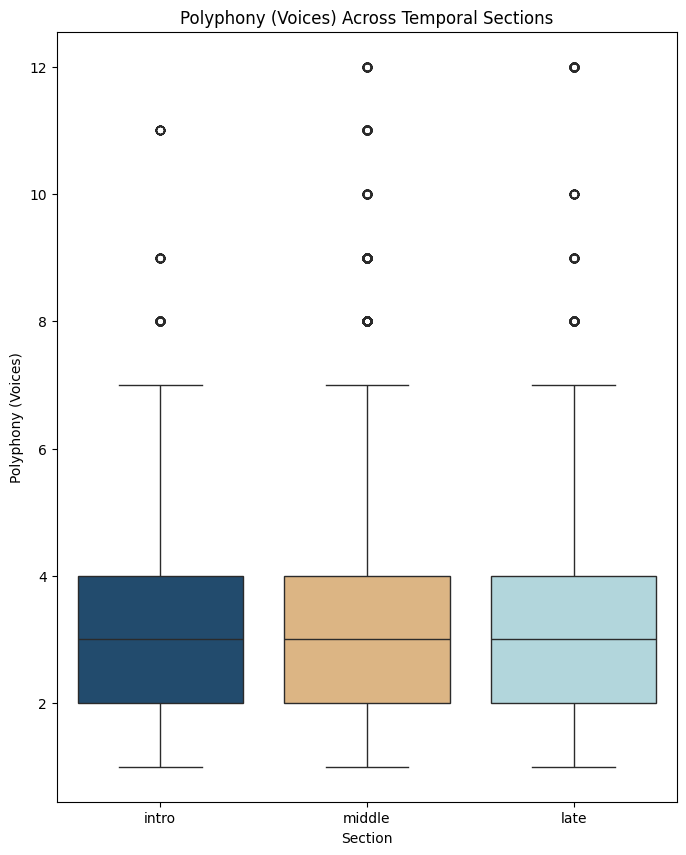

In [543]:
plt.figure(figsize=(8, 10))
sns.boxplot(data=df_notes_only, x="temporal_section", y="polyphony_voices", palette=colors)
plt.title("Polyphony (Voices) Across Temporal Sections")
plt.xlabel("Section")
plt.ylabel("Polyphony (Voices)")
plt.show()

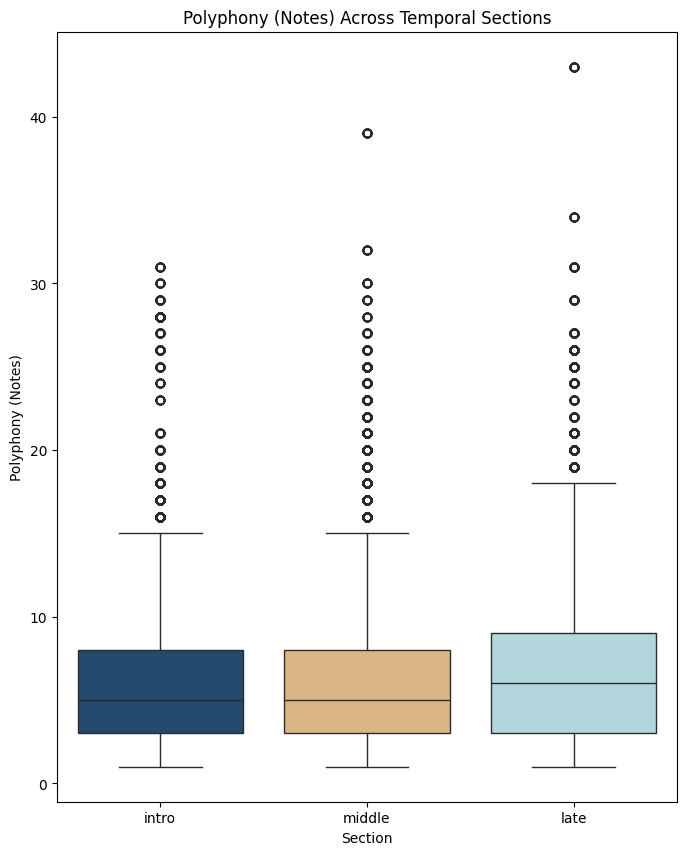

In [544]:
plt.figure(figsize=(8, 10))
sns.boxplot(data=df_notes_only, x="temporal_section", y="polyphony_notes", palette=colors)
plt.title("Polyphony (Notes) Across Temporal Sections")
plt.xlabel("Section")
plt.ylabel("Polyphony (Notes)")
plt.show()

##### 2.3.7.7 Effect of Polyphony on Note Duration

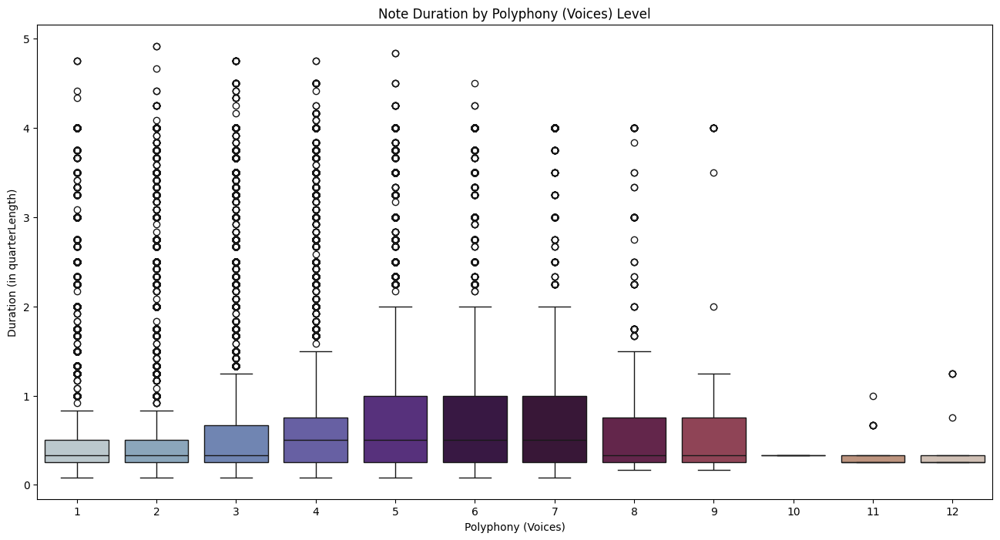

In [545]:
plt.figure(figsize=(16, 8))

# Create a boxplot to visualize how note duration changes with polyphony
sns.boxplot(data=df_filtered, x="polyphony_voices", y="duration", palette='twilight')

# Add a descriptive title and labels
plt.title("Note Duration by Polyphony (Voices) Level")
plt.xlabel("Polyphony (Voices)")
plt.ylabel("Duration (in quarterLength)")
plt.show()

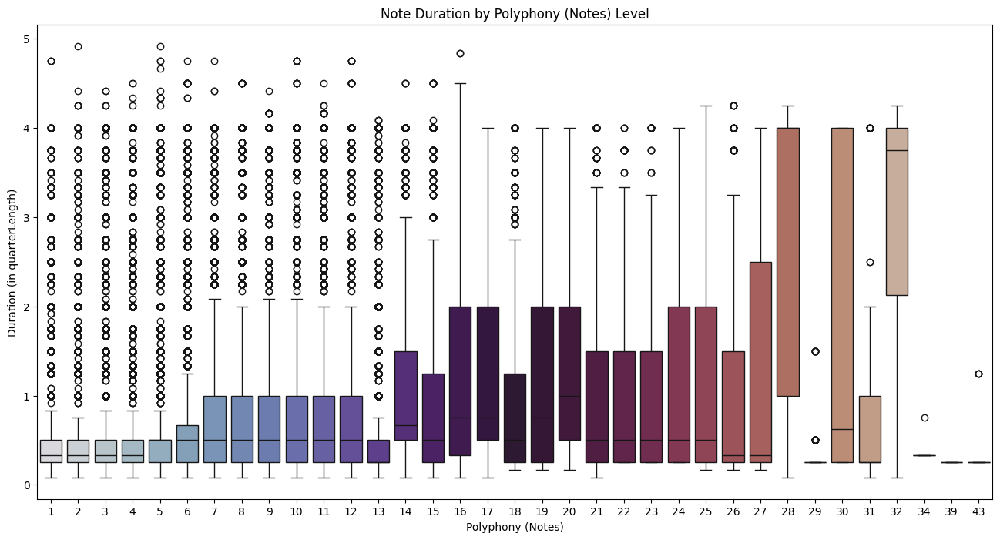

In [546]:
plt.figure(figsize=(16, 8))

# Create a boxplot to visualize how note duration changes with polyphony
sns.boxplot(data=df_filtered, x="polyphony_notes", y="duration", palette='twilight')

# Add a descriptive title and labels
plt.title("Note Duration by Polyphony (Notes) Level")
plt.xlabel("Polyphony (Notes)")
plt.ylabel("Duration (in quarterLength)")
plt.show()

##### Key Findings For The Polyphony (Voices) and Polyphony Notes Features
The analysis of polyphony_voices and polyphony_notes shows that these two features capture different aspects of musical texture. Polyphony_voices has a concentrated distribution (mode = 3, low variance), indicating relatively stable and homogeneous topological structures. In contrast, polyphony_notes is more spread out (mean = 6.23, higher variance), reflecting greater variability and richer topological complexity. Patterns vary strongly by key, instrument, and genre: major keys produce distinctive distributions, polyphonic instruments such as piano and organ generate dense peaks, and jazz stands out with the highest note-level polyphony compared to simpler profiles in rock or rap. Anomalies, such as extreme values for monophonic instruments like trombone (likely due to ensemble scoring or section arrangements), create meaningful outliers that can enhance clustering. Importantly, the relation between duration and polyphony differs across the two features: voices show smoother transitions, while notes display sharp discontinuities at high densities. Together, these features provide complementary perspectives on musical structure and should yield strong, multi-scale signals for TDA.

---

#### 2.3.8 Chord Tone Indicator

##### 2.3.8.1 Summary statistics and Distribution of Chord Tones (is_chord_tone)


In [547]:
# Descriptive stats: proportion and spread of chord vs non-chord tones
df['is_chord_tone'].describe()

count    638769.000000
mean          0.374808
std           0.484074
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max           1.000000
Name: is_chord_tone, dtype: float64

In [548]:
df_notes_only['is_chord_tone'].describe()

count    429888.000000
mean          0.556926
std           0.496749
min           0.000000
25%           0.000000
50%           1.000000
75%           1.000000
max           1.000000
Name: is_chord_tone, dtype: float64

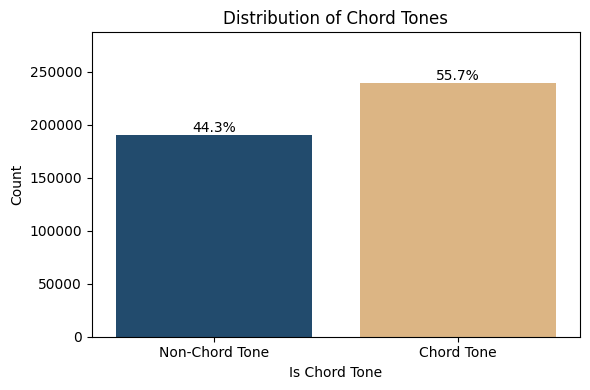

In [549]:
# Count the number of occurrences for each mode
total_chord_tones = df_notes_only['is_chord_tone'].value_counts().sum()
custom_labels = ["Non-Chord Tone", "Chord Tone"]

# Plot distribution of chord tones
plt.figure(figsize=(6, 4))
ax = sns.countplot(data=df_notes_only, x='is_chord_tone', palette=colors)
ax.set_xticklabels(custom_labels)
plt.title("Distribution of Chord Tones")
plt.xlabel("Is Chord Tone")
plt.ylabel("Count")

# Annotate bars with percentage labels
for p in ax.patches:
    count = p.get_height()
    percentage = 100 * count / total_chord_tones
    ax.annotate(f'{percentage:.1f}%', 
                (p.get_x() + p.get_width() / 2, count),
                ha='center', va='bottom', fontsize=10)
plt.ylim(0, max(df_notes_only['is_chord_tone'].value_counts()) * 1.2)
plt.tight_layout()
plt.show()

##### 2.3.8.2 Chord Tone Indicator in Context: Key, Instrument, and Genre

In [550]:
# Descriptive statistics of chord tones by key
print("Chord Tone Indicator statistics by Key:")
df_notes_only.groupby('key')['is_chord_tone'].describe().sort_index()

Chord Tone Indicator statistics by Key:


,count,mean,std,min,25%,50%,75%,max
key,,,,,,,,
0,37533.0,0.548477,0.497651,0.0,0.0,1.0,1.0,1.0
1,11542.0,0.620603,0.485258,0.0,0.0,1.0,1.0,1.0
2,28424.0,0.602730,0.489341,0.0,0.0,1.0,1.0,1.0
3,19869.0,0.566209,0.495609,0.0,0.0,1.0,1.0,1.0
4,8342.0,0.419324,0.493478,0.0,0.0,0.0,1.0,1.0
5,43881.0,0.629771,0.482871,0.0,0.0,1.0,1.0,1.0
6,7158.0,0.669181,0.470541,0.0,0.0,1.0,1.0,1.0
7,38144.0,0.633730,0.481791,0.0,0.0,1.0,1.0,1.0
8,2710.0,0.408856,0.491713,0.0,0.0,0.0,1.0,1.0


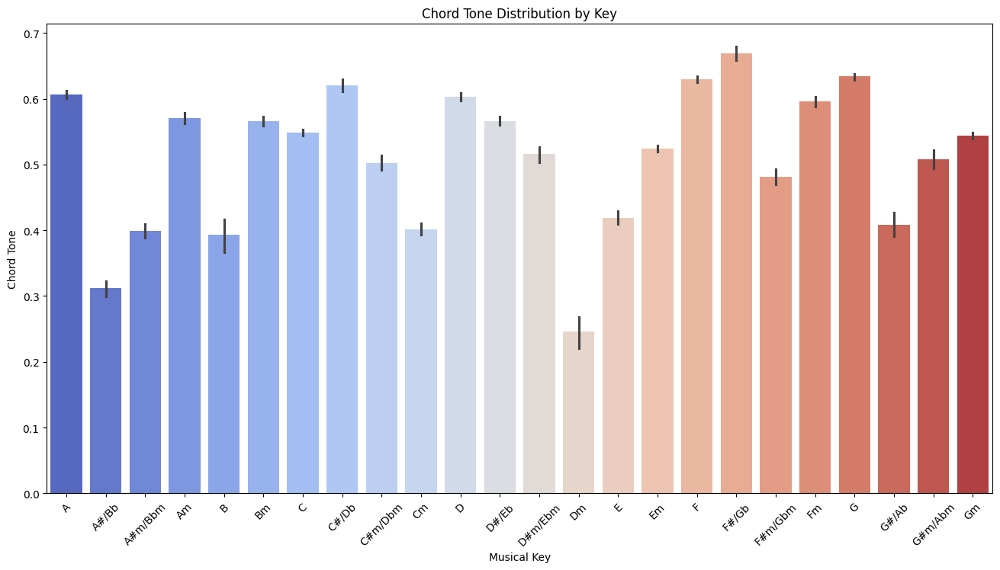

In [551]:
# Plot the results
plt.figure(figsize=(16, 8))
sns.barplot(data=df_notes_only, x='key_name', y='is_chord_tone', order=ordered_key_names, palette='coolwarm')
plt.title('Chord Tone Distribution by Key')
plt.xlabel('Musical Key')
plt.xticks(rotation=45)
plt.ylabel('Chord Tone')
plt.show()

In [552]:
# Descriptive statistics of chord tones by instrument
print("Chord Tone Indicator statistics by Instrument:")
df_notes_only.groupby('instrument')['is_chord_tone'].describe()

Chord Tone Indicator statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Acoustic Guitar,31060.0,0.455988,0.498067,0.0,0.0,0.0,1.0,1.0
Alto Saxophone,505.0,0.550495,0.497937,0.0,0.0,1.0,1.0,1.0
Bagpipes,4865.0,0.843988,0.362904,0.0,1.0,1.0,1.0,1.0
Banjo,872.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
Baritone Saxophone,1609.0,0.333748,0.471697,0.0,0.0,0.0,1.0,1.0
Bassoon,1729.0,0.322730,0.467656,0.0,0.0,0.0,1.0,1.0
Brass,2936.0,0.485354,0.499871,0.0,0.0,0.0,1.0,1.0
Choir,3971.0,0.594309,0.491087,0.0,0.0,1.0,1.0,1.0
Clarinet,998.0,0.105210,0.306978,0.0,0.0,0.0,0.0,1.0


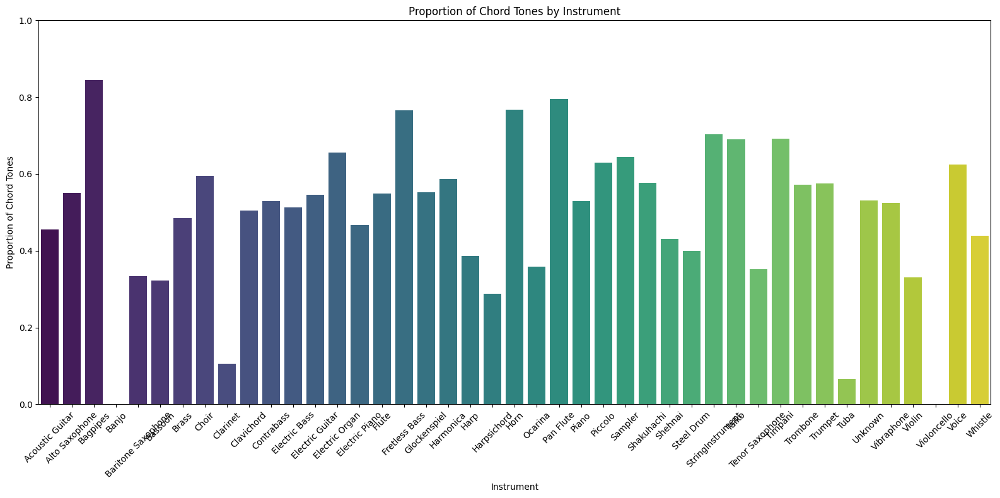

In [553]:
# Compute proportion of chord tones by instrument
chord_tone_by_instr = (
    df_notes_only.groupby('instrument')['is_chord_tone']
    .mean()
    .sort_index()  
    .reset_index()
)

# Plot
plt.figure(figsize=(16, 8))
sns.barplot(data=chord_tone_by_instr, x='instrument', y='is_chord_tone', palette='viridis')
plt.xticks(rotation=45)
plt.title('Proportion of Chord Tones by Instrument')
plt.xlabel('Instrument')
plt.ylabel('Proportion of Chord Tones')
plt.ylim(0, 1)
plt.tight_layout()
plt.show()

In [554]:
# Acoustic guitar investigation

# Compare acoustic guitar to other guitar types
guitar_instruments = df[df['instrument'].str.contains('Guitar', case=False, na=False)]
print("\nChord tone percentage by guitar type")
print(guitar_instruments.groupby('instrument')['is_chord_tone'].mean().sort_values(ascending=False))

# Acoustic guitar by genre
acoustic = df[df['instrument'] == 'Acoustic Guitar']
print("\nAcoustic guitar chord tones by genre")
print(acoustic.groupby('genre')['is_chord_tone'].mean().sort_values(ascending=False))

# Compare articulation ratio (ornaments indicator)
print("\nArticulation ratio comparison")
print(f"Acoustic guitar avg articulation: {acoustic['articulation_ratio'].mean():.3f}")
print(f"All instruments avg articulation: {df['articulation_ratio'].mean():.3f}")

# Polyphony comparison
print("\nPolyphony comparison")
print(f"Acoustic guitar avg polyphony: {acoustic['polyphony_notes'].mean():.1f}")
print(f"All instruments avg polyphony: {df['polyphony_notes'].mean():.1f}")


Chord tone percentage by guitar type
instrument
Electric Guitar    0.359099
Acoustic Guitar    0.305066
Name: is_chord_tone, dtype: float64

Acoustic guitar chord tones by genre
genre
jazz           0.469761
new_age        0.402397
disco          0.300578
dance          0.294902
rnb            0.166777
pop            0.147524
rap            0.059526
country        0.000000
heavy_metal    0.000000
soul           0.000000
Name: is_chord_tone, dtype: float64

Articulation ratio comparison
Acoustic guitar avg articulation: 1.000
All instruments avg articulation: 1.008

Polyphony comparison
Acoustic guitar avg polyphony: 5.5
All instruments avg polyphony: 4.9


In [555]:
# Verify top instruments in country
df[df['genre'] == 'country']['instrument'].value_counts().head(10)

instrument
Piano              22547
Electric Guitar    18427
Flute               6246
Sampler             3065
Electric Piano      2878
Ocarina              856
Unknown               50
Acoustic Guitar        3
Name: count, dtype: int64

In [556]:
# Descriptive statistics of chord tone indicator by instrument family
print("Chord Tone Indicator statistics by Instrument Family:")
df_notes_only.groupby('instrument_family')['is_chord_tone'].describe()

Chord Tone Indicator statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument_family,,,,,,,,
Bass,21992.0,0.574436,0.494439,0.0,0.0,1.0,1.0,1.0
Brass,28615.0,0.591648,0.491538,0.0,0.0,1.0,1.0,1.0
Electronic,44646.0,0.639251,0.480223,0.0,0.0,1.0,1.0,1.0
Guitar,123066.0,0.519494,0.499622,0.0,0.0,1.0,1.0,1.0
Keyboard,115183.0,0.540106,0.498391,0.0,0.0,1.0,1.0,1.0
Other,26486.0,0.509968,0.499910,0.0,0.0,1.0,1.0,1.0
Percussion,12714.0,0.583137,0.493059,0.0,0.0,1.0,1.0,1.0
Strings,20311.0,0.599429,0.490026,0.0,0.0,1.0,1.0,1.0
Voice,18044.0,0.624917,0.484158,0.0,0.0,1.0,1.0,1.0


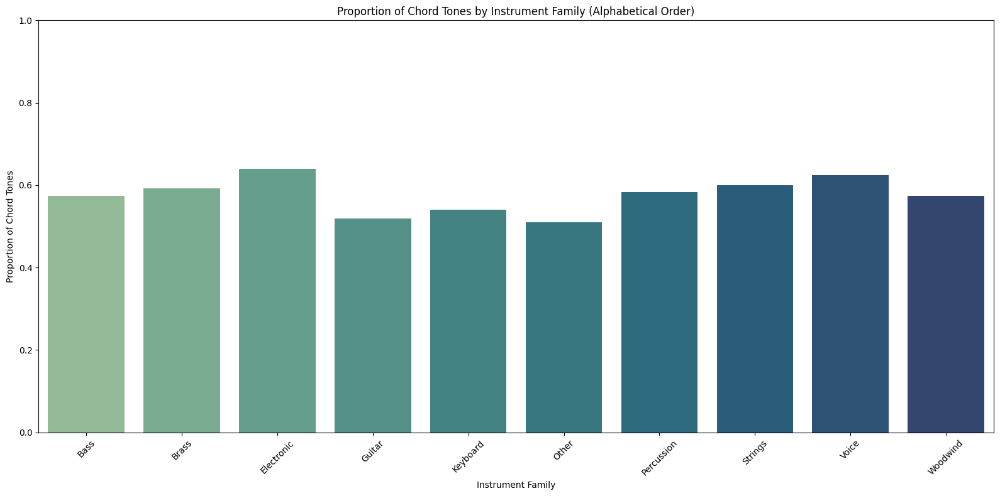

In [557]:
# Compute proportion of chord tones by instrument family (alphabetical order)
chord_tone_by_instr_fam = (
    df_notes_only.groupby('instrument_family')['is_chord_tone']
    .mean()
    .reset_index()
    .sort_values('instrument_family')  
)

# Plot
plt.figure(figsize=(16, 8))
sns.barplot(data=chord_tone_by_instr_fam, x='instrument_family', y='is_chord_tone', palette='crest')
plt.xticks(rotation=45)
plt.title('Proportion of Chord Tones by Instrument Family (Alphabetical Order)')
plt.xlabel('Instrument Family')
plt.ylabel('Proportion of Chord Tones')
plt.ylim(0, 1)
plt.tight_layout()
plt.show()

In [558]:
# Descriptive statistics of chord tones by genre
print("Chord tones statistics by Genre:")
df_notes_only.groupby('genre')['is_chord_tone'].describe()

Chord tones statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,21201.0,0.545965,0.497894,0.0,0.0,1.0,1.0,1.0
blues,35519.0,0.527830,0.499232,0.0,0.0,1.0,1.0,1.0
classical,31269.0,0.557453,0.496696,0.0,0.0,1.0,1.0,1.0
country,34558.0,0.634007,0.481715,0.0,0.0,1.0,1.0,1.0
dance,34253.0,0.446005,0.497083,0.0,0.0,0.0,1.0,1.0
disco,34775.0,0.660072,0.473691,0.0,0.0,1.0,1.0,1.0
heavy_metal,32227.0,0.646166,0.478166,0.0,0.0,1.0,1.0,1.0
jazz,21851.0,0.554391,0.497044,0.0,0.0,1.0,1.0,1.0
new_age,29586.0,0.642500,0.479272,0.0,0.0,1.0,1.0,1.0


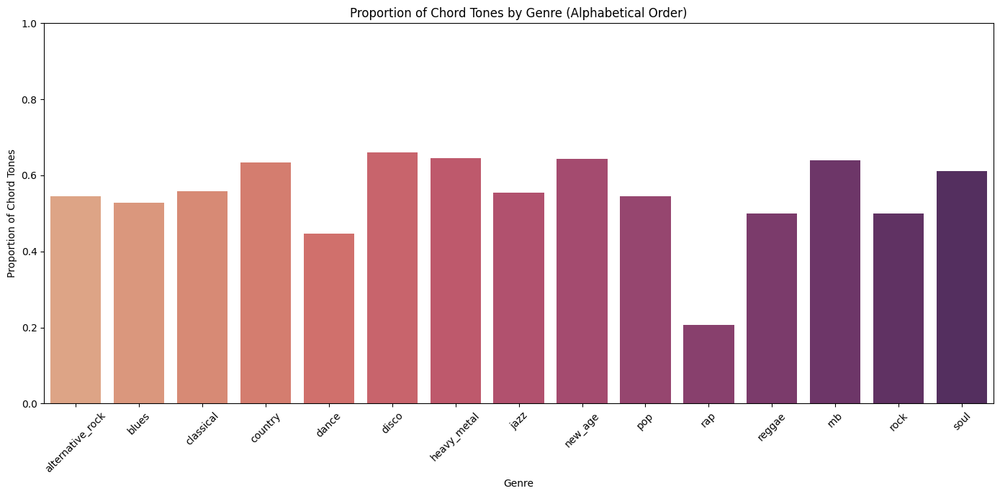

In [559]:
# Compute proportion of chord tones by genre (alphabetical order)
chord_tone_by_genre = (
    df_notes_only.groupby('genre')['is_chord_tone']
    .mean()
    .reset_index()
    .sort_values('genre') 
)

# Plot
plt.figure(figsize=(14, 7))
sns.barplot(data=chord_tone_by_genre, x='genre', y='is_chord_tone', palette='flare')
plt.xticks(rotation=45)
plt.title('Proportion of Chord Tones by Genre (Alphabetical Order)')
plt.xlabel('Genre')
plt.ylabel('Proportion of Chord Tones')
plt.ylim(0, 1)
plt.tight_layout()
plt.show()

##### 2.3.8.3 Evolution of Chord Tones Over Measures

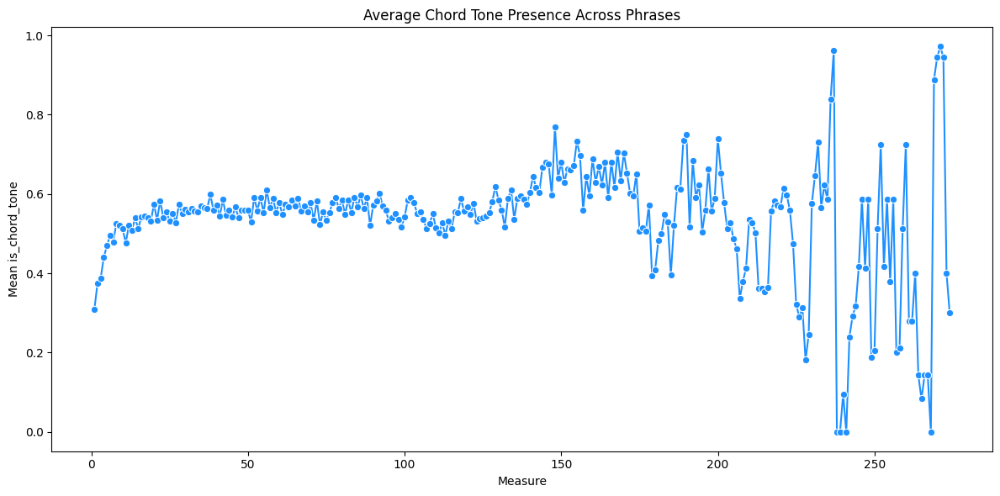

In [560]:
# Average chord tone presence per phrase 
chord_tone_by_phrase = df_notes_only.groupby("measure")["is_chord_tone"].mean().reset_index()

# Line plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=chord_tone_by_phrase, x="measure", y="is_chord_tone", marker="o", color='dodgerblue')
plt.title("Average Chord Tone Presence Across Phrases")
plt.xlabel("Measure")
plt.ylabel("Mean is_chord_tone")
plt.tight_layout()
plt.show()

##### 2.3.8.4 Relationship Between Chord Tones and Polyphony

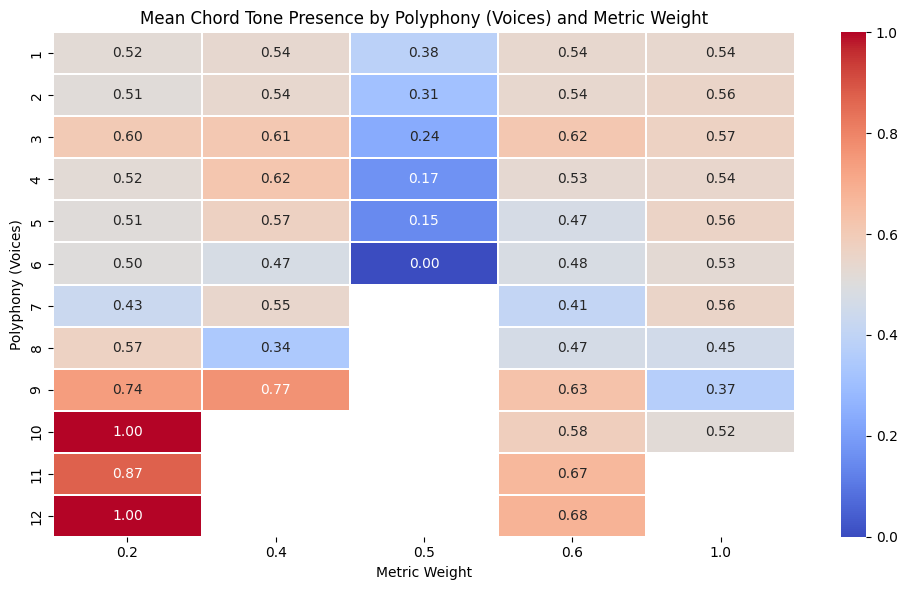

In [561]:
# Create a heatmap showing mean chord tone by polyphony (Voices) and metric weight
chord_tones_pivot = df_notes_only.pivot_table(values='is_chord_tone', index='polyphony_voices', columns='metric_weight', aggfunc='mean')
chord_tones_pivot = chord_tones_pivot.sort_index().sort_index(axis=1)

# Plot
plt.figure(figsize=(10, 6))
sns.heatmap(chord_tones_pivot, cmap='coolwarm', annot=True, fmt=".2f", linewidths=0.2)
plt.title("Mean Chord Tone Presence by Polyphony (Voices) and Metric Weight")
plt.xlabel("Metric Weight")
plt.ylabel("Polyphony (Voices)")
plt.tight_layout()
plt.show()

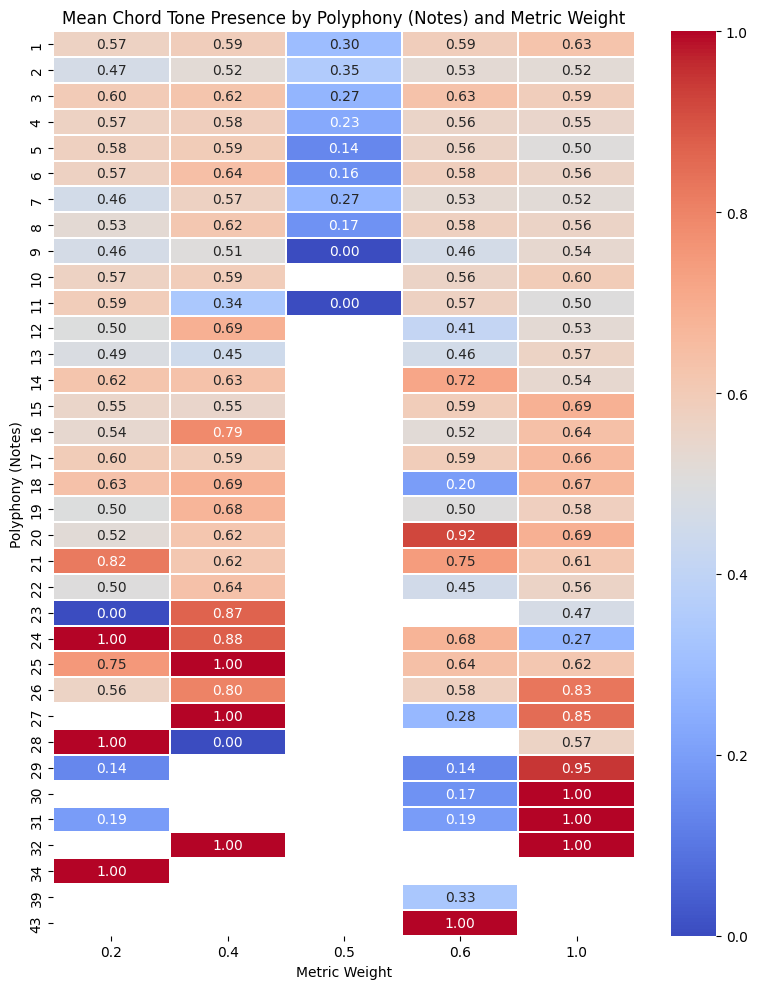

In [562]:
# Create a heatmap showing mean chord tone by polyphony (Notes) and metric weight
chord_tones_pivot = df_notes_only.pivot_table(values='is_chord_tone', index='polyphony_notes', columns='metric_weight', aggfunc='mean')
chord_tones_pivot = chord_tones_pivot.sort_index().sort_index(axis=1)

# Plot
plt.figure(figsize=(8, 10))
sns.heatmap(chord_tones_pivot, cmap='coolwarm', annot=True, fmt=".2f", linewidths=0.2)
plt.title("Mean Chord Tone Presence by Polyphony (Notes) and Metric Weight")
plt.xlabel("Metric Weight")
plt.ylabel("Polyphony (Notes)")
plt.tight_layout()
plt.show()

##### 2.3.8.5 Verification of Observed chord_tone Patterns

In [563]:
# Temporal evolution by genre
for genre in df_notes_only['genre'].unique():
    genre_data = df_notes_only[df_notes_only['genre'] == genre]
    if len(genre_data) > 0:
        print(f"\n{genre.upper()}:")
        print(f"  Early measures (0-50): {genre_data[genre_data['measure'] <= 50]['is_chord_tone'].mean():.3f}")
        print(f"  Middle (51-150): {genre_data[(genre_data['measure'] > 50) & (genre_data['measure'] <= 150)]['is_chord_tone'].mean():.3f}")
        print(f"  Late (150+): {genre_data[genre_data['measure'] > 150]['is_chord_tone'].mean():.3f}")



POP:
  Early measures (0-50): 0.515
  Middle (51-150): 0.566
  Late (150+): 0.542

HEAVY_METAL:
  Early measures (0-50): 0.624
  Middle (51-150): 0.664
  Late (150+): 0.619

DISCO:
  Early measures (0-50): 0.634
  Middle (51-150): 0.662
  Late (150+): 0.847

BLUES:
  Early measures (0-50): 0.561
  Middle (51-150): 0.510
  Late (150+): 0.486

ALTERNATIVE_ROCK:
  Early measures (0-50): 0.571
  Middle (51-150): 0.515
  Late (150+): nan

RNB:
  Early measures (0-50): 0.623
  Middle (51-150): 0.654
  Late (150+): nan

REGGAE:
  Early measures (0-50): 0.455
  Middle (51-150): 0.513
  Late (150+): 0.760

CLASSICAL:
  Early measures (0-50): 0.481
  Middle (51-150): 0.563
  Late (150+): 0.641

ROCK:
  Early measures (0-50): 0.519
  Middle (51-150): 0.477
  Late (150+): 0.290

NEW_AGE:
  Early measures (0-50): 0.552
  Middle (51-150): 0.651
  Late (150+): 0.880

DANCE:
  Early measures (0-50): 0.431
  Middle (51-150): 0.486
  Late (150+): 0.361

SOUL:
  Early measures (0-50): 0.617
  Middle (51

In [564]:
# Polyphony (Notes) and metric weight interaction
high_poly = df_notes_only[df_notes_only['polyphony_notes'] >= 8]
low_poly = df_notes_only[df_notes_only['polyphony_notes'] <= 2]

print(f"High polyphony (8+) chord tones: {high_poly['is_chord_tone'].mean():.3f}")
print(f"Low polyphony (1-2) chord tones: {low_poly['is_chord_tone'].mean():.3f}")

print(f"\nStrong beats (weight=1.0): {df_notes_only[df_notes_only['metric_weight'] == 1.0]['is_chord_tone'].mean():.3f}")
print(f"Weak beats (weight<0.5): {df_notes_only[df_notes_only['metric_weight'] < 0.5]['is_chord_tone'].mean():.3f}")


High polyphony (8+) chord tones: 0.546
Low polyphony (1-2) chord tones: 0.543

Strong beats (weight=1.0): 0.555
Weak beats (weight<0.5): 0.561


In [565]:
# Check extreme peaks/drops
extreme_high = df_notes_only.groupby('measure')['is_chord_tone'].mean()
print(f"Measures with >90% chord tones: {sum(extreme_high > 0.9)}")
print(f"Measures with <10% chord tones: {sum(extreme_high < 0.1)}")
print(f"Most harmonic measure: {extreme_high.idxmax()} ({extreme_high.max():.3f})")
print(f"Least harmonic measure: {extreme_high.idxmin()} ({extreme_high.min():.3f})")

Measures with >90% chord tones: 4
Measures with <10% chord tones: 6
Most harmonic measure: 271 (0.972)
Least harmonic measure: 238 (0.000)


In [566]:
print(df_notes_only[df_notes_only['measure'] == int(extreme_high.idxmax())][['genre', 'filename']])
print(df_notes_only[df_notes_only['measure'] == int(extreme_high.idxmin())][['genre', 'filename']])

            genre                                           filename
321771  classical  Serenade D-Dur KV 250 (248b) "Haffner-Serenade...
321772  classical  Serenade D-Dur KV 250 (248b) "Haffner-Serenade...
321773  classical  Serenade D-Dur KV 250 (248b) "Haffner-Serenade...
321774  classical  Serenade D-Dur KV 250 (248b) "Haffner-Serenade...
321775  classical  Serenade D-Dur KV 250 (248b) "Haffner-Serenade...
321776  classical  Serenade D-Dur KV 250 (248b) "Haffner-Serenade...
321777  classical  Serenade D-Dur KV 250 (248b) "Haffner-Serenade...
321778  classical  Serenade D-Dur KV 250 (248b) "Haffner-Serenade...
321780  classical  Serenade D-Dur KV 250 (248b) "Haffner-Serenade...
321781  classical  Serenade D-Dur KV 250 (248b) "Haffner-Serenade...
321782  classical  Serenade D-Dur KV 250 (248b) "Haffner-Serenade...
321783  classical  Serenade D-Dur KV 250 (248b) "Haffner-Serenade...
321784  classical  Serenade D-Dur KV 250 (248b) "Haffner-Serenade...
321785  classical  Serenade D-Dur 

In [567]:
# Verify potential anomalies

# Song duration by genre
print("Duration by genre")
print(df.groupby('genre')['measure'].max().sort_values())

# Number of songs by genre 
print("\nNumber of songs by genre")
print(df['genre'].value_counts())

# Extreme measures by genre
print("\nHighly harmonic measures (>90%)")
high_harmony = df[df['is_chord_tone'] > 0.9].groupby('genre').size()
print(high_harmony.sort_values(ascending=False))

print("\nLow harmonic measures (<10%)")
low_harmony = df[df['is_chord_tone'] < 0.1].groupby('genre').size()
print(low_harmony.sort_values(ascending=False))

# Reggae pattern verification
print("\nReggae verification")
reggae_data = df[df['genre'] == 'reggae'].groupby('measure')['is_chord_tone'].mean()
print(f"Reggae measures: {reggae_data.index.min()} to {reggae_data.index.max()}")
print(f"Reggae late (>150): {reggae_data[reggae_data.index > 150].mean():.3f}")

Duration by genre
genre
rap                 128
rnb                 129
alternative_rock    134
country             141
soul                146
jazz                154
rock                155
disco               173
new_age             176
pop                 205
blues               208
reggae              208
dance               229
heavy_metal         236
classical           274
Name: measure, dtype: int64

Number of songs by genre
genre
dance               54471
blues               54451
country             54072
disco               51137
reggae              46331
soul                45599
rock                42943
new_age             41925
heavy_metal         41747
rnb                 37920
pop                 37118
classical           36582
jazz                33181
rap                 32462
alternative_rock    28830
Name: count, dtype: int64

Highly harmonic measures (>90%)
genre
disco               22954
country             21910
heavy_metal         20824
new_age             190

##### Key Findings For The Chord Tone Feature
The is_chord_tone feature captures a musically meaningful balance between harmonic stability and melodic richness: when silences are excluded, about 56% of events are chord tones and 44% are non-chord tones, reflecting a strong tonal anchor alongside expressive passing tones and ornaments. This ratio varies significantly by key (25–67%) and genre, with harmony-driven styles like disco and classical reaching ~65% while rap remains around 20%. Instrument-level results are broadly coherent (e.g., saxophone and flutes high, percussive sounds low), but guitars show systematically low values—partly due to labeling biases in the corpus that must be interpreted with caution. Temporal analysis shows overall stability near 55–60%, with late-section surges in harmonic density in styles such as new age and disco, contrasted with declines in rap and rock. Extreme within-work contrasts, such as Mozart passages alternating between near-total chord tones and none, highlight the feature’s sensitivity to structural variation. Overall, is_chord_tone proves a robust stylistic discriminator, effectively differentiating tonal profiles across keys, instruments, and genres while also exposing corpus biases.

---

#### 2.3.9 Key

##### 2.3.9.1 Central Tendency and Spread of Key



In [568]:
# Descriptive stats: proportion and spread of keys
df['key'].describe()

count    638769.000000
mean         10.839959
std           7.456345
min           0.000000
25%           5.000000
50%           9.000000
75%          18.000000
max          23.000000
Name: key, dtype: float64

In [569]:
# Central tendency
mean_key = df['key'].mean()
median_key = df['key'].median()
mode_key = df['key'].mode()[0]  

# Spread
std_key = df['key'].std()

# Display results
print(f"Mean key: {mean_key:.2f}")
print(f"Median key: {median_key:.2f}")
print(f"Mode key: {mode_key:.2f}")
print(f"Standard key: {std_key:.2f}")

Mean key: 10.84
Median key: 9.00
Mode key: 19.00
Standard key: 7.46


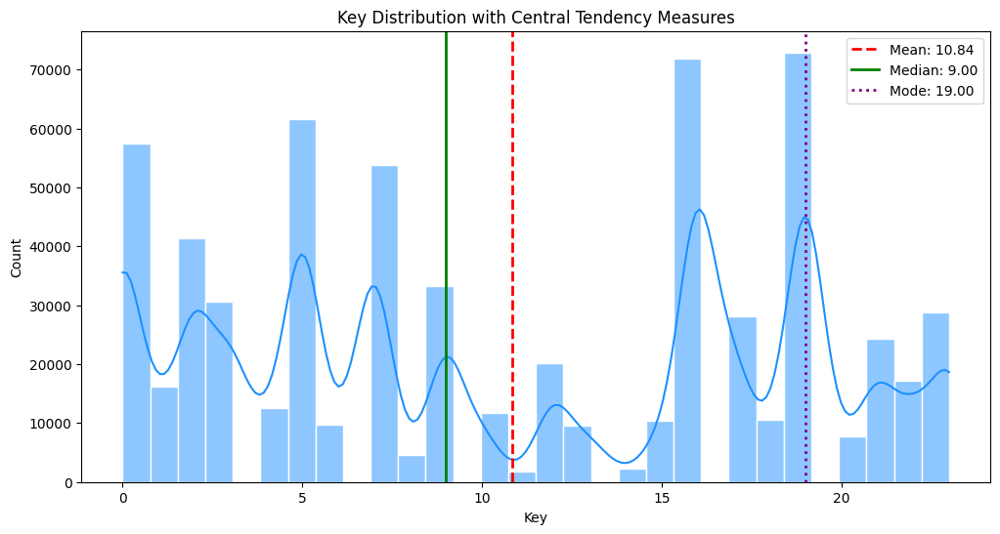

In [570]:
plt.figure(figsize=(12, 6))
sns.histplot(df['key'], bins=30, kde=True, color='dodgerblue', edgecolor='white')

# Add lines for mean, median, and mode
plt.axvline(mean_key, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_key:.2f}')
plt.axvline(median_key, color='green', linestyle='-', linewidth=2, label=f'Median: {median_key:.2f}')
plt.axvline(mode_key, color='purple', linestyle=':', linewidth=2, label=f'Mode: {mode_key:.2f}')

plt.title('Key Distribution with Central Tendency Measures')
plt.xlabel('Key')
plt.ylabel('Count')
plt.legend()
plt.show()

##### 2.3.9.2 Key Mode Distribution: Major vs Minor

In [571]:
# Create a new column that labels each key as Major (0–11) or Minor (12–23)
df["key_mode"] = df["key"].apply(lambda x: "Major" if x < 12 else "Minor")
df_notes_only["key_mode"] = df_notes_only["key"].apply(lambda x: "Major" if x < 12 else "Minor")

# Count the number of occurrences for each mode
total_key_modes = df['key_mode'].value_counts().sum()

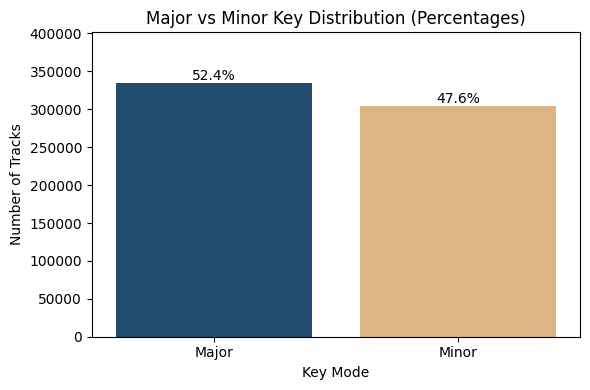

In [572]:
# Create the countplot
plt.figure(figsize=(6, 4))
ax = sns.countplot(data=df, x='key_mode', palette=colors)
plt.title("Major vs Minor Key Distribution (Percentages)")
plt.xlabel("Key Mode")
plt.ylabel("Number of Tracks")

# Annotate bars with percentage labels
for p in ax.patches:
    count = p.get_height()
    percentage = 100 * count / total_key_modes
    ax.annotate(f'{percentage:.1f}%', 
                (p.get_x() + p.get_width() / 2, count),
                ha='center', va='bottom', fontsize=10)
plt.ylim(0, max(df['key_mode'].value_counts()) * 1.2)
plt.tight_layout()
plt.show()

##### 2.9.3.3 Genre Distribution Across Keys

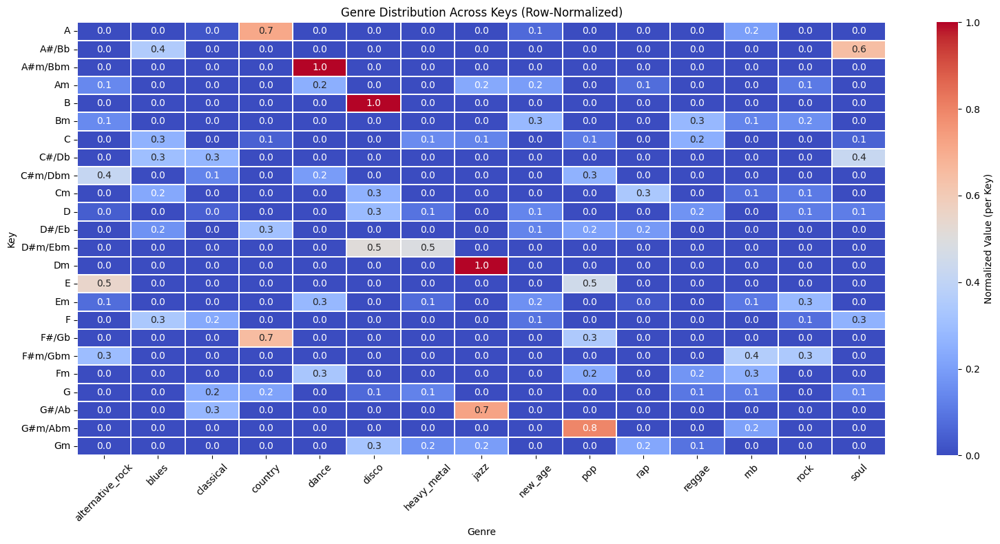

In [573]:
# Compute raw counts
heatmap_data = pd.crosstab(df["key_name"], df["genre"])

# Normalize by row (proportions per key_name)
normalized_data = heatmap_data.div(heatmap_data.sum(axis=1), axis=0)

# Plot the heatmap with normalized values as annotations
plt.figure(figsize=(16, 8))
sns.heatmap(normalized_data, cmap="coolwarm", annot=True, fmt=".1f", linewidths=0.2, cbar_kws={'label': 'Normalized Value (per Key)'})
plt.title("Genre Distribution Across Keys (Row-Normalized)")
plt.xlabel("Genre")
plt.xticks(rotation=45)
plt.ylabel("Key")
plt.tight_layout()
plt.show()

##### Key Findings For The Key Feature
The analysis of key distribution reveals a clear bimodal pattern, with peaks around C major (0) and G major (19), both highly common in popular music. Measures of central tendency diverge—median 9.0, mode 19.0, and mean 10.84—highlighting an asymmetric distribution with high dispersion (SD = 7.46). The split between major (52.4%) and minor (47.6%) keys is strikingly balanced, suggesting tonal diversity across the corpus. Genre-specific patterns are strong: heavy metal gravitates almost exclusively toward D minor, dance and disco cluster around dance-friendly tonalities, jazz shows wide tonal variety, and blues aligns with its traditional key centers. These findings underline that key is not randomly distributed but closely linked to stylistic identity and harmonic practice. As such, key emerges as a promising predictor of genre in the TDA framework.

---

#### 2.3.10 Local Key

##### 2.3.10.1 Central Tendency and Spread of Local Key



In [574]:
# Descriptive stats: proportion and spread of local keys
df['local_key'].describe()

count    638769.000000
mean          9.655854
std           6.971897
min           0.000000
25%           4.000000
50%           8.000000
75%          16.000000
max          23.000000
Name: local_key, dtype: float64

In [575]:
# Explore statistics with notes only
df_notes_only['local_key'].describe()

count    429888.000000
mean          9.631502
std           6.947599
min           0.000000
25%           4.000000
50%           8.000000
75%          16.000000
max          23.000000
Name: local_key, dtype: float64

In [576]:
# Central tendency
mean_local_key = df_notes_only['local_key'].mean()
median_local_key = df_notes_only['local_key'].median()
mode_local_key = df_notes_only['local_key'].mode()[0]  

# Spread
std_local_key = df_notes_only['local_key'].std()

# Display results
print(f"Mean local key: {mean_local_key:.2f}")
print(f"Median local key: {median_local_key:.2f}")
print(f"Mode local key: {mode_local_key:.2f}")
print(f"Standard local key: {std_local_key:.2f}")

Mean local key: 9.63
Median local key: 8.00
Mode local key: 0.00
Standard local key: 6.95


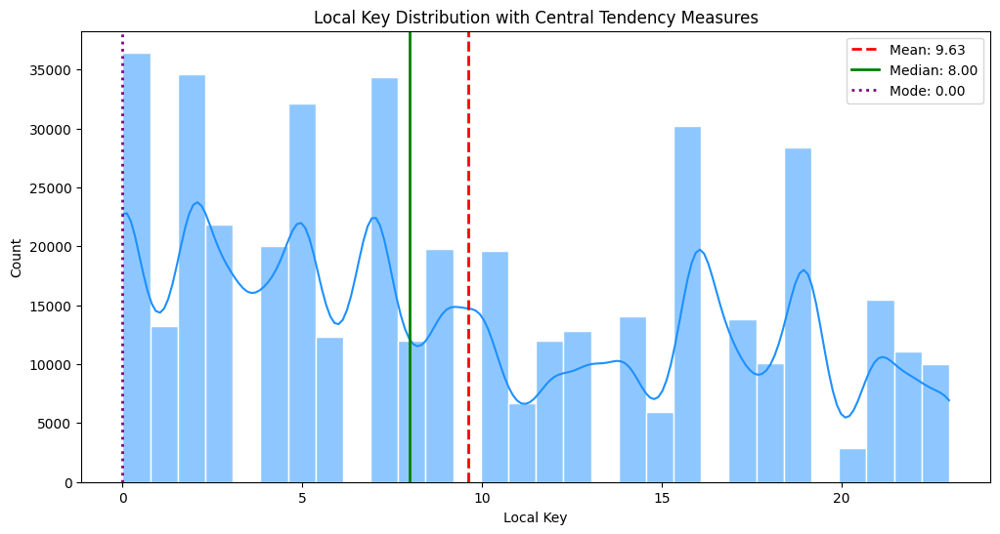

In [577]:
plt.figure(figsize=(12, 6))
sns.histplot(df_notes_only['local_key'], bins=30, kde=True, color='dodgerblue', edgecolor='white')

# Add lines for mean, median, and mode
plt.axvline(mean_local_key, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_local_key:.2f}')
plt.axvline(median_local_key, color='green', linestyle='-', linewidth=2, label=f'Median: {median_local_key:.2f}')
plt.axvline(mode_local_key, color='purple', linestyle=':', linewidth=2, label=f'Mode: {mode_local_key:.2f}')

plt.title('Local Key Distribution with Central Tendency Measures')
plt.xlabel('Local Key')
plt.ylabel('Count')
plt.legend()
plt.show()

In [578]:
# Check distribution of local keys to make sure 0 is not overrepresented
identical = (df_notes_only['key'] == df_notes_only['local_key']).sum()
print(f"Tonal stability ratio: {identical/len(df_notes_only):.2%}")
print(f"Proportion of modulated events (local_key ≠ key): {1-(identical/len(df_notes_only)):.2%}")

# Distribution of global keys
print("\n", df_notes_only['key'].value_counts().head())

Tonal stability ratio: 36.22%
Proportion of modulated events (local_key ≠ key): 63.78%

 key
16    51693
19    47161
5     43881
7     38144
0     37533
Name: count, dtype: int64


In [579]:
# Check distribution of local keys for each genre 
df_notes_only.groupby('genre')['key'].apply(lambda x: (df_notes_only.loc[x.index, 'key'] == df_notes_only.loc[x.index, 'local_key']).mean()).sort_values(ascending=False)

genre
rap                 0.565652
country             0.472684
reggae              0.465173
alternative_rock    0.449224
dance               0.442355
classical           0.380505
pop                 0.377493
rnb                 0.364879
disco               0.345852
soul                0.337151
blues               0.318759
new_age             0.286791
jazz                0.275777
heavy_metal         0.264313
rock                0.161683
Name: key, dtype: float64

##### 2.3.10.2 Local Key in Context: Instrument and Genre

In [580]:
# Descriptive statistics of local keys by instrument
print("Local Key statistics by Instrument:")
df_notes_only.groupby('instrument')['local_key'].describe()

Local Key statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Acoustic Guitar,31060.0,11.014488,6.607273,0.0,4.0,12.0,16.0,23.0
Alto Saxophone,505.0,4.613861,3.942469,0.0,0.0,5.0,7.0,12.0
Bagpipes,4865.0,3.649743,2.959609,1.0,1.0,1.0,6.0,20.0
Banjo,872.0,18.201835,1.990932,16.0,16.0,20.0,20.0,20.0
Baritone Saxophone,1609.0,5.628962,4.565137,0.0,0.0,5.0,7.0,14.0
Bassoon,1729.0,8.012146,5.236244,0.0,7.0,7.0,7.0,21.0
Brass,2936.0,6.778610,6.335431,0.0,0.0,5.0,13.0,23.0
Choir,3971.0,8.594812,7.888343,0.0,2.0,4.0,16.0,23.0
Clarinet,998.0,9.167335,4.893557,1.0,4.0,13.0,13.0,18.0


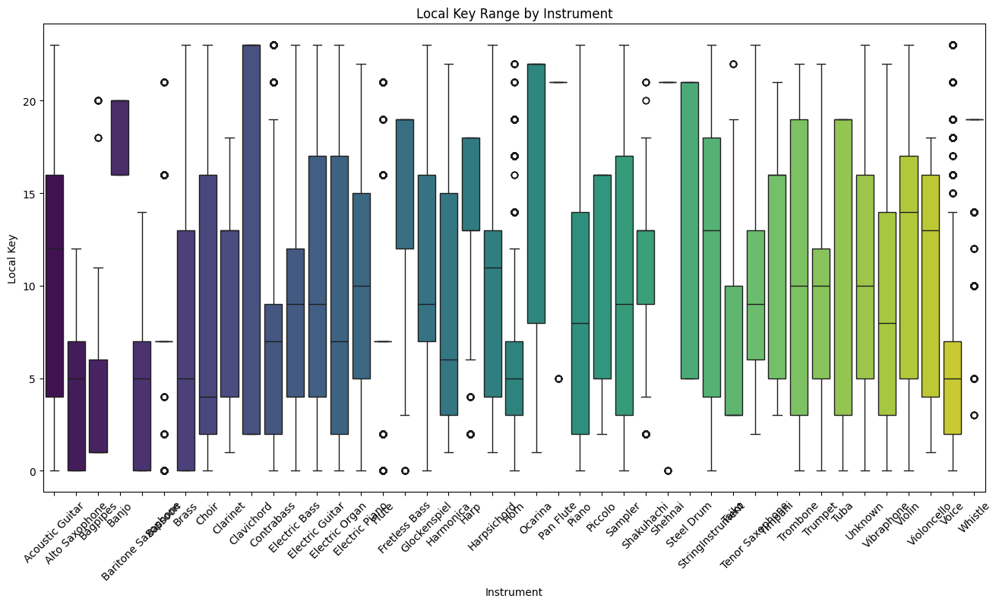

In [581]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='instrument', y='local_key', palette='viridis', order=alphabetic_order)
plt.xticks(rotation=45)
plt.title('Local Key Range by Instrument')
plt.xlabel('Instrument')
plt.ylabel('Local Key')
plt.show()

In [582]:
# Descriptive statistics of local key by instrument family
print("Local Key statistics by Instrument Family:")
df_notes_only.groupby('instrument_family')['local_key'].describe()

Local Key statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument_family,,,,,,,,
Bass,21992.0,10.166060,6.854456,0.0,4.0,8.0,18.0,23.0
Brass,28615.0,8.531085,6.387955,0.0,5.0,7.0,14.0,22.0
Electronic,44646.0,9.663956,6.991051,0.0,3.0,9.0,17.0,23.0
Guitar,123066.0,10.610534,7.222241,0.0,4.0,9.0,16.0,23.0
Keyboard,115183.0,8.935694,6.851684,0.0,2.0,8.0,15.0,23.0
Other,26486.0,9.445443,6.898040,0.0,3.0,10.0,15.0,23.0
Percussion,12714.0,9.377930,5.439708,0.0,5.0,9.0,15.0,23.0
Strings,20311.0,11.335434,6.791013,0.0,6.0,13.0,18.0,23.0
Voice,18044.0,6.487475,5.700054,0.0,2.0,5.0,7.0,23.0


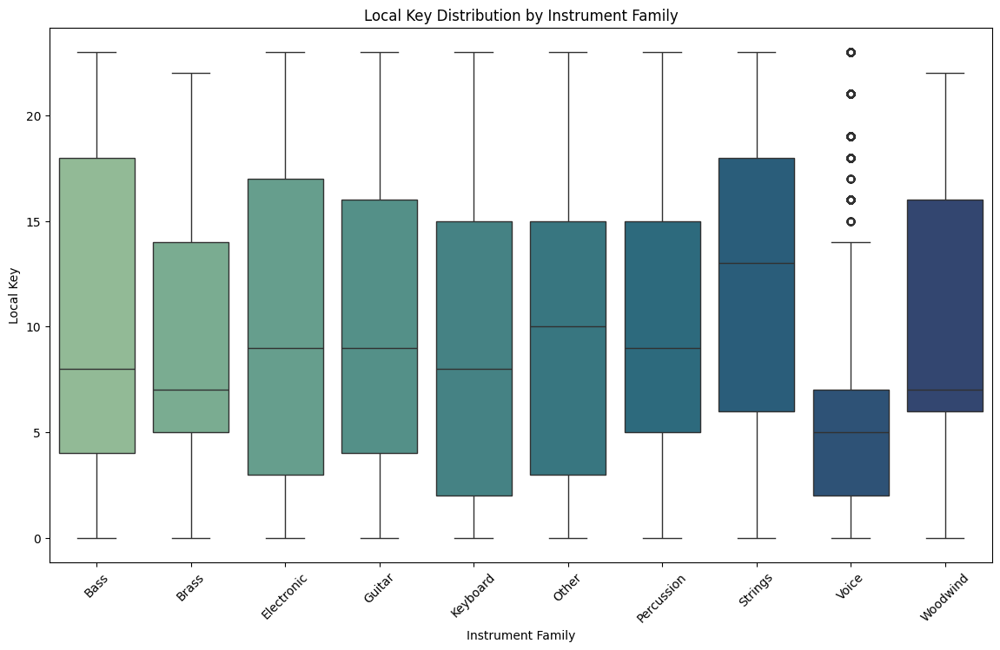

In [583]:
# Filter and plot local key distribution by instrument family
plt.figure(figsize=(14,8))
sns.boxplot(
    data=df_notes_only,
    x='instrument_family',
    y='local_key',
    palette='crest',
    order=families
)
plt.title('Local Key Distribution by Instrument Family')
plt.xlabel('Instrument Family')
plt.ylabel('Local Key')
plt.xticks(rotation=45)
plt.show()

In [584]:
# Descriptive statistics of local key by genre
print("Local key statistics by Genre:")
df_notes_only.groupby('genre')['local_key'].describe()

Local key statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,21201.0,11.647705,6.894076,0.0,4.0,11.0,18.0,23.0
blues,35519.0,7.569977,6.275180,0.0,3.0,5.0,12.0,23.0
classical,31269.0,7.639387,6.120109,0.0,2.0,7.0,13.0,23.0
country,34558.0,7.573008,5.768587,0.0,3.0,7.0,9.0,23.0
dance,34253.0,12.544273,6.854995,0.0,6.0,16.0,17.0,22.0
disco,34775.0,10.216937,6.842755,0.0,4.0,10.0,18.0,23.0
heavy_metal,32227.0,9.584044,6.975570,0.0,2.0,9.0,15.0,23.0
jazz,21851.0,9.852135,7.217222,0.0,3.0,9.0,17.0,23.0
new_age,29586.0,10.608294,6.233552,0.0,5.0,10.0,16.0,23.0


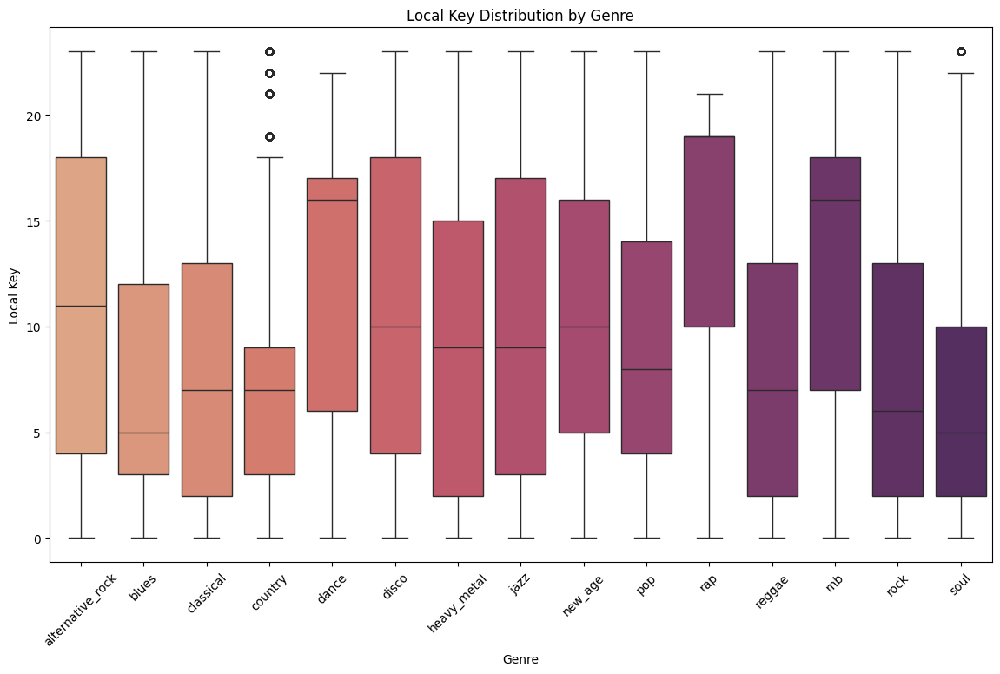

In [585]:
plt.figure(figsize=(14,8))
sns.boxplot(
    data=df_notes_only,
    x='genre',
    y='local_key',
    palette='flare',
    order=genres_sorted
)
plt.title('Local Key Distribution by Genre')
plt.xlabel('Genre')
plt.ylabel('Local Key')
plt.xticks(rotation=45)
plt.show()

##### 2.3.10.3 Local Key Summary Statistics by Temporal Section

In [586]:
# Summary statistics of local_key by temporal section
stats_temporal = df_notes_only.groupby('temporal_section')['local_key'].describe()

print("Local key statistics by temporal segment:")
print("\n", stats_temporal)

Local key statistics by temporal segment:

                      count      mean       std  min  25%  50%   75%   max
temporal_section                                                         
intro             107669.0  9.532540  7.059992  0.0  3.0  8.0  16.0  23.0
late              107474.0  9.662151  6.812093  0.0  4.0  8.0  16.0  23.0
middle            214745.0  9.665780  6.957500  0.0  4.0  9.0  16.0  23.0


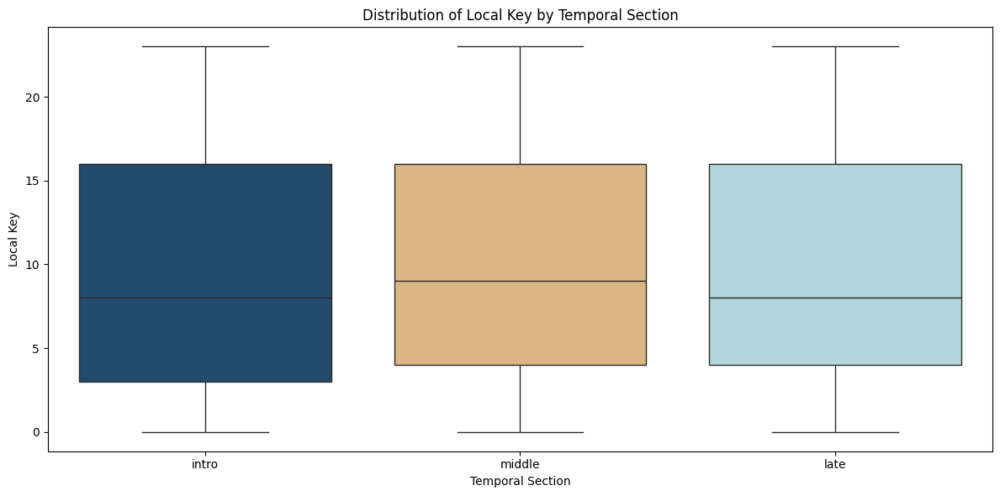

In [587]:
# Plot a boxplot of local_key distribution across temporal sections
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_notes_only, x='temporal_section', y='local_key', palette=colors)

# Set the plot title and axis labels in English
plt.title("Distribution of Local Key by Temporal Section")
plt.xlabel("Temporal Section")
plt.ylabel("Local Key")
plt.tight_layout()
plt.show()

##### 2.3.10.4 Distribution of Average Tonal Centers Across Measures

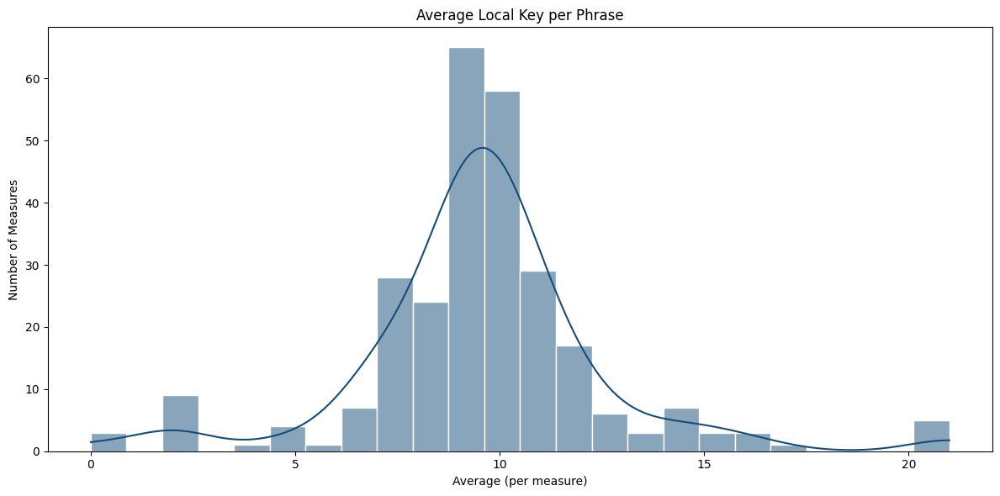

In [588]:
measure_stats = df_notes_only.groupby('measure')['local_key'].agg(['mean', 'std', 'count'])

# Plot the histogram
plt.figure(figsize=(12, 6))
sns.histplot(measure_stats['mean'], bins=24, kde=True, color=colors[0], edgecolor='white')
plt.title("Average Local Key per Phrase")
plt.xlabel("Average (per measure)")
plt.ylabel("Number of Measures")
plt.tight_layout()
plt.show()

##### 2.3.10.5 Local Key Entropy per Measure

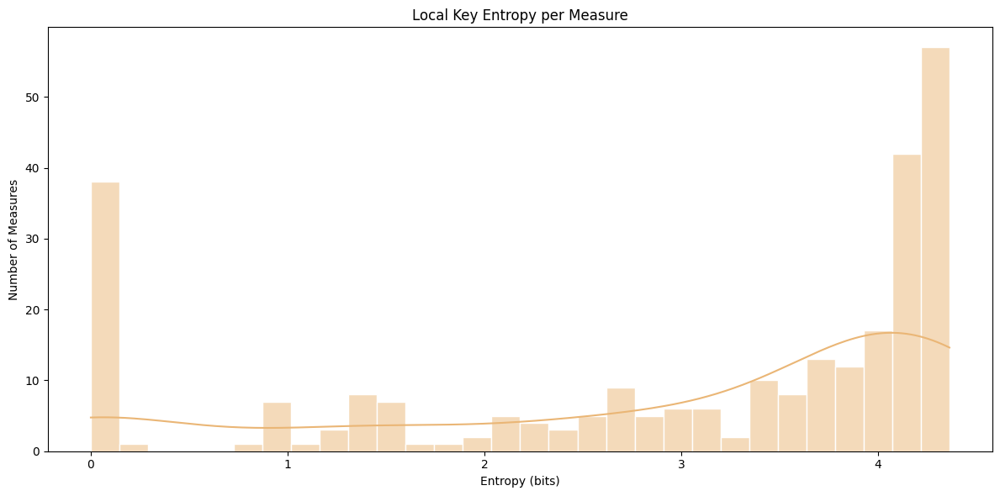

In [589]:
# Compute entropy of local_key distribution within each measure
def compute_local_key_entropy(group):
    return entropy(group['local_key'].value_counts(normalize=True), base=2)

# Apply entropy computation for each phrase
entropy_by_measure = df_notes_only.groupby('measure').apply(compute_local_key_entropy)

# Plot histogram of entropy values
plt.figure(figsize=(12, 6))
sns.histplot(entropy_by_measure, bins=30, color=colors[1], edgecolor='white', kde=True)
plt.title("Local Key Entropy per Measure")
plt.xlabel("Entropy (bits)")
plt.ylabel("Number of Measures")
plt.tight_layout()
plt.show()

##### Key Findings For The Local Key Feature
The analysis of local key reveals a strong contrast between tonal stability and modulation, with 63.7% of events occurring in a different local key than the global one—evidence of rich harmonic diversity. Unlike the global key distribution, which peaks at G major (19), the local key distribution is more uniform and exploratory, with its mode at C (0). Clear instrumental patterns emerge: low-register instruments favor lower keys, acoustic guitar spans the widest tonal palette, while electronic instruments exhibit the most uniform dispersion. Genre-specific signatures also stand out, with soul and rock leaning toward stable tonalities, rap and reggae centered around higher keys, and alternative rock showing the greatest variance. Temporal analysis indicates high entropy in certain sections (e.g., bridges), but overall coherence across intro, middle, and late sections. Removing silences reduces the dataset by one-third without altering distributions, and actually strengthens modulation detection—confirming silences are noise for tonal analysis. Altogether, local key provides a powerful lens for distinguishing genres, instruments, and compositional complexity within the TDA framework.

---

#### 2.3.11 Time Signature

##### 2.3.11.1 Feature Transformation: Encoding Metrical Structure from time_signature for Quantitative Analysis

In [590]:
# Get unique time signature values in the dataset
df['time_signature'].unique()

array(['4/4', '3/4', '4/8', '6/8', '12/8', '2/4', '9/8', '6/4', '1/8'],
      dtype=object)

In [591]:
# Clean and normalize time signatures
def clean_time_signature(time_sig):
    if time_sig in ['4/8', '2/2']:  # Equivalent to 4/4
        return '4/4'
    elif time_sig == '2/8':  # Equivalent to 2/4
        return '2/4'
    elif time_sig == '1/8':  # Probably an error
        return '4/4'  
    return time_sig

In [592]:
df['time_signature'] = df['time_signature'].apply(clean_time_signature)
df['time_signature'].unique()

array(['4/4', '3/4', '6/8', '12/8', '2/4', '9/8', '6/4'], dtype=object)

In [593]:
# Function to convert time_signature into two numerical features
def encode_time_signature(ts):
    try:
        if '/' not in ts:
            return [None, None]
        numerator, denominator = map(int, ts.split('/'))
        
        # Détermination de la division rythmique
        if numerator == 3:  # 3/4, 3/8, etc.
            rhythmic_division = 1  # Ternaire simple
        elif numerator in [6, 12]:  # Composés binaires
            rhythmic_division = 0  # Binaire (2 ou 4 groupes de 3)
        elif numerator == 9:  # Composé ternaire
            rhythmic_division = 1  # Ternaire (3 groupes de 3)
        else:  # 2/4, 4/4, 5/4, etc.
            rhythmic_division = 0  # Binaire
            
        return [numerator, rhythmic_division]
    except:
        return [None, None]

In [594]:
df[['nb_beats', 'rhythmic_division']] = df['time_signature'].apply(lambda x: pd.Series(encode_time_signature(x)))
df_notes_only[['nb_beats', 'rhythmic_division']] = df_notes_only['time_signature'].apply(lambda x: pd.Series(encode_time_signature(x)))

##### 2.3.11.2 Central Tendency and Spread of Time Signature Values

In [595]:
# Descriptive stats
print(df['time_signature'].describe())
print("\n", df['time_signature'].value_counts())

count     638769
unique         7
top          4/4
freq      593144
Name: time_signature, dtype: object

 time_signature
4/4     593144
3/4      22973
12/8     10929
6/8       4578
6/4       4024
2/4       1856
9/8       1265
Name: count, dtype: int64


In [596]:
print(df['nb_beats'].describe())

count    638769.000000
mean          4.131935
std           1.108406
min           2.000000
25%           4.000000
50%           4.000000
75%           4.000000
max          12.000000
Name: nb_beats, dtype: float64


In [597]:
print(df['rhythmic_division'].describe())
print("\n", df['rhythmic_division'].value_counts())

count    638769.000000
mean          0.037945
std           0.191063
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           1.000000
Name: rhythmic_division, dtype: float64

 rhythmic_division
0    614531
1     24238
Name: count, dtype: int64


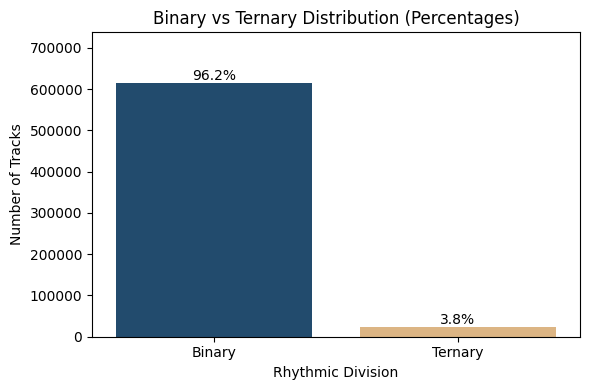

In [598]:
# Count the number of occurrences for each mode
total_rhythmic_divisions = df['rhythmic_division'].value_counts().sum()

# Create the countplot
plt.figure(figsize=(6, 4))
ax = sns.countplot(data=df, x='rhythmic_division', palette=colors)
plt.title("Binary vs Ternary Distribution (Percentages)")
plt.xlabel("Rhythmic Division")
plt.ylabel("Number of Tracks")

# Annotate bars with percentage labels
for p in ax.patches:
    count = p.get_height()
    percentage = 100 * count / total_rhythmic_divisions
    ax.annotate(f'{percentage:.1f}%',
                (p.get_x() + p.get_width() / 2, count),
                ha='center', va='bottom', fontsize=10)

# Remplacer les valeurs de l'axe x par des libellés
labels = ["Binary", "Ternary"]
plt.xticks(ticks=[0, 1], labels=labels)

plt.ylim(0, max(df['rhythmic_division'].value_counts()) * 1.2)
plt.tight_layout()
plt.show()


##### 2.3.11.3 Time Signature Values in Context: Key, Instrument, and Genre

In [599]:
# Descriptive statistics of time signature values by key
print("Time Signature statistics by Key:")
df.groupby('key')[['nb_beats', 'rhythmic_division']].describe().sort_index()

Time Signature statistics by Key:


nb_beats                                               rhythmic_division  \
       count      mean       std  min  25%  50%  75%   max             count   
key                                                                            
0    57396.0  5.453028  3.185226  3.0  4.0  4.0  4.0  12.0           57396.0   
1    16127.0  4.000000  0.000000  4.0  4.0  4.0  4.0   4.0           16127.0   
2    41409.0  3.910358  0.413827  2.0  4.0  4.0  4.0   4.0           41409.0   
3    30638.0  4.262680  0.675555  4.0  4.0  4.0  4.0   6.0           30638.0   
4    12523.0  4.000000  0.000000  4.0  4.0  4.0  4.0   4.0           12523.0   
5    61610.0  4.000000  0.000000  4.0  4.0  4.0  4.0   4.0           61610.0   
6     9799.0  4.000000  0.000000  4.0  4.0  4.0  4.0   4.0            9799.0   
7    53847.0  3.951195  0.215462  3.0  4.0  4.0  4.0   4.0           53847.0   
8     4606.0  4.000000  0.000000  4.0  4.0  4.0  4.0   4.0            4606.0   
9    33275.0  4.000000  0.000000  4.0  4.0  4.0  4.0   4.0           33275.0   
10   11640.0  4.000000  0.000000  4.0  4.0  4.0  4.0   4.0           11640.0   
11    1710.0  4.000000  0.000000  4.0  4.0  4.0  4.0   4.0            1710.0   
12   20164.0  4.454077  0.837856  4.0  4.0  4.0  4.0   6.0           20164.0   
13    9634.0  4.656529  1.688760  4.0  4.0  4.0  4.0   9.0            9634.0   
14    2331.0  4.000000  0.000000  4.0  4.0  4.0  4.0   4.0            2331.0   
15   10473.0  4.000000  0.000000  4.0  4.0  4.0  4.0   4.0           10473.0   
16   71817.0  3.924767  0.263769  3.0  4.0  4.0  4.0   4.0           71817.0   
17   28128.0  4.000000  0.000000  4.0  4.0  4.0  4.0   4.0           28128.0   
18   10637.0  4.000000  0.000000  4.0  4.0  4.0  4.0   4.0           10637.0   
19   72926.0  4.000000  0.000000  4.0  4.0  4.0  4.0   4.0           72926.0   
20    7737.0  3.204472  0.403341  3.0  3.0  3.0  3.0   4.0            7737.0   
21   24326.0  3.804612  0.396507  3.0  4.0  4.0  4.0   4.0           24326.0   
22   17228.0  4.000000  0.000000  4.0  4.0  4.0  4.0   4.0           17228.0   
23   28788.0  4.000000  0.000000  4.0  4.0  4.0  4.0   4.0           28788.0   

                                                  
         mean       std  min  25%  50%  75%  max  
key                                               
0    0.070284  0.255627  0.0  0.0  0.0  0.0  1.0  
1    0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
2    0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
3    0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
4    0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
5    0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
6    0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
7    0.048805  0.215462  0.0  0.0  0.0  0.0  1.0  
8    0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
9    0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
10   0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
11   0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
12   0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
13   0.131306  0.337752  0.0  0.0  0.0  0.0  1.0  
14   0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
15   0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
16   0.075233  0.263769  0.0  0.0  0.0  0.0  1.0  
17   0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
18   0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
19   0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
20   0.795528  0.403341  0.0  1.0  1.0  1.0  1.0  
21   0.195388  0.396507  0.0  0.0  0.0  0.0  1.0  
22   0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
23   0.000000  0.000000  0.0  0.0  0.0  0.0  0.0

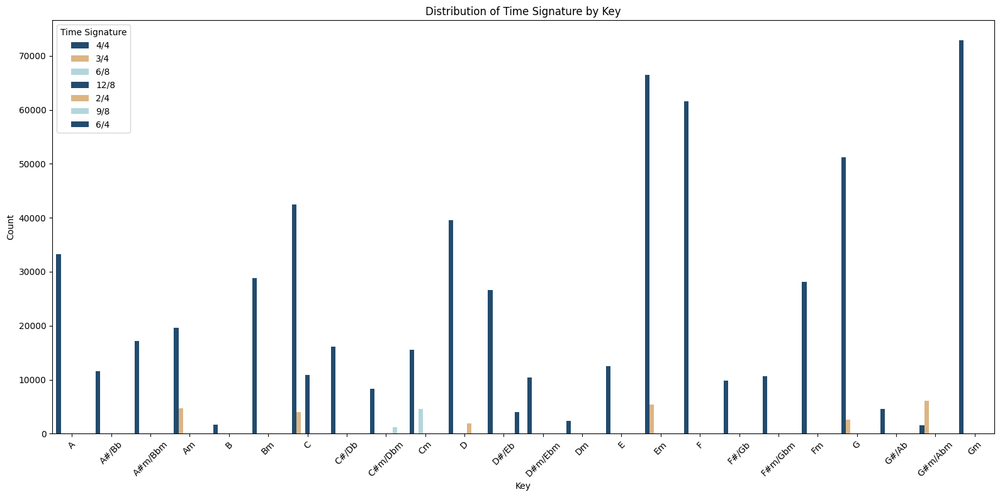

In [600]:
# Count plot for time signature by key
plt.figure(figsize=(16, 8))
sns.countplot(x=df['key_name'], hue=df['time_signature'], order=ordered_key_names, palette=colors)
plt.title('Distribution of Time Signature by Key')
plt.xlabel('Key')
plt.ylabel('Count')
plt.legend(title='Time Signature')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [601]:
# Descriptive statistics of time signature values by instrument
print("Time Signature statistics by Instrument:")
df.groupby('instrument')[['nb_beats', 'rhythmic_division']].describe().sort_index()

Time Signature statistics by Instrument:


nb_beats                                                 \
                       count      mean       std  min  25%  50%   75%   max   
instrument                                                                    
Accordion                1.0  4.000000       NaN  4.0  4.0  4.0   4.0   4.0   
Acoustic Guitar      46426.0  4.000000  0.000000  4.0  4.0  4.0   4.0   4.0   
Alto Saxophone        1028.0  4.000000  0.000000  4.0  4.0  4.0   4.0   4.0   
Bagpipes              6887.0  4.000000  0.000000  4.0  4.0  4.0   4.0   4.0   
Banjo                 1849.0  4.000000  0.000000  4.0  4.0  4.0   4.0   4.0   
Baritone Saxophone    2998.0  4.000000  0.000000  4.0  4.0  4.0   4.0   4.0   
Bassoon               2606.0  3.000384  0.019589  3.0  3.0  3.0   3.0   4.0   
Brass                 4105.0  4.000000  0.000000  4.0  4.0  4.0   4.0   4.0   
Choir                 6964.0  4.000000  0.000000  4.0  4.0  4.0   4.0   4.0   
Clarinet              1136.0  4.000000  0.000000  4.0  4.0  4.0   4.0   4.0   
Clavichord             394.0  4.000000  0.000000  4.0  4.0  4.0   4.0   4.0   
Contrabass           10127.0  4.000000  0.000000  4.0  4.0  4.0   4.0   4.0   
Electric Bass        15172.0  4.000000  0.000000  4.0  4.0  4.0   4.0   4.0   
Electric Guitar     138594.0  3.965706  0.181985  3.0  4.0  4.0   4.0   4.0   
Electric Organ       23512.0  4.000000  0.000000  4.0  4.0  4.0   4.0   4.0   
Electric Piano       14292.0  4.000000  0.000000  4.0  4.0  4.0   4.0   4.0   
Flute                 6266.0  3.997127  0.053524  3.0  4.0  4.0   4.0   4.0   
Fretless Bass         6640.0  4.000000  0.000000  4.0  4.0  4.0   4.0   4.0   
Glockenspiel         10033.0  4.000000  0.000000  4.0  4.0  4.0   4.0   4.0   
Harmonica             3382.0  4.000000  0.000000  4.0  4.0  4.0   4.0   4.0   
Harp                  3853.0  4.000000  0.000000  4.0  4.0  4.0   4.0   4.0   
Harpsichord           1434.0  8.644351  0.970111  6.0  9.0  9.0   9.0   9.0   
Horn                 14336.0  4.000000  0.000000  4.0  4.0  4.0   4.0   4.0   
Oboe                     2.0  4.000000  0.000000  4.0  4.0  4.0   4.0   4.0   
Ocarina                860.0  4.000000  0.000000  4.0  4.0  4.0   4.0   4.0   
Pan Flute             1037.0  4.000000  0.000000  4.0  4.0  4.0   4.0   4.0   
Piano               125701.0  3.982514  0.515006  2.0  4.0  4.0   4.0   6.0   
Piccolo               1879.0  3.000000  0.000000  3.0  3.0  3.0   3.0   3.0   
Pipe Organ              16.0  4.000000  0.000000  4.0  4.0  4.0   4.0   4.0   
Recorder                 1.0  4.000000       NaN  4.0  4.0  4.0   4.0   4.0   
Sampler              59015.0  3.995849  0.064299  3.0  4.0  4.0   4.0   4.0   
Shakuhachi            2209.0  4.000000  0.000000  4.0  4.0  4.0   4.0   4.0   
Shamisen                 1.0  4.000000       NaN  4.0  4.0  4.0   4.0   4.0   
Shehnai                163.0  4.000000  0.000000  4.0  4.0  4.0   4.0   4.0   
Steel Drum              55.0  4.000000  0.000000  4.0  4.0  4.0   4.0   4.0   
StringInstrument     20320.0  3.999852  0.012150  3.0  4.0  4.0   4.0   4.0   
Taiko                 2833.0  5.868690  0.495443  4.0  6.0  6.0   6.0   6.0   
Tenor Saxophone        752.0  4.000000  0.000000  4.0  4.0  4.0   4.0   4.0   
Timpani               1838.0  3.166485  0.687019  3.0  3.0  3.0   3.0   6.0   
Trombone              7353.0  4.000000  0.000000  4.0  4.0  4.0   4.0   4.0   
Trumpet               9855.0  3.998782  0.034875  3.0  4.0  4.0   4.0   4.0   
Tuba                  6356.0  4.000000  0.000000  4.0  4.0  4.0   4.0   4.0   
Tubular Bells           17.0  4.000000  0.000000  4.0  4.0  4.0   4.0   4.0   
Unknown              31902.0  3.998339  0.050981  3.0  4.0  4.0   4.0   9.0   
Vibraphone            5555.0  4.397840  0.798447  4.0  4.0  4.0   4.0   6.0   
Violin                4023.0  3.000249  0.015766  3.0  3.0  3.0   3.0   4.0   
Violoncello            463.0  4.000000  0.000000  4.0  4.0  4.0   4.0   4.0   
Voice                28384.0  7.080327  3.892908  4.0  4.0  4.0  12.0 

In [602]:
# Descriptive statistics of time signature values by instrument family
print("Time Signature statistics by Instrument Family:")
df.groupby('instrument_family')[['nb_beats', 'rhythmic_division']].describe().sort_index()

Time Signature statistics by Instrument Family:


nb_beats                                                 \
                      count      mean       std  min  25%  50%   75%   max   
instrument_family                                                            
Bass                31939.0  4.000000  0.000000  4.0  4.0  4.0   4.0   4.0   
Brass               37900.0  3.999683  0.017791  3.0  4.0  4.0   4.0   4.0   
Electronic          65979.0  3.996287  0.060824  3.0  4.0  4.0   4.0   4.0   
Guitar             186869.0  3.974565  0.157442  3.0  4.0  4.0   4.0   4.0   
Keyboard           168338.0  4.026506  0.623968  2.0  4.0  4.0   4.0   9.0   
Other               41398.0  3.998720  0.044759  3.0  4.0  4.0   4.0   9.0   
Percussion          20276.0  4.294535  0.871328  3.0  4.0  4.0   4.0   6.0   
Strings             28659.0  3.859555  0.347454  3.0  4.0  4.0   4.0   4.0   
Voice               28384.0  7.080327  3.892908  4.0  4.0  4.0  12.0  12.0   
Woodwind            29027.0  3.844903  0.362003  3.0  4.0  4.0   4.0   4.0   

                  rhythmic_division                                          \
                              count      mean       std  min  25%  50%  75%   
instrument_family                                                             
Bass                        31939.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
Brass                       37900.0  0.000317  0.017791  0.0  0.0  0.0  0.0   
Electronic                  65979.0  0.003713  0.060824  0.0  0.0  0.0  0.0   
Guitar                     186869.0  0.025435  0.157442  0.0  0.0  0.0  0.0   
Keyboard                   168338.0  0.052905  0.223845  0.0  0.0  0.0  0.0   
Other                       41398.0  0.001425  0.037725  0.0  0.0  0.0  0.0   
Percussion                  20276.0  0.085618  0.279807  0.0  0.0  0.0  0.0   
Strings                     28659.0  0.140445  0.347454  0.0  0.0  0.0  0.0   
Voice                       28384.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
Woodwind                    29027.0  0.155097  0.362003  0.0  0.0  0.0  0.0   

                        
                   max  
instrument_family       
Bass               0.0  
Brass              1.0  
Electronic         1.0  
Guitar             1.0  
Keyboard           1.0  
Other              1.0  
Percussion         1.0  
Strings            1.0  
Voice              0.0  
Woodwind           1.0

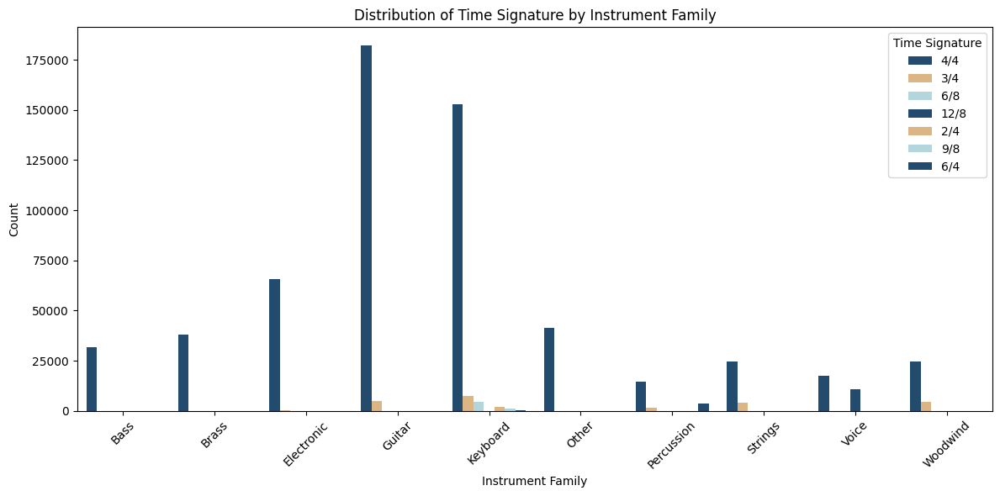

In [603]:
# Count plot for time signature by instrument family
plt.figure(figsize=(12, 6))
sns.countplot(data=df, x='instrument_family', hue='time_signature', palette=colors, order=families)
plt.title('Distribution of Time Signature by Instrument Family')
plt.xlabel('Instrument Family')
plt.ylabel('Count')
plt.legend(title='Time Signature')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

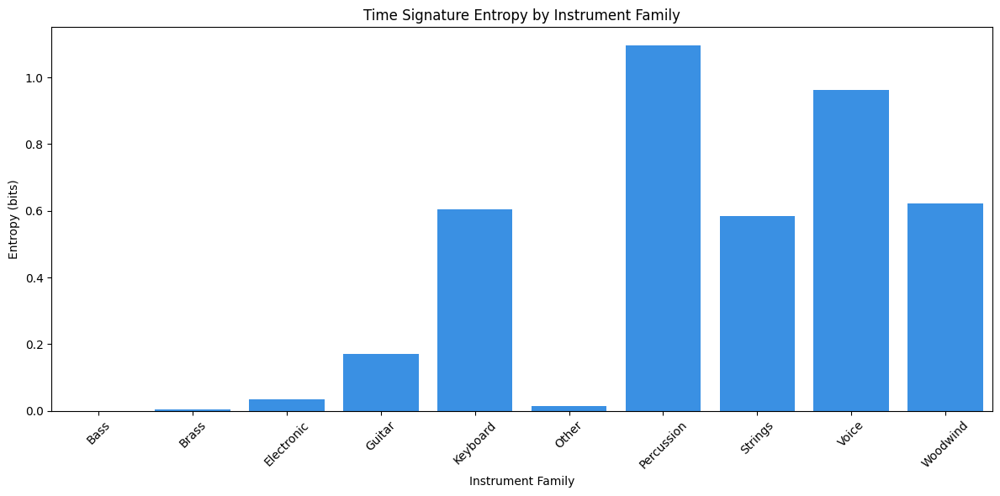

In [604]:
# Compute entropy of time_signature distribution per instrument family
def compute_ts_entropy(group):
    return entropy(group['time_signature'].value_counts(normalize=True), base=2)

ts_entropy_by_instrfam = df.groupby('instrument_family').apply(compute_ts_entropy)

plt.figure(figsize=(12, 6))
sns.barplot(x=ts_entropy_by_instrfam.index, y=ts_entropy_by_instrfam.values, color='dodgerblue')
plt.title("Time Signature Entropy by Instrument Family")
plt.xlabel("Instrument Family")
plt.ylabel("Entropy (bits)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

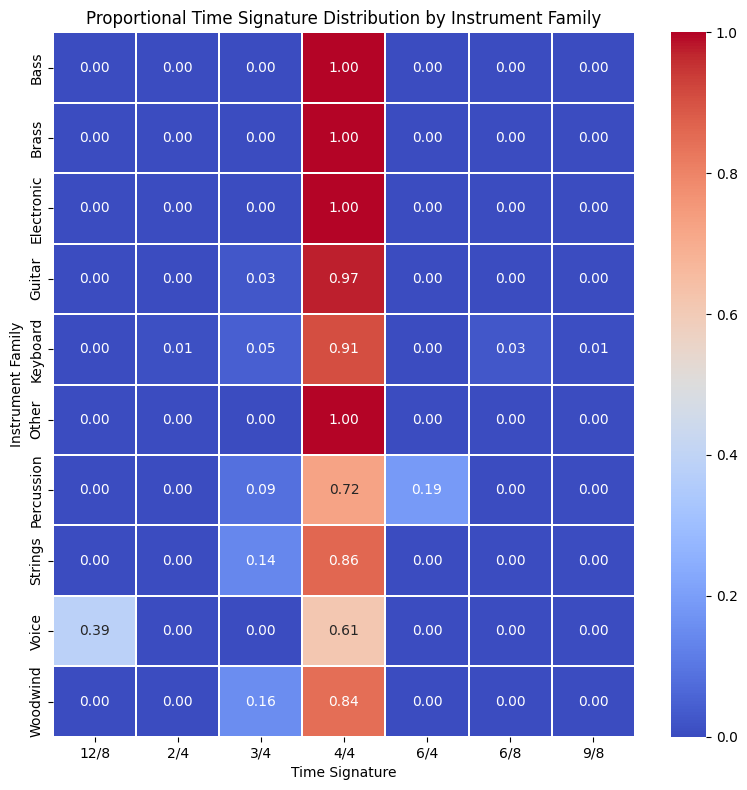

In [605]:
# Crosstab and normalize by instrument family
ts_instrfam_ratio = (
    pd.crosstab(df['instrument_family'], df['time_signature'], normalize='index')
)

# Plot
plt.figure(figsize=(8, 8))
sns.heatmap(ts_instrfam_ratio, cmap='coolwarm', annot=True, fmt=".2f", linewidths=0.2)
plt.title("Proportional Time Signature Distribution by Instrument Family")
plt.xlabel("Time Signature")
plt.ylabel("Instrument Family")
plt.tight_layout()
plt.show()

In [606]:
# Descriptive statistics of time signature values by genre
print("Time Signature statistics by Genre:")
df.groupby('genre')[['nb_beats', 'rhythmic_division']].describe().sort_index()

Time Signature statistics by Genre:


nb_beats                                                \
                    count      mean       std  min  25%  50%  75%   max   
genre                                                                     
alternative_rock  28830.0  4.000000  0.000000  4.0  4.0  4.0  4.0   4.0   
blues             54451.0  5.699767  3.219779  3.0  4.0  4.0  6.0  12.0   
classical         36582.0  3.999590  1.067383  2.0  4.0  4.0  4.0   9.0   
country           54072.0  4.000000  0.000000  4.0  4.0  4.0  4.0   4.0   
dance             54471.0  4.000000  0.000000  4.0  4.0  4.0  4.0   4.0   
disco             51137.0  4.000000  0.000000  4.0  4.0  4.0  4.0   4.0   
heavy_metal       41747.0  4.000000  0.000000  4.0  4.0  4.0  4.0   4.0   
jazz              33181.0  4.000000  0.000000  4.0  4.0  4.0  4.0   4.0   
new_age           41925.0  3.949720  0.789717  3.0  4.0  4.0  4.0   6.0   
pop               37118.0  3.834177  0.371926  3.0  4.0  4.0  4.0   4.0   
rap               32462.0  4.000000  0.000000  4.0  4.0  4.0  4.0   4.0   
reggae            46331.0  4.000000  0.000000  4.0  4.0  4.0  4.0   4.0   
rnb               37920.0  4.000000  0.000000  4.0  4.0  4.0  4.0   4.0   
rock              42943.0  4.000000  0.000000  4.0  4.0  4.0  4.0   4.0   
soul              45599.0  4.000000  0.000000  4.0  4.0  4.0  4.0   4.0   

                 rhythmic_division                                          \
                             count      mean       std  min  25%  50%  75%   
genre                                                                        
alternative_rock           28830.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
blues                      54451.0  0.074085  0.261912  0.0  0.0  0.0  0.0   
classical                  36582.0  0.106418  0.308377  0.0  0.0  0.0  0.0   
country                    54072.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
dance                      54471.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
disco                      51137.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
heavy_metal                41747.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
jazz                       33181.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
new_age                    41925.0  0.242242  0.428445  0.0  0.0  0.0  0.0   
pop                        37118.0  0.165823  0.371926  0.0  0.0  0.0  0.0   
rap                        32462.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
reggae                     46331.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
rnb                        37920.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
rock                       42943.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
soul                       45599.0  0.000000  0.000000  0.0  0.0  0.0  0.0   

                       
                  max  
genre                  
alternative_rock  0.0  
blues             1.0  
classical         1.0  
country           0.0  
dance             0.0  
disco             0.0  
heavy_metal       0.0  
jazz              0.0  
new_age           1.0  
pop               1.0  
rap               0.0  
reggae            0.0  
rnb               0.0  
rock              0.0  
soul              0.0

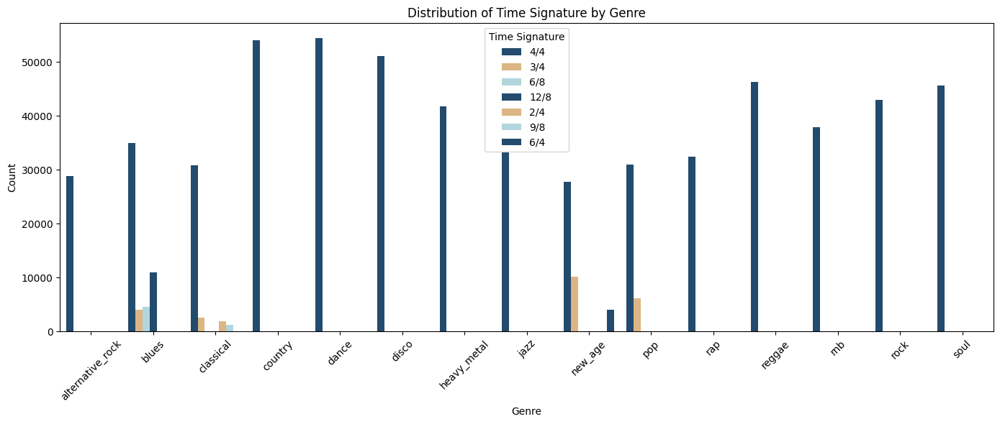

In [607]:
# Count plot for time signature by genre
plt.figure(figsize=(14, 6))
sns.countplot(data=df, x='genre', hue='time_signature', palette=colors, order=genres_sorted)
plt.title('Distribution of Time Signature by Genre')
plt.xlabel('Genre')
plt.ylabel('Count')
plt.legend(title='Time Signature')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

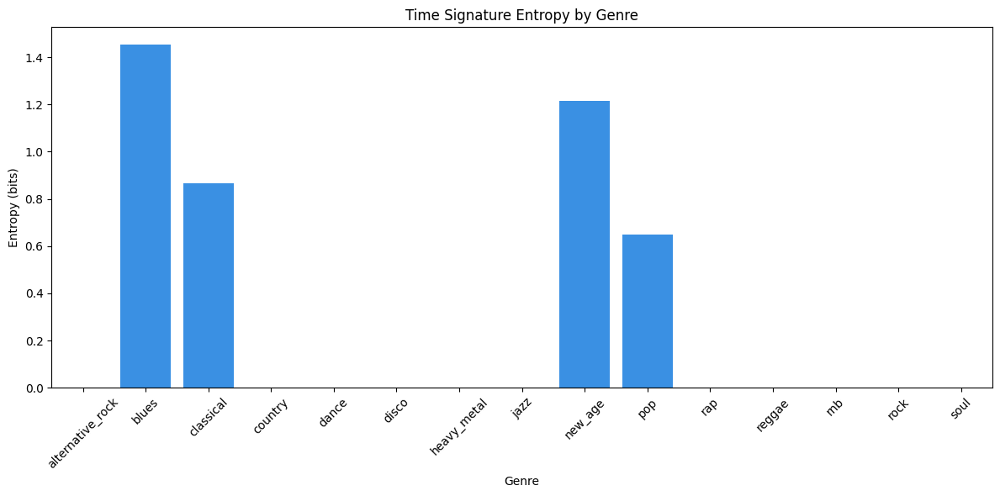

In [608]:
ts_entropy_by_genre = df.groupby('genre').apply(compute_ts_entropy)

# Plot results
plt.figure(figsize=(12, 6))
sns.barplot(x=ts_entropy_by_genre.index, y=ts_entropy_by_genre.values, color='dodgerblue')
plt.title("Time Signature Entropy by Genre")
plt.xlabel("Genre")
plt.ylabel("Entropy (bits)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

##### 2.3.11.4 Temporal Distribution of Metrical Signatures Across Musical Sections

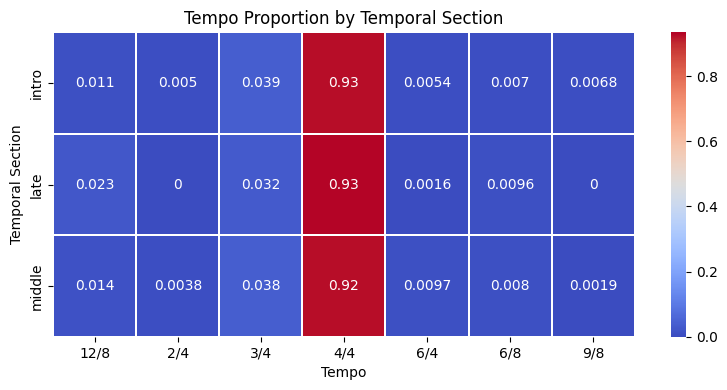

In [609]:
# Compute normalized distribution of tempi across temporal sections
ts_temporal = pd.crosstab(df['temporal_section'], df['time_signature'], normalize='index')

# Visualize as a heatmap for easy comparison across sections and signatures
plt.figure(figsize=(8, 4))
sns.heatmap(ts_temporal, annot=True, cmap="coolwarm", linewidths=0.2)
plt.title("Tempo Proportion by Temporal Section")
plt.xlabel("Tempo")
plt.ylabel("Temporal Section")
plt.tight_layout()
plt.show()

##### 2.3.11.5 Intra-Phrasal Rhythmic Modulation: Number of Time Signature Changes per Measure

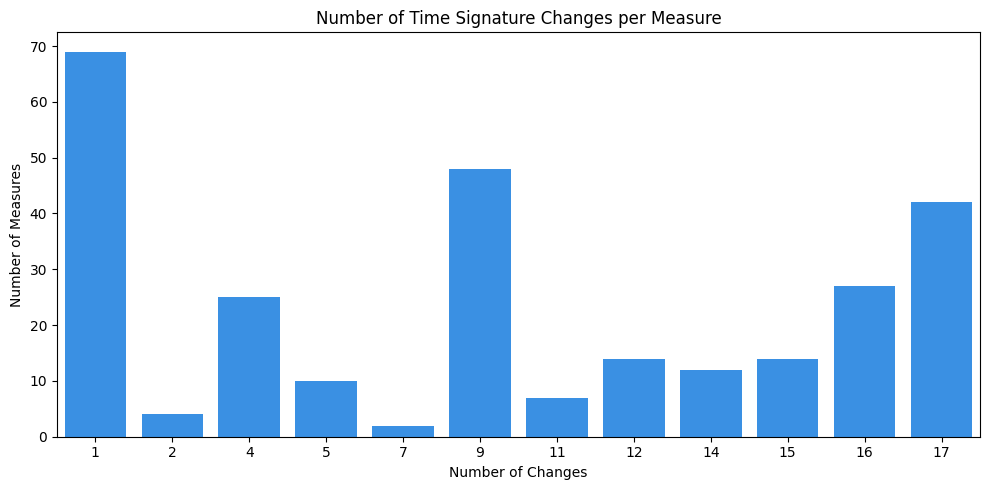

In [610]:
# Count number of time_signature changes within each measure
# A change is detected when a time_signature differs from the previous one
df['ts_change'] = df.groupby('measure')['time_signature'].transform(lambda x: (x != x.shift()).astype(int))
ts_change_stats = df.groupby('measure')['ts_change'].sum() - 1
ts_change_stats = ts_change_stats.clip(lower=0)  


# Count how many changes occur per measure (excluding initial NaNs)
ts_change_stats = df.groupby('measure')['ts_change'].sum().value_counts().sort_index()

# Plot the distribution of number of time signature changes per phrase
plt.figure(figsize=(10, 5))
sns.barplot(x=ts_change_stats.index, y=ts_change_stats.values, color='dodgerblue')
plt.title("Number of Time Signature Changes per Measure")
plt.xlabel("Number of Changes")
plt.ylabel("Number of Measures")
plt.tight_layout()
plt.show()

##### 2.3.11.6 Other Time Signatures Exploration

In [611]:
# Analysis of time signature changes (presence of changes)

def other_time_signatures_analysis(df):
    results = []
    
    # Group by filename to get actual tracks
    for filename, group in df.groupby('filename'):
        first_row = group.iloc[0]
        initial_sig = first_row['time_signature']
        ts_changes = first_row['other_time_signatures']
        genre = first_row['genre']
        total_measures = group['measure'].max()
        
        # Get all unique signatures in the track
        all_signatures = set([change['time_sig'] for change in ts_changes])
        all_signatures.add(initial_sig)
        
        # Check if there are changes from initial signature
        has_changes = len(all_signatures) > 1
        different_sigs = list(all_signatures - {initial_sig})
        
        if has_changes:
            results.append({
                'filename': filename,
                'genre': genre,
                'initial_sig': initial_sig,
                'other_sigs': different_sigs,
                'total_measures': total_measures,
                'num_change_events': len(ts_changes),
                'unique_signatures': len(all_signatures)
            })
    
    return results

In [612]:
# Execute analysis
simple_results = other_time_signatures_analysis(df)

print(f"Tracks with time signature changes: {len(simple_results)} out of 120 total tracks")
print(f"Percentage of tracks with changes: {len(simple_results)/120*100:.1f}%")

if simple_results:
    print(f"\nExamples of tracks with time signature changes:")
    for result in simple_results[:10]:
        print(f"  {result['filename']} ({result['genre']})")
        print(f"    {result['initial_sig']} -> {result['other_sigs']}")
        print(f"    {result['num_change_events']} change events, {result['total_measures']} total measures")
    
    # Genre analysis - simple counts
    genre_counts = {}
    total_tracks_per_genre = df.groupby('genre')['filename'].nunique()
    
    for result in simple_results:
        genre = result['genre']
        genre_counts[genre] = genre_counts.get(genre, 0) + 1
    
    print(f"\nGenre analysis:")
    print(f"{'Genre':<15} {'With Changes':<12} {'Total Tracks':<12} {'% with Changes':<15}")
    print("-" * 60)
    
    for genre in sorted(genre_counts.keys()):
        with_changes = genre_counts[genre]
        total = total_tracks_per_genre[genre]
        percentage = (with_changes / total) * 100
        print(f"{genre:<15} {with_changes:<12} {total:<12} {percentage:<15.1f}%")
        
    # Most common signature changes
    change_patterns = {}
    for result in simple_results:
        pattern = f"{result['initial_sig']} -> {result['other_sigs']}"
        change_patterns[pattern] = change_patterns.get(pattern, 0) + 1
    
    print(f"\nMost common time signature change patterns:")
    for pattern, count in sorted(change_patterns.items(), key=lambda x: x[1], reverse=True)[:10]:
        print(f"  {pattern}: {count} tracks")

else:
    print("No time signature changes detected in any tracks.")

Tracks with time signature changes: 7 out of 120 total tracks
Percentage of tracks with changes: 5.8%

Examples of tracks with time signature changes:
  99 Ways to Die.mid (heavy_metal)
    4/4 -> ['6/4']
    15 change events, 157 total measures
  Conflict.mid (new_age)
    3/4 -> ['4/4', '2/4']
    50 change events, 116 total measures
  I Got the Feelin.mid (soul)
    4/4 -> ['3/4', '9/8', '1/8']
    187 change events, 112 total measures
  I'm Gonna Getcha Good!.mid (country)
    4/4 -> ['3/4']
    3 change events, 141 total measures
  Love Gun.mid (heavy_metal)
    4/4 -> ['3/4']
    24 change events, 124 total measures
  Symptom of the Universe.mid (heavy_metal)
    4/4 -> ['4/8']
    7 change events, 180 total measures
  Wind Of Change.mid (heavy_metal)
    4/4 -> ['2/4']
    13 change events, 102 total measures

Genre analysis:
Genre           With Changes Total Tracks % with Changes 
------------------------------------------------------------
country         1            8      

##### Key Findings For The Time Signature Feature
The distribution of time signatures is overwhelmingly dominated by 4/4 (91.1%), reflecting its central role in modern popular music. The presence of 3/4 (3.6%) and 12/8 (1.7%) highlights stylistic niches such as waltzes, ballads, and blues/jazz in compound time. Initial anomalies like 1/8 and 4/8 were identified as likely artifacts of malformed MIDI files or notational conventions, and were removed in the data-cleaning process without affecting the overall distribution. After cleaning, the dataset preserved all musically meaningful signatures (3/4, 6/8, 9/8, 12/8) while eliminating aberrations, resulting in a coherent binary vs ternary split of ~93% vs 7%. Patterns by instrument and genre align with musicological expectations: guitars and keyboards dominate in 4/4, percussion shows the widest entropy, and blues/jazz favor ternary meters like 12/8. Temporal section analysis further reveals that intros and outros display more rhythmic diversity than central sections, reflecting compositional experimentation. Overall, the time_signature feature emerges as both robust and highly interpretable, making it a reliable input for topological data analysis (TDA).

##### Key Findings For The "Other Time Signatures" Feature
The analysis of other time signatures shows that meter changes are relatively rare in the corpus, with only 5.8% of pieces exhibiting them, confirming the overall rhythmic stability already highlighted in the time_signature feature. When they do occur, heavy metal stands out as the genre most likely to use them, with 50% of its tracks showing structural changes, compared to just 12.5% in country, new age, and soul, and none in blues, jazz, or classical. The most common shift is from 4/4 to 3/4, though some tracks feature more complex transitions to 6/4, 9/8, or 2/4, reflecting stylistic experimentation. The intensity of changes varies widely, from just a few events to more than 180 within a single track, reinforcing the idea that meter shifts serve as a defining characteristic in certain genres rather than a general trend. In contrast to the dominance of 4/4 and the small but consistent presence of ternary meters like 3/4 and 12/8, these changes represent an outlier phenomenon. Overall, they provide an additional discriminant for genre-specific rhythmic complexity, particularly in heavy metal, while confirming that most musical styles in the dataset rely on stable metric frameworks.

---

#### 2.3.12 Measure

##### 2.3.12.1 Central Tendency and Spread of Measures

In [613]:
# Descriptive stats: proportion and spread of measures
df['measure'].describe()

count    638769.000000
mean         66.220465
std          45.762649
min           1.000000
25%          31.000000
50%          59.000000
75%          91.000000
max         274.000000
Name: measure, dtype: float64

In [614]:
# Central tendency
mean_measure = df['measure'].mean()
median_measure = df['measure'].median()
mode_measure = df['measure'].mode()[0]  

# Spread
std_measure = df['measure'].std()

# Display results
print(f"Mean measure: {mean_measure:.2f}")
print(f"Median measure: {median_measure:.2f}")
print(f"Mode measure: {mode_measure:.2f}")
print(f"Standard measure: {std_measure:.2f}")

Mean measure: 66.22
Median measure: 59.00
Mode measure: 25.00
Standard measure: 45.76


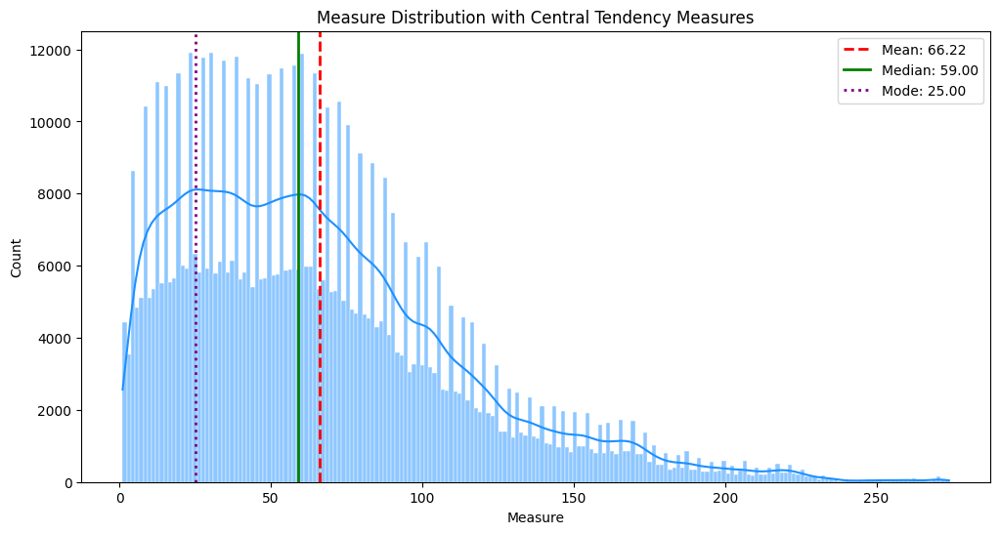

In [615]:
plt.figure(figsize=(12, 6))
sns.histplot(df['measure'], bins=200, kde=True, color='dodgerblue', edgecolor='white')

# Add lines for mean, median, and mode
plt.axvline(mean_measure, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_measure:.2f}')
plt.axvline(median_measure, color='green', linestyle='-', linewidth=2, label=f'Median: {median_measure:.2f}')
plt.axvline(mode_measure, color='purple', linestyle=':', linewidth=2, label=f'Mode: {mode_measure:.2f}')

plt.title('Measure Distribution with Central Tendency Measures')
plt.xlabel('Measure')
plt.ylabel('Count')
plt.legend()
plt.show()

##### 2.3.12.2 Identification of Temporal Outliers in Measure Counts

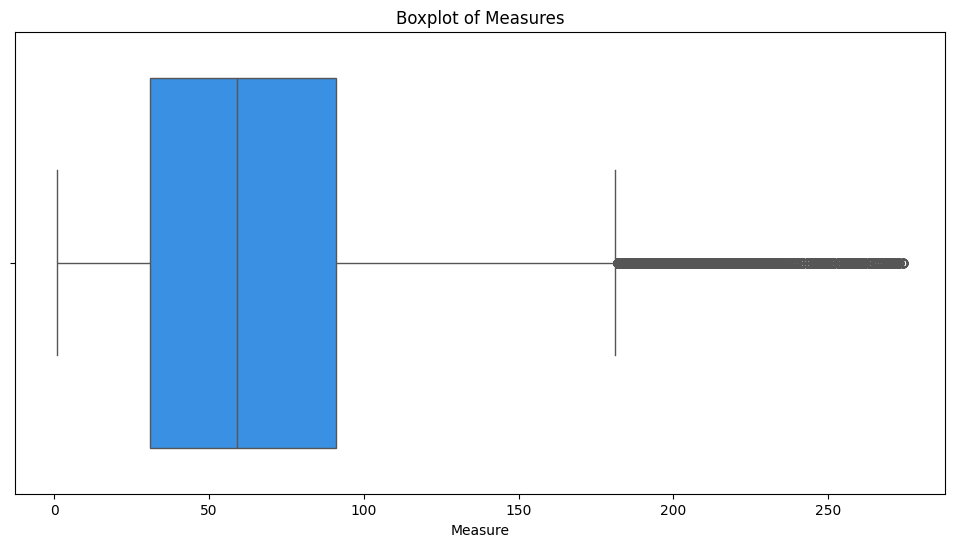

In [616]:
plt.figure(figsize=(12, 6))
sns.boxplot(x=df['measure'], color='dodgerblue')
plt.title('Boxplot of Measures')
plt.xlabel('Measure')
plt.show()

In [617]:
# Identify files with measures greater than 150
extreme_mesures = df[df['measure'] > 150]['filename'].unique()

# Verify tempo of files with extreme measures
for i in extreme_mesures:
    print(f"File: {i}, Tempo: {df[df['filename'] == i]['tempo'].unique()}")

File: Kiss From a Rose.mid, Tempo: [136.]
File: Symptom of the Universe.mid, Tempo: [85.]
File: 99 Ways to Die.mid, Tempo: [160.]
File: Sabbath Bloody Sabbath.mid, Tempo: [145.]
File: Hysteria.mid, Tempo: [112.]
File: Fear of the Dark.mid, Tempo: [80.]
File: Magnolia forever.mid, Tempo: [138.]
File: Good Times.mid, Tempo: [113.]
File: Blues After Midnight.mid, Tempo: [88.]
File: All Blues.mid, Tempo: [130.]
File: Why I Sing the Blues.mid, Tempo: [115.]
File: I shot the Sheriff.mid, Tempo: [180.]
File: Symphony No. 6 in F major, Op. 68 "Pastoral": V. Allegretto.mid, Tempo: [89.]
File: Serenade D-Dur KV 250 (248b) "Haffner-Serenade" - 1. Allegro maestoso - Allegro molto.mid, Tempo: [132.]
File: Carmen Highlights - Habanera.mid, Tempo: [132.]
File: Fantaisie impromptu.mid, Tempo: [120.]
File: Muscle of Love.mid, Tempo: [103.]
File: Amarok.mid, Tempo: [133.]
File: Caribbean Blue.mid, Tempo: [169.]
File: Right Here, Right Now.mid, Tempo: [125.]
File: Get Ready for This.mid, Tempo: [125.]
Fi

##### 2.3.12.3 Measure in Context: Key, Instrument, and Genre

In [618]:
# Descriptive statistics of measure by key
print("Measure statistics by Key:")
df.groupby('key')['measure'].describe().sort_index()

Measure statistics by Key:


,count,mean,std,min,25%,50%,75%,max
key,,,,,,,,
0,57396.0,56.918270,34.896376,1.0,29.0,54.0,82.0,201.0
1,16127.0,52.402803,33.257462,1.0,25.0,49.0,73.0,159.0
2,41409.0,70.707527,44.254671,1.0,34.0,65.0,102.0,180.0
3,30638.0,50.571219,29.703672,1.0,26.0,49.0,71.0,123.0
4,12523.0,45.855706,23.501896,1.0,27.0,46.0,65.0,93.0
5,61610.0,77.330790,52.591593,1.0,35.0,66.0,107.0,208.0
6,9799.0,70.115726,37.393494,1.0,40.0,68.0,99.0,141.0
7,53847.0,72.651067,56.540055,1.0,32.0,60.0,98.0,274.0
8,4606.0,43.239036,23.623990,1.0,24.0,43.0,61.0,88.0


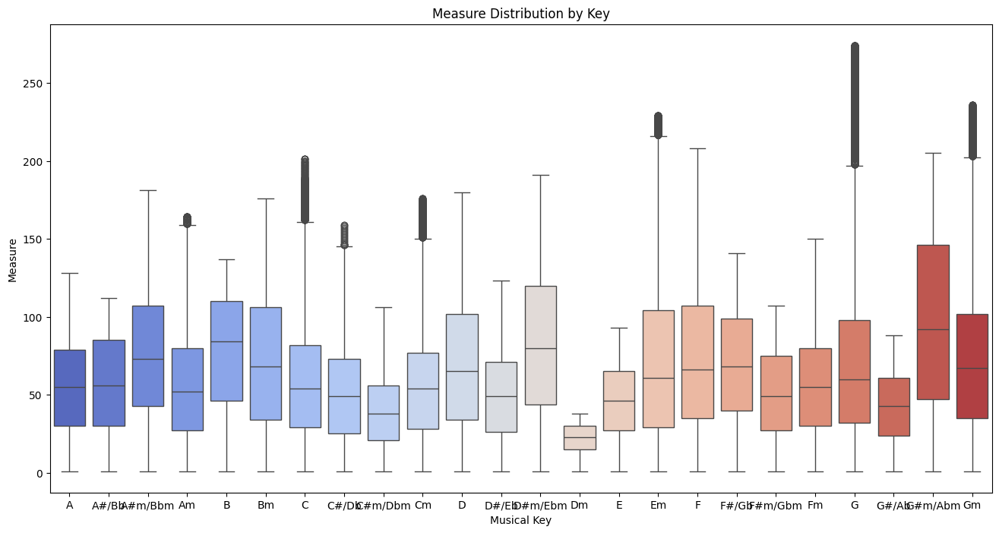

In [619]:
# Measure distribution across keys to show tonal variation
plt.figure(figsize=(16, 8))
sns.boxplot(data=df, x='key_name', y='measure', order=ordered_key_names, palette='coolwarm')
plt.title('Measure Distribution by Key')
plt.xlabel('Musical Key')
plt.ylabel('Measure')
plt.show()


In [620]:
# Descriptive statistics of measure by instrument
print("Measure statistics by Instrument:")
df.groupby('instrument')['measure'].describe()

Measure statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Accordion,1.0,1.000000,NaN,1.0,1.0,1.0,1.00,1.0
Acoustic Guitar,46426.0,80.382221,59.486219,1.0,34.0,67.0,111.00,229.0
Alto Saxophone,1028.0,53.649805,9.931995,1.0,46.0,54.0,62.00,70.0
Bagpipes,6887.0,50.153187,26.401916,1.0,28.0,50.0,73.00,97.0
Banjo,1849.0,48.974040,27.977870,1.0,25.0,49.0,73.00,97.0
Baritone Saxophone,2998.0,33.648099,17.786013,1.0,19.0,33.0,49.00,64.0
Bassoon,2606.0,43.655411,23.109325,1.0,24.0,44.0,63.00,83.0
Brass,4105.0,39.564921,23.316070,1.0,20.0,34.0,61.00,84.0
Choir,6964.0,75.409535,38.626855,1.0,40.0,81.0,107.00,138.0


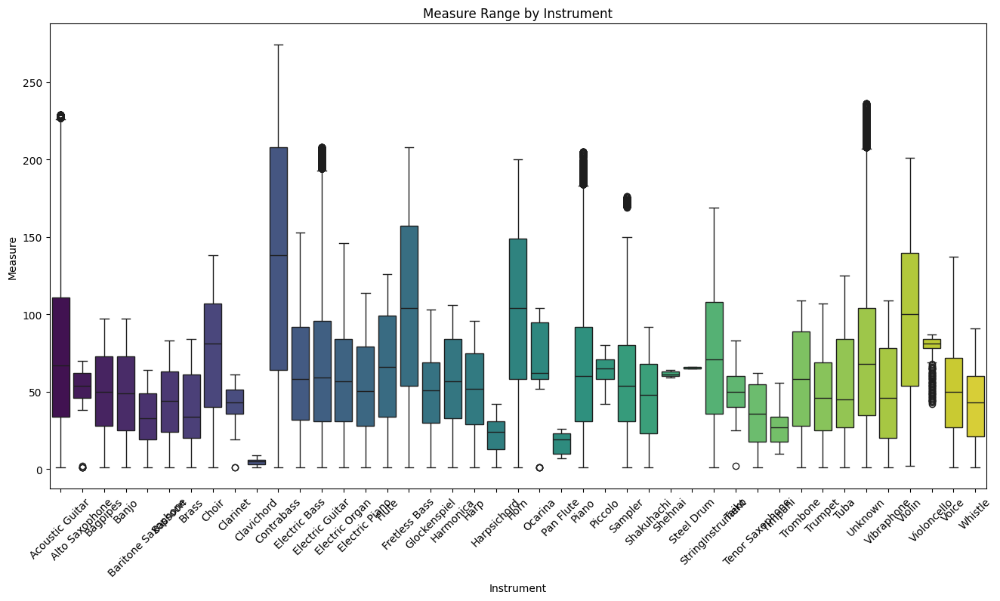

In [621]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df, x='instrument', y='measure', palette='viridis', order=alphabetic_order)
plt.xticks(rotation=45)
plt.title('Measure Range by Instrument')
plt.xlabel('Instrument')
plt.ylabel('Measure')
plt.show()

In [622]:
# Descriptive statistics of measure by instrument family
print("Measure statistics by Instrument Family:")
df.groupby('instrument_family')['measure'].describe()

Measure statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument_family,,,,,,,,
Bass,31939.0,95.610570,67.445946,1.0,42.0,81.0,138.0,274.0
Brass,37900.0,71.181425,47.328684,1.0,31.0,64.0,101.0,200.0
Electronic,65979.0,60.202580,36.457532,1.0,32.0,56.0,83.0,176.0
Guitar,186869.0,70.112437,49.582670,1.0,31.0,60.0,97.0,229.0
Keyboard,168338.0,62.891047,39.721249,1.0,31.0,58.0,89.0,205.0
Other,41398.0,68.108435,51.780139,1.0,29.0,58.0,95.0,236.0
Percussion,20276.0,48.045620,26.456257,1.0,27.0,46.0,66.0,109.0
Strings,28659.0,75.242542,47.116182,1.0,37.0,71.0,107.0,201.0
Voice,28384.0,51.333145,29.201057,1.0,27.0,50.0,72.0,137.0


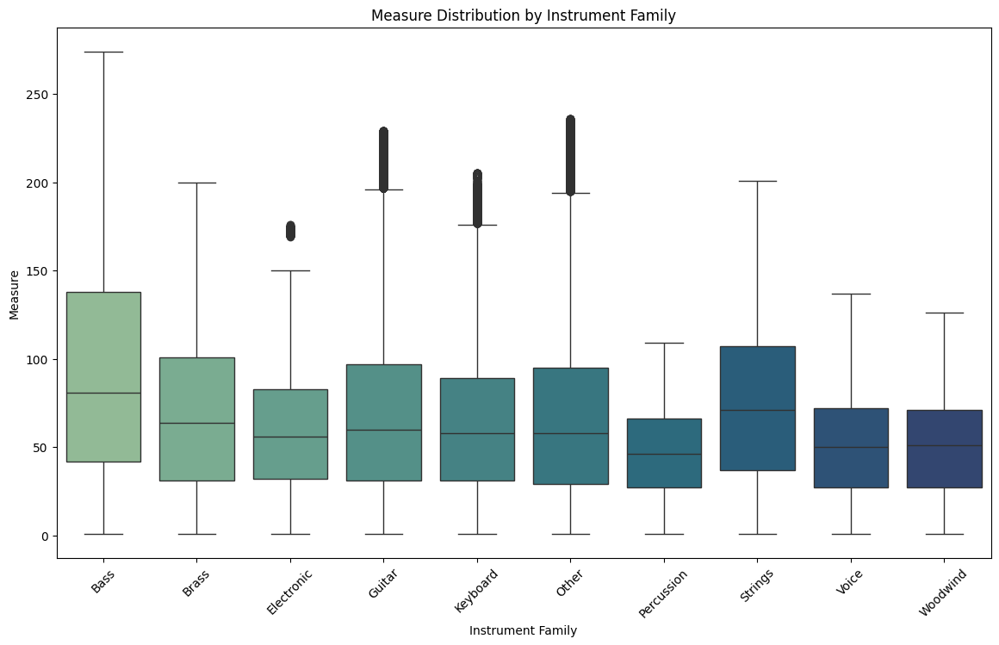

In [623]:
# Filter and plot measure distribution by instrument family
plt.figure(figsize=(14,8))
sns.boxplot(
    data=df,
    x='instrument_family',
    y='measure',
    palette='crest',
    order=families
)
plt.title('Measure Distribution by Instrument Family')
plt.xlabel('Instrument Family')
plt.ylabel('Measure')
plt.xticks(rotation=45)
plt.show()

In [624]:
# Descriptive statistics of measure by genre
print("Measure statistics by Genre:")
df.groupby('genre')['measure'].describe()

Measure statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,28830.0,48.100590,29.397181,1.0,24.0,46.0,67.0,134.0
blues,54451.0,72.429726,51.626554,1.0,33.0,61.0,99.0,208.0
classical,36582.0,96.279673,66.888399,1.0,37.0,87.0,145.0,274.0
country,54072.0,57.719744,34.058192,1.0,30.0,54.0,82.0,141.0
dance,54471.0,86.435626,57.466226,1.0,41.0,76.0,120.0,229.0
disco,51137.0,71.728963,42.912613,1.0,36.0,68.0,107.0,173.0
heavy_metal,41747.0,82.880997,53.140895,1.0,40.0,77.0,115.0,236.0
jazz,33181.0,55.134233,34.817166,1.0,25.0,50.0,82.0,154.0
new_age,41925.0,72.694979,45.311775,1.0,36.0,67.0,102.0,176.0


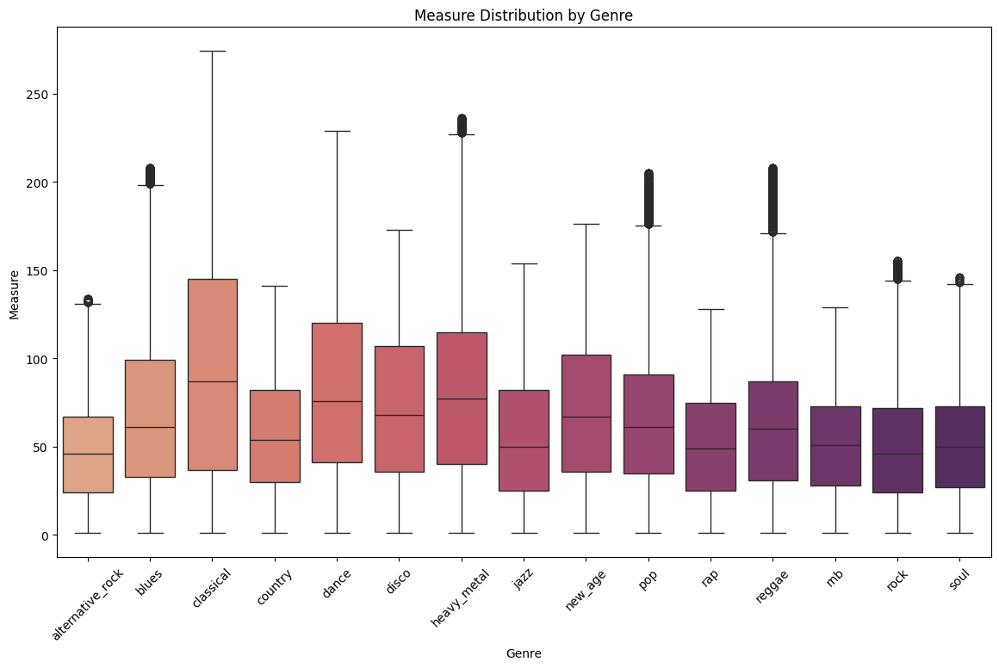

In [625]:
plt.figure(figsize=(14,8))
sns.boxplot(
    data=df,
    x='genre',
    y='measure',
    palette='flare',
    order=genres_sorted
)
plt.title('Measure Distribution by Genre')
plt.xlabel('Genre')
plt.ylabel('Measure')
plt.xticks(rotation=45)
plt.show()

##### 2.3.12.4 Metric Weight vs Measure

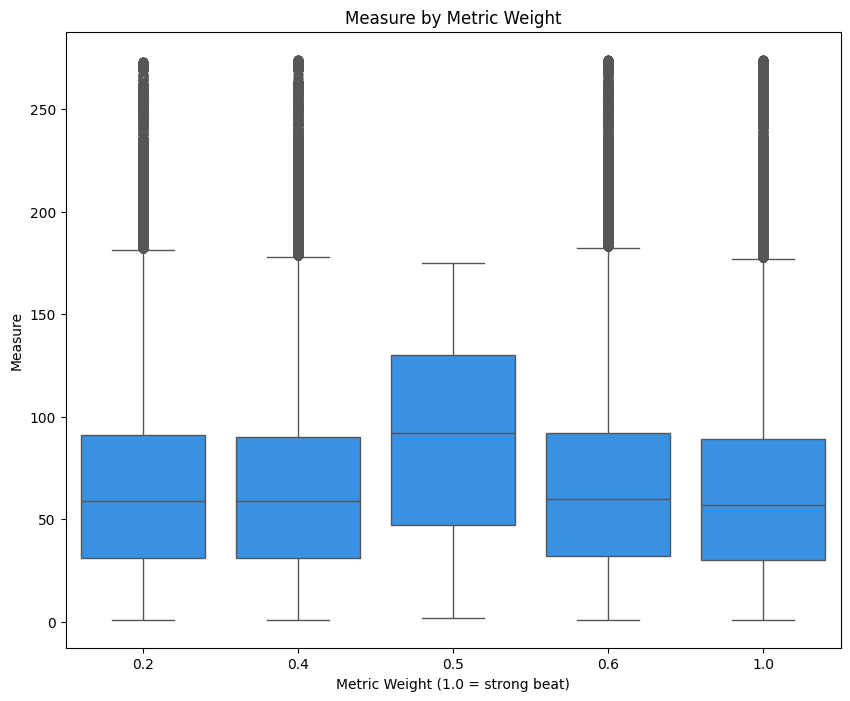

In [626]:
# Set the figure size
plt.figure(figsize=(10, 8))

# Create a boxplot showing how measure varies with metric weight
sns.boxplot(data=df, x="metric_weight", y="measure", color='dodgerblue')
plt.title("Measure by Metric Weight")
plt.xlabel("Metric Weight (1.0 = strong beat)")
plt.ylabel("Measure")
plt.show()

##### 2.3.12.5 Distribution of Measure Indices Across Temporal Sections

<Axes: xlabel='temporal_section', ylabel='measure'>

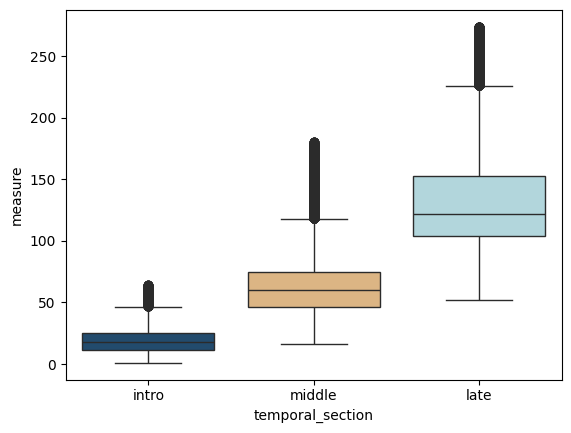

In [627]:
sns.boxplot(data=df, x="temporal_section", y="measure", palette=colors)

##### Key Findings For The Time Signature Feature
The distribution of measures is strongly multimodal, with a primary peak around 25 bars (typical of intros, bridges, or refrains) and a long right tail extending beyond 270 bars. Most pieces cluster within 0–80 bars, while sections between 40–80 bars form a plateau of interest for structural transitions, and works exceeding 100 bars often belong to classical, progressive rock/metal, or extended jazz/blues performances. Importantly, many outliers are not extraction errors but reflect authentic versions (album vs radio edits) or stylistic norms (e.g., club remixes, ballads with extended codas). Tempo-related anomalies (e.g., “I Shot the Sheriff” or "Kiss from a Rose") reveal that long measure counts may stem from slow pieces with dense subdivisions as well as genuinely long forms. Cross-genre analysis shows that classical, dance, and metal are structurally longer, while rock, rap, and R&B remain concise, with pop sitting in the middle but producing notable “epic ballad” outliers. Instrument families also show clear signatures: strings and bass support longer developments, while woodwinds remain concise. Overall, the measure variable proves both reliable and musically meaningful, capturing not only structural diversity but also genre- and instrument-specific compositional strategies, making it a powerful dimension for TDA clustering.

---

#### 2.3.13 Beat Position

##### 2.3.13.1 Feature Transformation for Quantitative Analysis

In [628]:
# Check values
nan_ratio = df['beat_position'].isna().mean()
print(f"NaN rate after parsing: {nan_ratio:.2%}")

NaN rate after parsing: 0.00%


In [629]:
df['division_label'] = df['rhythmic_division'].map({0: 'Binary', 1: 'Ternary'})
df_notes_only['division_label'] = df_notes_only['rhythmic_division'].map({0: 'Binary', 1: 'Ternary'})

##### 2.3.13.2 Central Tendency and Spread of Beat Position


In [630]:
df['beat_position'].describe()

count    638769.000000
mean          2.600297
std           1.240999
min           1.000000
25%           1.500000
50%           2.500000
75%           3.750000
max           4.944444
Name: beat_position, dtype: float64

In [631]:
# Central tendency
mean_beat_position_float = df['beat_position'].mean()
median_beat_position_float = df['beat_position'].median()
mode_vals = df['beat_position'].mode()
mode_beat_position_float = mode_vals.iloc[0] if not mode_vals.empty else np.nan

# Spread
std_beat_position_float = df['beat_position'].std()

# Display results
print(f"Mean beat position: {mean_beat_position_float:.2f}")
print(f"Median beat position: {median_beat_position_float:.2f}")
print(f"Mode beat position: {mode_beat_position_float:.2f}")
print(f"Standard beat position: {std_beat_position_float:.2f}")

Mean beat position: 2.60
Median beat position: 2.50
Mode beat position: 1.00
Standard beat position: 1.24


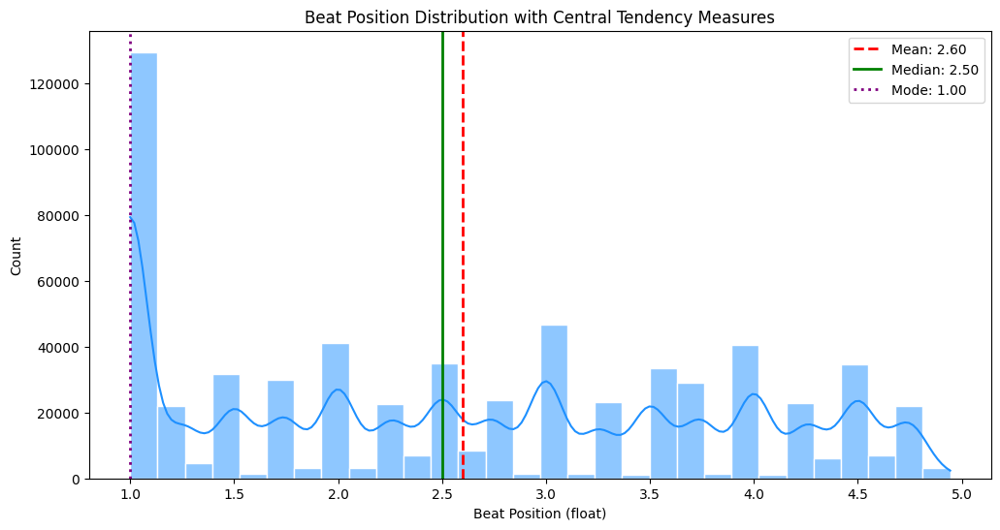

In [632]:
plt.figure(figsize=(12, 6))
sns.histplot(df['beat_position'], bins=30, kde=True, color='dodgerblue', edgecolor='white')

# Add lines for mean, median, and mode
plt.axvline(mean_beat_position_float, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_beat_position_float:.2f}')
plt.axvline(median_beat_position_float, color='green', linestyle='-', linewidth=2, label=f'Median: {median_beat_position_float:.2f}')
plt.axvline(mode_beat_position_float, color='purple', linestyle=':', linewidth=2, label=f'Mode: {mode_beat_position_float:.2f}')

plt.title('Beat Position Distribution with Central Tendency Measures')
plt.xlabel('Beat Position (float)')
plt.ylabel('Count')
plt.legend()
plt.show()

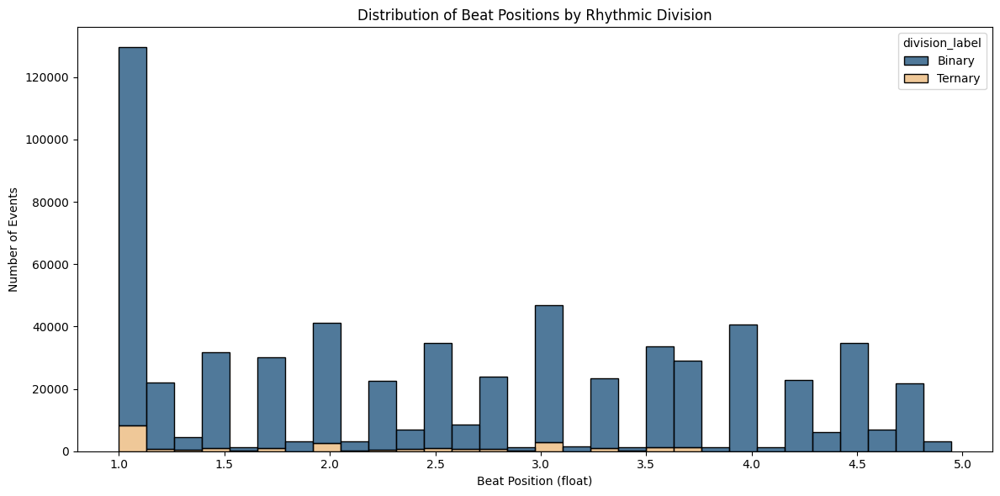

In [633]:
plt.figure(figsize=(12, 6))
sns.histplot(data=df, x='beat_position', hue='division_label', bins=30, multiple='stack', palette=colors)
plt.title("Distribution of Beat Positions by Rhythmic Division")
plt.xlabel("Beat Position (float)")
plt.ylabel("Number of Events")
plt.tight_layout()
plt.show()

##### 2.3.13.3 Outlier Detection in Beat Positions


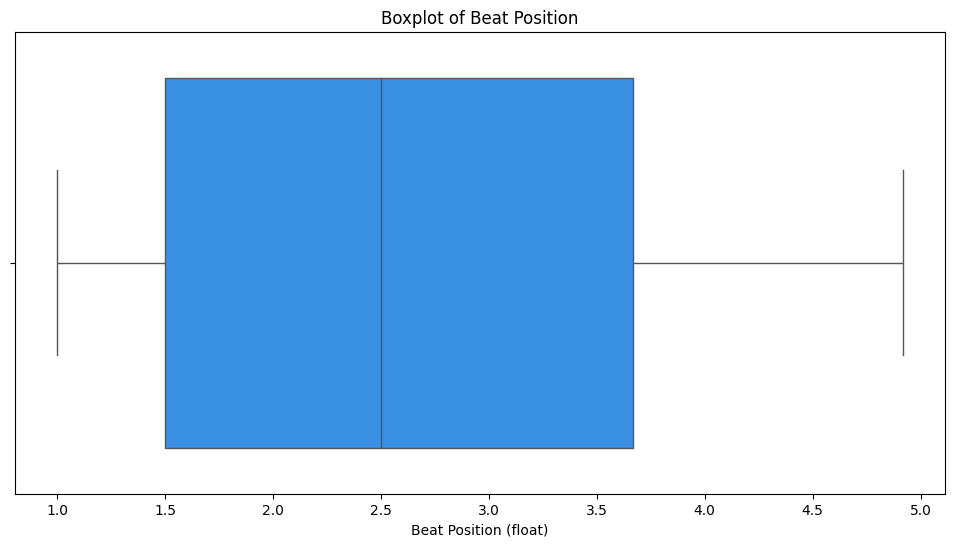

In [634]:
plt.figure(figsize=(12, 6))
sns.boxplot(x=df_notes_only['beat_position'], color='dodgerblue')
plt.title('Boxplot of Beat Position')
plt.xlabel('Beat Position (float)')
plt.show()

##### 2.3.13.4 Beat Position in Context: Key, Instrument, and Genre

In [635]:
# Descriptive statistics of beat position by key
print("Beat Position statistics by Key:")
df.groupby('key')['beat_position'].describe().sort_index()

Beat Position statistics by Key:


,count,mean,std,min,25%,50%,75%,max
key,,,,,,,,
0,57396.0,2.647295,1.236949,1.0,1.500000,2.666667,3.750000,4.944444
1,16127.0,2.739050,1.232999,1.0,1.666667,2.750000,4.000000,4.916667
2,41409.0,2.592238,1.279057,1.0,1.250000,2.500000,3.750000,4.916667
3,30638.0,2.534755,1.243837,1.0,1.333333,2.500000,3.666667,4.916667
4,12523.0,2.477395,1.211239,1.0,1.416667,2.500000,3.500000,4.916667
5,61610.0,2.725372,1.234366,1.0,1.583333,2.750000,3.750000,4.916667
6,9799.0,2.706858,1.267513,1.0,1.500000,2.750000,3.750000,4.916667
7,53847.0,2.602609,1.208316,1.0,1.500000,2.500000,3.583333,4.916667
8,4606.0,2.617419,1.271465,1.0,1.250000,2.416667,4.000000,4.916667


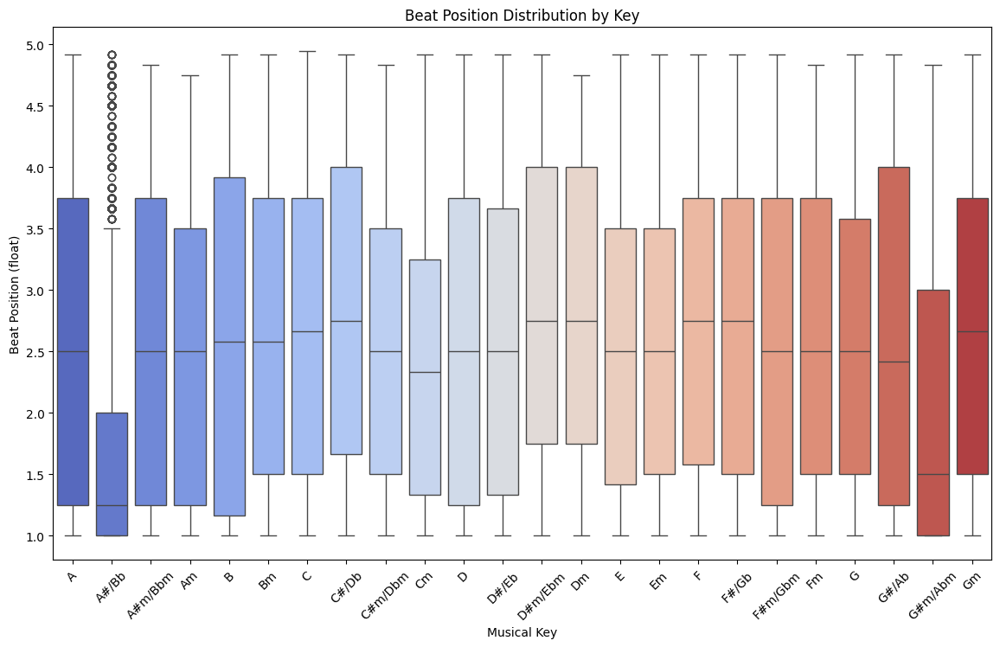

In [636]:
# Beat position distribution across keys to show tonal variation.
plt.figure(figsize=(14,8))
sns.boxplot(x=df['key_name'], y=df['beat_position'], order=ordered_key_names, palette='coolwarm')
plt.title('Beat Position Distribution by Key')
plt.xlabel('Musical Key')
plt.ylabel('Beat Position (float)')
plt.xticks(rotation=45)
plt.show()

In [637]:
# Descriptive statistics of beat position values by instrument
print("Beat position statistics by Instrument:")
df.groupby('instrument')['beat_position'].describe()

Beat position statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Accordion,1.0,2.000000,NaN,2.000000,2.000000,2.000000,2.000000,2.000000
Acoustic Guitar,46426.0,2.648677,1.225183,1.000000,1.500000,2.666667,3.750000,4.916667
Alto Saxophone,1028.0,2.452091,1.297627,1.000000,1.000000,2.500000,3.500000,4.750000
Bagpipes,6887.0,2.731620,1.239972,1.000000,1.500000,2.750000,4.000000,4.750000
Banjo,1849.0,2.666396,1.098675,1.000000,1.833333,2.500000,3.750000,4.750000
Baritone Saxophone,2998.0,2.627390,1.229342,1.000000,1.500000,2.500000,3.750000,4.833333
Bassoon,2606.0,2.181792,0.936285,1.000000,1.000000,2.000000,3.000000,3.750000
Brass,4105.0,2.737515,1.201607,1.000000,1.666667,2.750000,3.750000,4.916667
Choir,6964.0,2.316461,1.335159,1.000000,1.000000,2.000000,3.500000,4.916667


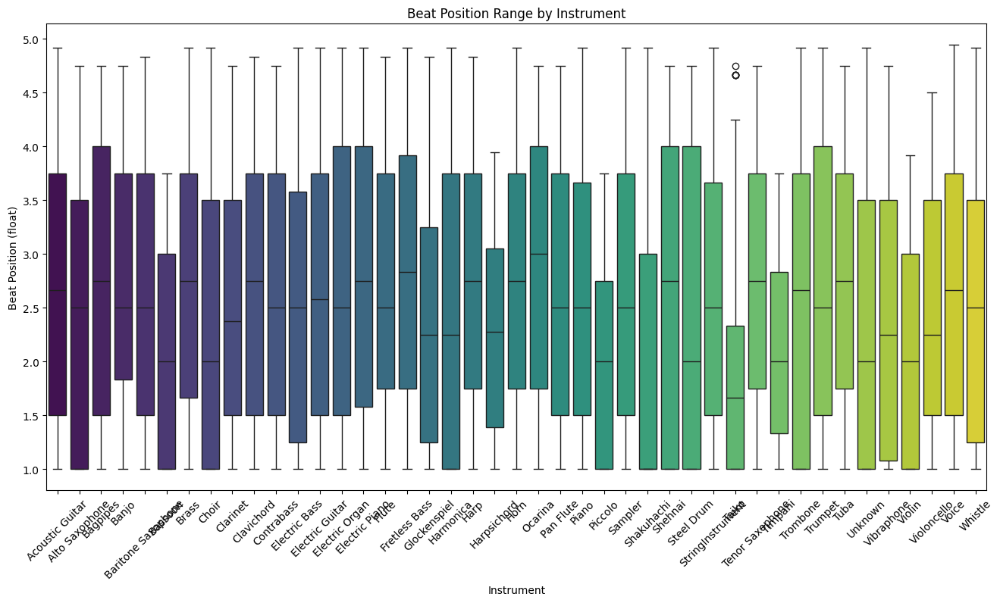

In [638]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df, x='instrument', y='beat_position', palette='viridis', order=alphabetic_order)
plt.xticks(rotation=45)
plt.title('Beat Position Range by Instrument')
plt.xlabel('Instrument')
plt.ylabel('Beat Position (float)')
plt.show()

In [639]:
# Descriptive statistics of beat position by instrument family
print("Beat Position statistics by Instrument Family:")
df.groupby('instrument_family')['beat_position'].describe()

Beat Position statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument_family,,,,,,,,
Bass,31939.0,2.659432,1.228080,1.0,1.500000,2.500000,3.75,4.916667
Brass,37900.0,2.737010,1.240516,1.0,1.666667,2.750000,3.75,4.916667
Electronic,65979.0,2.604854,1.273595,1.0,1.250000,2.500000,3.75,4.916667
Guitar,186869.0,2.657943,1.232586,1.0,1.500000,2.583333,3.75,4.916667
Keyboard,168338.0,2.604533,1.238436,1.0,1.500000,2.500000,3.75,4.916667
Other,41398.0,2.414209,1.270233,1.0,1.000000,2.250000,3.50,4.916667
Percussion,20276.0,2.265297,1.121105,1.0,1.000000,2.000000,3.00,4.833333
Strings,28659.0,2.491553,1.224623,1.0,1.250000,2.500000,3.50,4.916667
Voice,28384.0,2.644351,1.254368,1.0,1.500000,2.666667,3.75,4.944444


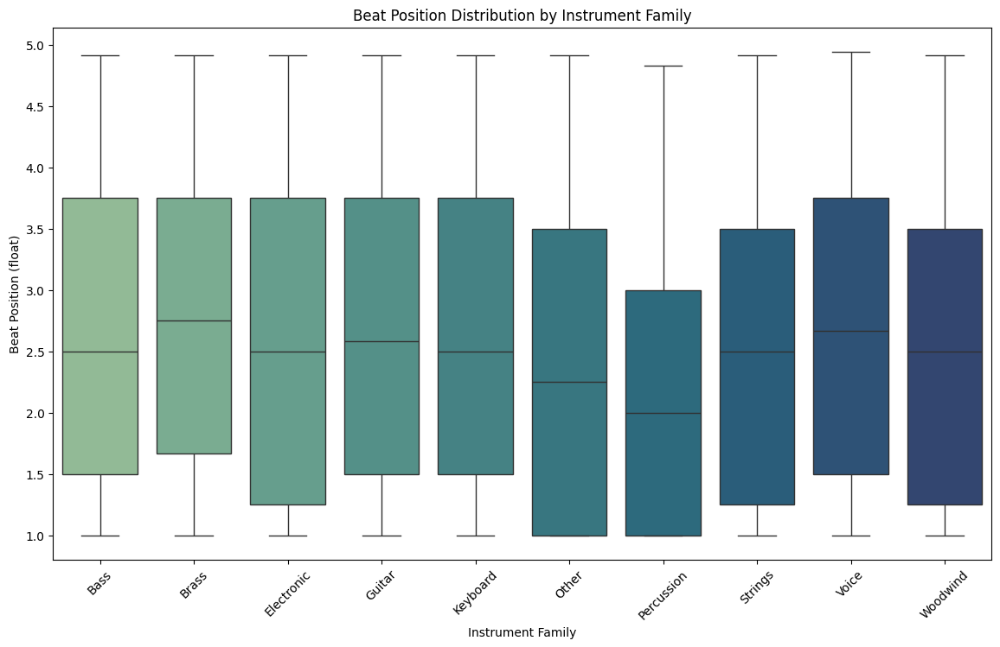

In [640]:
# Filter and plot beat position distribution by instrument family
plt.figure(figsize=(14,8))
sns.boxplot(
    data=df,
    x='instrument_family',
    y='beat_position',
    palette='crest',
    order=families
)
plt.title('Beat Position Distribution by Instrument Family')
plt.xlabel('Instrument Family')
plt.ylabel('Beat Position (float)')
plt.xticks(rotation=45)
plt.show()

In [641]:
# Descriptive statistics of beat position by genre
print("Beat Position statistics by Genre:")
df.groupby('genre')['beat_position'].describe()

Beat Position statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,28830.0,2.589470,1.227182,1.0,1.500000,2.500000,3.583333,4.916667
blues,54451.0,2.607246,1.206718,1.0,1.500000,2.500000,3.666667,4.944444
classical,36582.0,2.661293,1.184203,1.0,1.583333,2.583333,3.722222,4.916667
country,54072.0,2.686410,1.240260,1.0,1.500000,2.666667,3.750000,4.916667
dance,54471.0,2.666846,1.234219,1.0,1.500000,2.750000,3.750000,4.833333
disco,51137.0,2.708052,1.282717,1.0,1.500000,2.750000,3.750000,4.916667
heavy_metal,41747.0,2.620067,1.239922,1.0,1.500000,2.500000,3.750000,4.916667
jazz,33181.0,2.667272,1.264411,1.0,1.416667,2.666667,3.750000,4.916667
new_age,41925.0,2.240151,1.184372,1.0,1.000000,2.000000,3.000000,4.916667


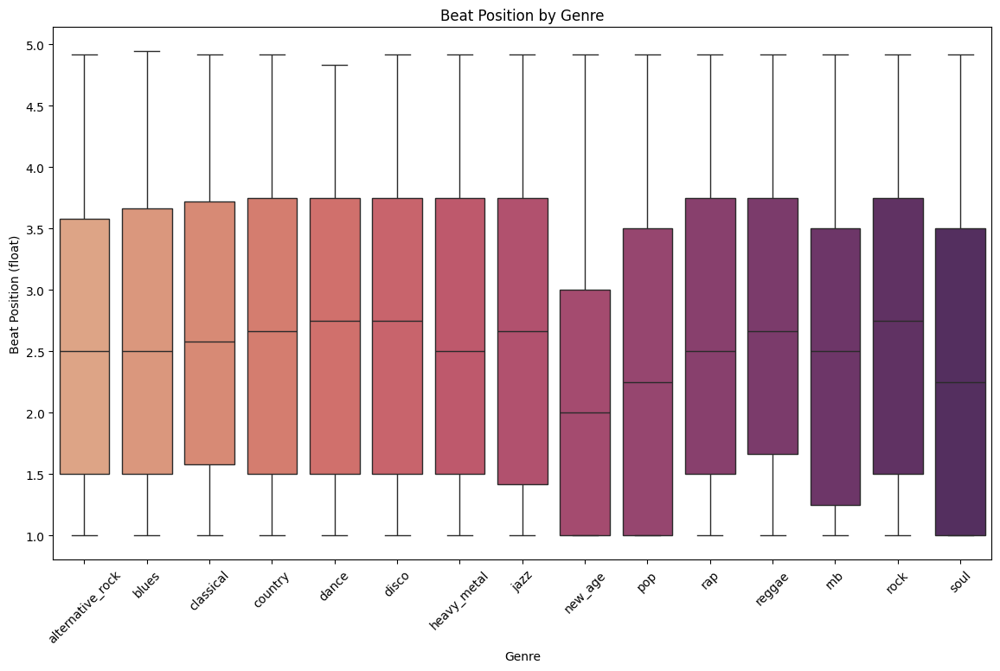

In [642]:
plt.figure(figsize=(14,8))
sns.boxplot(
    data=df,
    x='genre',
    y='beat_position',
    palette='flare',
    order=genres_sorted
)
plt.title('Beat Position by Genre')
plt.xlabel('Genre')
plt.ylabel('Beat Position (float)')
plt.xticks(rotation=45)
plt.show()

##### 2.3.13.5 Beat Position vs. Metric Weight and Chord Tone

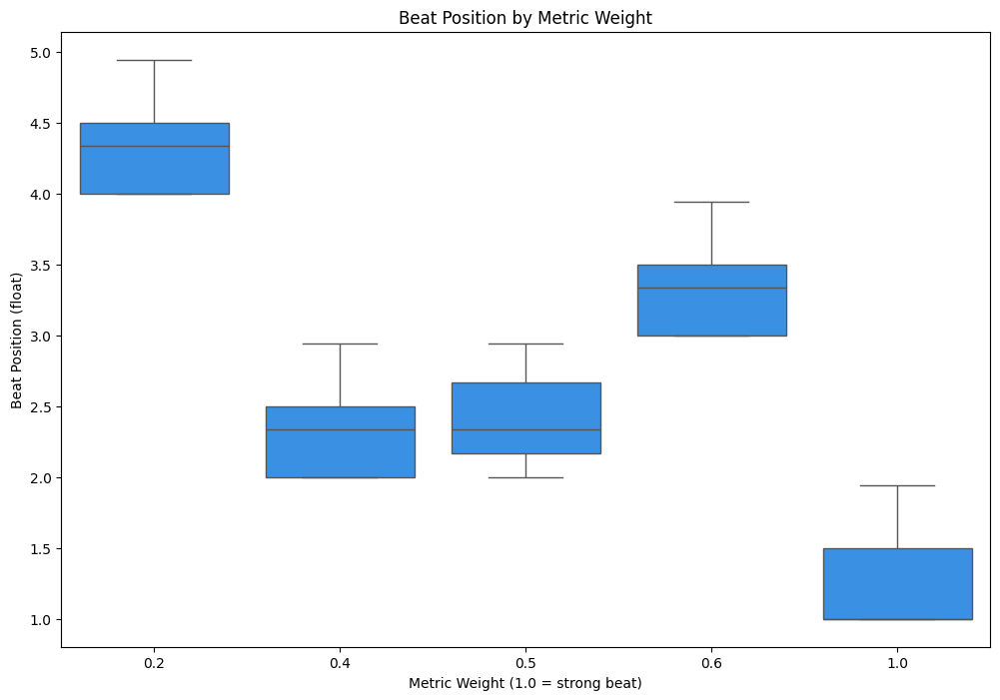

In [643]:
# Set the figure size
plt.figure(figsize=(12, 8))

# Create a boxplot showing how beat position varies with metric weight
sns.boxplot(data=df, x="metric_weight", y="beat_position", color='dodgerblue')
plt.title("Beat Position by Metric Weight")
plt.xlabel("Metric Weight (1.0 = strong beat)")
plt.ylabel("Beat Position (float)")
plt.show()

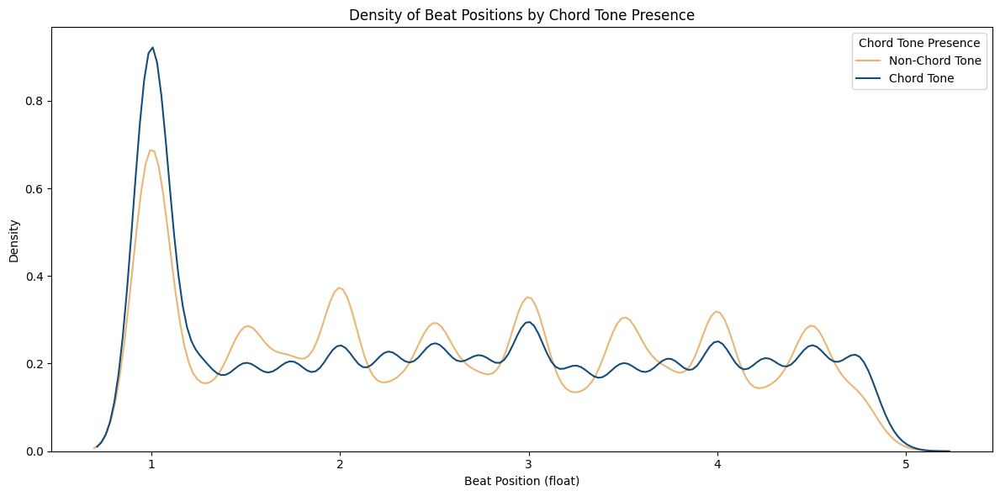

In [644]:
plt.figure(figsize=(12, 6))
sns.kdeplot(data=df, x="beat_position", hue="is_chord_tone", common_norm=False, palette=colors)
plt.title("Density of Beat Positions by Chord Tone Presence")
plt.xlabel("Beat Position (float)")
plt.ylabel("Density")
plt.legend(labels=custom_labels, title="Chord Tone Presence")
plt.tight_layout()
plt.show()

##### Key Findings For The Beat Position Feature
The analysis of beat_position reveals it as a strong rhythmic descriptor that captures both structural regularities and stylistic nuances. The distribution spans from 1.0 to 4.944, aligning with 4/4 meter conventions, with a clear hierarchy of strong beats: beat 1 dominates, followed by beat 3, while beats 2 and 4 are weaker but still significant. Subdivisions (1.5, 2.5, 3.5) highlight the use of eighth notes, and extended values beyond 4.0 reflect sustained notes, anticipations, and phrasing typical in real music. Genre-level differences emerge clearly, such as New Age’s minimalist focus on strong beats, versus syncopated tendencies in rock, disco, and reggae. Instrument-specific roles are also evident: percussion emphasizes strong beats, brass shows syncopation in jazz/funk, and strings occupy an intermediate melodic-rhythmic space. Harmonically, chord tones cluster on beat 1, while non-chord tones dominate on weaker beats, reflecting tonal traditions. Overall, beat_position not only encodes the metric hierarchy but also differentiates genres, instruments, and harmonic functions, making it a highly informative feature for topological data analysis.

---

#### 2.3.14 Beat Fraction

In [645]:
# Check values
nan_ratio = df['beat_fraction'].isna().mean()
print(f"NaN rate after parsing: {nan_ratio:.2%}")

NaN rate after parsing: 0.00%


##### 2.3.14.1 Central Tendency and Spread of Beat Fraction


In [646]:
df['beat_fraction'].describe()

count    638769.000000
mean          0.670489
std           0.316891
min           0.166667
25%           0.375000
50%           0.666667
75%           0.937500
max           1.750000
Name: beat_fraction, dtype: float64

In [647]:
# Central tendency
mean_beat_fraction_float = df['beat_fraction'].mean()
median_beat_fraction_float = df['beat_fraction'].median()
mode_beat_fraction_float = df['beat_fraction'].mode()[0]

# Spread
std_beat_fraction_float = df['beat_fraction'].std()

# Display results
print(f"Mean beat fraction: {mean_beat_fraction_float:.2f}")
print(f"Median beat fraction: {median_beat_fraction_float:.2f}")
print(f"Mode beat fraction: {mode_beat_fraction_float:.2f}")
print(f"Standard beat fraction: {std_beat_fraction_float:.2f}")

Mean beat fraction: 0.67
Median beat fraction: 0.67
Mode beat fraction: 0.25
Standard beat fraction: 0.32


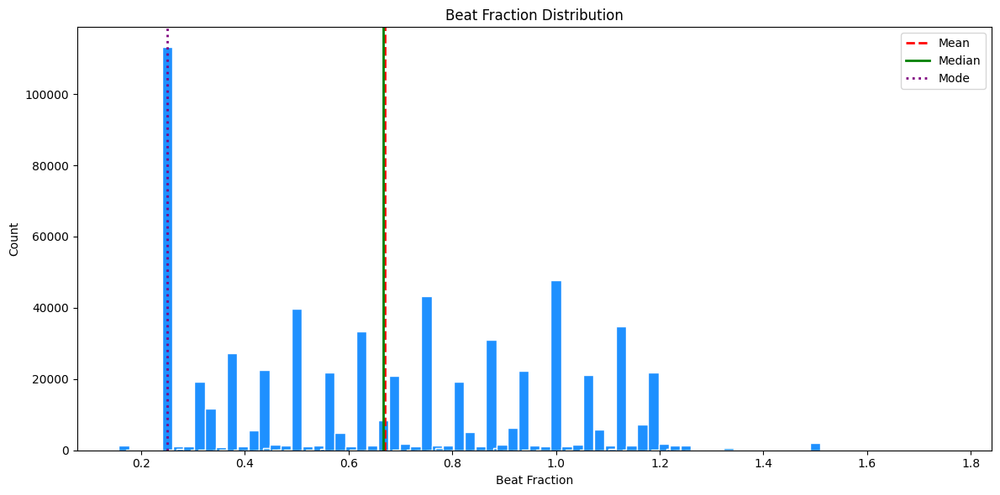

In [648]:
# Count and sort unique values
beat_fraction_counts = df['beat_fraction'].value_counts().sort_index()

plt.figure(figsize=(12, 6))
plt.bar(beat_fraction_counts.index, beat_fraction_counts.values, width=0.02, color='dodgerblue', edgecolor='white')

plt.axvline(mean_beat_fraction_float, color='red', linestyle='--', linewidth=2, label='Mean')
plt.axvline(median_beat_fraction_float, color='green', linestyle='-', linewidth=2, label='Median')
plt.axvline(mode_beat_fraction_float, color='purple', linestyle=':', linewidth=2, label='Mode')

plt.title('Beat Fraction Distribution')
plt.xlabel('Beat Fraction')
plt.ylabel('Count')
plt.legend()
plt.tight_layout()
plt.show()

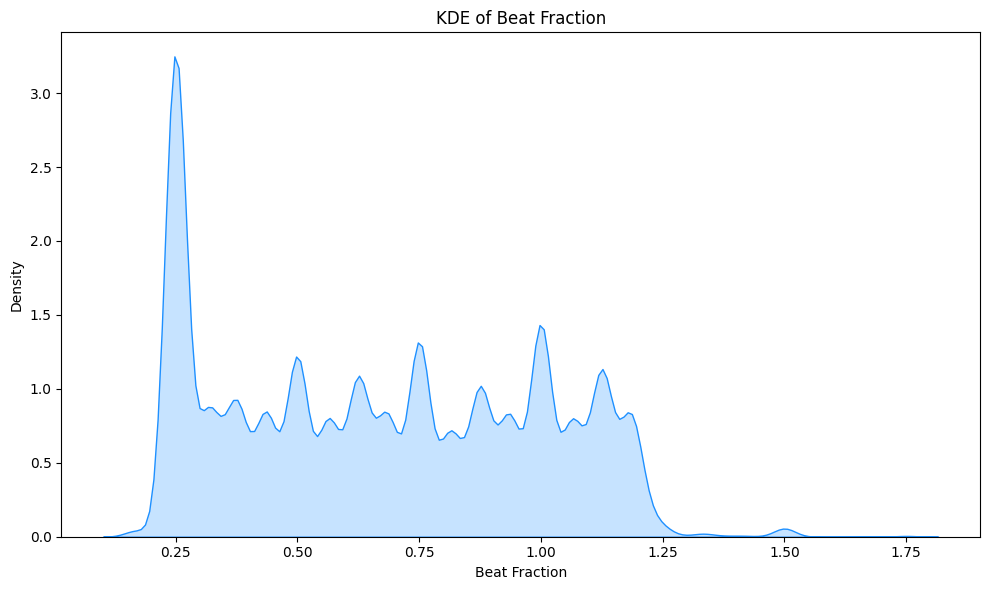

In [649]:
plt.figure(figsize=(10, 6))
sns.kdeplot(df['beat_fraction'], shade=True, color='dodgerblue')
plt.title("KDE of Beat Fraction")
plt.xlabel("Beat Fraction")
plt.tight_layout()
plt.show()

##### 2.3.14.2 Rhythmic Division and Beat Fraction


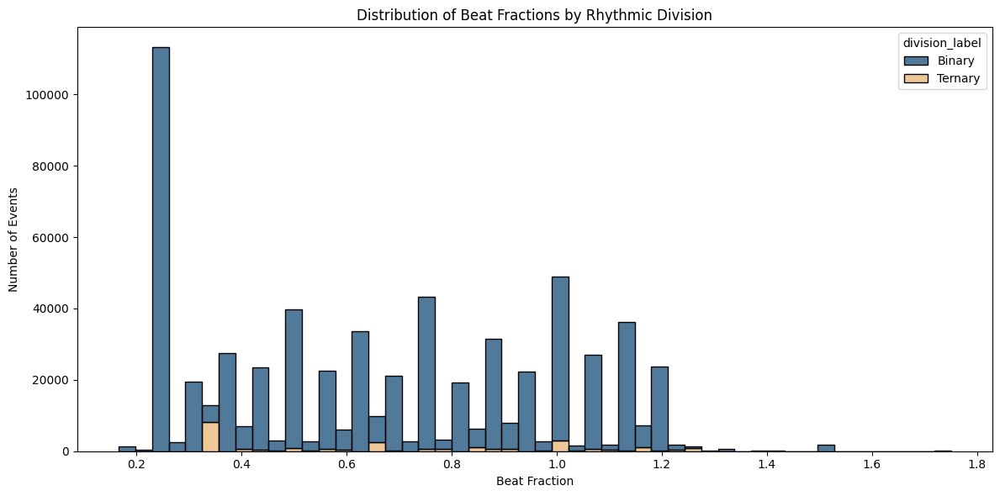

In [650]:
plt.figure(figsize=(12, 6))
sns.histplot(data=df, x='beat_fraction', hue='division_label', bins=50, multiple='stack', palette=colors)
plt.title("Distribution of Beat Fractions by Rhythmic Division")
plt.xlabel("Beat Fraction")
plt.ylabel("Number of Events")
plt.tight_layout()
plt.show()

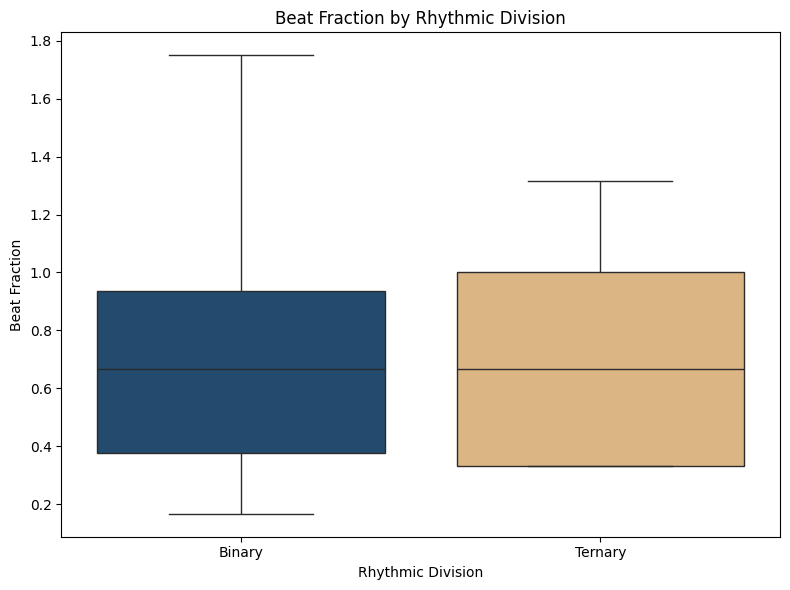

In [651]:
plt.figure(figsize=(8, 6))
sns.boxplot(data=df, x='division_label', y='beat_fraction', palette=colors)
plt.title("Beat Fraction by Rhythmic Division")
plt.xlabel("Rhythmic Division")
plt.ylabel("Beat Fraction")
plt.tight_layout()
plt.show()

##### 2.3.14.3 Outlier Detection in Beat Fraction


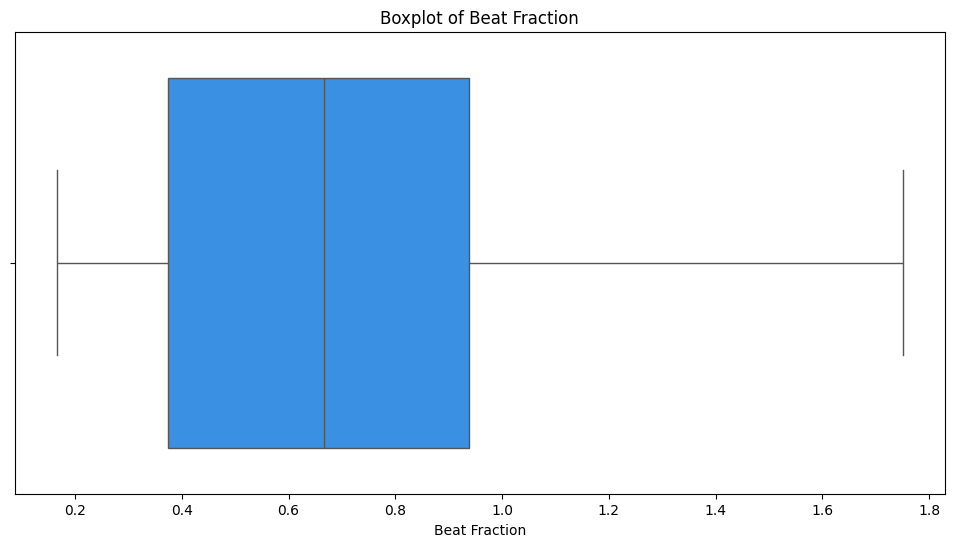

In [652]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='beat_fraction', color='dodgerblue')
plt.title('Boxplot of Beat Fraction')
plt.xlabel('Beat Fraction')
plt.show()

##### 2.3.14.4 Beat Fraction in Context: Key, Instrument, and Genre

In [653]:
# Descriptive statistics of beat position by key
print("Beat Fraction statistics by Key:")
df.groupby('key')['beat_fraction'].describe().sort_index()

Beat Fraction statistics by Key:


,count,mean,std,min,25%,50%,75%,max
key,,,,,,,,
0,57396.0,0.673728,0.311650,0.250000,0.375000,0.666667,0.937500,1.305556
1,16127.0,0.684763,0.308250,0.250000,0.416667,0.687500,1.000000,1.229167
2,41409.0,0.668162,0.325434,0.250000,0.375000,0.625000,0.937500,1.458333
3,30638.0,0.614916,0.323665,0.166667,0.277778,0.562500,0.916667,1.229167
4,12523.0,0.619349,0.302810,0.250000,0.354167,0.625000,0.875000,1.229167
5,61610.0,0.681343,0.308591,0.250000,0.395833,0.687500,0.937500,1.229167
6,9799.0,0.676714,0.316878,0.250000,0.375000,0.687500,0.937500,1.229167
7,53847.0,0.659495,0.304896,0.250000,0.375000,0.625000,0.937500,1.250000
8,4606.0,0.654355,0.317866,0.250000,0.312500,0.604167,1.000000,1.229167


In [654]:
# Verify Key 10
key10_data = df[df['key'] == 10]
print(key10_data['genre'].value_counts())
print(key10_data['instrument_family'].value_counts())
print(key10_data['time_signature'].value_counts())

genre
soul     7512
blues    4128
Name: count, dtype: int64
instrument_family
Other       7512
Keyboard    4128
Name: count, dtype: int64
time_signature
4/4    11640
Name: count, dtype: int64


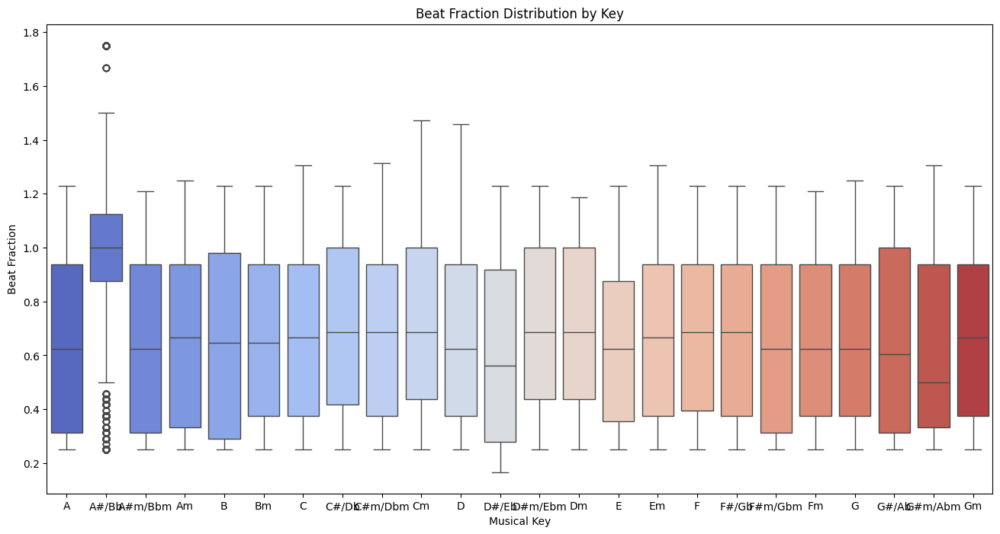

In [655]:
# Beat fraction distribution across keys to show tonal variation
plt.figure(figsize=(16, 8))
sns.boxplot(data=df, x='key_name', y='beat_fraction', order=ordered_key_names, palette='coolwarm')
plt.title('Beat Fraction Distribution by Key')
plt.xlabel('Musical Key')
plt.ylabel('Beat Fraction')
plt.show()

In [656]:
# Descriptive statistics of beat fraction values by instrument
print("Beat fraction statistics by Instrument:")
df.groupby('instrument')['beat_fraction'].describe()

Beat fraction statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Accordion,1.0,0.500000,NaN,0.500000,0.500000,0.500000,0.500000,0.500000
Acoustic Guitar,46426.0,0.662169,0.306296,0.250000,0.375000,0.666667,0.937500,1.229167
Alto Saxophone,1028.0,0.613023,0.324407,0.250000,0.250000,0.625000,0.875000,1.187500
Bagpipes,6887.0,0.682905,0.309993,0.250000,0.375000,0.687500,1.000000,1.187500
Banjo,1849.0,0.666599,0.274669,0.250000,0.458333,0.625000,0.937500,1.187500
Baritone Saxophone,2998.0,0.656848,0.307336,0.250000,0.375000,0.625000,0.937500,1.208333
Bassoon,2606.0,0.727152,0.311990,0.333333,0.333333,0.666667,1.000000,1.250000
Brass,4105.0,0.684379,0.300402,0.250000,0.416667,0.687500,0.937500,1.229167
Choir,6964.0,0.579115,0.333790,0.250000,0.250000,0.500000,0.875000,1.229167


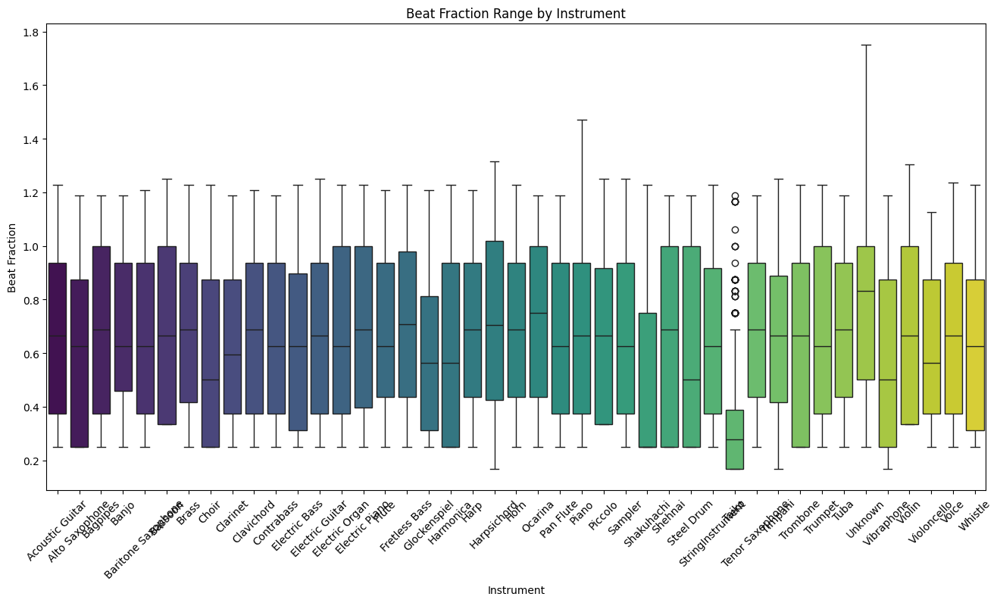

In [657]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df, x='instrument', y='beat_fraction', palette='viridis', order=alphabetic_order)
plt.xticks(rotation=45)
plt.title('Beat Fraction Range by Instrument')
plt.xlabel('Instrument')
plt.ylabel('Beat Fraction')
plt.show()

In [658]:
# Descriptive statistics of beat fraction by instrument family
print("Beat Fraction statistics by Instrument Family:")
df.groupby('instrument_family')['beat_fraction'].describe()

Beat Fraction statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument_family,,,,,,,,
Bass,31939.0,0.664858,0.307020,0.250000,0.375000,0.625000,0.937500,1.229167
Brass,37900.0,0.684279,0.310096,0.250000,0.416667,0.687500,0.937500,1.229167
Electronic,65979.0,0.651823,0.318501,0.250000,0.312500,0.625000,0.937500,1.250000
Guitar,186869.0,0.668673,0.308548,0.250000,0.375000,0.666667,0.937500,1.250000
Keyboard,168338.0,0.677426,0.316944,0.166667,0.375000,0.666667,0.944444,1.472222
Other,41398.0,0.762093,0.352784,0.250000,0.479167,0.750000,1.000000,1.750000
Percussion,20276.0,0.553915,0.301929,0.166667,0.250000,0.500000,0.750000,1.250000
Strings,28659.0,0.646714,0.313573,0.250000,0.333333,0.625000,0.937500,1.305556
Voice,28384.0,0.661088,0.313592,0.250000,0.375000,0.666667,0.937500,1.236111


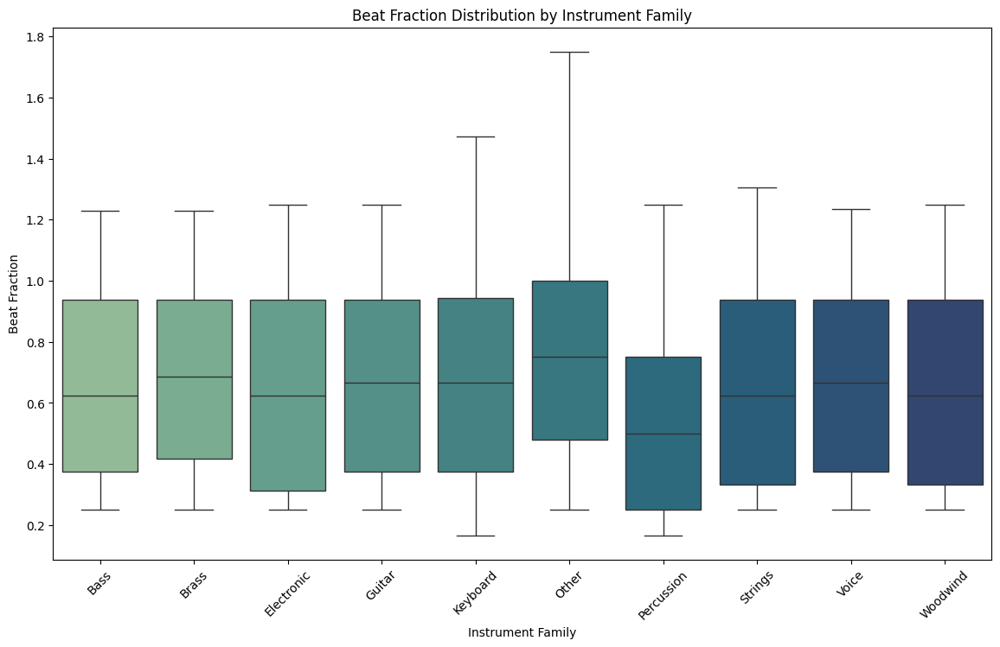

In [659]:
# Filter and plot beat fraction distribution by instrument family
plt.figure(figsize=(14,8))
sns.boxplot(data=df, x='instrument_family', y='beat_fraction', palette='crest', order=families)
plt.title('Beat Fraction Distribution by Instrument Family')
plt.xlabel('Instrument Family')
plt.ylabel('Beat Fraction')
plt.xticks(rotation=45)
plt.show()

In [660]:
# Descriptive statistics of beat fraction by genre
print("Beat Fraction statistics by Genre:")
df.groupby('genre')['beat_fraction'].describe()

Beat Fraction statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,28830.0,0.647367,0.306795,0.250000,0.375000,0.625000,0.895833,1.229167
blues,54451.0,0.703535,0.315188,0.250000,0.416667,0.708333,1.000000,1.472222
classical,36582.0,0.707865,0.305878,0.250000,0.437500,0.687500,1.000000,1.458333
country,54072.0,0.671603,0.310065,0.250000,0.375000,0.666667,0.937500,1.229167
dance,54471.0,0.666711,0.308555,0.250000,0.375000,0.687500,0.937500,1.208333
disco,51137.0,0.677013,0.320679,0.250000,0.375000,0.687500,0.937500,1.229167
heavy_metal,41747.0,0.655017,0.309981,0.250000,0.375000,0.625000,0.937500,1.229167
jazz,33181.0,0.666818,0.316103,0.250000,0.354167,0.666667,0.937500,1.229167
new_age,41925.0,0.586777,0.319793,0.166667,0.250000,0.500000,0.875000,1.305556


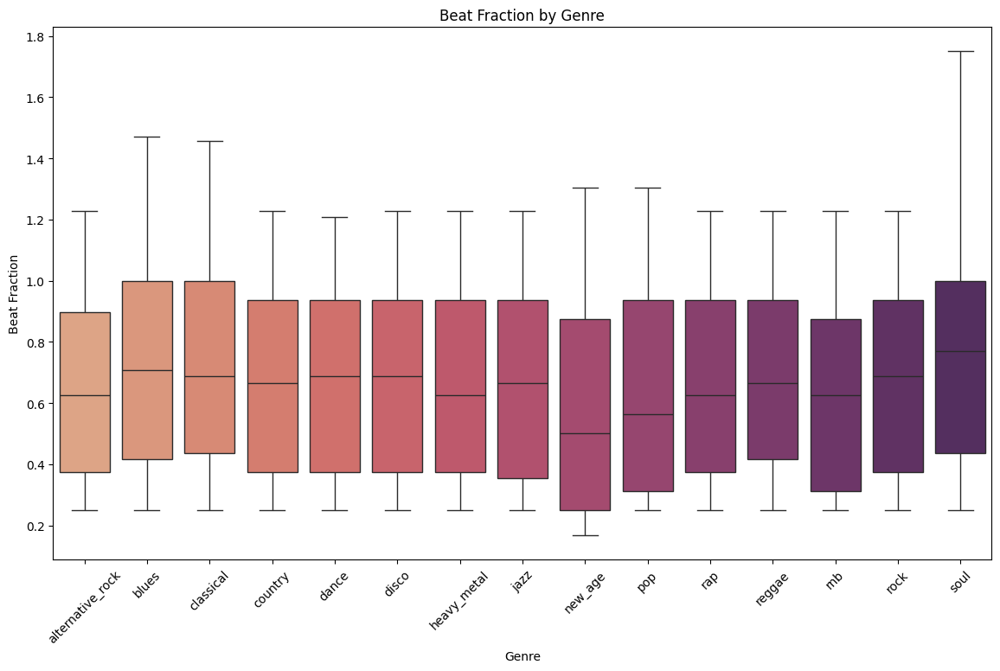

In [661]:
plt.figure(figsize=(14,8))
sns.boxplot(data=df, x='genre', y='beat_fraction', palette='flare', order=genres_sorted)
plt.title('Beat Fraction by Genre')
plt.xlabel('Genre')
plt.ylabel('Beat Fraction')
plt.xticks(rotation=45)
plt.show()

##### 2.3.14.5 Beat Fraction vs. Metric Weight and Chord Tone

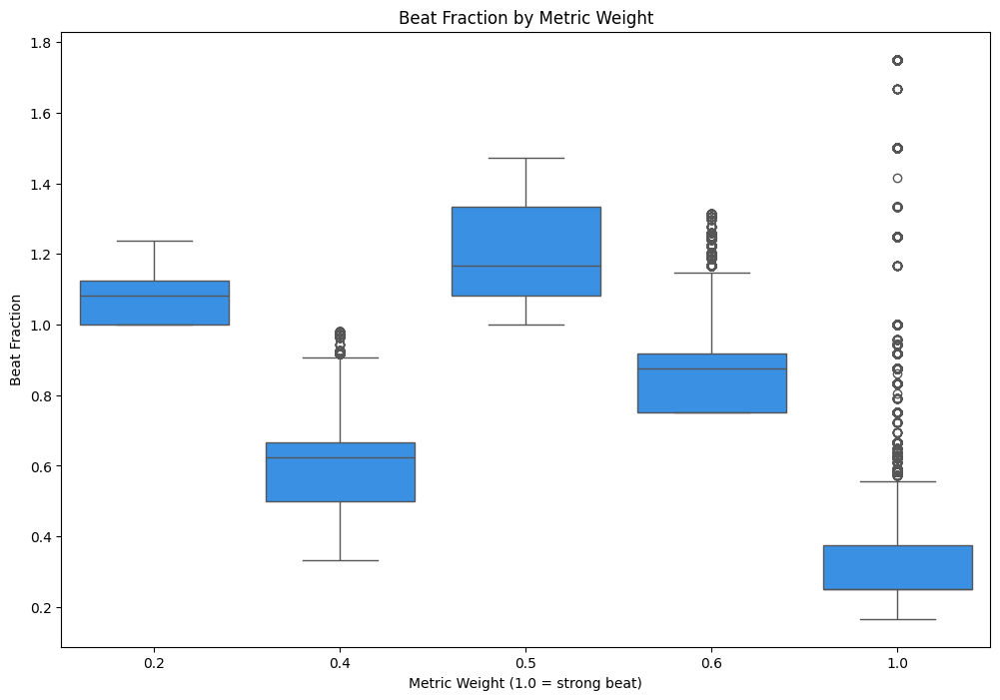

In [662]:
# Set the figure size
plt.figure(figsize=(12, 8))

# Create a boxplot showing how beat position varies with metric weight
sns.boxplot(data=df, x="metric_weight", y="beat_fraction", color='dodgerblue')
plt.title("Beat Fraction by Metric Weight")
plt.xlabel("Metric Weight (1.0 = strong beat)")
plt.ylabel("Beat Fraction")
plt.show()

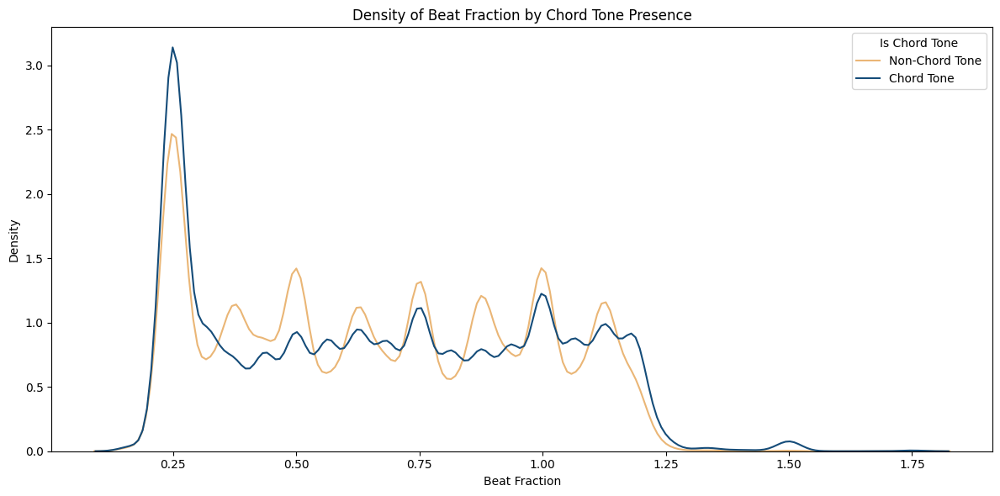

In [663]:
plt.figure(figsize=(12, 6))
sns.kdeplot(data=df, x="beat_fraction", hue="is_chord_tone", common_norm=False, palette=colors)
plt.title("Density of Beat Fraction by Chord Tone Presence")
plt.xlabel("Beat Fraction")
plt.ylabel("Density")
plt.legend(labels=custom_labels, title="Is Chord Tone")
plt.tight_layout()
plt.show()

##### 2.3.14.6 Distribution of Chord Tones Across Beat Fraction Bins

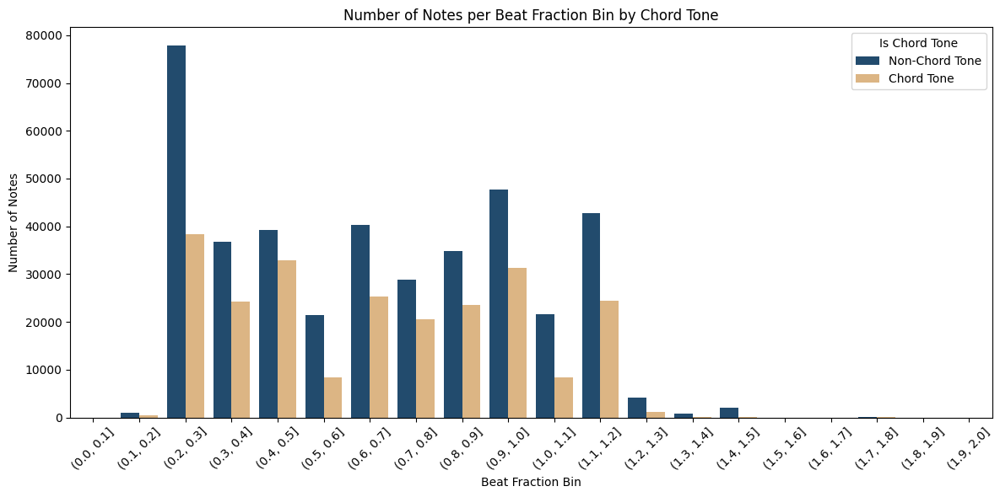

In [664]:
# Group by binned beat_fraction and is_chord_tone without modifying the DataFrame
bins = np.arange(0, 2.1, 0.1)
grouped = (
    df.groupby([pd.cut(df['beat_fraction'], bins=bins), 'is_chord_tone'])
    .size()
    .reset_index(name='count')
)

# Plot grouped barplot
plt.figure(figsize=(12, 6))
ax = sns.barplot(data=grouped, x='beat_fraction', y='count', hue='is_chord_tone', palette=colors)

handles, _ = ax.get_legend_handles_labels()
plt.legend(handles=handles, labels=custom_labels, title="Is Chord Tone")

plt.title("Number of Notes per Beat Fraction Bin by Chord Tone")
plt.xlabel("Beat Fraction Bin")
plt.ylabel("Number of Notes")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

##### Key Findings For The Beat Fraction Feature
The beat_fraction feature captures rhythmic placement within the bar and reveals strong regularities that mirror those found in beat_position. Its distribution is dominated by a peak at 0.25, corresponding to the first beat, confirming the primacy of downbeats in the corpus. Secondary peaks align with subdivisions (0.50, 0.75, 1.0), while a tail up to 1.75 reflects extended phrasing and anticipations, consistent with the rhythmic extensions observed in beat_position. Binary subdivisions dominate overwhelmingly, but a persistent ternary presence (~5–10%) highlights genres with swing or triplet feels, such as jazz and blues. Genre-level differences are clear: minimalist placement in New Age contrasts with syncopated activity in Soul and Blues, where beat_fraction values cluster near the end of measures. Instrument patterns are noisier due to MIDI encoding issues, but broad roles (e.g., percussion vs. melodic instruments) remain coherent. Overall, beat_fraction provides a robust rhythmic descriptor that both confirms metric hierarchies and captures stylistic nuances, making it a valuable complement to beat_position in topological analysis.

---

#### 2.3.15 Metric Weight: Rhythmic Hierarchy and Structural Emphasis

##### 2.3.15.1 Central Tendency and Distribution of Rhythmic Weights


In [665]:
# Descriptive stats: proportion and spread of beat position
df['metric_weight'].describe()

count    638769.000000
mean          0.609828
std           0.313862
min           0.200000
25%           0.400000
50%           0.600000
75%           1.000000
max           1.000000
Name: metric_weight, dtype: float64

In [666]:
# Central tendency
mean_metric_weight = df['metric_weight'].mean()
median_metric_weight = df['metric_weight'].median()
mode_metric_weight = df['metric_weight'].mode()[0]  

# Spread
std_metric_weight = df['metric_weight'].std()

# Display results
print(f"Mean metric weight: {mean_metric_weight:.2f}")
print(f"Median metric weight: {median_metric_weight:.2f}")
print(f"Mode metric weight: {mode_metric_weight:.2f}")
print(f"Standard metric weight: {std_metric_weight:.2f}")

Mean metric weight: 0.61
Median metric weight: 0.60
Mode metric weight: 1.00
Standard metric weight: 0.31


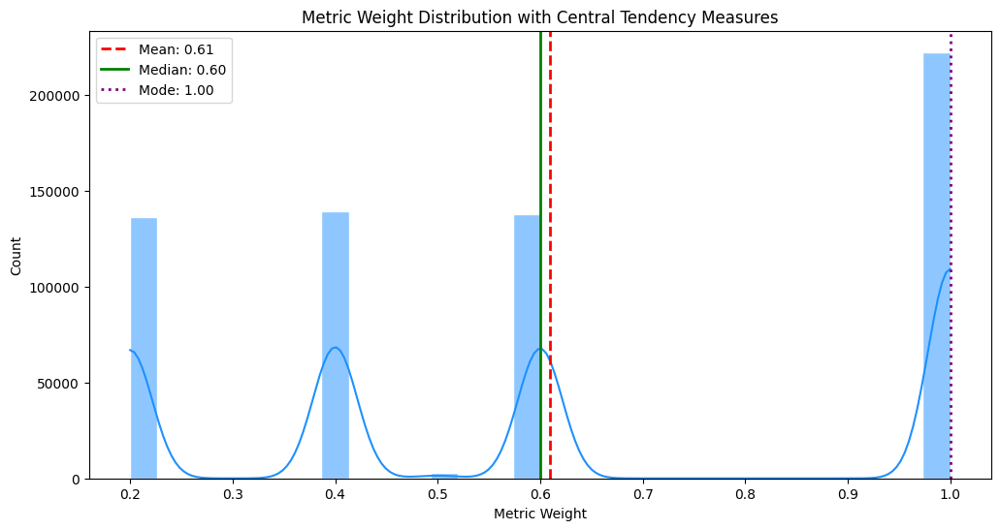

In [667]:
plt.figure(figsize=(12, 6))
sns.histplot(df['metric_weight'], bins=30, kde=True, color='dodgerblue', edgecolor='white')

# Add lines for mean, median, and mode
plt.axvline(mean_metric_weight, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_metric_weight:.2f}')
plt.axvline(median_metric_weight, color='green', linestyle='-', linewidth=2, label=f'Median: {median_metric_weight:.2f}')
plt.axvline(mode_metric_weight, color='purple', linestyle=':', linewidth=2, label=f'Mode: {mode_metric_weight:.2f}')

plt.title('Metric Weight Distribution with Central Tendency Measures')
plt.xlabel('Metric Weight')
plt.ylabel('Count')
plt.legend()
plt.show()

##### 2.3.15.2 Outlier Detection in Metric Weight


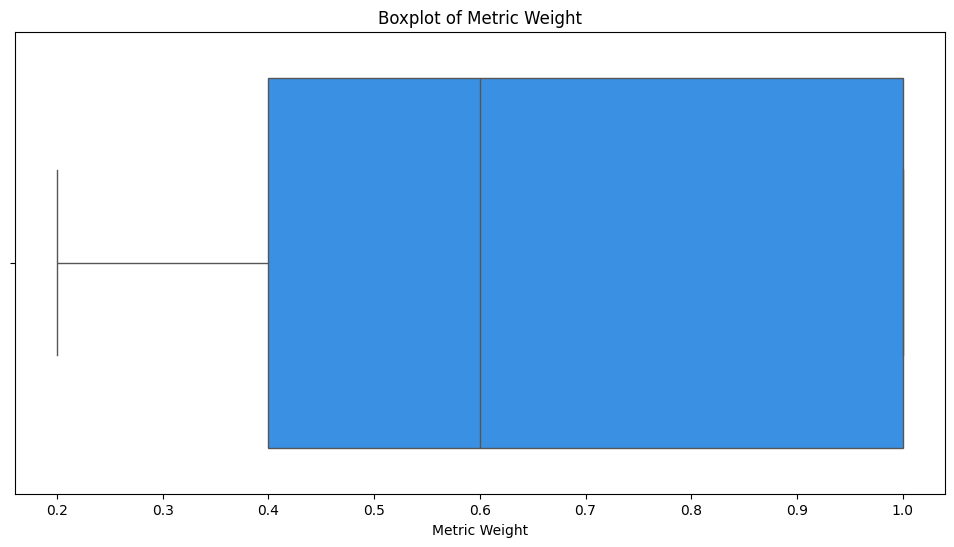

In [668]:
plt.figure(figsize=(12, 6))
sns.boxplot(x=df['metric_weight'], color='dodgerblue')
plt.title('Boxplot of Metric Weight')
plt.xlabel('Metric Weight')
plt.show()

##### 2.3.15.3 Metric Weight in Context: Key, Instrument, and Genre

In [669]:
# Descriptive statistics of metric weight
print("Metric Weight statistics by Key:")
df.groupby('key')['metric_weight'].describe().sort_index()

Metric Weight statistics by Key:


,count,mean,std,min,25%,50%,75%,max
key,,,,,,,,
0,57396.0,0.598442,0.311460,0.2,0.4,0.6,1.0,1.0
1,16127.0,0.569430,0.310286,0.2,0.2,0.6,1.0,1.0
2,41409.0,0.613287,0.319587,0.2,0.4,0.6,1.0,1.0
3,30638.0,0.619988,0.317430,0.2,0.4,0.6,1.0,1.0
4,12523.0,0.627581,0.316187,0.2,0.4,0.6,1.0,1.0
5,61610.0,0.579597,0.310187,0.2,0.4,0.6,1.0,1.0
6,9799.0,0.592203,0.317028,0.2,0.4,0.6,1.0,1.0
7,53847.0,0.607714,0.307889,0.2,0.4,0.6,1.0,1.0
8,4606.0,0.572254,0.322939,0.2,0.2,0.4,1.0,1.0


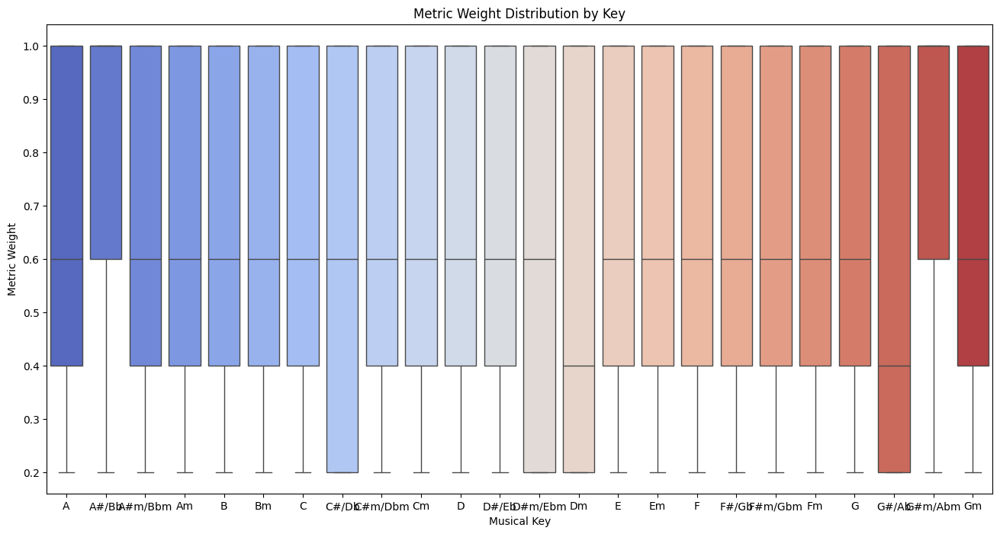

In [670]:
# Metric weight distribution across keys to show tonal variation.
plt.figure(figsize=(16, 8))
sns.boxplot(data=df, x='key_name', y='metric_weight', order=ordered_key_names, palette='coolwarm')
plt.title('Metric Weight Distribution by Key')
plt.xlabel('Musical Key')
plt.ylabel('Metric Weight')
plt.show()

In [671]:
# Descriptive statistics of metric weight by instrument
print("Metric Weight statistics by Instrument:")
df.groupby('instrument')['metric_weight'].describe()

Metric Weight statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Accordion,1.0,0.400000,NaN,0.4,0.40,0.4,0.40,0.4
Acoustic Guitar,46426.0,0.603446,0.311060,0.2,0.40,0.6,1.00,1.0
Alto Saxophone,1028.0,0.658755,0.321709,0.2,0.40,0.6,1.00,1.0
Bagpipes,6887.0,0.566807,0.312814,0.2,0.20,0.6,1.00,1.0
Banjo,1849.0,0.557382,0.290471,0.2,0.40,0.4,1.00,1.0
Baritone Saxophone,2998.0,0.591328,0.310131,0.2,0.40,0.6,1.00,1.0
Bassoon,2606.0,0.697314,0.252467,0.4,0.40,0.6,1.00,1.0
Brass,4105.0,0.571449,0.305574,0.2,0.40,0.6,1.00,1.0
Choir,6964.0,0.669787,0.331297,0.2,0.40,0.6,1.00,1.0


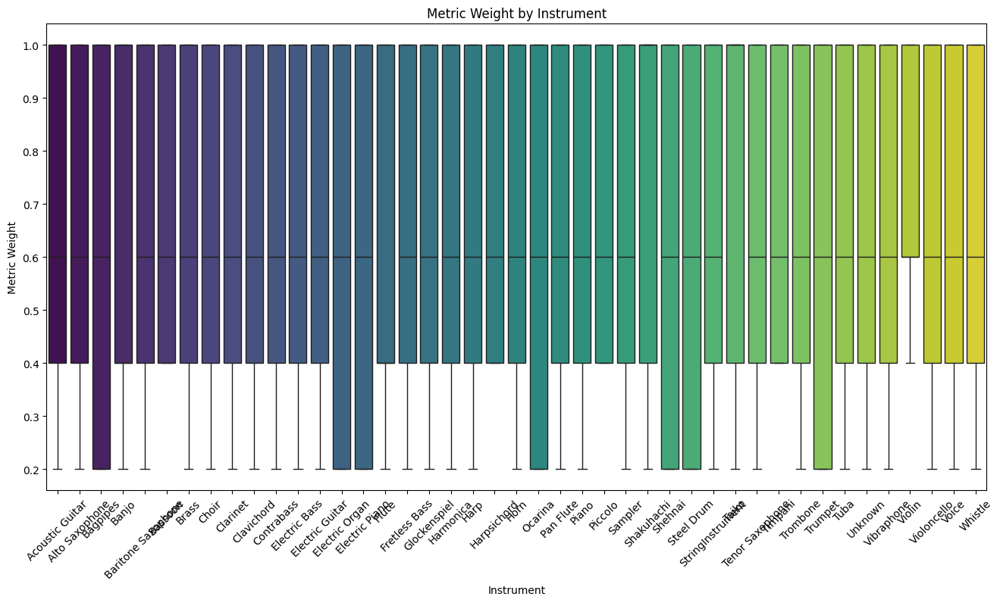

In [672]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df, x='instrument', y='metric_weight', palette='viridis', order=alphabetic_order)
plt.xticks(rotation=45)
plt.title('Metric Weight by Instrument')
plt.xlabel('Instrument')
plt.ylabel('Metric Weight')
plt.show()

In [673]:
# Descriptive statistics of metric weight by instrument family
print("Metric Weight statistics by Instrument Family:")
df.groupby('instrument')['metric_weight'].describe()

Metric Weight statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Accordion,1.0,0.400000,NaN,0.4,0.40,0.4,0.40,0.4
Acoustic Guitar,46426.0,0.603446,0.311060,0.2,0.40,0.6,1.00,1.0
Alto Saxophone,1028.0,0.658755,0.321709,0.2,0.40,0.6,1.00,1.0
Bagpipes,6887.0,0.566807,0.312814,0.2,0.20,0.6,1.00,1.0
Banjo,1849.0,0.557382,0.290471,0.2,0.40,0.4,1.00,1.0
Baritone Saxophone,2998.0,0.591328,0.310131,0.2,0.40,0.6,1.00,1.0
Bassoon,2606.0,0.697314,0.252467,0.4,0.40,0.6,1.00,1.0
Brass,4105.0,0.571449,0.305574,0.2,0.40,0.6,1.00,1.0
Choir,6964.0,0.669787,0.331297,0.2,0.40,0.6,1.00,1.0


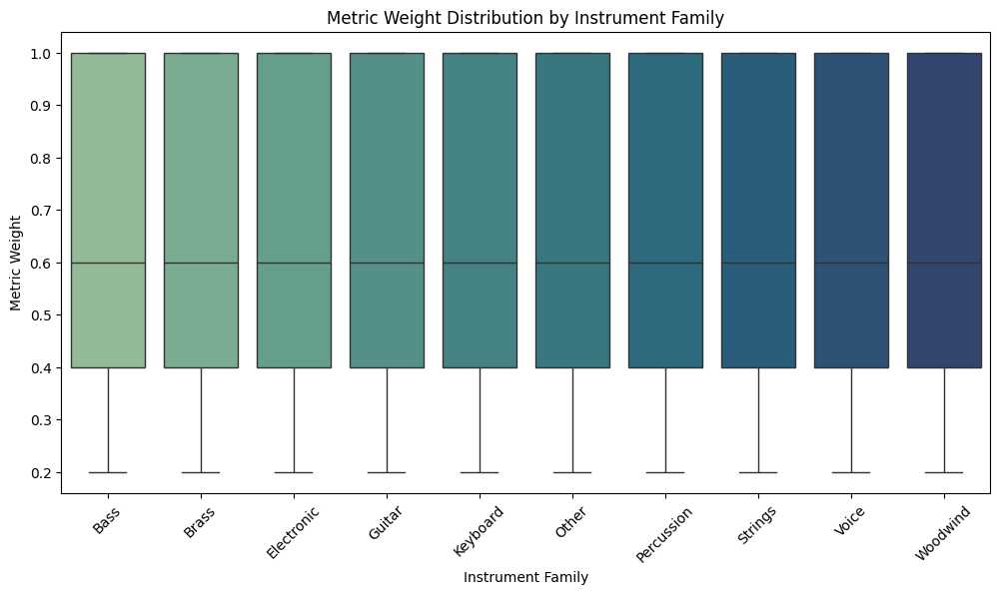

In [674]:
# Filter and plot metric weight distribution by instrument family
plt.figure(figsize=(12, 6))
sns.boxplot(
    data=df,
    x='instrument_family',
    y='metric_weight',
    palette='crest',
    order=families
)
plt.title('Metric Weight Distribution by Instrument Family')
plt.xlabel('Instrument Family')
plt.ylabel('Metric Weight')
plt.xticks(rotation=45)
plt.show()

In [675]:
# Descriptive statistics of metric weight by genre
print("Metric Weight statistics by Genre:")
df.groupby('genre')['metric_weight'].describe()

Metric Weight statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,28830.0,0.607506,0.314871,0.2,0.4,0.6,1.0,1.0
blues,54451.0,0.603884,0.308448,0.2,0.4,0.6,1.0,1.0
classical,36582.0,0.599836,0.302709,0.2,0.4,0.6,1.0,1.0
country,54072.0,0.582120,0.310339,0.2,0.4,0.6,1.0,1.0
dance,54471.0,0.597896,0.313813,0.2,0.4,0.6,1.0,1.0
disco,51137.0,0.600477,0.317117,0.2,0.4,0.6,1.0,1.0
heavy_metal,41747.0,0.595731,0.315434,0.2,0.4,0.6,1.0,1.0
jazz,33181.0,0.599632,0.315661,0.2,0.4,0.6,1.0,1.0
new_age,41925.0,0.679771,0.310194,0.2,0.4,0.6,1.0,1.0


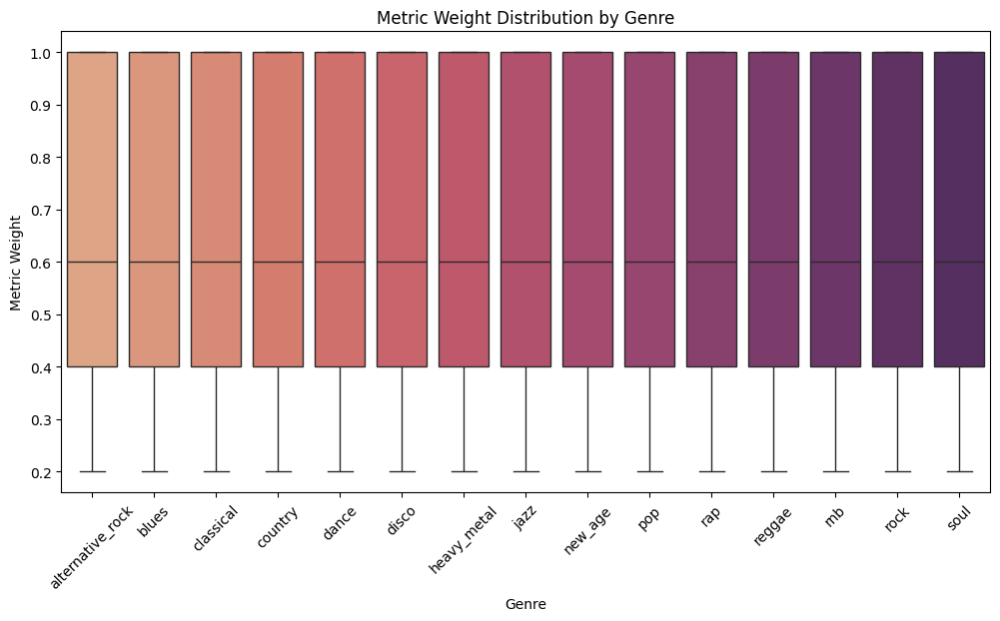

In [676]:
plt.figure(figsize=(12, 6))
sns.boxplot(
    data=df,
    x='genre',
    y='metric_weight',
    palette='flare',
    order=genres_sorted
)
plt.title('Metric Weight Distribution by Genre')
plt.xlabel('Genre')
plt.ylabel('Metric Weight')
plt.xticks(rotation=45)
plt.show()

##### 2.3.15.4 Metric Strength and Harmonic Anchoring: Chord Tone Likelihood by Weight

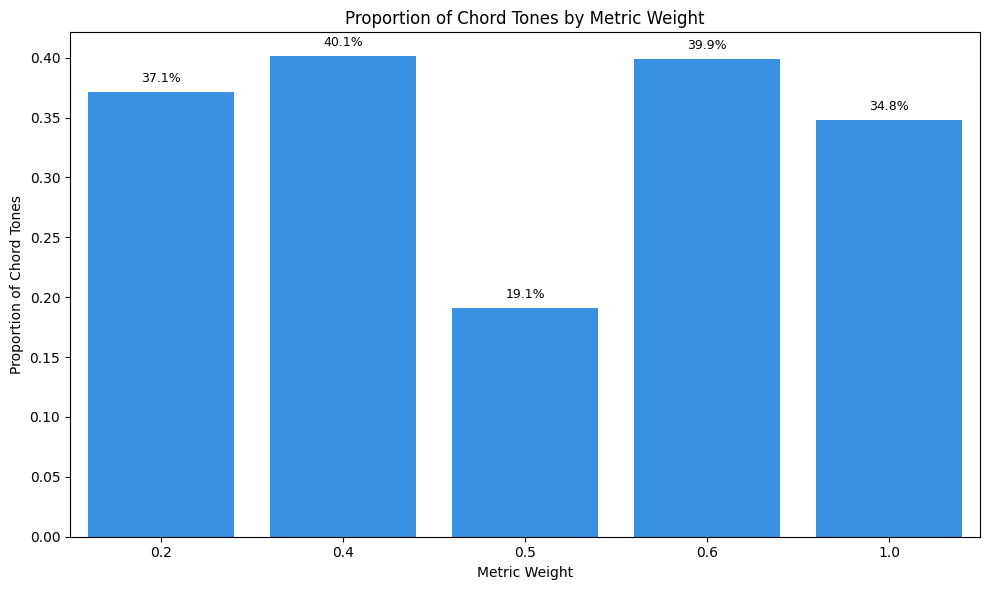

In [677]:
plt.figure(figsize=(10, 6))
ax = sns.barplot(data=df, x='metric_weight', y='is_chord_tone', estimator='mean', ci=None, color='dodgerblue')

# Add percentage annotations on top of bars
for bar in ax.patches:
    height = bar.get_height()
    if not np.isnan(height):  
        ax.annotate(f'{height * 100:.1f}%',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 5),
                    textcoords='offset points',
                    ha='center',
                    va='bottom',
                    fontsize=9,
                    color='black')

plt.title("Proportion of Chord Tones by Metric Weight")
plt.xlabel("Metric Weight")
plt.ylabel("Proportion of Chord Tones")
plt.tight_layout()
plt.show()

In [678]:
# Verification by genre 
df.groupby('genre').agg({
    'is_chord_tone': ['mean', lambda x: x[df.loc[x.index, 'metric_weight'] >= 0.6].mean(), 
                      lambda x: x[df.loc[x.index, 'metric_weight'] == 0.5].mean()]
}).round(3)

is_chord_tone                      
                          mean <lambda_0> <lambda_1>
genre                                               
alternative_rock         0.401      0.399        NaN
blues                    0.344      0.332      0.253
classical                0.476      0.461      0.032
country                  0.405      0.387        NaN
dance                    0.280      0.276        NaN
disco                    0.449      0.461        NaN
heavy_metal              0.499      0.512        NaN
jazz                     0.365      0.363        NaN
new_age                  0.453      0.417        NaN
pop                      0.314      0.304        NaN
rap                      0.116      0.123        NaN
reggae                   0.336      0.327        NaN
rnb                      0.424      0.415        NaN
rock                     0.359      0.371        NaN
soul                     0.375      0.346        NaN

##### 2.3.15.5 Kernel Density Estimation of Metric Weight Distributions Conditioned on Chord Tone Presence

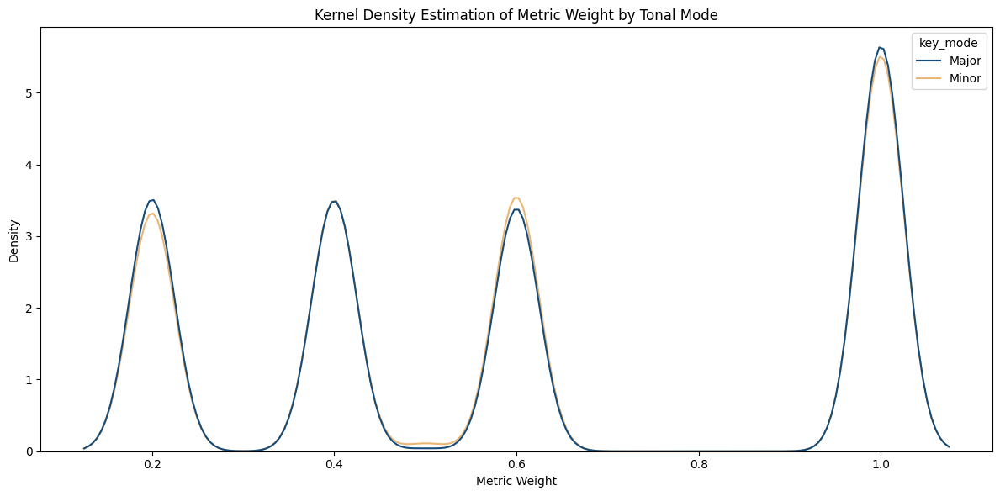

In [679]:
plt.figure(figsize=(12, 6))
sns.kdeplot(data=df, x='metric_weight', hue='key_mode', common_norm=False, palette=colors)

plt.title("Kernel Density Estimation of Metric Weight by Tonal Mode")
plt.xlabel("Metric Weight")
plt.ylabel("Density")
plt.tight_layout()
plt.show()

##### 2.3.15.6 Kernel Density Estimation of Metric Weight Distributions Conditioned on Chord Tone Presence

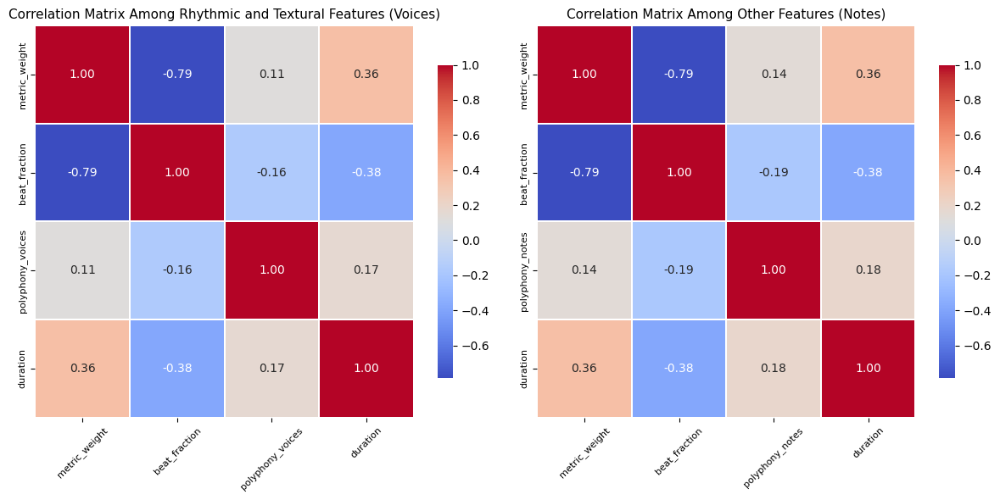

In [680]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Heatmap 1 with 'polyphony_voices'
metric_weight_corr_voices = df[['metric_weight', 'beat_fraction', 'polyphony_voices', 'duration']].corr()
sns.heatmap(metric_weight_corr_voices, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.2, cbar_kws={"shrink": 0.8}, ax=ax1)
ax1.set_title("Correlation Matrix Among Rhythmic and Textural Features (Voices)", fontsize=11)
ax1.tick_params(axis='x', rotation=45, labelsize=8)
ax1.tick_params(axis='y', labelsize=8)

# Heatmap 2 with 'polyphony_notes'
metric_weight_corr_notes = df[['metric_weight', 'beat_fraction', 'polyphony_notes', 'duration']].corr()
sns.heatmap(metric_weight_corr_notes, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.2, cbar_kws={"shrink": 0.8}, ax=ax2)
ax2.set_title("Correlation Matrix Among Other Features (Notes)", fontsize=11)
ax2.tick_params(axis='x', rotation=45, labelsize=8)
ax2.tick_params(axis='y', labelsize=8)

plt.tight_layout()
plt.show()

##### 2.3.15.7 Metric Weight of Sound vs Silence: Rhythmic Emphasis Across Note Types

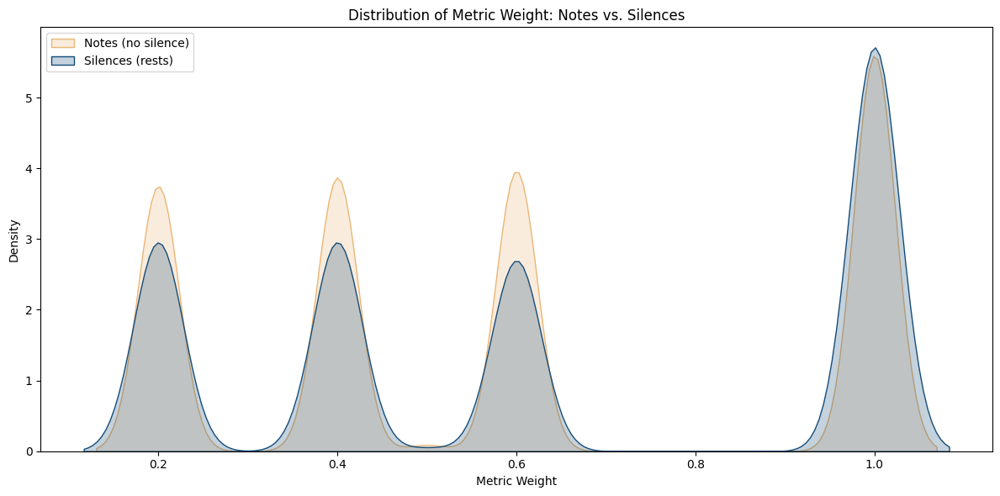

In [681]:
# Distribution of Metric Weight for Notes and Silences
plt.figure(figsize=(12, 6))
sns.kdeplot(df_notes_only['metric_weight'], label='Notes (no silence)', fill=True, color=colors[1])
sns.kdeplot(df[df['is_rest'] == 1]['metric_weight'], label='Silences (rests)', fill=True, color=colors[0])
plt.title("Distribution of Metric Weight: Notes vs. Silences")
plt.xlabel("Metric Weight")
plt.ylabel("Density")
plt.legend()
plt.tight_layout()
plt.show()


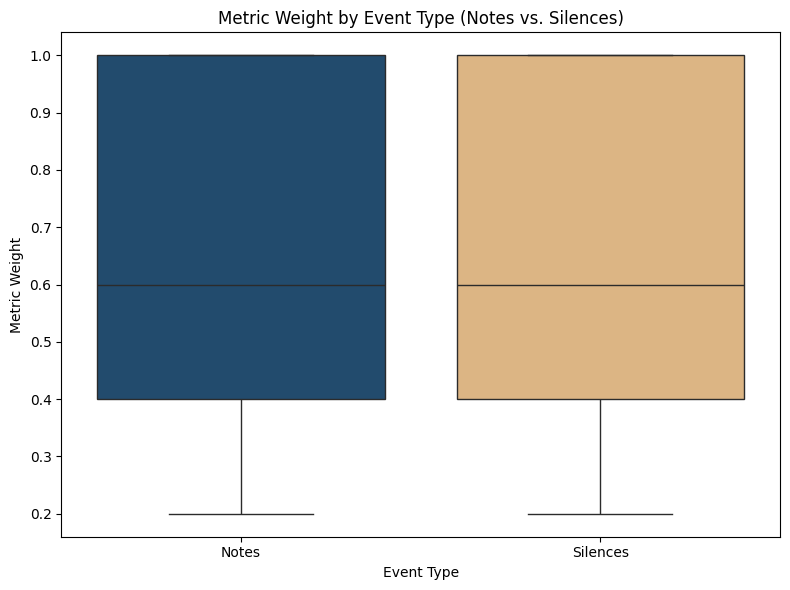

In [682]:
# Comparison of Metric Weight Between Notes and Silences (Boxplot)
plt.figure(figsize=(8, 6))
sns.boxplot(data=df, x='is_rest', y='metric_weight', palette=colors)
plt.xticks([0, 1], ['Notes', 'Silences'])
plt.title("Metric Weight by Event Type (Notes vs. Silences)")
plt.xlabel("Event Type")
plt.ylabel("Metric Weight")
plt.tight_layout()
plt.show()

##### Key Findings For The Metric Weight Feature
The metric_weight feature captures the hierarchical structure of meter with four clear peaks (0.2, 0.4, 0.6, and 1.0) that align with weak to strong beats, confirming a musically coherent distribution. The dominance of 1.0 highlights the primacy of strong beats, while significant activity at 0.4 and 0.6 reveals the use of syncopation and rhythmic nuance. Differences across tonalities, instruments, and genres show that metric_weight can discriminate between styles: blues/soul/pop pieces lean toward strong-beat simplicity, while reggae, country, and rock emphasize off-beats. Instrument patterns reinforce these roles, with organs and percussion aligning with strong beats, while flutes, harps, and jazz keyboards favor syncopation. Importantly, the feature proves independent of tonality (major/minor) and polyphony, meaning it isolates rhythmic structure rather than harmonic or textural effects. The inclusion of silences also confirms their integration into metric hierarchy, with rests placed meaningfully on beats. Overall, metric_weight emerges as a powerful, stylistically discriminant rhythmic descriptor, highly valuable for topological data analysis.

---

#### 2.3.16 Articulation Ratio

##### 2.3.16.1 Central Tendency and Spread of Articulation Ratio


In [683]:
df['articulation_ratio'].describe()

count    638769.000000
mean          1.008411
std           0.154859
min           0.333333
25%           1.000000
50%           1.000000
75%           1.000000
max           2.000000
Name: articulation_ratio, dtype: float64

In [684]:
df_notes_only['articulation_ratio'].describe()

count    429888.000000
mean          1.005917
std           0.152083
min           0.333333
25%           1.000000
50%           1.000000
75%           1.000000
max           2.000000
Name: articulation_ratio, dtype: float64

In [685]:
# Central tendency
mean_articulation_ratio = df_notes_only['articulation_ratio'].mean()
median_articulation_ratio = df_notes_only['articulation_ratio'].median()
mode_articulation_ratio = df_notes_only['articulation_ratio'].mode()[0]

# Spread
std_articulation_ratio = df_notes_only['articulation_ratio'].std()

# Display results
print(f"Mean articulation ratio: {mean_articulation_ratio:.2f}")
print(f"Median articulation ratio: {median_articulation_ratio:.2f}")
print(f"Mode articulation ratio: {mode_articulation_ratio:.2f}")
print(f"Standard articulation ratio: {std_articulation_ratio:.2f}")

Mean articulation ratio: 1.01
Median articulation ratio: 1.00
Mode articulation ratio: 1.00
Standard articulation ratio: 0.15


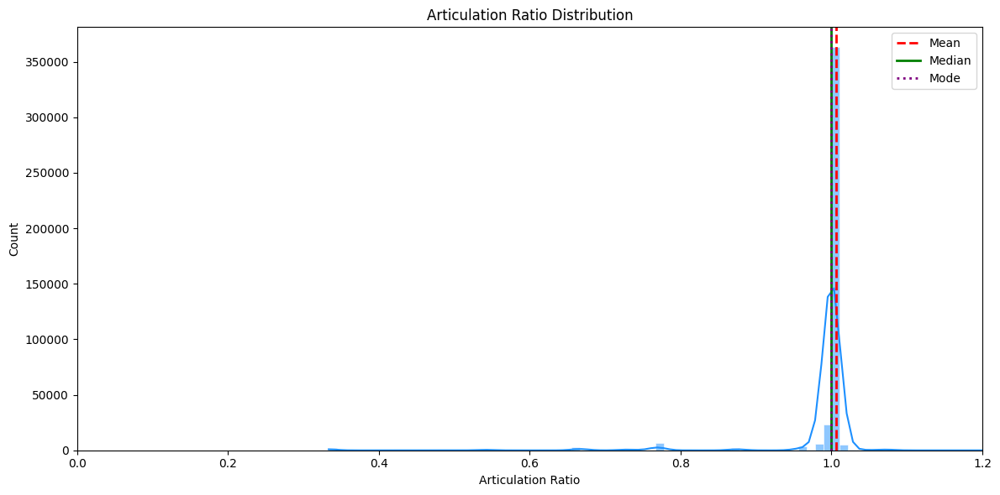

In [686]:
plt.figure(figsize=(12, 6))
sns.histplot(df_notes_only['articulation_ratio'], bins=150, kde=True, color='dodgerblue', edgecolor='white')

plt.axvline(mean_articulation_ratio, color='red', linestyle='--', linewidth=2, label='Mean')
plt.axvline(median_articulation_ratio, color='green', linestyle='-', linewidth=2, label='Median')
plt.axvline(mode_articulation_ratio, color='purple', linestyle=':', linewidth=2, label='Mode')

plt.title('Articulation Ratio Distribution')
plt.xlabel('Articulation Ratio')
plt.ylabel('Count')
plt.xlim(0, 1.2)
plt.legend()
plt.tight_layout()
plt.show()

##### 2.3.16.2 Outlier Detection in Articulation Ratio


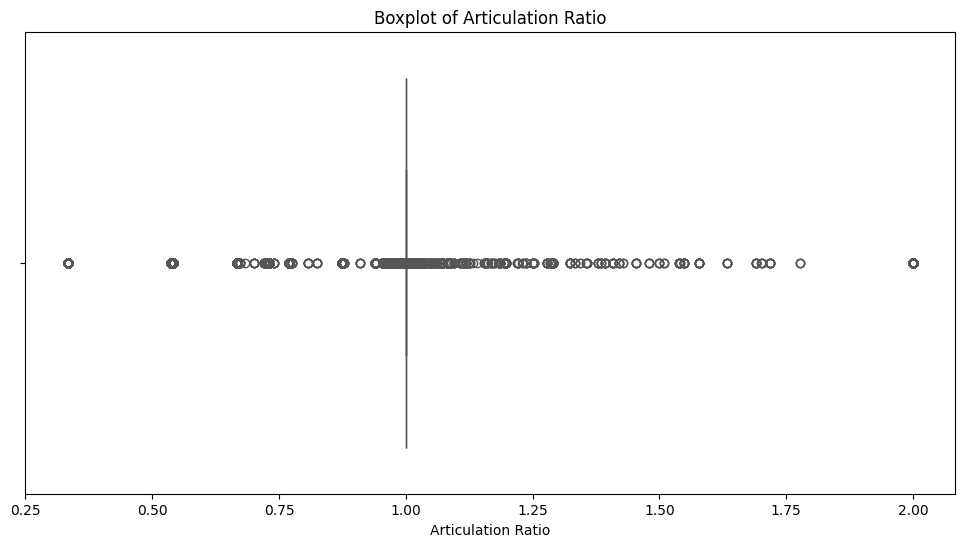

In [687]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_notes_only, x='articulation_ratio', color='dodgerblue')
plt.title('Boxplot of Articulation Ratio')
plt.xlabel('Articulation Ratio')
plt.show()

##### 2.3.16.3 Articulation Ratio in Context: Key, Instrument, and Genre

In [688]:
# Descriptive statistics of articulation ratio by key
print("Articulation Ratio statistics by Key:")
df_notes_only.groupby('key')['articulation_ratio'].describe().sort_index()

Articulation Ratio statistics by Key:


,count,mean,std,min,25%,50%,75%,max
key,,,,,,,,
0,37533.0,1.035392,1.847459e-01,1.000000,1.000000,1.000000,1.0,2.000000
1,11542.0,1.000000,1.947165e-17,1.000000,1.000000,1.000000,1.0,1.000000
2,28424.0,1.000000,5.763168e-17,1.000000,1.000000,1.000000,1.0,1.000000
3,19869.0,0.917718,1.045459e-01,0.769231,0.769231,0.961538,1.0,1.081081
4,8342.0,0.965791,5.573388e-02,0.875000,0.875000,1.000000,1.0,1.000000
5,43881.0,1.006106,3.342086e-02,0.978022,1.000000,1.000000,1.0,2.000000
6,7158.0,1.000000,2.496888e-17,1.000000,1.000000,1.000000,1.0,1.000000
7,38144.0,1.059328,2.362403e-01,1.000000,1.000000,1.000000,1.0,2.000000
8,2710.0,0.992061,1.652988e-02,0.954887,1.000000,1.000000,1.0,1.032520


In [689]:
df['articulation_pattern'] = pd.cut(df['articulation_ratio'], bins=[0, 0.95, 1.05, 2], labels=['staccato', 'normal', 'legato'])
crosstab = pd.crosstab([df['genre'], df['key']], df['articulation_pattern'], normalize='index')
pd.set_option('display.max_rows', None); pd.set_option('display.max_columns', None)
print(crosstab.round(3))

articulation_pattern  staccato  normal  legato
genre            key                          
alternative_rock 2       0.000   1.000   0.000
                 4       0.523   0.477   0.000
                 13      0.000   1.000   0.000
                 16      0.000   1.000   0.000
                 18      0.000   1.000   0.000
                 21      0.000   1.000   0.000
                 23      0.000   0.975   0.025
blues            0       0.000   1.000   0.000
                 1       0.000   1.000   0.000
                 3       0.000   1.000   0.000
                 5       0.000   1.000   0.000
                 10      0.000   1.000   0.000
                 12      0.000   1.000   0.000
classical        1       0.000   1.000   0.000
                 2       0.000   1.000   0.000
                 5       0.000   0.875   0.125
                 7       0.000   1.000   0.000
                 8       0.000   1.000   0.000
                 9       0.000   1.000   0.000
             

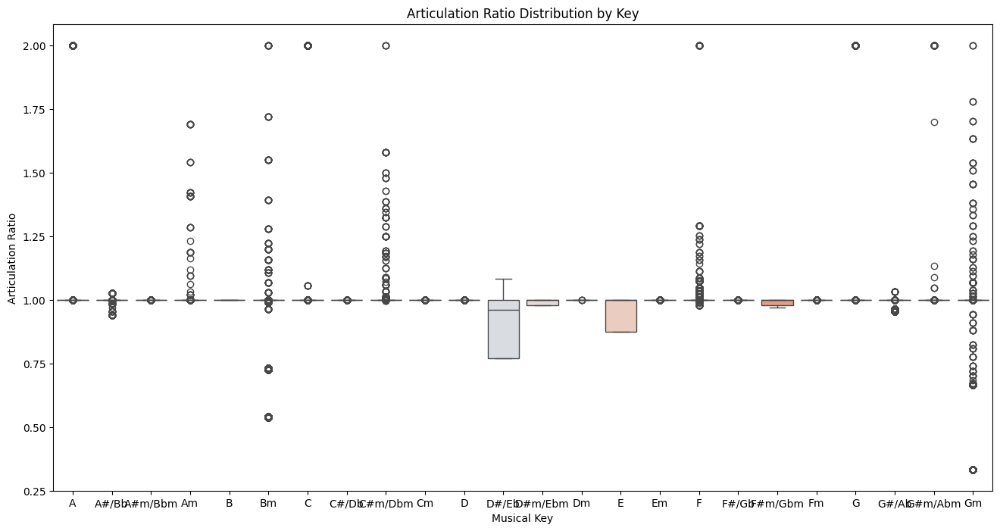

In [690]:
# Articulation ratio distribution across keys to show tonal variation
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='key_name', y='articulation_ratio', order=ordered_key_names, palette='coolwarm')
plt.title('Articulation Ratio Distribution by Key')
plt.xlabel('Musical Key')
plt.ylabel('Articulation Ratio')
plt.show()

In [691]:
# Descriptive statistics of articulation ratio values by instrument
print("Articulation Ratio statistics by Instrument:")
df_notes_only.groupby('instrument')['articulation_ratio'].describe()

Articulation Ratio statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Acoustic Guitar,31060.0,1.000000,5.170705e-17,1.000000,1.000000,1.000000,1.000000,1.000000
Alto Saxophone,505.0,1.000000,6.016249e-17,1.000000,1.000000,1.000000,1.000000,1.000000
Bagpipes,4865.0,1.000000,2.874235e-17,1.000000,1.000000,1.000000,1.000000,1.000000
Banjo,872.0,1.000000,9.121995e-17,1.000000,1.000000,1.000000,1.000000,1.000000
Baritone Saxophone,1609.0,1.000000,1.836511e-17,1.000000,1.000000,1.000000,1.000000,1.000000
Bassoon,1729.0,1.000000,9.096354e-17,1.000000,1.000000,1.000000,1.000000,1.000000
Brass,2936.0,1.000000,1.155269e-16,1.000000,1.000000,1.000000,1.000000,1.000000
Choir,3971.0,1.000000,5.191285e-17,1.000000,1.000000,1.000000,1.000000,1.000000
Clarinet,998.0,1.000000,2.768589e-17,1.000000,1.000000,1.000000,1.000000,1.000000


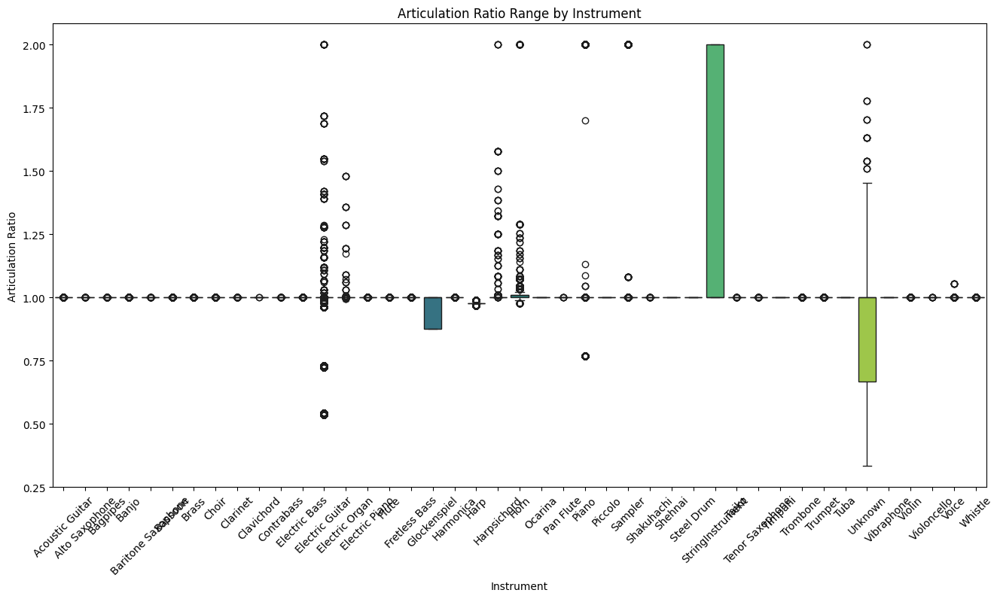

In [692]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='instrument', y='articulation_ratio', palette='viridis', order=alphabetic_order)
plt.xticks(rotation=45)
plt.title('Articulation Ratio Range by Instrument')
plt.xlabel('Instrument')
plt.ylabel('Articulation Ratio')
plt.show()

In [693]:
# Descriptive statistics of articulation ratio by instrument family
print("Articulation Ratio statistics by Instrument Family:")
df_notes_only.groupby('instrument_family')['articulation_ratio'].describe()

Articulation Ratio statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument_family,,,,,,,,
Bass,21992.0,1.000000,3.286462e-17,1.000000,1.0,1.0,1.000000,1.000000
Brass,28615.0,1.009363,4.101665e-02,0.978022,1.0,1.0,1.011364,2.000000
Electronic,44646.0,1.050717,2.193602e-01,1.000000,1.0,1.0,1.000000,2.000000
Guitar,123066.0,0.990661,5.698473e-02,0.536458,1.0,1.0,1.000000,2.000000
Keyboard,115183.0,0.999228,1.228976e-01,0.769231,1.0,1.0,1.000000,2.000000
Other,26486.0,0.905419,2.054768e-01,0.333333,1.0,1.0,1.000000,2.000000
Percussion,12714.0,0.977554,4.798006e-02,0.875000,1.0,1.0,1.000000,1.000000
Strings,20311.0,1.198881,4.030891e-01,0.968085,1.0,1.0,1.000000,2.000000
Voice,18044.0,1.000021,1.079065e-03,1.000000,1.0,1.0,1.000000,1.054795


In [694]:
crosstab_genre_instr = pd.crosstab([df['genre'], df['instrument_family']], df['articulation_pattern'], normalize='index') * 100
interesting_instr = crosstab_genre_instr[(crosstab_genre_instr['staccato'] > 5) | (crosstab_genre_instr['legato'] > 5)]
print(interesting_instr.round(1))

articulation_pattern                staccato  normal  legato
genre            instrument_family                          
alternative_rock Percussion             96.1     3.9     0.0
classical        Brass                   0.0    87.5    12.5
country          Keyboard               37.4    62.6     0.0
                 Other                  14.0    86.0     0.0
disco            Electronic              0.0    65.5    34.5
heavy_metal      Other                  58.9    39.3     1.8
jazz             Keyboard                0.0    79.0    21.0
rnb              Strings                 0.0    53.3    46.7
rock             Guitar                 14.6    85.3     0.1


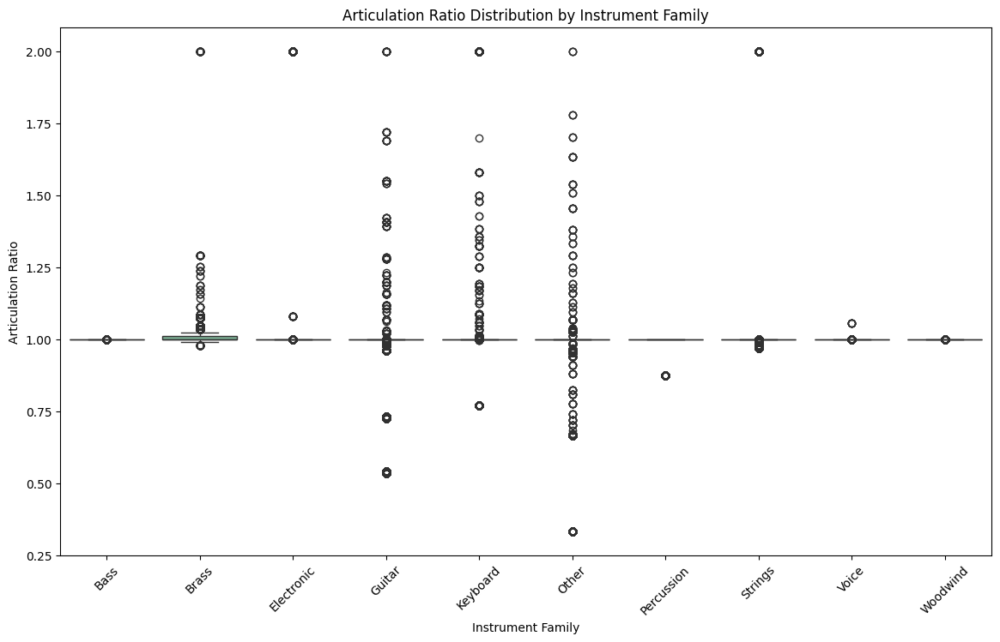

In [695]:
# Filter and plot articulation ratio distribution by instrument family
plt.figure(figsize=(14,8))
sns.boxplot(data=df_notes_only, x='instrument_family', y='articulation_ratio', palette='crest', order=families)
plt.title('Articulation Ratio Distribution by Instrument Family')
plt.xlabel('Instrument Family')
plt.ylabel('Articulation Ratio')
plt.xticks(rotation=45)
plt.show()

In [696]:
# Descriptive statistics of articulation ratio by genre
print("Articulation Ratio statistics by Genre:")
df_notes_only.groupby('genre')['articulation_ratio'].describe()

Articulation Ratio statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,21201.0,0.988168,5.116475e-02,0.875000,1.00000,1.0,1.000000,2.000000
blues,35519.0,0.996193,1.148661e-02,0.961538,1.00000,1.0,1.000000,1.000000
classical,31269.0,1.008704,4.418984e-02,0.954887,1.00000,1.0,1.011364,2.000000
country,34558.0,0.956568,9.020347e-02,0.769231,1.00000,1.0,1.000000,1.000000
dance,34253.0,1.000000,3.966953e-17,1.000000,1.00000,1.0,1.000000,1.000000
disco,34775.0,1.065075,2.466626e-01,1.000000,1.00000,1.0,1.000000,2.000000
heavy_metal,32227.0,0.920726,1.891441e-01,0.333333,0.97973,1.0,1.000000,2.000000
jazz,21851.0,1.060775,2.389231e-01,1.000000,1.00000,1.0,1.000000,2.000000
new_age,29586.0,1.000545,1.596988e-02,1.000000,1.00000,1.0,1.000000,1.690000


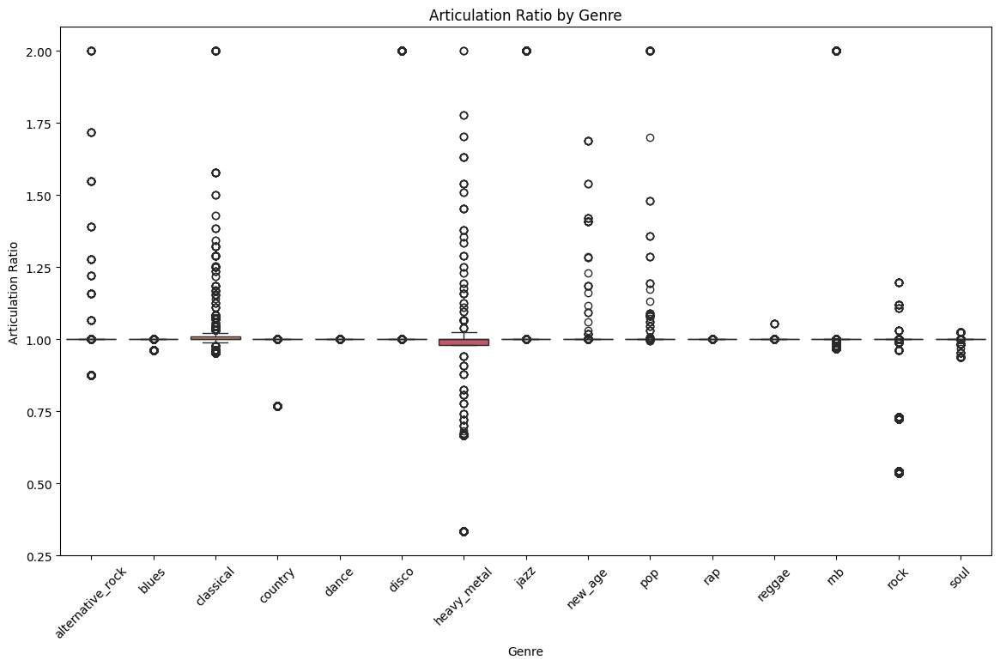

In [697]:
plt.figure(figsize=(14,8))
sns.boxplot(data=df_notes_only, x='genre', y='articulation_ratio', palette='flare', order=genres_sorted)
plt.title('Articulation Ratio by Genre')
plt.xlabel('Genre')
plt.ylabel('Articulation Ratio')
plt.xticks(rotation=45)
plt.show()

##### 2.3.16.4 Articulation Ratio vs. Metric Weight and Chord Tone

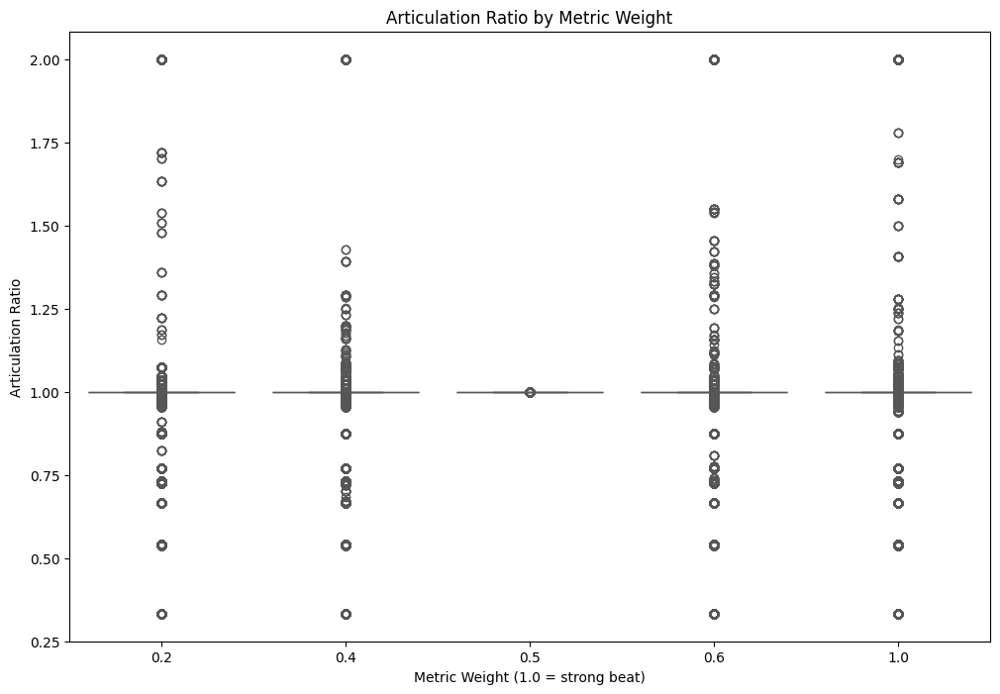

In [698]:
# Set the figure size
plt.figure(figsize=(12, 8))

# Create a boxplot showing how beat position varies with metric weight
sns.boxplot(data=df_notes_only, x="metric_weight", y="articulation_ratio", color='dodgerblue')
plt.title("Articulation Ratio by Metric Weight")
plt.xlabel("Metric Weight (1.0 = strong beat)")
plt.ylabel("Articulation Ratio")
plt.show()

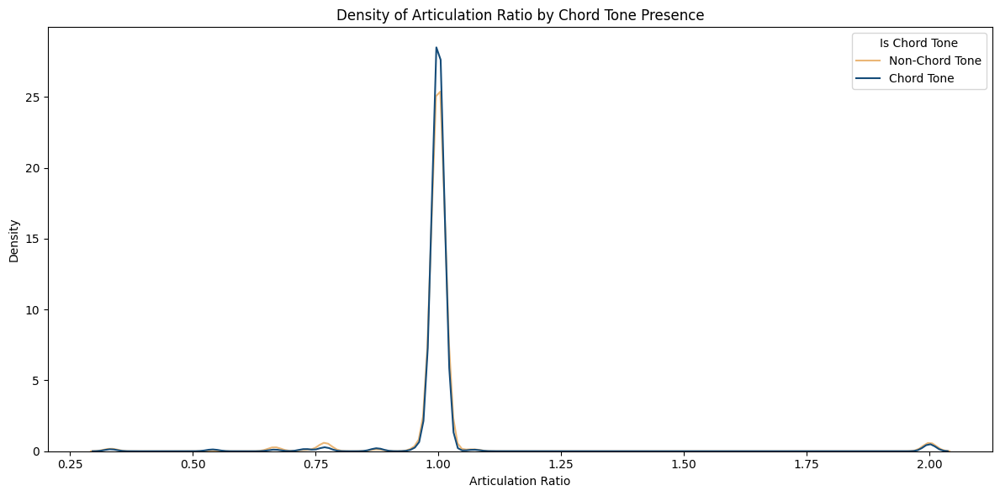

In [699]:
plt.figure(figsize=(12, 6))
sns.kdeplot(data=df_notes_only, x="articulation_ratio", hue="is_chord_tone", common_norm=False, palette=colors)
plt.title("Density of Articulation Ratio by Chord Tone Presence")
plt.xlabel("Articulation Ratio")
plt.ylabel("Density")
plt.legend(labels=custom_labels, title="Is Chord Tone")
plt.tight_layout()
plt.show()

CONSTATER QUE CHORD ET NOT CHORD SONT IDENTIQUES, ET QUESTIONNER SUR LA PERTINENCE D'ISOLER LES EXTREME OUTLIERS

##### Key Findings for the Articulation Ratio Feature
The articulation_ratio feature shows an extremely concentrated distribution, with nearly 87% of all notes landing exactly at 1.0, indicating a strong default toward “neutral” articulation in MIDI encoding. Despite this rigidity, stylistic differences clearly emerge: genres such as jazz, disco, and RnB lean toward legato playing, while rock, metal, and country emphasize staccato articulation, aligning with their rhythmic and expressive aesthetics. Instrument families reinforce these distinctions, with strings strongly legato, guitars moderately detached, and percussion/other instruments showing pronounced staccato. Interestingly, articulation appears largely independent of metric weight, meaning it does not systematically vary with beat strength as traditional performance practice might suggest. This independence, combined with genre- and instrument-specific variability, suggests articulation captures stylistic and expressive choices rather than metric conventions. Moreover, genres with high variance (e.g., heavy metal, RnB, jazz) contrast with “mechanical” styles like dance or rap, making articulation_ratio a powerful discriminant of expressivity versus rigidity in your corpus. Overall, this feature provides a rich and independent dimension for topological data analysis, complementing rhythm- and meter-based descriptors.

---

#### 2.3.17 Instrument and Instrument Family

In [700]:
# Verify frequency of each instrument per genre
for genre in df['genre'].unique():
    df_genre = df[df['genre'] == genre]
    rate = (
        df_genre['instrument']
        .value_counts(normalize=True)
        .reset_index()
        .rename(columns={'index': 'instrument', 'instrument': 'frequency'})
    )
    print(f"\nFrequency for the genre '{genre}':\n", rate)


Frequency for the genre 'pop':
              frequency  proportion
0              Sampler    0.351447
1                Piano    0.166388
2        Electric Bass    0.152379
3           Vibraphone    0.119888
4            Harmonica    0.091115
5      Acoustic Guitar    0.051134
6                Brass    0.044507
7      Tenor Saxophone    0.016865
8      Electric Guitar    0.003044
9       Electric Organ    0.001428
10  Baritone Saxophone    0.000943
11             Unknown    0.000727
12       Tubular Bells    0.000054
13    StringInstrument    0.000054
14            Trombone    0.000027

Frequency for the genre 'heavy_metal':
           frequency  proportion
0           Unknown    0.257480
1             Piano    0.216039
2  StringInstrument    0.164251
3           Sampler    0.141735
4   Electric Guitar    0.122548
5    Electric Organ    0.097923
6   Acoustic Guitar    0.000024

Frequency for the genre 'disco':
            frequency  proportion
0              Piano    0.232122
1        

##### Key Findings for the Instrument and Instrument Family Features
We observe anomalies that are quite telling and leave us skeptical about the reliability of these two variables:
- Country has almost no acoustic guitar (0.000055) when it's the genre's emblematic instrument;
- Heavy metal has "Unknown" as primary (25.7%) and relatively little electric guitar;
- Jazz is dominated by piano/trombone but lacking the expected bass or drums;
- Rap has "Whistle" as the main instrument...

These inconsistencies suggest systemic issues in MIDI encoding:
- Instruments mislabeled in source files
- Default MIDI programs (often piano = program 0)
- Confusion between MIDI channels and actual instruments
- Auto-generated MIDI files without proper metadata

We decide to exclude both instrument and instrument_family variables from our main analysis as they would introduce more noise than useful information, and focus instead on all other features which appear much more reliable. Our corpus remains very rich with 638k features across 15 genres.
We choose to keep "instrument" and "instrument_family" for secondary exploratory analysis only, while explicitly documenting their limitations.

---

#### 2.3.18 Tempo

##### 2.3.18.1 Central Tendency and Spread of Tempo Values

In [701]:
# Descriptive stats
print(df['tempo'].describe())
print("\n", df['tempo'].value_counts())

count    638769.000000
mean        115.721039
std          23.444561
min          50.000000
25%          98.000000
50%         120.000000
75%         126.000000
max         194.000000
Name: tempo, dtype: float64

 tempo
125.00    57564
120.00    45472
122.00    33956
115.00    23590
133.00    19539
136.00    19077
132.00    17802
123.00    17033
116.00    16956
110.00    16941
85.00     16254
89.00     14341
104.00    13833
100.00    13812
140.00    13314
113.00    11878
105.00    10895
146.00    10657
95.00     10242
103.00     8694
80.00      8111
96.00      8034
126.00     7373
194.00     7347
78.00      7221
88.00      7178
101.00     7115
112.00     6857
138.00     6818
94.00      6810
131.00     6673
180.00     6644
118.00     6502
91.20      6144
75.00      5921
83.00      5695
91.00      5667
144.00     5621
86.00      5589
156.00     5349
76.00      5320
160.00     5230
121.00     5123
145.00     5114
50.00      5043
95.70      4940
93.00      4903
169.00     4753
87.00      4

In [702]:
# Divide extreme tempi by 2 to get more realistic values, except for the genres Dance and Disco, renowned to be uptempo
def adjust_tempo_by_genre(row):
    if row['genre'] in ['disco', 'dance']:
        return row['tempo']  # Valeurs originales
    else:
        return row['tempo']/2 if row['tempo'] > 120 else row['tempo']

df['tempo_adjusted'] = df.apply(adjust_tempo_by_genre, axis=1)
df_notes_only['tempo_adjusted'] = df_notes_only.apply(adjust_tempo_by_genre, axis=1)

##### 2.3.18.2 Tempo Values in Context: Key, Instrument, and Genre

In [703]:
# Descriptive statistics of tempo values by key
print("Tempo statistics by Key:")
df.groupby('key')['tempo_adjusted'].describe().sort_index()

Tempo statistics by Key:


,count,mean,std,min,25%,50%,75%,max
key,,,,,,,,
0,57396.0,79.080763,18.914450,61.0,64.00,75.0,95.0,120.0
1,16127.0,80.034972,24.623077,61.0,61.00,68.0,120.0,120.0
2,41409.0,96.171581,15.294851,66.0,85.00,101.0,113.0,113.0
3,30638.0,92.243586,22.143880,50.0,83.00,100.0,100.0,120.0
4,12523.0,99.274615,19.687226,70.0,70.00,104.0,116.0,116.0
5,61610.0,101.039020,15.343701,68.0,89.00,103.0,115.0,118.0
6,9799.0,77.231605,21.641452,61.5,61.50,61.5,107.0,107.0
7,53847.0,83.417758,21.545133,62.0,66.00,70.0,104.0,120.0
8,4606.0,101.558511,23.446555,63.5,63.50,116.0,116.0,116.0


In [704]:
# Verify frequency of tempi per key and genre
for genre in df['genre'].unique():
    df_genre = df[df['genre'] == genre]
    key = (
        df_genre.groupby('key')['tempo_adjusted']
        .value_counts(normalize=True)
        .reset_index()
        .rename(columns={'index': 'key', 'key': 'key'})
    )
    print(f"\nGenre '{genre}':\n", key)


Genre 'pop':
    key  tempo_adjusted  proportion
0    0           64.00      0.7019
1    0           94.00      0.2981
2    3          120.00      1.0000
3    4          116.00      1.0000
4    6          107.00      1.0000
5   13           95.05      1.0000
6   17          105.00      1.0000
7   20           68.00      1.0000

Genre 'heavy_metal':
    key  tempo_adjusted  proportion
0    0            75.0    1.000000
1    2            85.0    1.000000
2    7           112.0    1.000000
3   15            72.5    1.000000
4   16            80.0    1.000000
5   19            80.0    0.664346
6   19            80.5    0.335654

Genre 'disco':
    key  tempo_adjusted  proportion
0    2           113.0    1.000000
1    7           120.0    1.000000
2   11           120.0    1.000000
3   12           121.0    1.000000
4   15           138.0    1.000000
5   19           120.0    0.425875
6   19           123.0    0.326118
7   19           132.0    0.248008

Genre 'blues':
    key  tempo_adju

In [705]:
# Descriptive statistics of tempo values by instrument
print("Tempo statistics by Instrument:")
df.groupby('instrument')["tempo_adjusted"].describe().sort_index()

Tempo statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Accordion,1.0,62.000000,NaN,62.0,62.00,62.00,62.00,62.00
Acoustic Guitar,46426.0,97.610800,2.439467e+01,66.5,70.00,86.00,125.00,126.00
Alto Saxophone,1028.0,73.638619,2.060784e+00,73.5,73.50,73.50,73.50,116.00
Bagpipes,6887.0,67.992377,3.166293e-01,66.5,68.00,68.00,68.00,92.00
Banjo,1849.0,99.000000,0.000000e+00,99.0,99.00,99.00,99.00,99.00
Baritone Saxophone,2998.0,61.891678,3.604402e+00,61.5,61.50,61.50,61.50,95.05
Bassoon,2606.0,115.985802,7.247939e-01,79.0,116.00,116.00,116.00,116.00
Brass,4105.0,83.873691,1.154467e+01,69.0,69.00,87.00,95.05,126.00
Choir,6964.0,71.639575,3.965615e+00,66.5,72.00,72.00,72.00,123.00


In [706]:
# Descriptive statistics of tempo values by instrument family
print("Tempo statistics by Instrument Family:")
df.groupby('instrument_family')["tempo_adjusted"].describe().sort_index()

Tempo statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument_family,,,,,,,,
Bass,31939.0,91.420661,21.121485,66.0,66.0,90.0,116.0,131.0
Brass,37900.0,94.098100,8.512856,65.0,89.0,94.0,97.0,126.0
Electronic,65979.0,99.085330,23.208937,61.5,75.0,100.0,120.0,136.0
Guitar,186869.0,89.906539,23.725631,50.0,70.0,85.0,115.0,131.0
Keyboard,168338.0,99.743911,20.125614,50.0,85.0,101.0,115.0,135.0
Other,41398.0,88.711714,26.501361,50.0,62.5,80.0,118.0,138.0
Percussion,20276.0,82.994402,17.767584,62.5,64.0,70.0,104.0,104.0
Strings,28659.0,94.818975,23.775103,61.0,65.0,112.0,120.0,136.0
Voice,28384.0,87.200078,26.677926,61.0,61.0,77.0,116.0,123.0


In [707]:
# Descriptive statistics of tempo values by genre
print("Tempo statistics by Genre:")
df.groupby('genre')["tempo_adjusted"].describe().sort_index()

Tempo statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,28830.0,92.532640,14.532894,70.0,78.0,96.0,110.0,110.0
blues,54451.0,82.393051,24.790374,50.0,61.0,68.0,115.0,115.0
classical,36582.0,86.878615,19.433301,63.5,66.0,89.0,89.0,120.0
country,54072.0,82.906819,20.811262,61.5,62.5,73.0,100.0,120.0
dance,54471.0,126.498724,4.273605,117.0,125.0,125.0,126.0,136.0
disco,51137.0,122.175294,7.644676,113.0,120.0,120.0,123.0,138.0
heavy_metal,41747.0,83.816394,12.958998,72.5,75.0,80.0,85.0,112.0
jazz,33181.0,95.458184,18.993897,69.0,73.5,97.0,115.0,120.0
new_age,41925.0,75.542576,11.388737,62.5,66.5,72.0,86.0,96.0


##### 2.3.18.3 Other Tempi Exploration

In [708]:
# Analysis of tempo changes (presence of changes)
def tempo_changes_analysis(df):
    results = []
    TEMPO_THRESHOLD = 15.0  # Minimum BPM difference to count as real change
    
    for filename, group in df.groupby('filename'):
        first_row = group.iloc[0]
        initial_tempo = first_row['tempo']
        other_tempi_array = first_row['other_tempi']
        genre = first_row['genre']
        
        # Apply tempo correction function
        def correct_tempo(tempo, genre):
            if genre not in ['disco', 'dance'] and tempo > 120:
                return tempo / 2
            return tempo
        
        # Correct initial tempo
        initial_corrected = correct_tempo(initial_tempo, genre)
        
        # Get all corrected tempos
        all_corrected_tempos = [initial_corrected]
        
        if other_tempi_array is not None and len(other_tempi_array) > 0:
            for tempo_event in other_tempi_array:
                if tempo_event is not None and len(tempo_event) >= 2:
                    raw_tempo = tempo_event[1]
                    corrected = correct_tempo(raw_tempo, genre)
                    all_corrected_tempos.append(corrected)
        
        # Count significant changes only
        changes = 0
        prev_tempo = initial_corrected
        unique_tempos = set([initial_corrected])
        
        for tempo in all_corrected_tempos[1:]:  # Skip initial
            if abs(tempo - prev_tempo) >= TEMPO_THRESHOLD:
                changes += 1
                prev_tempo = tempo
            unique_tempos.add(tempo)
        
        # Only save if there are actual changes
        if changes > 0:
            results.append({
                'filename': filename,
                'genre': genre,
                'initial_tempo': initial_corrected,
                'num_changes': changes,
                'unique_tempos': len(unique_tempos),
                'all_tempos': sorted(list(unique_tempos))
            })
    
    return results

In [709]:
def analyze_tempo_changes(results):
    if not results:
        print("No significant tempo changes found")
        return
    
    import pandas as pd
    df = pd.DataFrame(results)
    
    print(f"Tracks with tempo changes: {len(df)}")
    print(f"By genre:")
    print(df.groupby('genre').agg({
        'filename': 'count',
        'num_changes': 'mean',
        'unique_tempos': 'mean'
    }).round(1))
    
    return df

In [710]:
results = tempo_changes_analysis(df)
analysis = analyze_tempo_changes(results)

Tracks with tempo changes: 10
By genre:
                  filename  num_changes  unique_tempos
genre                                                 
alternative_rock         1          3.0            9.0
classical                2          4.5           40.0
country                  1         13.0            2.0
heavy_metal              1          9.0           81.0
new_age                  1         60.0           87.0
pop                      2          7.5           37.0
reggae                   1          1.0            4.0
rock                     1          6.0           11.0


In [711]:
for result in results:
    print(f"\n{result['genre'].upper()} - {result['filename']}")
    print(f"  Changes: {result['num_changes']}")
    print(f"  Unique tempos: {result['unique_tempos']}")
    print(f"  Tempo range: {result['all_tempos']}")


NEW_AGE - Caribbean Blue.mid
  Changes: 60
  Unique tempos: 87
  Tempo range: [np.float64(60.565), np.float64(60.635), np.float64(60.66), np.float64(60.695), np.float64(60.965), np.float64(61.185), np.float64(61.895), np.float64(61.93), np.float64(62.64), np.float64(62.93), np.float64(63.145), np.float64(63.185), np.float64(63.375), np.float64(64.29), np.float64(64.42), np.float64(64.47), np.float64(64.55), np.float64(65.05), np.float64(65.73), np.float64(65.775), np.float64(65.995), np.float64(66.7), np.float64(67.065), np.float64(67.105), np.float64(67.4), np.float64(68.32), np.float64(68.43), np.float64(68.46), np.float64(68.525), np.float64(68.7), np.float64(69.815), np.float64(69.835), np.float64(69.955), np.float64(70.045), np.float64(71.225), np.float64(71.25), np.float64(71.46), np.float64(72.525), np.float64(72.675), np.float64(72.7), np.float64(72.845), np.float64(73.555), np.float64(74.155), np.float64(74.17), np.float64(74.45), np.float64(75.66), np.float64(75.67), np.floa

In [712]:
# Based on irrelevance, we decide to drop the 'other_tempi' feature.
df = df.drop(columns=['other_tempi'])
df_notes_only = df_notes_only.drop(columns=['other_tempi'])
print("The column 'other_tempi' has been removed from the dataset due to low informative value.")

The column 'other_tempi' has been removed from the dataset due to low informative value.


##### Key Findings For The Tempo Feature
The tempo distribution is heavily concentrated around common values, with 120–125 BPM dominating, reflecting standard dance/pop conventions. While the raw distribution was right-skewed (mean 115.7, median 120), many values were quantization artifacts, especially round numbers like 100, 120, or 125 BPM. To correct encoding issues, tempos above 120 BPM were halved for most genres, except for dance/disco where high tempi are stylistically authentic. This hybrid correction produced a musically coherent distribution, with dance/disco clustering at 120–138 BPM and other genres showing slower, realistic ranges (e.g., blues/soul around 80–90 BPM, new age around 75 BPM). The adjusted distribution preserves stylistic separation while ensuring genre-specific realism. Importantly, micro-variations of tempo (tiny incremental changes in MIDI files) were excluded, as they represent encoding artifacts rather than true compositional intent. Overall, the adjusted tempo variable now captures meaningful rhythmic characteristics across genres and provides strong discriminatory power for topological analysis.

---

#### 2.3.19 Track

##### 2.3.19.1  Number and Distribution of Track Labels

In [713]:
# Count total number of unique track labels
unique_tracks = df['track'].nunique()
print("Number of unique tracks across all files:", unique_tracks)

Number of unique tracks across all files: 88


In [714]:
# Display the 20 most frequent track names
track_counts = df['track'].value_counts(dropna=True).head(20)
print("Top 20 most frequent track labels:")
print("\n", track_counts)

Top 20 most frequent track labels:

 track
DRUMS               65739
Drums               40781
Percussion          23716
Electric Guitar     21620
808 Set             20049
StringInstrument    17226
A.PIANO 1           15661
Vocals              14665
Symphony 6 - 5      14341
Electric Organ      14316
NL.net              13519
ztom mid 2 45       10657
Percussive Mute     10324
Violin I            10126
rhyguit             10048
+FUNK GTR            9994
drums                9345
tk11                 8087
QuickTime Music      7653
CRASH 2              7512
Name: count, dtype: int64


In [715]:
# Compute the dominant instrument family (by proportion) for each track label
def compute_top_family(track_df):
    return track_df['instrument_family'].value_counts(normalize=True).head(1)

track_family_top = df.dropna(subset=['track']).groupby('track').apply(compute_top_family)
track_family_top = track_family_top.reset_index()
track_family_top.columns = ['track', 'rank', 'top_family_proportion']

print("Sample of top instrument families per track (10 examples):")
print("\n", track_family_top.head(10))

Sample of top instrument families per track (10 examples):

                      track        rank  top_family_proportion
0                +FUNK GTR      Guitar               0.997298
1                       10       Other               0.313808
2                       16  Electronic               0.996953
3                  808 Set      Guitar               0.960746
4                A.PIANO 1    Keyboard               1.000000
5          Acoustic Guitar    Keyboard               0.998736
6                 BASSSOON    Woodwind               0.998097
7                 BEMYLOVE  Electronic               0.997323
8            Back Vocals 4       Brass               1.000000
9  Background Vocals Guide      Guitar               1.000000


##### 2.3.19.2 Feature Engineering Decision: Removal of the ‘track’ Variable Due to Label Noise and Low Informative Value

In [716]:
# Based on high inconsistency, duplicate meaning with 'instrument' or 'instrument_family', and unclear semantics across files, we decide to drop the 'track' feature.
df = df.drop(columns=['track'])
df_notes_only = df_notes_only.drop(columns=['track'])
print("The column 'track' has been removed from the dataset due to semantic inconsistency and low informative value.")

The column 'track' has been removed from the dataset due to semantic inconsistency and low informative value.


---

#### 2.3.20. Velocity

##### 2.3.20.1 Central Tendency and Spread of Velocity


In [717]:
# Descriptive stats: proportion and spread of velocity 
df['velocity'].describe()

count    638769.000000
mean         61.267284
std          47.032350
min          -1.000000
25%          -1.000000
50%          79.000000
75%         100.000000
max         127.000000
Name: velocity, dtype: float64

In [718]:
# Descriptive stats: proportion and spread of velocity for notes only
df_notes_only['velocity'].describe()

count    429888.000000
mean         91.522729
std          22.080413
min           1.000000
25%          78.000000
50%          95.000000
75%         107.000000
max         127.000000
Name: velocity, dtype: float64

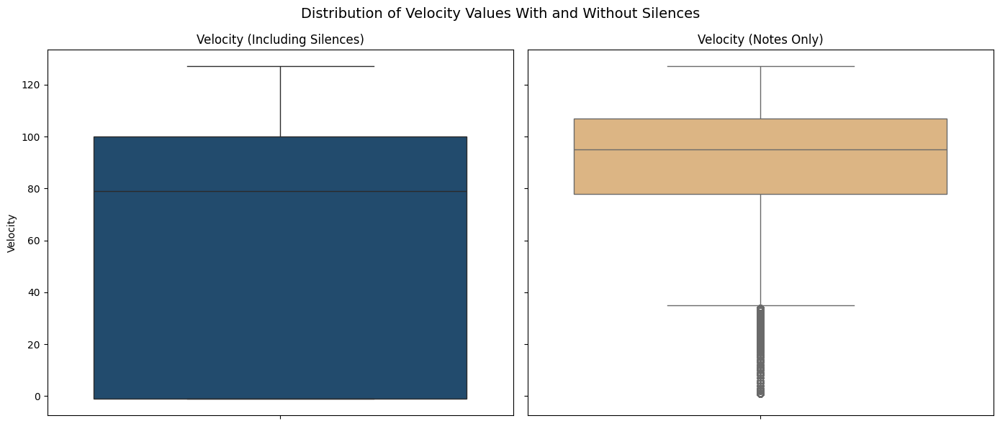

In [719]:
# Distribution of velocity values with and without silences
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

sns.boxplot(data=df, y='velocity', ax=axes[0], color=colors[0])
axes[0].set_title("Velocity (Including Silences)")
axes[0].set_ylabel("Velocity")

sns.boxplot(data=df[df['velocity'] > 0], y='velocity', ax=axes[1], color=colors[1])
axes[1].set_title("Velocity (Notes Only)")
axes[1].set_ylabel("")

plt.suptitle("Distribution of Velocity Values With and Without Silences", fontsize=14)
plt.tight_layout()
plt.show()

In [720]:
# Central tendency
mean_velocity = df_notes_only['velocity'].mean()
median_velocity = df_notes_only['velocity'].median()
mode_velocity = df_notes_only['velocity'].mode()[0]  

# Spread
std_velocity = df_notes_only['velocity'].std()

# Display results
print(f"Mean velocity: {mean_velocity:.2f}")
print(f"Median velocity: {median_velocity:.2f}")
print(f"Mode velocity: {mode_velocity:.2f}")
print(f"Standard velocity: {std_velocity:.2f}")

Mean velocity: 91.52
Median velocity: 95.00
Mode velocity: 100.00
Standard velocity: 22.08


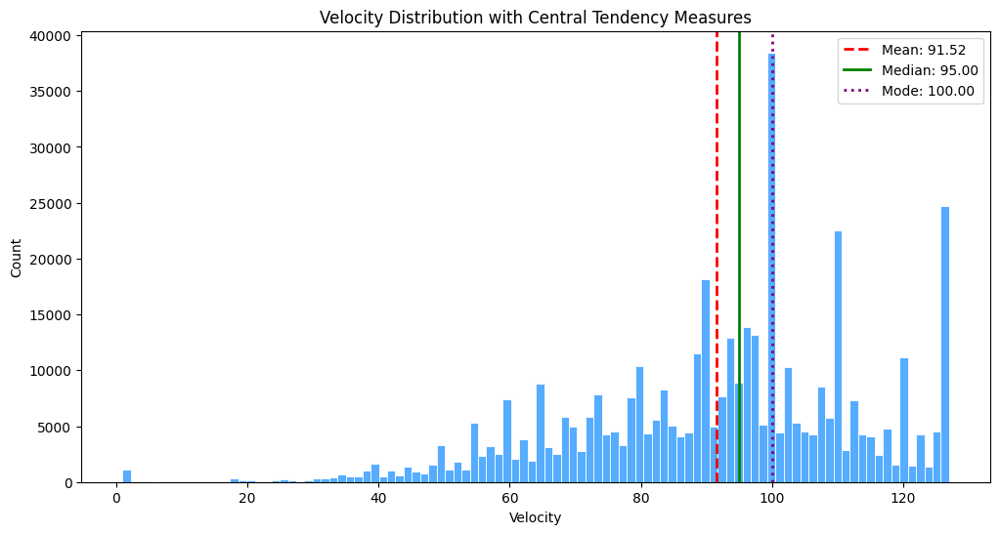

In [721]:
plt.figure(figsize=(12, 6))
sns.histplot(df_notes_only['velocity'], bins=100, color='dodgerblue', edgecolor='white')

# Add lines for mean, median, and mode
plt.axvline(mean_velocity, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_velocity:.2f}')
plt.axvline(median_velocity, color='green', linestyle='-', linewidth=2, label=f'Median: {median_velocity:.2f}')
plt.axvline(mode_velocity, color='purple', linestyle=':', linewidth=2, label=f'Mode: {mode_velocity:.2f}')

plt.title('Velocity Distribution with Central Tendency Measures')
plt.xlabel('Velocity')
plt.ylabel('Count')
plt.legend()
plt.show()

##### 2.3.20.2 Temporal Distribution of Velocity (by Measure)

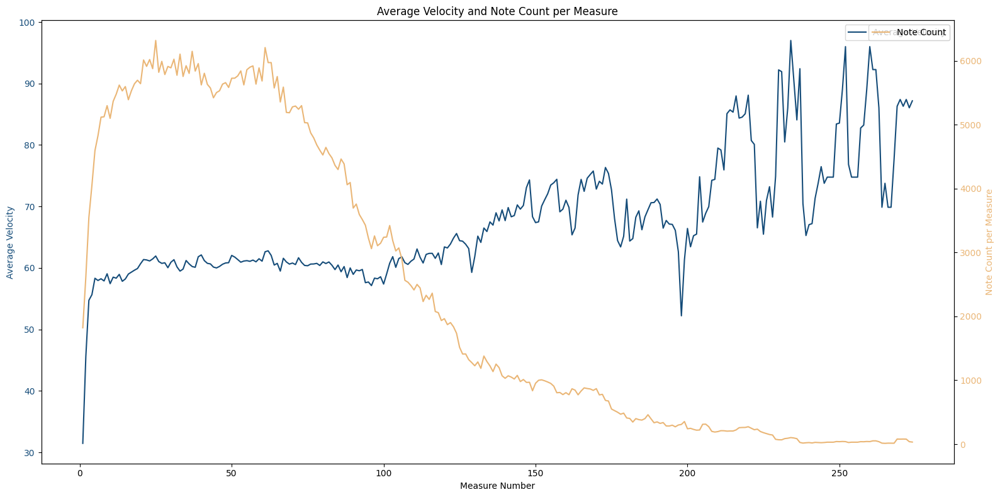

In [722]:
# Group by measure number to compute average velocity and note count
measure_stats = df.groupby('measure').agg(
    average_velocity=('velocity', 'mean'),
    note_count=('velocity', 'count')
).reset_index()

fig, ax1 = plt.subplots(figsize=(16, 8))

sns.lineplot(data=measure_stats, x='measure', y='average_velocity', ax=ax1, color=colors[0], label='Average Velocity')
ax1.set_ylabel('Average Velocity', color=colors[0])
ax1.tick_params(axis='y', labelcolor=colors[0])

ax2 = ax1.twinx()
sns.lineplot(data=measure_stats, x='measure', y='note_count', ax=ax2, color=colors[1], label='Note Count')
ax2.set_ylabel('Note Count per Measure', color=colors[1])
ax2.tick_params(axis='y', labelcolor=colors[1])

plt.title('Average Velocity and Note Count per Measure')
ax1.set_xlabel('Measure Number')
plt.tight_layout()
plt.show()

In [723]:
# Dynamic profils dynamiques by genre and section
df['section'] = pd.cut(df['measure'], bins=[0,50,100,150,200,300], labels=['intro','verse','chorus','bridge','outro'])
df_notes_only['section'] = pd.cut(df_notes_only['measure'], bins=[0,50,100,150,200,300], labels=['intro','verse','chorus','bridge','outro'])

section_stats = df_notes_only.groupby(['genre', 'section'])['velocity'].agg(['mean', 'std']).round(2)
print(section_stats.unstack(level=1)['mean'])  

section            intro   verse  chorus  bridge   outro
genre                                                   
alternative_rock  100.19  100.55   96.46     NaN     NaN
blues              85.93   86.12   87.89   83.74   89.84
classical          75.85   72.28   78.49   78.40   90.18
country            90.71   90.87   89.61     NaN     NaN
dance              89.33   87.77   96.90   97.69   96.48
disco              91.33   92.36   89.67  111.07     NaN
heavy_metal       107.14  107.37  109.29  110.61  110.00
jazz               81.41   79.57   77.10   71.39     NaN
new_age            77.50   76.88   83.05   92.10     NaN
pop                95.57   92.73   75.18   90.65   78.50
rap                96.63   95.01   98.49     NaN     NaN
reggae             88.04   88.06   94.61  117.88  120.45
rnb                96.59   95.89  108.14     NaN     NaN
rock               99.43   97.88   92.94  101.55     NaN
soul               97.63   96.63   93.99     NaN     NaN


##### 2.3.20.3 Outlier Detection in Velocity Values

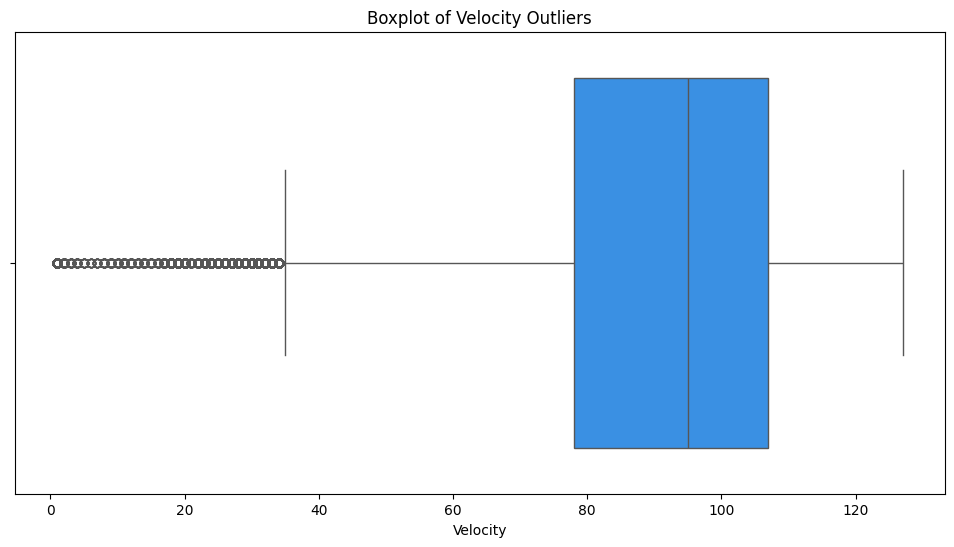

In [724]:
plt.figure(figsize=(12, 6))
sns.boxplot(x=df_notes_only['velocity'], color='dodgerblue')
plt.title('Boxplot of Velocity Outliers')
plt.xlabel('Velocity')
plt.show()

##### 2.3.20.4 Velocity in Context: Key, Instrument, and Genre

In [725]:
# Descriptive statistics of velocity values by key
print("Velocity statistics by Key:")
df_notes_only.groupby('key')['velocity'].describe().sort_index()

Velocity statistics by Key:


,count,mean,std,min,25%,50%,75%,max
key,,,,,,,,
0,37533.0,85.661898,22.205110,1.0,66.0,91.0,101.0,127.0
1,11542.0,85.961965,24.220001,2.0,70.0,91.0,98.0,127.0
2,28424.0,98.415670,20.426970,26.0,85.0,100.0,115.0,127.0
3,19869.0,89.360008,20.108554,4.0,75.0,92.0,100.0,127.0
4,8342.0,87.177056,20.435111,17.0,78.0,94.0,97.0,127.0
5,43881.0,83.239238,19.716557,1.0,70.0,86.0,98.0,127.0
6,7158.0,94.576418,19.139398,1.0,90.0,97.0,100.0,127.0
7,38144.0,92.560481,18.646389,11.0,81.0,96.0,102.0,127.0
8,2710.0,73.694096,24.697964,18.0,52.0,72.0,89.0,127.0


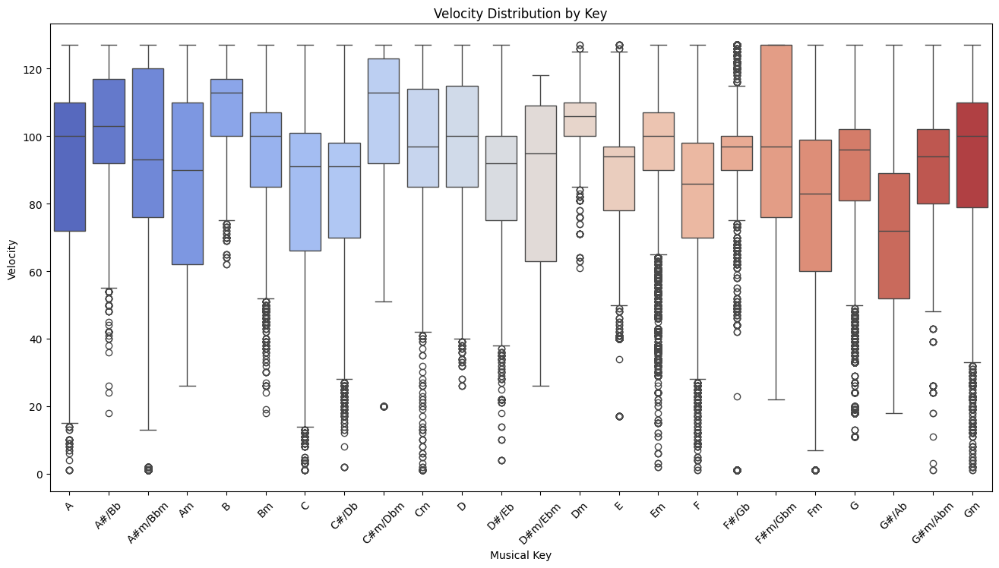

In [726]:
# Velocity distribution across keys to show tonal variation
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='key_name', y='velocity', order=ordered_key_names, palette='coolwarm')
plt.title('Velocity Distribution by Key')
plt.xlabel('Musical Key')
plt.ylabel('Velocity')
plt.xticks(rotation=45)
plt.show()


In [727]:
# Descriptive statistics of velocity values by instrument
print("Velocity statistics by Instrument:")
df_notes_only.groupby('instrument')['velocity'].describe()

Velocity statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Acoustic Guitar,31060.0,94.121056,16.740625,2.0,90.0,95.0,100.0,127.0
Alto Saxophone,505.0,77.053465,14.654321,42.0,60.0,80.0,85.0,100.0
Bagpipes,4865.0,95.078314,15.166437,45.0,91.0,96.0,102.0,127.0
Banjo,872.0,81.021789,16.482346,2.0,82.0,87.0,91.0,99.0
Baritone Saxophone,1609.0,107.114978,9.086296,90.0,105.0,107.0,114.0,124.0
Bassoon,1729.0,78.921920,10.170720,38.0,74.0,80.0,86.0,102.0
Brass,2936.0,103.142030,18.072085,20.0,87.0,108.0,120.0,127.0
Choir,3971.0,83.337950,18.621569,26.0,71.0,86.0,96.0,127.0
Clarinet,998.0,75.295591,30.561837,17.0,40.0,96.0,96.0,115.0


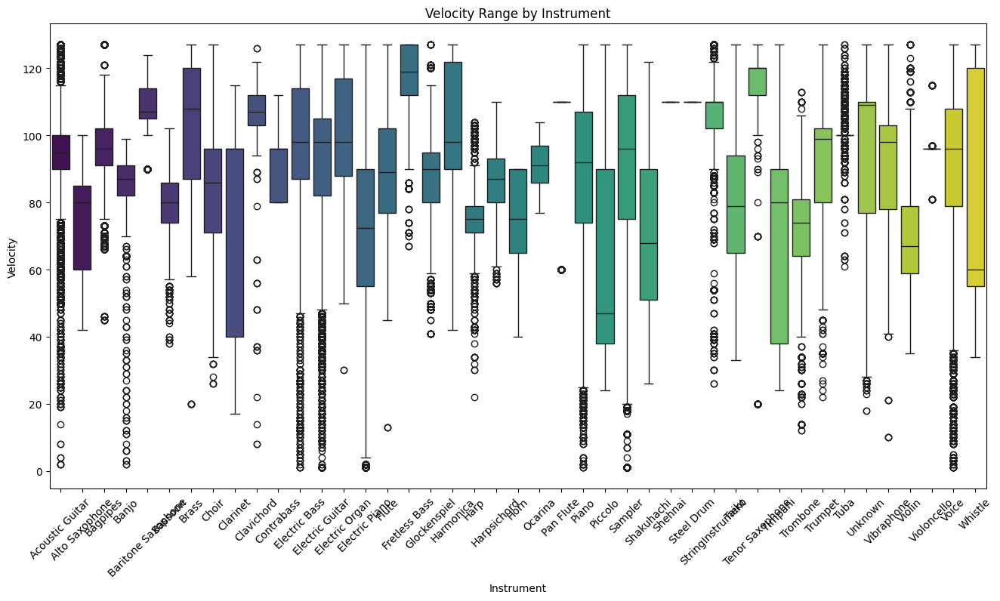

In [728]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='instrument', y='velocity', palette='viridis', order=alphabetic_order)
plt.xticks(rotation=45)
plt.title('Velocity Range by Instrument')
plt.xlabel('Instrument')
plt.ylabel('Velocity')
plt.show()

In [729]:
# Descriptive statistics of velocity by instrument family
print("Velocity statistics by Instrument Family:")
df_notes_only.groupby('instrument_family')['velocity'].describe()

Velocity statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument_family,,,,,,,,
Bass,21992.0,99.322708,18.137650,1.0,88.0,96.0,114.0,127.0
Brass,28615.0,81.616565,18.093477,12.0,70.0,83.0,100.0,127.0
Electronic,44646.0,90.405299,27.616177,1.0,75.0,94.0,110.0,127.0
Guitar,123066.0,93.061585,18.482314,1.0,84.0,97.0,104.0,127.0
Keyboard,115183.0,91.082469,23.099837,1.0,75.0,91.0,106.0,127.0
Other,26486.0,97.238390,22.774531,8.0,83.0,107.0,110.0,127.0
Percussion,12714.0,84.485213,19.212842,10.0,74.0,90.0,98.0,127.0
Strings,20311.0,97.380188,19.466769,22.0,85.0,107.0,110.0,127.0
Voice,18044.0,90.237032,24.630846,1.0,79.0,96.0,108.0,127.0


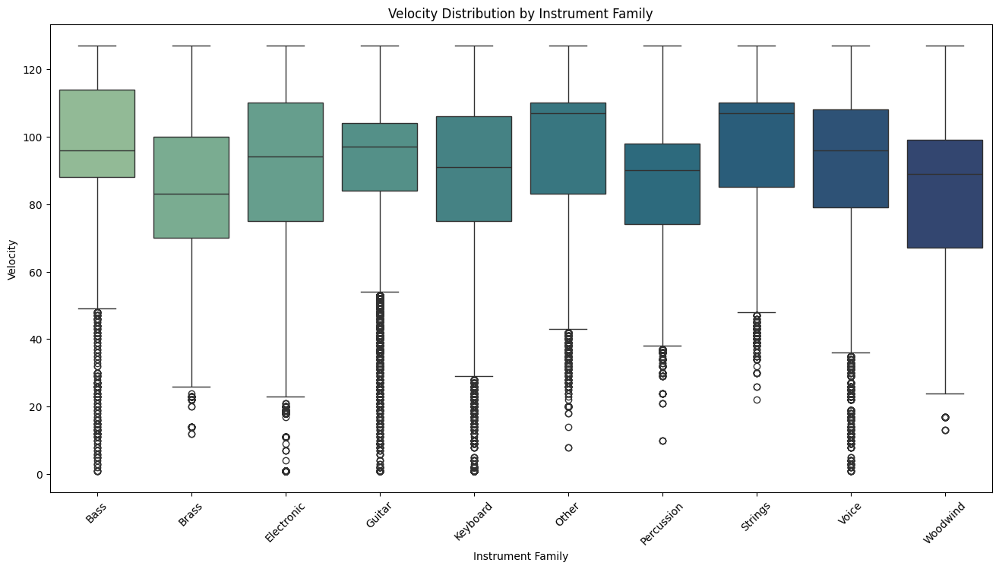

In [730]:
# Filter and plot velocity distribution by instrument family
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='instrument_family', y='velocity', palette='crest', order=families)
plt.title('Velocity Distribution by Instrument Family')
plt.xlabel('Instrument Family')
plt.ylabel('Velocity')
plt.xticks(rotation=45)
plt.show()

In [731]:
# Descriptive statistics of velocity by genre
print("Velocity statistics by Genre:")
df_notes_only.groupby('genre')['velocity'].describe()

Velocity statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,21201.0,100.141361,21.715918,17.0,92.0,100.0,115.0,127.0
blues,35519.0,86.056815,21.166614,1.0,74.0,88.0,100.0,127.0
classical,31269.0,77.257987,17.603794,2.0,69.0,80.0,90.0,115.0
country,34558.0,90.613230,22.976285,1.0,73.0,94.0,104.0,127.0
dance,34253.0,91.561148,21.182452,1.0,80.0,93.0,104.0,127.0
disco,34775.0,92.164687,25.582937,1.0,73.0,93.0,114.0,127.0
heavy_metal,32227.0,108.107829,12.818952,4.0,100.0,110.0,115.0,127.0
jazz,21851.0,80.176376,17.807409,1.0,69.0,81.0,90.0,127.0
new_age,29586.0,79.776955,23.482075,10.0,60.0,82.0,100.0,127.0


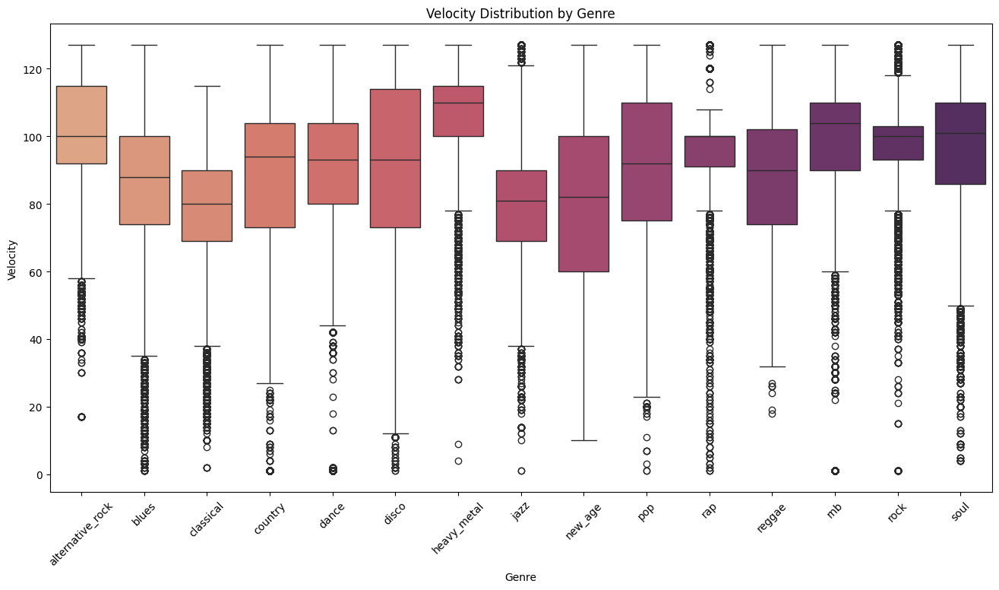

In [732]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='genre', y='velocity', palette='flare', order=genres_sorted)
plt.title('Velocity Distribution by Genre')
plt.xlabel('Genre')
plt.ylabel('Velocity')
plt.xticks(rotation=45)
plt.show()

##### 2.3.20.5 Metric Weight vs Note Velocity

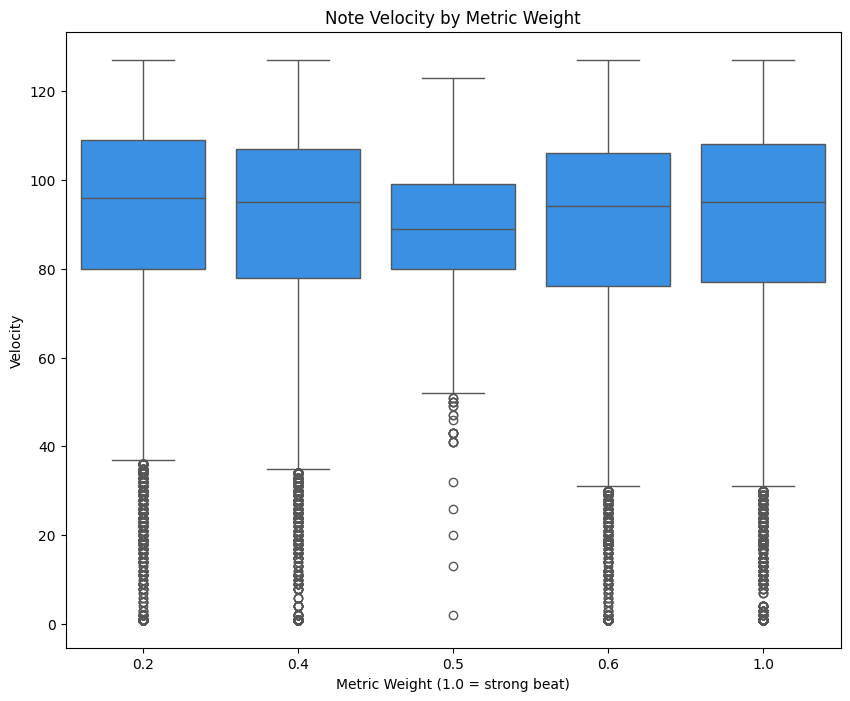

In [733]:
# Create a boxplot showing how note velocity varies with metric weight
plt.figure(figsize=(10, 8))
sns.boxplot(data=df_notes_only, x="metric_weight", y="velocity", color='dodgerblue')
plt.title("Note Velocity by Metric Weight")
plt.xlabel("Metric Weight (1.0 = strong beat)")
plt.ylabel("Velocity")
plt.show()

##### 2.3.20.6 Average Note Velocity by Polyphony and Metric Weight

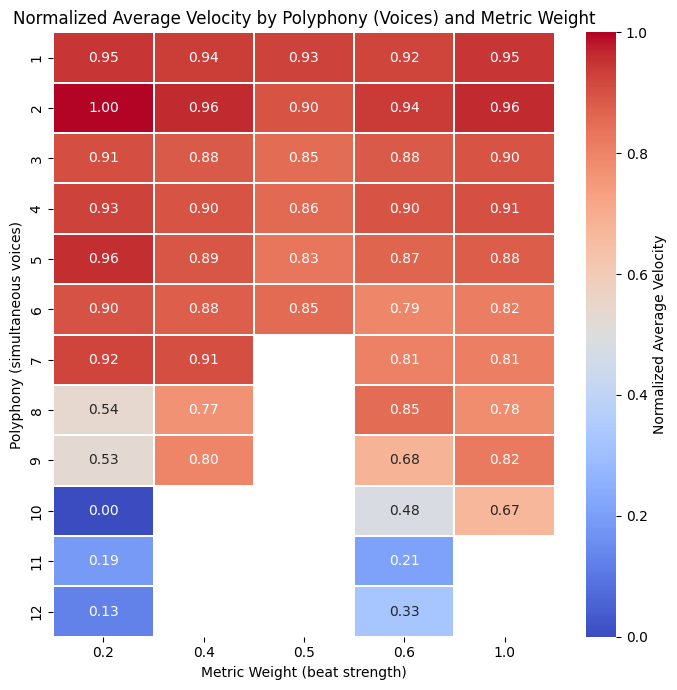

In [734]:
# Create the pivot table
pivot = df_notes_only.pivot_table(
    values="velocity",
    index="polyphony_voices",
    columns="metric_weight",
    aggfunc="mean"
)

# Apply global min-max normalization
normalized_pivot = (pivot - pivot.min().min()) / (pivot.max().max() - pivot.min().min())

# Plot the heatmap
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(normalized_pivot, cmap='coolwarm', annot=True, fmt=".2f", ax=ax, linewidths=0.2, cbar_kws={"label": "Normalized Average Velocity"})

# Add title and labels
plt.title("Normalized Average Velocity by Polyphony (Voices) and Metric Weight")
plt.xlabel("Metric Weight (beat strength)")
plt.ylabel("Polyphony (simultaneous voices)")
plt.tight_layout()
plt.show()

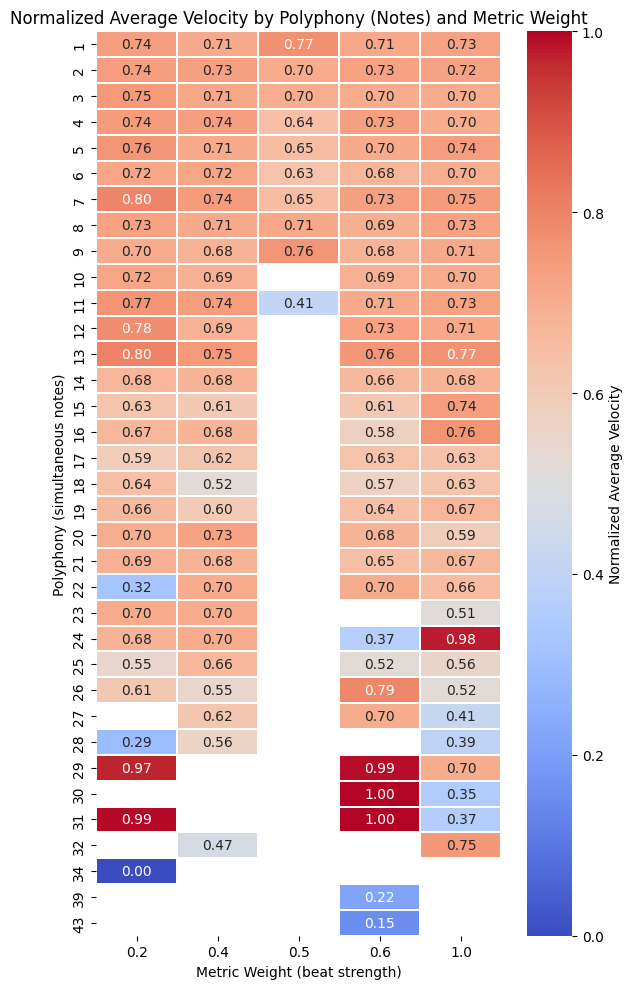

In [735]:
# Create the pivot table
pivot = df_notes_only.pivot_table(
    values="velocity",
    index="polyphony_notes",
    columns="metric_weight",
    aggfunc="mean"
)

# Apply global min-max normalization
normalized_pivot = (pivot - pivot.min().min()) / (pivot.max().max() - pivot.min().min())

# Plot the heatmap
fig, ax = plt.subplots(figsize=(6, 10))
sns.heatmap(normalized_pivot, cmap='coolwarm', annot=True, fmt=".2f", ax=ax, linewidths=0.2, cbar_kws={"label": "Normalized Average Velocity"})

# Add title and labels
plt.title("Normalized Average Velocity by Polyphony (Notes) and Metric Weight")
plt.xlabel("Metric Weight (beat strength)")
plt.ylabel("Polyphony (simultaneous notes)")
plt.tight_layout()
plt.show()

##### 2.3.20.7 Correlation Between Velocity and Other Musical Features

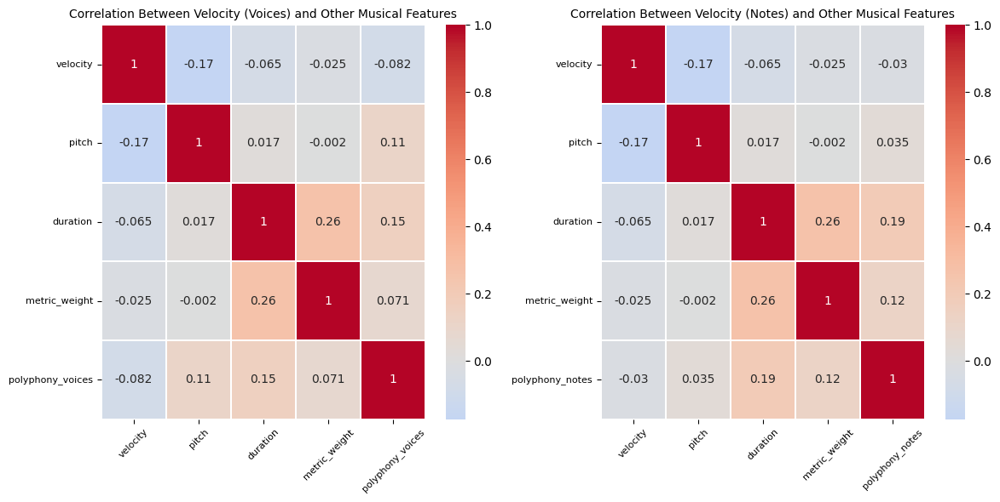

In [736]:
# Select relevant numeric features to check correlations with velocity
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Heatmap 1 with 'polyphony_voices'
velo_corr_matrix_voices = df_notes_only[['velocity', 'pitch', 'duration', 'metric_weight', 'polyphony_voices']].corr()
sns.heatmap(velo_corr_matrix_voices, annot=True, cmap='coolwarm', center=0, linewidths=0.2, ax=ax1)
ax1.set_title("Correlation Between Velocity (Voices) and Other Musical Features", fontsize=10)
ax1.tick_params(axis='x', rotation=45, labelsize=8)
ax1.tick_params(axis='y', labelsize=8)

# Heatmap 2 with 'polyphony_notes'
velo_corr_matrix_notes = df_notes_only[['velocity', 'pitch', 'duration', 'metric_weight', 'polyphony_notes']].corr()
sns.heatmap(velo_corr_matrix_notes, annot=True, cmap='coolwarm', center=0, linewidths=0.2, ax=ax2)
ax2.set_title("Correlation Between Velocity (Notes) and Other Musical Features", fontsize=10)
ax2.tick_params(axis='x', rotation=45, labelsize=8)
ax2.tick_params(axis='y', labelsize=8)

plt.tight_layout()
plt.show()


##### Key Findings For The Velocity Feature
The velocity distribution is multimodal, with clear peaks around 90, 100, 115, and 125, each corresponding to distinct expressive or stylistic dynamics (from mezzo-forte to fortissimo). This pattern creates three natural clusters of genres: “intense” (heavy metal, rock, alt. rock), “moderate” (pop, dance, disco, reggae, rap), and “expressive/soft” (classical, jazz, new age, blues). Heavy metal clearly stands out as the most intense and homogeneous, while classical and jazz occupy the opposite end with lower, more nuanced dynamics. Temporal analysis shows meaningful intensity progressions: narrative crescendos in classical/new age, immediate high energy in rock/metal, and stable, restrained profiles in jazz/blues. Velocity is only weakly correlated with other features (pitch, duration, metric weight, polyphony), confirming that it provides an independent and discriminative signal. Overall, velocity emerges as one of the most powerful features for separating genres in the TDA, capturing both stylistic clusters and expressive dynamics.

---

#### 2.3.21. Rests

##### 2.3.21.1 Central Tendency and Spread of Rests


In [737]:
# Descriptive stats: proportion and spread of rests
df['is_rest'].describe()

count    638769.000000
mean          0.327006
std           0.469120
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max           1.000000
Name: is_rest, dtype: float64

In [738]:
# Central tendency
mean_rest = df['is_rest'].mean()
median_rest = df['is_rest'].median()
mode_rest = df['is_rest'].mode()[0]  

# Spread
std_rest = df['is_rest'].std()

# Display results
print(f"Mean rest: {mean_rest:.2f}")
print(f"Median rest: {median_rest:.2f}")
print(f"Mode rest: {mode_rest:.2f}")
print(f"Standard rest: {std_rest:.2f}")

Mean rest: 0.33
Median rest: 0.00
Mode rest: 0.00
Standard rest: 0.47


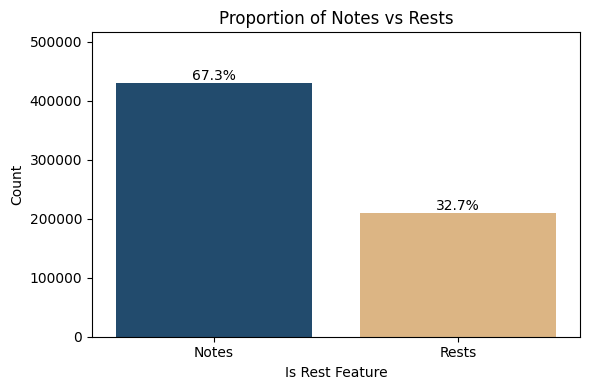

In [739]:
# Count the number of occurrences for each mode
total_rest_values = df['is_rest'].value_counts().sum()
rest_custom_labels = ["Notes", "Rests"]

# Plot distribution of rests
plt.figure(figsize=(6, 4))
ax = sns.countplot(data=df, x='is_rest', palette=colors)
ax.set_xticklabels(rest_custom_labels)
plt.title("Proportion of Notes vs Rests")
plt.xlabel("Is Rest Feature")
plt.ylabel("Count")

# Annotate bars with percentage labels
for p in ax.patches:
    count = p.get_height()
    percentage = 100 * count / total_rest_values
    ax.annotate(f'{percentage:.1f}%', 
                (p.get_x() + p.get_width() / 2, count),
                ha='center', va='bottom', fontsize=10)
plt.ylim(0, max(df['is_rest'].value_counts()) * 1.2)
plt.tight_layout()
plt.show()

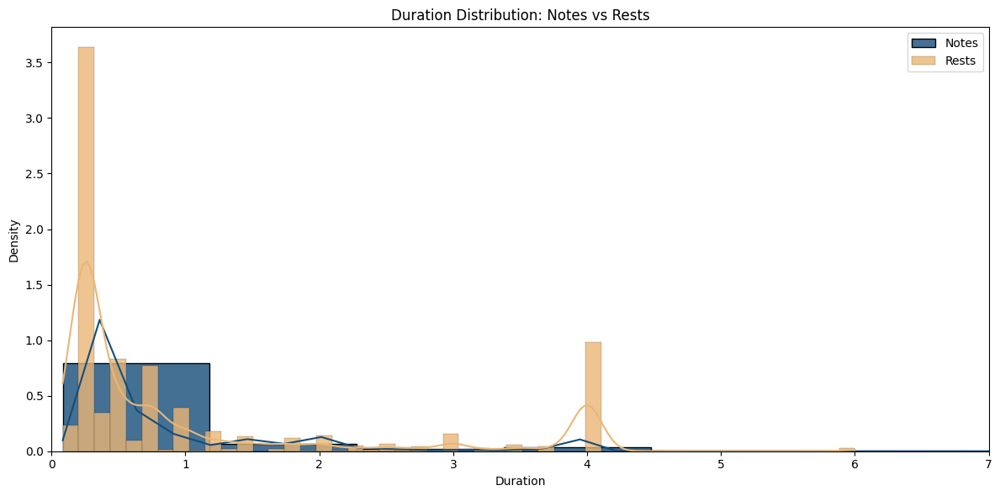

In [740]:
plt.figure(figsize=(12, 6))

# Plot duration distribution for notes (is_rest == 0)
sns.histplot(
    df.loc[df['is_rest'] == 0, 'duration'],
    color=colors[0],
    label='Notes',
    bins=50,
    kde=True,
    stat='density',
    alpha=0.8
)

# Plot duration distribution for rests (is_rest == 1)
sns.histplot(
    df.loc[df['is_rest'] == 1, 'duration'],
    color=colors[1],
    label='Rests',
    bins=50,
    kde=True,
    stat='density',
    alpha=0.8
)

plt.title('Duration Distribution: Notes vs Rests')
plt.xlabel('Duration')
plt.ylabel('Density')
plt.xlim(0, 7)  # Limit x-axis to focus on relevant duration range
plt.legend()
plt.tight_layout()
plt.show()

##### 2.3.21.2 Temporal Distribution of Velocity (by Measure)

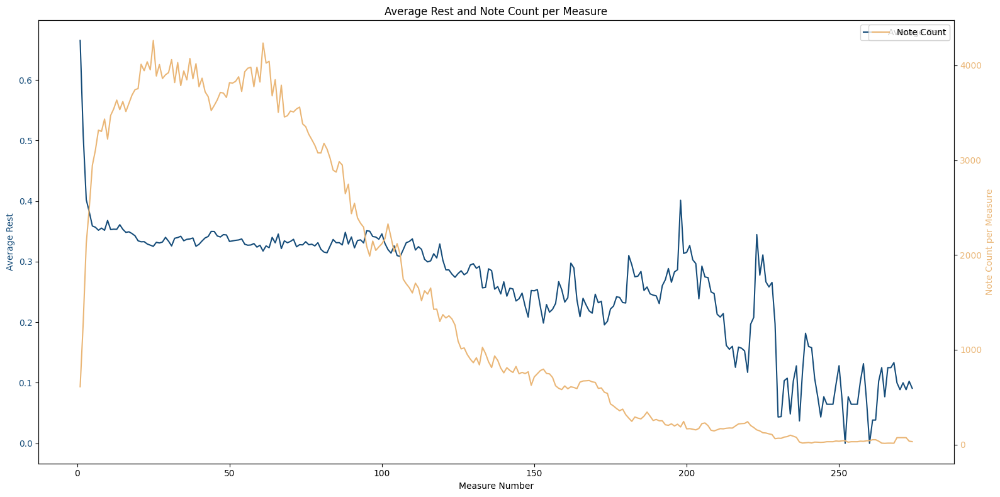

In [741]:
# Group by measure number to compute average rest and note count
measure_stats = df.groupby('measure').agg(
    average_rest=('is_rest', 'mean'),
    note_count=('is_rest', lambda x: (x == 0).sum())
).reset_index()

fig, ax1 = plt.subplots(figsize=(16, 8))

sns.lineplot(data=measure_stats, x='measure', y='average_rest', ax=ax1, color=colors[0], label='Average Rest')
ax1.set_ylabel('Average Rest', color=colors[0])
ax1.tick_params(axis='y', labelcolor=colors[0])

ax2 = ax1.twinx()
sns.lineplot(data=measure_stats, x='measure', y='note_count', ax=ax2, color=colors[1], label='Note Count')
ax2.set_ylabel('Note Count per Measure', color=colors[1])
ax2.tick_params(axis='y', labelcolor=colors[1])

plt.title('Average Rest and Note Count per Measure')
ax1.set_xlabel('Measure Number')
plt.tight_layout()
plt.show()

##### 2.3.21.3 Rest in Context: Key, Instrument, and Genre

In [742]:
# Descriptive statistics of rests by key
print("Rest statistics by Key:")
df.groupby('key')['is_rest'].describe().sort_index()

Rest statistics by Key:


,count,mean,std,min,25%,50%,75%,max
key,,,,,,,,
0,57396.0,0.346069,0.475720,0.0,0.0,0.0,1.0,1.0
1,16127.0,0.284306,0.451097,0.0,0.0,0.0,1.0,1.0
2,41409.0,0.313579,0.463953,0.0,0.0,0.0,1.0,1.0
3,30638.0,0.351492,0.477444,0.0,0.0,0.0,1.0,1.0
4,12523.0,0.333866,0.471611,0.0,0.0,0.0,1.0,1.0
5,61610.0,0.287762,0.452723,0.0,0.0,0.0,1.0,1.0
6,9799.0,0.269517,0.443732,0.0,0.0,0.0,1.0,1.0
7,53847.0,0.291623,0.454514,0.0,0.0,0.0,1.0,1.0
8,4606.0,0.411637,0.492183,0.0,0.0,0.0,1.0,1.0


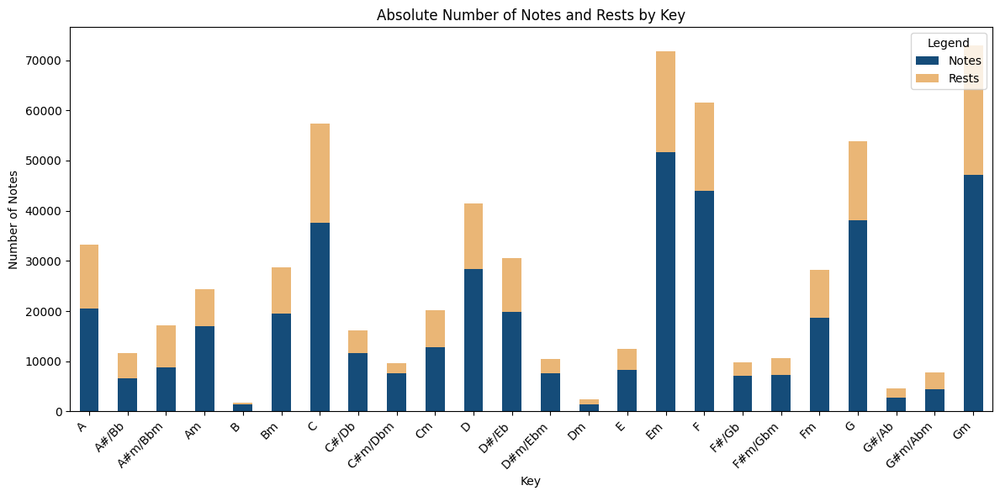

In [743]:
# Count rests and normalize per key
key_rest_counts = df.groupby(["key_name", "is_rest"]).size().unstack(fill_value=0)
    
# Rest distribution across keys to show tonal variation
key_rest_counts.plot(kind="bar", stacked=True, figsize=(12, 6), color=colors)

plt.title("Absolute Number of Notes and Rests by Key")
plt.xlabel("Key")
plt.ylabel("Number of Notes")
plt.legend(title="Legend", labels=['Notes', 'Rests'], loc="upper right")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


In [744]:
# Descriptive statistics of rests by instrument
print("Rest statistics by Instrument:")
df.groupby('instrument')['is_rest'].describe()

Rest statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Accordion,1.0,1.000000,NaN,1.0,1.0,1.0,1.0,1.0
Acoustic Guitar,46426.0,0.330978,0.470570,0.0,0.0,0.0,1.0,1.0
Alto Saxophone,1028.0,0.508755,0.500167,0.0,0.0,1.0,1.0,1.0
Bagpipes,6887.0,0.293597,0.455442,0.0,0.0,0.0,1.0,1.0
Banjo,1849.0,0.528394,0.499328,0.0,0.0,1.0,1.0,1.0
Baritone Saxophone,2998.0,0.463309,0.498735,0.0,0.0,0.0,1.0,1.0
Bassoon,2606.0,0.336531,0.472614,0.0,0.0,0.0,1.0,1.0
Brass,4105.0,0.284775,0.451362,0.0,0.0,0.0,1.0,1.0
Choir,6964.0,0.429782,0.495080,0.0,0.0,0.0,1.0,1.0


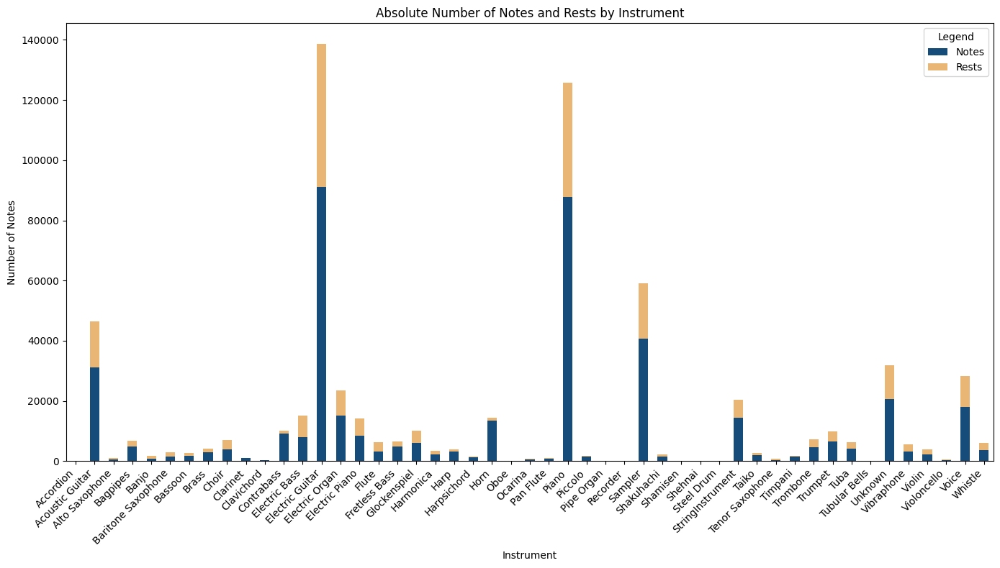

In [745]:
# Count rests and normalize per instrument
instrument_rest_counts = df.groupby(["instrument", "is_rest"]).size().unstack(fill_value=0)
    
# Rest distribution across instruments to show tonal variation
instrument_rest_counts.plot(kind="bar", stacked=True, figsize=(14, 8), color=colors)

plt.title("Absolute Number of Notes and Rests by Instrument")
plt.xlabel("Instrument")
plt.ylabel("Number of Notes")
plt.legend(title="Legend", labels=['Notes', 'Rests'], loc="upper right")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


In [746]:
# Descriptive statistics of rests by instrument family
print("Rest statistics by Instrument Family:")
df.groupby('instrument_family')['is_rest'].describe()

Rest statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument_family,,,,,,,,
Bass,31939.0,0.311437,0.463088,0.0,0.0,0.0,1.0,1.0
Brass,37900.0,0.244987,0.430085,0.0,0.0,0.0,0.0,1.0
Electronic,65979.0,0.323330,0.467751,0.0,0.0,0.0,1.0,1.0
Guitar,186869.0,0.341432,0.474191,0.0,0.0,0.0,1.0,1.0
Keyboard,168338.0,0.315764,0.464821,0.0,0.0,0.0,1.0,1.0
Other,41398.0,0.360211,0.480067,0.0,0.0,0.0,1.0,1.0
Percussion,20276.0,0.372953,0.483602,0.0,0.0,0.0,1.0,1.0
Strings,28659.0,0.291287,0.454363,0.0,0.0,0.0,1.0,1.0
Voice,28384.0,0.364290,0.481239,0.0,0.0,0.0,1.0,1.0


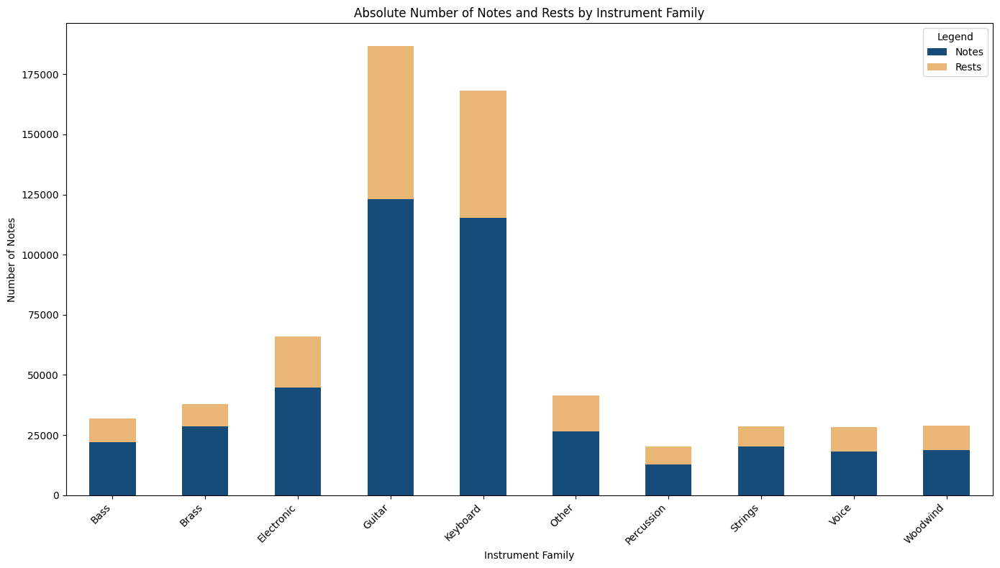

In [747]:
# Count rests and normalize per instrument family
instrument_fam_rest_counts = df.groupby(["instrument_family", "is_rest"]).size().unstack(fill_value=0)
    
# Rest distribution across instruments to show tonal variation
instrument_fam_rest_counts.plot(kind="bar", stacked=True, figsize=(14, 8), color=colors)

plt.title("Absolute Number of Notes and Rests by Instrument Family")
plt.xlabel("Instrument Family")
plt.ylabel("Number of Notes")
plt.legend(title="Legend", labels=['Notes', 'Rests'], loc="upper right")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


In [748]:
# Descriptive statistics of rests by genre
print("Rest statistics by Genre:")
df.groupby('genre')['is_rest'].describe()

Rest statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,28830.0,0.264620,0.441138,0.0,0.0,0.0,1.0,1.0
blues,54451.0,0.347689,0.476241,0.0,0.0,0.0,1.0,1.0
classical,36582.0,0.145235,0.352343,0.0,0.0,0.0,0.0,1.0
country,54072.0,0.360889,0.480263,0.0,0.0,0.0,1.0,1.0
dance,54471.0,0.371170,0.483122,0.0,0.0,0.0,1.0,1.0
disco,51137.0,0.319964,0.466467,0.0,0.0,0.0,1.0,1.0
heavy_metal,41747.0,0.228040,0.419574,0.0,0.0,0.0,0.0,1.0
jazz,33181.0,0.341460,0.474207,0.0,0.0,0.0,1.0,1.0
new_age,41925.0,0.294311,0.455738,0.0,0.0,0.0,1.0,1.0


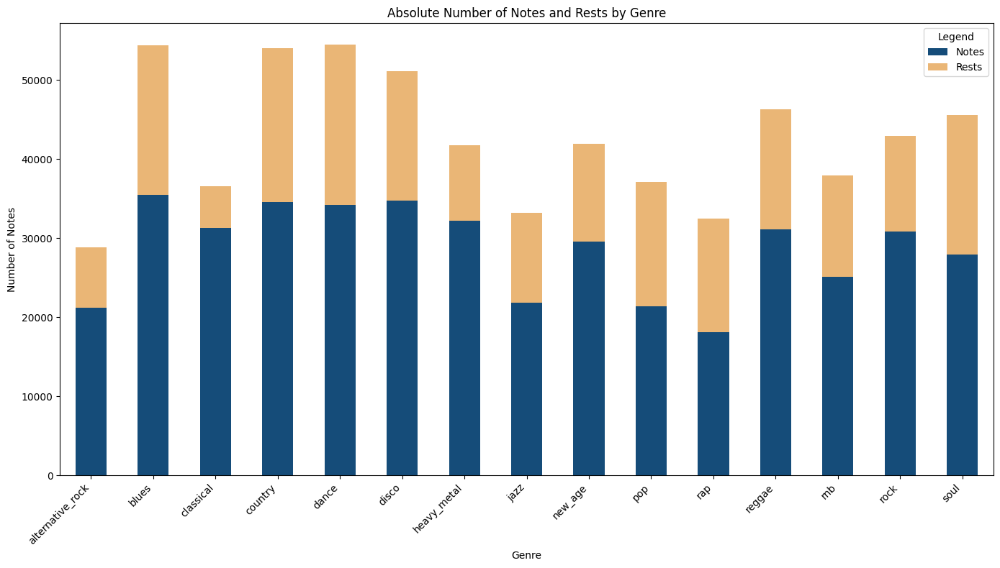

In [749]:
# Count rests and normalize per genre
genre_rest_counts = df.groupby(["genre", "is_rest"]).size().unstack(fill_value=0)
    
# Rest distribution across instruments to show tonal variation
genre_rest_counts.plot(kind="bar", stacked=True, figsize=(14, 8), color=colors)

plt.title("Absolute Number of Notes and Rests by Genre")
plt.xlabel("Genre")
plt.ylabel("Number of Notes")
plt.legend(title="Legend", labels=['Notes', 'Rests'], loc="upper right")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


##### 2.3.21.4 Correlation Between Rests and Other Musical Features

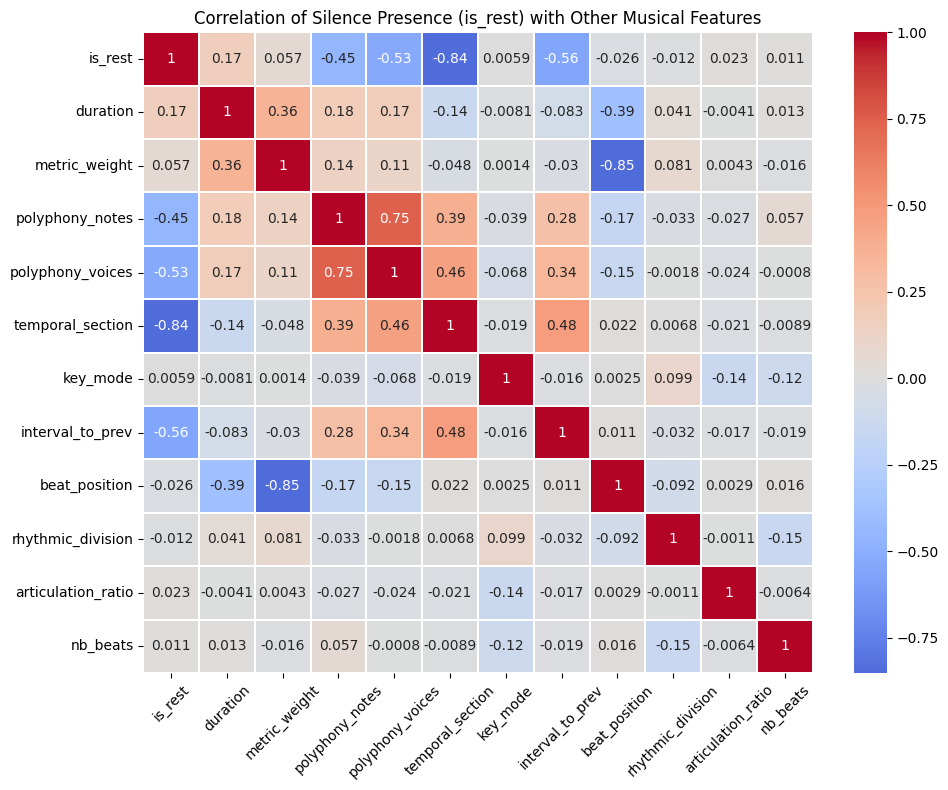

In [750]:
# Select relevant numeric features to check correlations with velocity
df_corr = df[['is_rest', 'duration', 'metric_weight', 'polyphony_notes', 'polyphony_voices',
              'temporal_section', 'key_mode', 'interval_to_prev', 
              'beat_position', 'rhythmic_division', 'articulation_ratio', 'nb_beats']].copy()

# Encode categorical variables as numeric codes
for col in ['temporal_section', 'key_mode']:
    df_corr[col] = df_corr[col].astype('category').cat.codes

rest_corr_matrix = df_corr.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(rest_corr_matrix, annot=True, cmap='coolwarm', center=0, linewidths=0.2)
plt.title("Correlation of Silence Presence (is_rest) with Other Musical Features")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


##### Key Findings For The 'is_rest' Feature
Rests account for about one-third of the corpus (32.7%), with a clearly bimodal distribution: very short pauses (~0.2 beats) and long rests (~4 beats) that mark articulations and structural boundaries. The proportion of rests varies strongly by genre, from only 15% in classical (dense polyphony) to 44% in rap (rhythmic breaks and emphasis), a threefold difference that makes this feature highly discriminative. Vocal and expressive genres (rap, pop, soul) rely more on rests for phrasing and breathing, while dense instrumental genres (classical, heavy metal) minimize them. Temporal analysis shows rests play a key role in structure, with more at the beginning and end of pieces, and stable mid-section proportions that differentiate forms. Rest usage also varies by tonality, though these differences largely reflect genre–tonality associations rather than tonal effects per se. Strong negative correlations with polyphony and temporal density confirm that rests capture the inverse of musical texture, making is_rest a fundamental feature for genre classification in the TDA.

---

#### 2.3.22 Genre

##### 2.3.22.1 Genre Frequency 

In [751]:
# Number of genres
print("Number of genres:", df['genre'].nunique(), "\n")

# Number of events for each genre
genre_event_counts = df['genre'].value_counts()
print("Number of events per", genre_event_counts, "\n")

Number of genres: 15 

Number of events per genre
dance               54471
blues               54451
country             54072
disco               51137
reggae              46331
soul                45599
rock                42943
new_age             41925
heavy_metal         41747
rnb                 37920
pop                 37118
classical           36582
jazz                33181
rap                 32462
alternative_rock    28830
Name: count, dtype: int64 



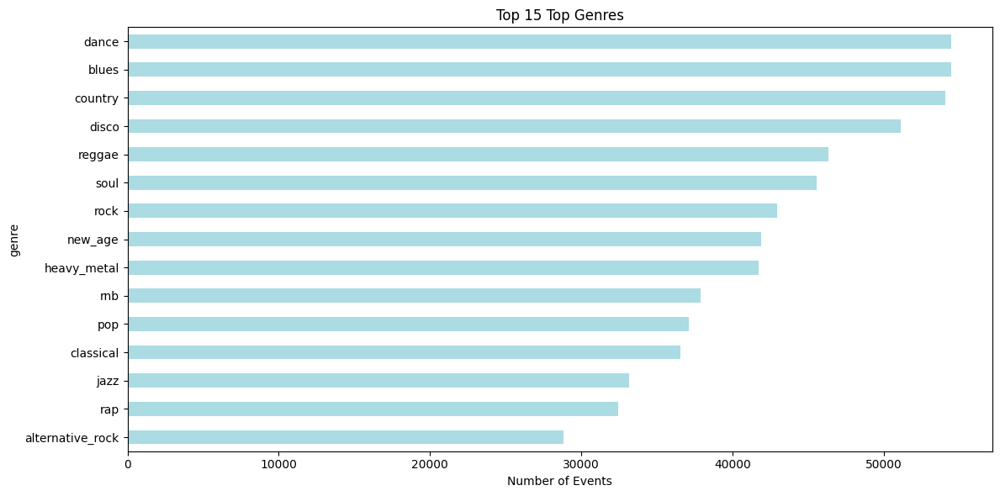

In [752]:
# Plot top 15 genres
top_n = 15
plt.figure(figsize=(12, 6))
genre_event_counts.head(top_n).plot(kind='barh', color=colors[2])
plt.title(f'Top {top_n} Top Genres')
plt.xlabel('Number of Events')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

In [753]:
# Number of notes for each genre
genre_note_counts = df_notes_only['genre'].value_counts()
print("Number of events per", genre_note_counts, "\n")

Number of events per genre
blues               35519
disco               34775
country             34558
dance               34253
heavy_metal         32227
classical           31269
reggae              31154
rock                30900
new_age             29586
soul                27937
rnb                 25170
jazz                21851
pop                 21362
alternative_rock    21201
rap                 18126
Name: count, dtype: int64 



##### 2.3.22.2 Expressive Features by Genre


VELOCITY by Genre (mean):


genre
heavy_metal         83.226843
alternative_rock    73.377315
rock                70.412570
classical           65.892160
rnb                 63.938291
disco               62.355340
reggae              60.302886
soul                58.978201
country             57.551006
dance               57.205228
Name: velocity, dtype: float64

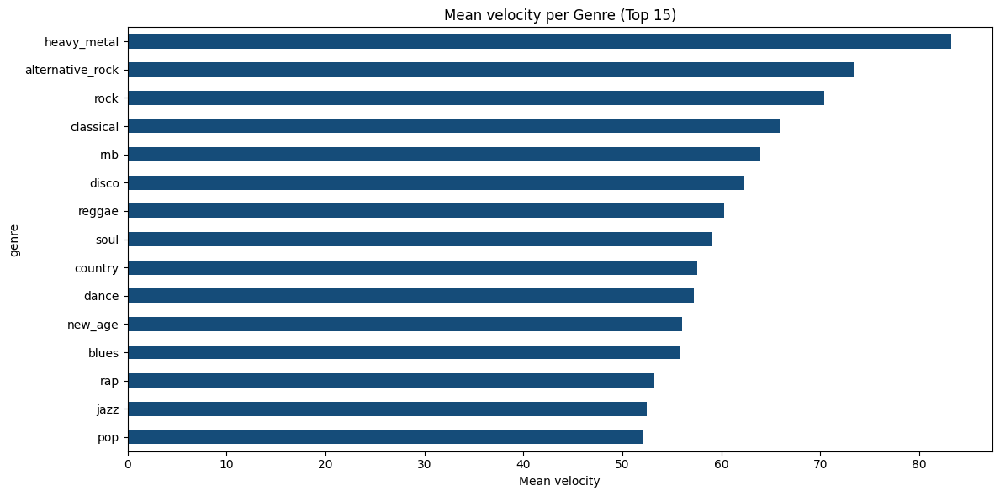


ARTICULATION_RATIO by Genre (mean):


genre
rnb          1.172981
disco        1.070399
jazz         1.062988
classical    1.007820
pop          1.003105
new_age      1.001083
reggae       1.000035
dance        1.000000
rap          1.000000
soul         0.999857
Name: articulation_ratio, dtype: float64

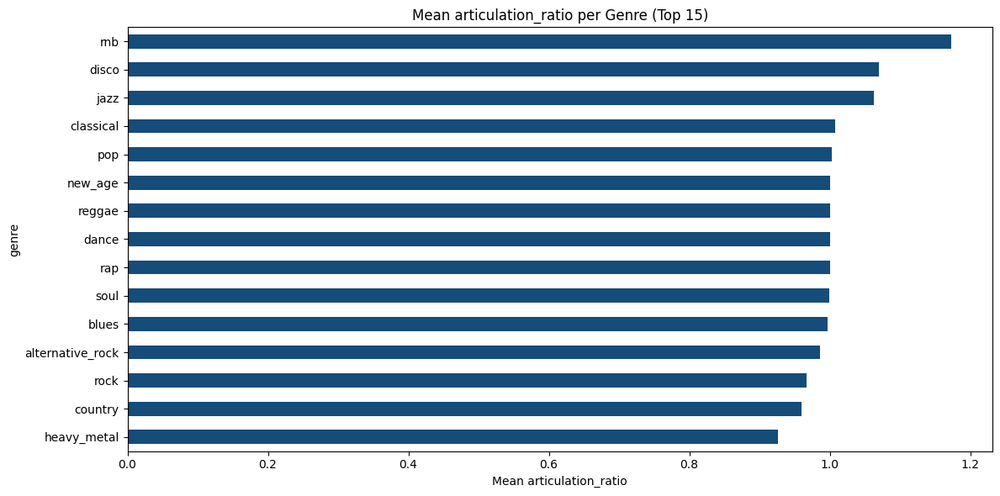


METRIC_WEIGHT by Genre (mean):


genre
new_age             0.679771
soul                0.652554
pop                 0.646490
rnb                 0.620438
alternative_rock    0.607506
blues               0.603884
disco               0.600477
classical           0.599836
jazz                0.599632
dance               0.597896
Name: metric_weight, dtype: float64

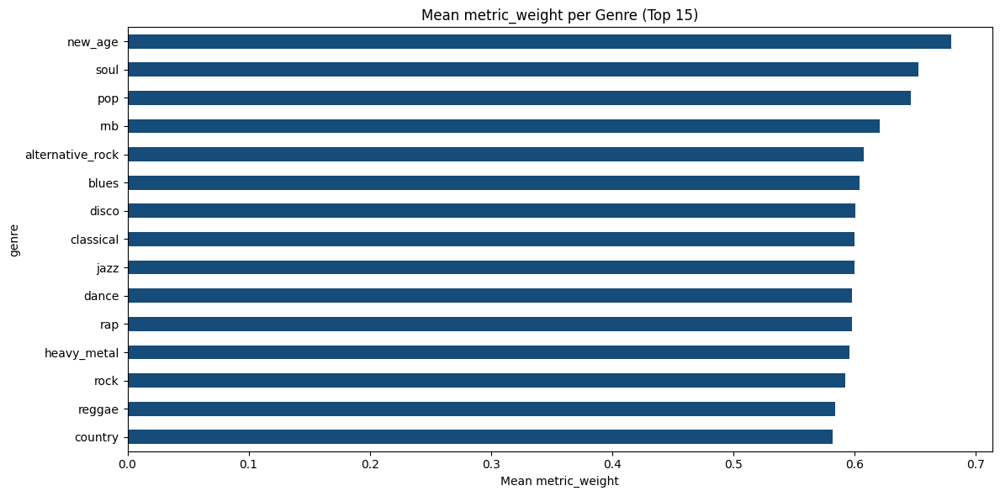


IS_CHORD_TONE by Genre (mean):


genre
heavy_metal         0.498814
classical           0.476491
new_age             0.453405
disco               0.448873
rnb                 0.424288
country             0.405200
alternative_rock    0.401492
soul                0.374504
jazz                0.365088
rock                0.359081
Name: is_chord_tone, dtype: float64

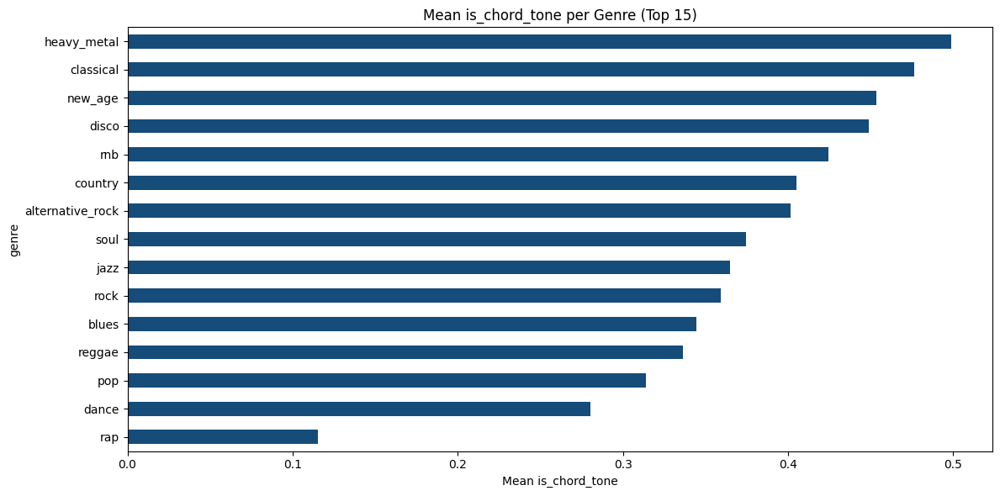

In [754]:
# Define the relevant expressive features you already have
expressive_features = ['velocity', 'articulation_ratio', 'metric_weight', 'is_chord_tone']

for feature in expressive_features:
    print(f"\n{feature.upper()} by Genre (mean):")
    display(df.groupby('genre')[feature].mean().sort_values(ascending=False).head(10))

    # Barplot of top 15 genres by feature
    plt.figure(figsize=(12, 6))
    df.groupby('genre')[feature].mean().sort_values(ascending=False).head(15).plot(kind='barh', color=colors[0])
    plt.title(f'Mean {feature} per Genre (Top 15)')
    plt.xlabel(f'Mean {feature}')
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()

##### 2.3.22.3 Feature Variability by Genre


VELOCITY by Genre (STD):


genre
rap                 50.609515
soul                50.312901
rnb                 49.706910
pop                 48.848048
alternative_rock    48.347635
disco               48.308267
dance               47.769043
country             47.678628
heavy_metal         47.143917
rock                46.016300
Name: velocity, dtype: float64

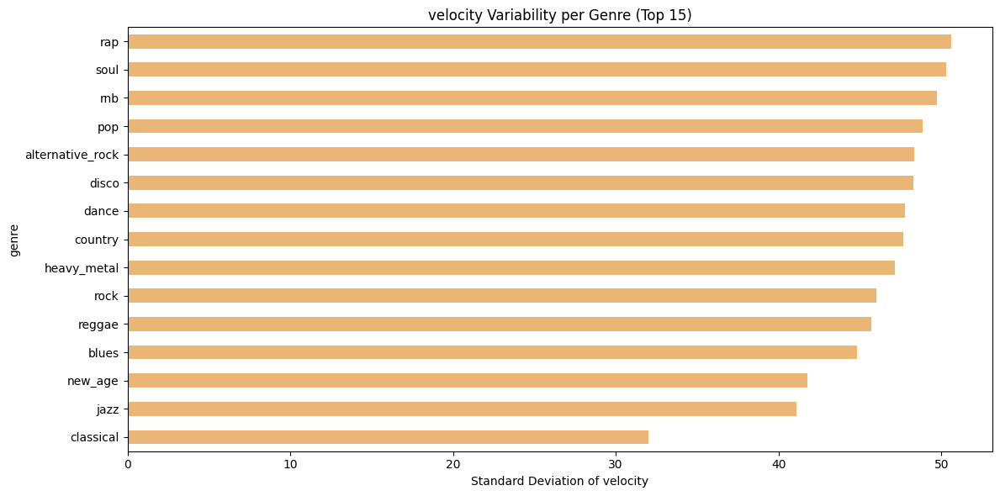


ARTICULATION_RATIO by Genre (STD):


genre
rnb                 0.380989
disco               0.255821
jazz                0.242945
heavy_metal         0.187360
rock                0.108748
country             0.087840
alternative_rock    0.052720
pop                 0.050326
classical           0.043175
new_age             0.021110
Name: articulation_ratio, dtype: float64

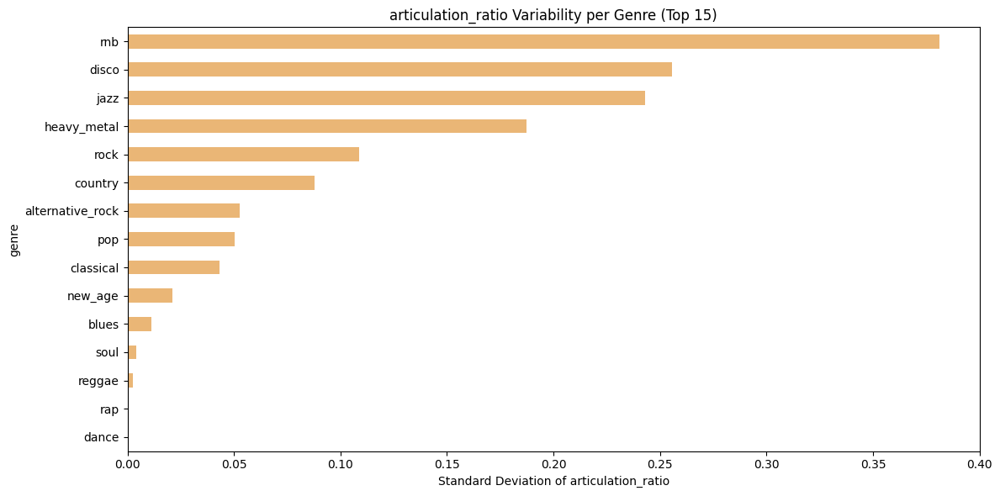


METRIC_WEIGHT by Genre (STD):


genre
soul                0.324314
pop                 0.318188
disco               0.317117
jazz                0.315661
heavy_metal         0.315434
alternative_rock    0.314871
rnb                 0.314618
dance               0.313813
country             0.310339
new_age             0.310194
Name: metric_weight, dtype: float64

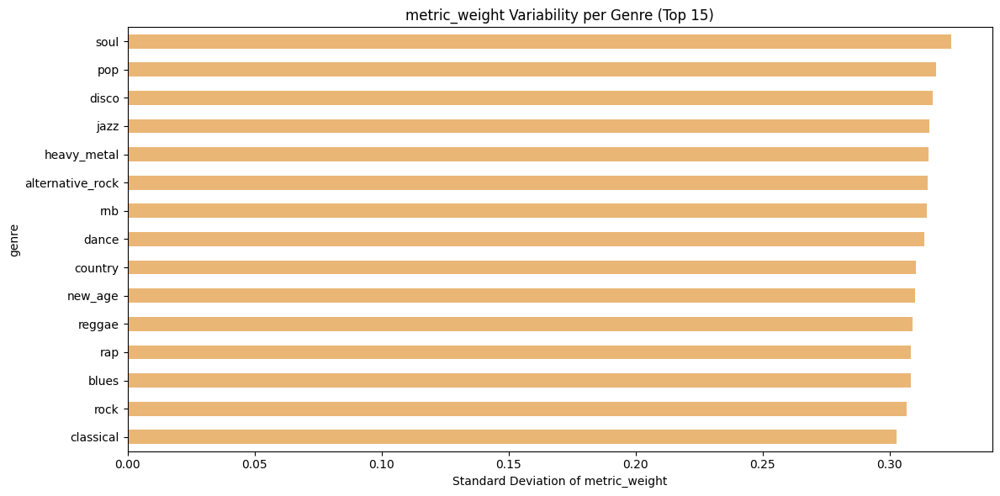


IS_CHORD_TONE by Genre (STD):


genre
heavy_metal         0.500005
classical           0.499454
new_age             0.497830
disco               0.497384
rnb                 0.494241
country             0.490935
alternative_rock    0.490209
soul                0.484000
jazz                0.481462
rock                0.479736
Name: is_chord_tone, dtype: float64

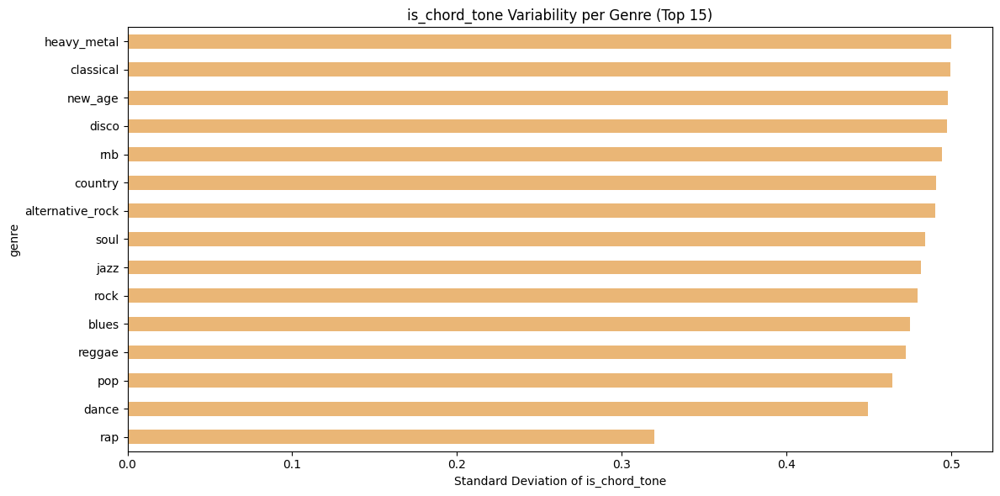

In [755]:
for feature in expressive_features:
    print(f"\n{feature.upper()} by Genre (STD):")
    display(df.groupby('genre')[feature].std().sort_values(ascending=False).head(10))

    plt.figure(figsize=(12, 6))
    df.groupby('genre')[feature].std().sort_values(ascending=False).head(15).plot(kind='barh', color=colors[1])
    plt.title(f'{feature} Variability per Genre (Top 15)')
    plt.xlabel(f'Standard Deviation of {feature}')
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()


##### 2.3.22.4 Rhythmic Placement by Genre


BEAT_POSITION by Genre (mean):


genre
new_age             2.240151
pop                 2.412217
soul                2.449855
rnb                 2.538328
alternative_rock    2.589470
blues               2.607246
heavy_metal         2.620067
rap                 2.650797
classical           2.661293
dance               2.666846
Name: beat_position, dtype: float64

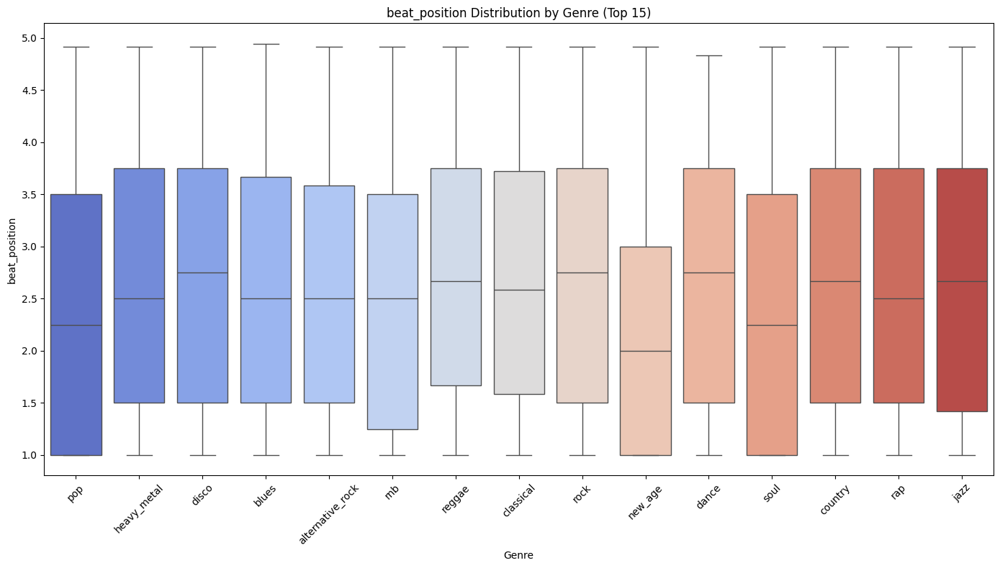


BEAT_FRACTION by Genre (mean):


genre
new_age             0.586777
pop                 0.629785
rnb                 0.634582
alternative_rock    0.647367
heavy_metal         0.655017
rap                 0.662699
dance               0.666711
jazz                0.666818
country             0.671603
disco               0.677013
Name: beat_fraction, dtype: float64

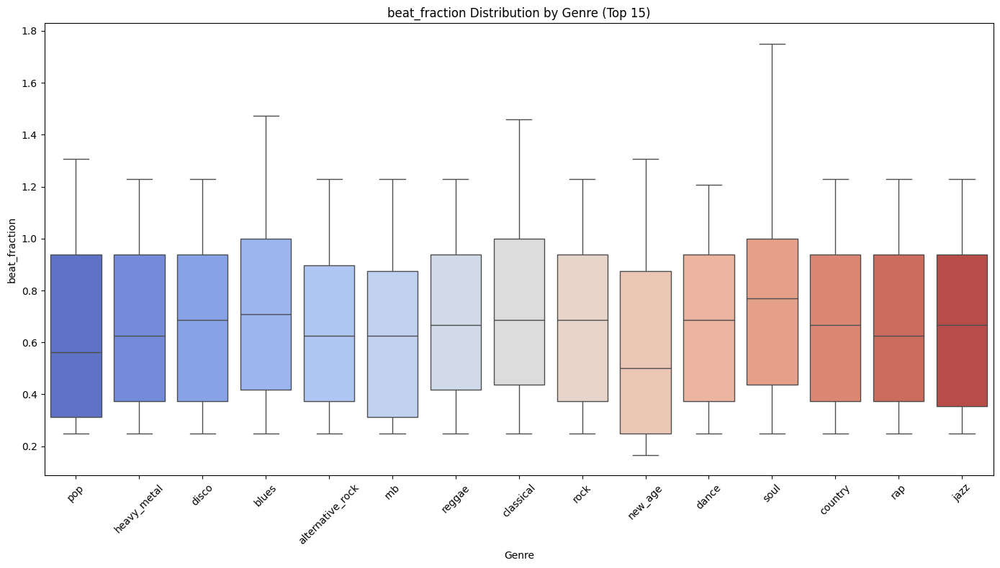

In [756]:
# Variables related to rhythmic placement
beat_features = ['beat_position', 'beat_fraction']

for feature in beat_features:
    print(f"\n{feature.upper()} by Genre (mean):")
    display(df.groupby('genre')[feature].mean().sort_values().head(10))

    # Boxplot of beat features across top genres
    plt.figure(figsize=(14, 8))
    top_genres = df['genre'].value_counts().head(15).index
    sns.boxplot(data=df[df['genre'].isin(top_genres)], x='genre', y=feature, palette='coolwarm')
    plt.xticks(rotation=45)
    plt.title(f'{feature} Distribution by Genre (Top 15)')
    plt.xlabel('Genre')
    plt.ylabel(feature)
    plt.tight_layout()
    plt.show()

##### 2.3.22.5 Heatmap of feature averages per genre

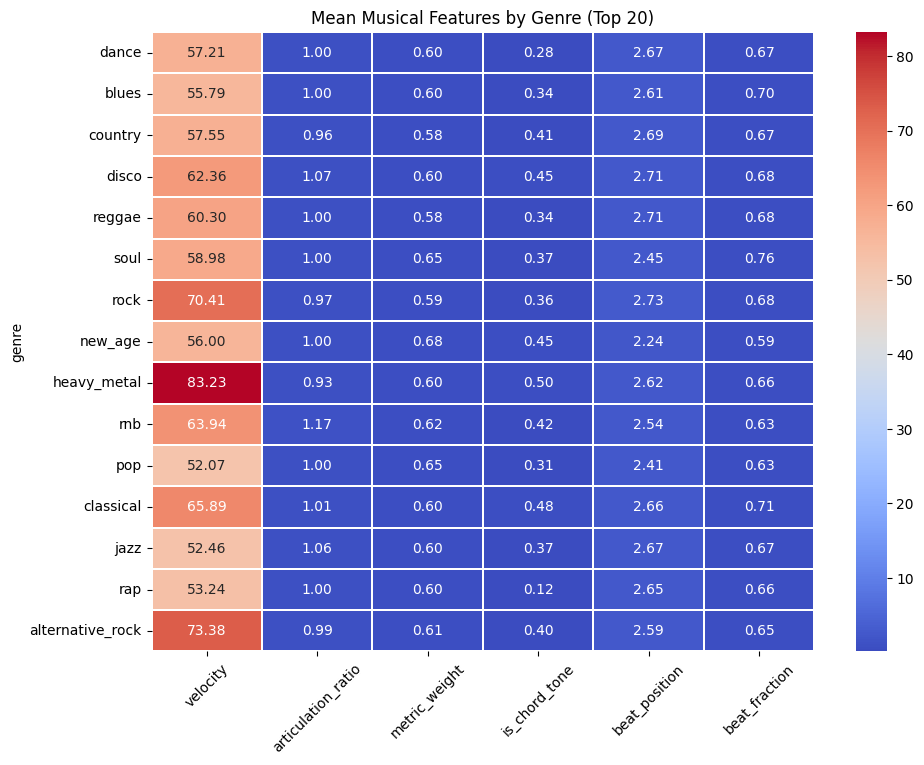

In [757]:
# Combine all relevant features for heatmap
heatmap_features = expressive_features + beat_features
genre_means = df.groupby('genre')[heatmap_features].mean()

# Use top 20 genres for clarity
top_genres = df['genre'].value_counts().head(20).index
plt.figure(figsize=(10, 8))
sns.heatmap(genre_means.loc[top_genres], annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.2, linecolor='white')
plt.title("Mean Musical Features by Genre (Top 20)")
plt.tight_layout()
plt.xticks(rotation=45)
plt.show()

##### 2.3.22.6 Temporal Distribution of Events by Genre

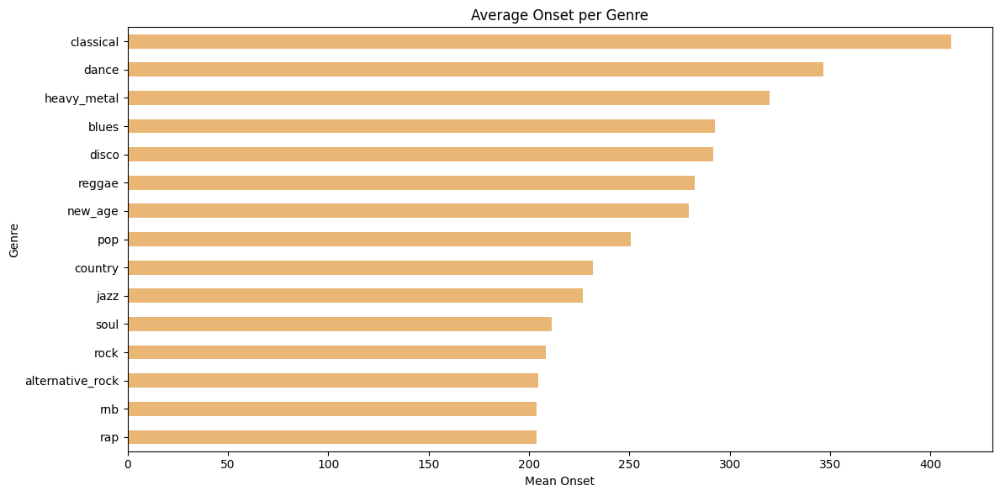

In [758]:
# Average onset per genre
onset_by_genre = df.groupby('genre')['onset'].mean().sort_values()
onset_by_genre.plot(kind='barh', figsize=(12, 6), color=colors[1])
plt.title("Average Onset per Genre")
plt.xlabel("Mean Onset")
plt.ylabel("Genre")
plt.tight_layout()
plt.show()

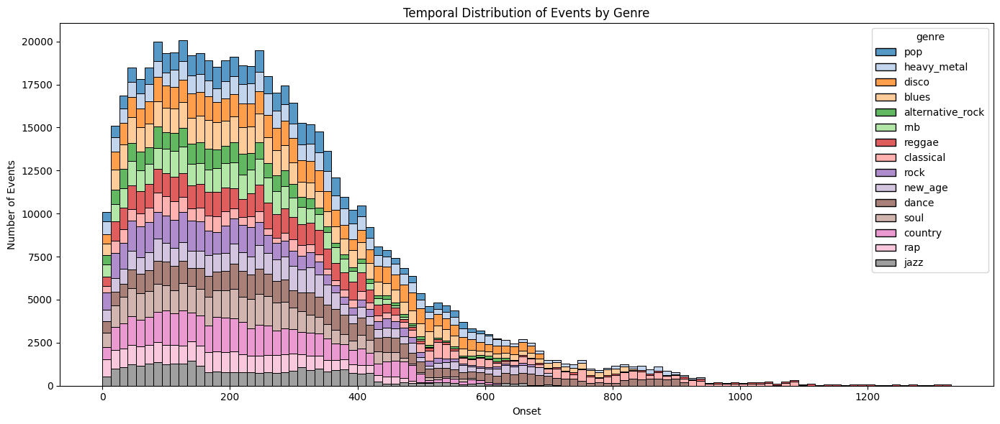

In [759]:
plt.figure(figsize=(14, 6))
sns.histplot(data=df, x='onset', hue='genre', multiple='stack', palette='tab20', bins=100)
plt.title('Temporal Distribution of Events by Genre')
plt.xlabel('Onset')
plt.ylabel('Number of Events')
plt.tight_layout()
plt.show()

##### Key Findings For The Genre Feature
The distribution of events across genres highlights strong stylistic contrasts, with dense styles like dance, blues, country, and disco generating many more events than sparse genres such as alternative rock, rap, and jazz. Ratios of events to notes provide further insight: rap and pop exceed 1.7, reflecting abundant non-note events (rests, articulations, effects), while classical, country, and rock fall below 1.4, emphasizing a purer note texture. Genre differences also emerge in related features: heavy metal and alternative rock show the highest velocity levels, RnB and disco stand out for over-articulation, and classical and heavy metal display the most harmonic density (~50% chord tones). Rhythmic placement distinguishes genres as well, with new age favoring downbeats and disco leaning toward anticipations and syncopations. Temporal patterns reveal further clustering: classical and dance have the longest trajectories, while rap, RnB, and alternative rock are shorter and more radio-oriented, and jazz/classical exhibit irregular decay curves versus the plateau structures of blues/disco. Together, these dimensions—density, articulation, harmony, rhythm, and temporal profiles—make genre one of the most discriminative features for topological classification.

---

In [760]:
df.keys()

Index(['onset', 'duration', 'polyphony_notes', 'polyphony_voices', 'key',
       'local_key', 'time_signature', 'other_time_signatures', 'tempo',
       'measure', 'beat_position', 'beat_fraction', 'metric_weight',
       'articulation_ratio', 'instrument', 'instrument_family', 'pitch',
       'pitch_class', 'pitch_octave', 'interval_to_prev', 'is_chord_tone',
       'velocity', 'is_rest', 'genre', 'filename', 'key_name',
       'subdivision_12', 'beat_type_detailed', 'temporal_section', 'key_mode',
       'nb_beats', 'rhythmic_division', 'ts_change', 'division_label',
       'articulation_pattern', 'tempo_adjusted', 'section'],
      dtype='object')

In [761]:
df['articulation_pattern'].unique()

['normal', 'legato', 'staccato']
Categories (3, object): ['staccato' < 'normal' < 'legato']

## 3. Feature Filtering

In [762]:
df = df.drop(columns=['key', 'temporal_section', 'rhythmic_division'], axis=1)

---

## 4. Export of Dataset

In [763]:
df.to_excel('datasets/processed_midi_data.xlsx', index=False)